# Temporal Fusion Transformer

Source: https://arxiv.org/pdf/1912.09363.pdf

@jhbale11

## Load libraries

In [17]:
import time
import gc
import glob
import os
import numpy as np
import pandas as pd
from datetime import datetime

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

from torch.utils.data import DataLoader, Dataset
import torch.optim as optim
from torch import nn
import torchvision
import torch

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
%matplotlib inline

## Basic Components

TFT의 구조는 아래와 같다.
- GLU와 GRN
- Variable Selection Network
- Multi-head Attention

![TFT](img/tft_architecture.png)

Source: https://arxiv.org/pdf/1912.09363.pdf

### Gated Linear Unit & Gated Residual Network

Gated Residual Network는 TFT의 주요 Layer 사이에서 효율적으로 정보의 흐름을 제어하는 역할을 한다.
Gating Mechanism을 통해 큰 데이터더라도 Depth와 Complexity를 조절하여 모델의 복잡성을 낮추는 역할을 한다.

![](https://img1.daumcdn.net/thumb/R1280x0/?scode=mtistory2&fname=https%3A%2F%2Fblog.kakaocdn.net%2Fdn%2FqVBcN%2Fbtq4OseiJBR%2FoRixgXaBXrhbUUMiei2cXk%2Fimg.png)


GRN의 수식은 위와 같다. 초기 입력 a와 Context Vector c를 받아 처리한다.
ELU는 Exponential Linear Unit Activation 함수를 의미하고, 에타 1과 2는 모두 중간 층에 해당하며, 오메가는 Weight Sharing의 Index를 의미한다. 즉, ELU는 입력이 0보다 클 때 Identity 함수를, O보다 작을 때 일정한 출력을 낸다. GLU를 사용하여 주어진 데이터셋에서 필요하지 않는 부분을 제거한다. GLU의 수식은 아래와 같다.

![](https://img1.daumcdn.net/thumb/R1280x0/?scode=mtistory2&fname=https%3A%2F%2Fblog.kakaocdn.net%2Fdn%2F8Lq0T%2Fbtq4MRMn08f%2F52Ge3TaoaDNwL7kSduL2d1%2Fimg.png)

시그모이드 Activation Function을 사용하며 연산은 Elementwise Hadamard Product를 사용한다. GLU를 통해 TFT에서 초기 입력 a의 비선형 기여도를 바꿀 수 있는데 GLU의 출력이 모두 0이라면 a의 비션형 기여도는 없는 것과 마찬가지로 고려되며, Context Vector 없이 GRN은 그 입력을 0으로 간주하게 된다.

**Gated Linear Unit**

GLU는 Prediction과 관련이 없는 부분을 통제하는 역할을 수행한다.

In [18]:
class GLU(nn.Module):
    """
    GLU 세부 설명
      The Gated Linear Unit GLU(a,b) = mult(a,sigmoid(b)) 은 NLP에서 흔히 쓰는 방법임
      
      Args:
          input_size (int): number defining input and output size of the gate
    """
    def __init__(self, input_size):
        super().__init__()
        
        # Input
        self.a = nn.Linear(input_size, input_size)

        # Gate
        self.sigmoid = nn.Sigmoid()
        self.b = nn.Linear(input_size, input_size)
        
    def forward(self, x):
        """
        Args:
            x (torch.tensor): tensor passing through the gate
        """
        gate = self.sigmoid(self.b(x))
        x = self.a(x)
        
        return torch.mul(gate, x)


**Temporal Layer**

In [19]:
class TemporalLayer(nn.Module):
    def __init__(self, module):
        super().__init__()
        """
        Temporal Layer 세부 설명
        T*N*H의 input 차원을 (T*N)*H의 꼴로 만들어 모델에 적용함.
        Variable Sequence Length와 Minibatch Size를 조절할 수 있게 함.
        
        Temporal Slice Input을 사용하는 모든 Layer에 적용할 수 있게 함.
        """
        self.module = module


    def forward(self, x):
        """
        Args:
            x (torch.tensor): tensor with time steps to pass through the same layer.
        """
        t, n = x.size(0), x.size(1)
        x = x.reshape(t * n, -1)
        x = self.module(x)
        x = x.reshape(t, n, x.size(-1))

        return x


**GRN(Gated Residual Network)**

In [20]:
class GatedResidualNetwork(nn.Module):
    """
      논문에 나와있는 GRN의 수식은 아래와 같음.
      
      GRN(a, c) = LayerNorm(a + GLU(eta_1)) # Dropout is applied to eta_1
        eta_1 = W_1*eta_2 + b_1
        eta_2 = ELU(W_2*a + W_3*c + b_2)
      
      Args:
          input_size (int): Size of the input
          hidden_size (int): Size of the hidden layer
          output_size (int): Size of the output layer
          dropout (float): Fraction between 0 and 1 corresponding to the degree of dropout used
          context_size (int): Size of the static context vector
          is_temporal (bool): Flag to decide if TemporalLayer has to be used or not
    """
    def __init__(self, input_size, hidden_size, output_size, dropout, context_size=None, is_temporal=True):
        super().__init__()

        self.input_size = input_size
        self.output_size = output_size
        self.context_size = context_size
        self.hidden_size = hidden_size
        self.dropout = dropout
        self.is_temporal = is_temporal
        
        if self.is_temporal:
            if self.input_size != self.output_size:
                self.skip_layer = TemporalLayer(nn.Linear(self.input_size, self.output_size))

            # Context vector c
            if self.context_size != None:
                self.c = TemporalLayer(nn.Linear(self.context_size, self.hidden_size, bias=False))

            # Dense & ELU
            self.dense1 = TemporalLayer(nn.Linear(self.input_size, self.hidden_size))
            self.elu = nn.ELU()

            # Dense & Dropout
            self.dense2 = TemporalLayer(nn.Linear(self.hidden_size,  self.output_size))
            self.dropout = nn.Dropout(self.dropout)

            # Gate, Add & Norm
            self.gate = TemporalLayer(GLU(self.output_size))
            self.layer_norm = TemporalLayer(nn.BatchNorm1d(self.output_size))

        else:
            if self.input_size != self.output_size:
                self.skip_layer = nn.Linear(self.input_size, self.output_size)

            # Context vector c
            if self.context_size != None:
                self.c = nn.Linear(self.context_size, self.hidden_size, bias=False)

            # Dense & ELU
            self.dense1 = nn.Linear(self.input_size, self.hidden_size)
            self.elu = nn.ELU()

            # Dense & Dropout
            self.dense2 = nn.Linear(self.hidden_size,  self.output_size)
            self.dropout = nn.Dropout(self.dropout)

            # Gate, Add & Norm
            self.gate = GLU(self.output_size)
            self.layer_norm = nn.BatchNorm1d(self.output_size)


    def forward(self, x, c=None):
        """
        Args:
            x (torch.tensor): tensor thas passes through the GRN
            c (torch.tensor): Optional static context vector
        """

        if self.input_size!=self.output_size:
            a = self.skip_layer(x)
        else:
            a = x
        
        x = self.dense1(x)

        if c != None:
            c = self.c(c.unsqueeze(1))
            x += c

        eta_2 = self.elu(x)
        
        eta_1 = self.dense2(eta_2)
        eta_1 = self.dropout(eta_1)

        gate = self.gate(eta_1)
        gate += a
        x = self.layer_norm(gate)
        
        return x

### Variable Selection Network

Observed Input은 Time Dependent Variables로 우리가 예측하고자 하는 Target Variable을 의미한다. TFT 모델을 통해 예측하고자 하는 값은 시간에 따라 값이 변하는 Observable Value 여야 한다.

**Known Input은 Time Dependent Variable**이지만 미래의 값을 알 수 있는 값을 의미한다. 논문에서는 Holidays, Special Events 등을 예시로 든다.
**Static Covariates**는 정적 공변량으로 시간에 따라 변화하지 않는 값을 의미한다. TFT 모델에 꼭 필요하지는 않으나, 예측을 풍부하게 하는 역할을 한다. 논문에서는 Sales 예측에서 Region of Store을 예시로 들었다.
**Variable Selection Network**는 어떤 변수가 예측에 중요한지 선택하는 역할을 하며, 모델의 Interpretability에 중추적인 역할을 한다.

**Variable Selection Network의 전반적인 과정 및 역할**은 아래와 같다.
1) Instance-Wise Variable Selection 제공

2) Significant Variable과 Unnecessary Variables 구분

3) Categorical Input을 D-Dimensional Vector로 Embedding

4) Continous Variables를 D-Dimensional Vector로 Linear Transformation

5) Skip Connections에 쓰일 수 있게 Dimenstion 맞춰줄 것

즉 TFT는 Static Covariate와 Time Dependent Covariate 모두에 대해 Instance Wise 변수 선택을 통해 예측에 직결되는 성분들을 골라내고, 예측에 불필요한 성분들을 줄일 수 있다. 대부분의 실제 시계열 데이터셋에는 예측과 관련이 없는 값들이 많으므로 변수 선택은 모델의 성능 향상에 큰 도움이 된다. 카테고리 변수들에 대해서는 객체 임베딩, 연속적인 변수들에 대해서는 Linear Transformation을 진행한다.

![](https://img1.daumcdn.net/thumb/R1280x0/?scode=mtistory2&fname=https%3A%2F%2Fblog.kakaocdn.net%2Fdn%2FcxxRPk%2Fbtq4Or0KU1Y%2FYwK8yra3OqW0PjqMc6DTNK%2Fimg.png)

변수를 선택하는 수식은 위와 같다.
- ξ : 각 시점에서의 변형된 입력
- Ξ : 모든 이전 시점 t에 대한 입력들의 Flatten Vector
- c : Static Covariate Encoder에서 얻어진 값

![](https://img1.daumcdn.net/thumb/R1280x0/?scode=mtistory2&fname=https%3A%2F%2Fblog.kakaocdn.net%2Fdn%2FZbbSP%2Fbtq4RFRL8JZ%2FyHSeSUBkC4Cz4I39AXxKEk%2Fimg.png)
각 시점에서의 비선형 처리를 위해 GRN 층을 추가하며, 각자의 GRN에 ξ를 넣는다.

![](https://img1.daumcdn.net/thumb/R1280x0/?scode=mtistory2&fname=https%3A%2F%2Fblog.kakaocdn.net%2Fdn%2FblMFI8%2Fbtq4MT4I3QL%2FSdeXeexklQKaErRKFndPGK%2Fimg.png)
Varialbe Selection 변수와 변형된 입력에 대해 위와 같이 가중합을 구한다.

In [21]:
class VariableSelectionNetwork(nn.Module):
    """
    논문 원문
      'The Variable Selection Network gives the model the ability to remove
      unnecessary noisy inputs that could have a negative impact on performance.
      It also allows us to better understand which variables are most important
      for the prediction task.'

      수식은 아래와 같음.

      V_xt = Softmax(GRN_v(E_t, c_s)) 

      Args:
          input_size (int): Size of the input
          output_size (int): Size of the output layer
          hidden_size (int): Size of the hidden layer
          dropout (float): Fraction between 0 and 1 corresponding to the degree of dropout used
          context_size (int): Size of the static context vector
          is_temporal (bool): Flag to decide if TemporalLayer has to be used or not
    """
    def __init__(self, input_size, output_size, hidden_size, dropout, context_size=None, is_temporal=True):
        super().__init__()

        self.hidden_size = hidden_size
        self.input_size = input_size
        self.output_size = output_size
        self.dropout = dropout
        self.context_size = context_size
        self.is_temporal = is_temporal
       
        self.flattened_inputs = GatedResidualNetwork(self.output_size*self.input_size, 
                                                     self.hidden_size, self.output_size, 
                                                     self.dropout, self.context_size, 
                                                     self.is_temporal)
        
        self.transformed_inputs = nn.ModuleList(
            [GatedResidualNetwork(
                self.input_size, self.hidden_size, self.hidden_size, 
                self.dropout, self.context_size, self.is_temporal) for i in range(self.output_size)])

        self.softmax = nn.Softmax(dim=-1)


    def forward(self, embedding, context=None):
        """
        Args:
          embedding (torch.tensor): Entity embeddings for categorical variables and linear 
                     transformations for continuous variables.
          context (torch.tensor): The context is obtained from a static covariate encoder and
                   is naturally omitted for static variables as they already
                   have access to this
        """

        # Generation of variable selection weights
        sparse_weights = self.flattened_inputs(embedding, context)
        if self.is_temporal:
            sparse_weights = self.softmax(sparse_weights).unsqueeze(2)
        else:
            sparse_weights = self.softmax(sparse_weights).unsqueeze(1)

        # Additional non-linear processing for each feature vector
        transformed_embeddings = torch.stack(
            [self.transformed_inputs[i](embedding[
                Ellipsis, i*self.input_size:(i+1)*self.input_size]) for i in range(self.output_size)], axis=-1)

        # Processed features are weighted by their corresponding weights and combined
        combined = transformed_embeddings*sparse_weights
        combined = combined.sum(axis=-1)

        return combined, sparse_weights

### Interpretable Multi-Head Attention

Interpretable Multi-Head Attention은 기존 transformer 기반의 모델과 마찬가지로 Observed Time-Varying Input 즉 Target의 시간 별 중요도를 계산하는 Layer이다. transformer와 거의 비슷하지만 Explanability를 개선하기 위하여 수정된 부분이 있다.

Dot-Product는 두 벡터 간의 유사도를 구하는 매우 간단한 방법이며, 모델이 Input의 어떤 부분을 중요하게 고려해야 하는지 key와 query를 통해 제공하는 역할을 한다. 
Scaling Factor는 Softmax의 Gradient Vanishing 문제를 해결함으로써 dot product의 성능을 개선한다.

Multi-head Attention은 여러 key, query, value를 가지는 projection에 대해서 병렬적인 attention 계산을 가능하게 한다. 다양한 projection에 대한 attention 계산을 통해 single head attention으로는 놓칠 수 있는 요소를 averaging effect를 통해 찾아낼 수 있다.

In [22]:
class ScaledDotProductAttention(nn.Module):
    """
    Attention mechansim은 Key와 Query의 관계를 통해 Attention Score를 산정함.
    
    수식은 아래와 같음.
    
    Attention(Q,K,V) = A(Q,K)*V (A() is a normalization function.)

    A(Q,K) = Softmax(Q*K^T / sqrt(d_attention))
    
    d_attention의 루트 값으로 나누는 이유는 Attention Score가 너무 커져서 Gradient Vanishing 되는 것을 방지하기 위함.

    Args:
          dropout (float): Fraction between 0 and 1 corresponding to the degree of dropout used
    """
    def __init__(self, dropout=0.0):
        super().__init__()

        self.dropout = nn.Dropout(dropout)
        self.softmax = nn.Softmax(dim=2)
        

    def forward(self, query, key, value, mask=None):
        """
        Args:
          query (torch.tensor): 
          key (torch.tensor):
          value (torch.tensor): 
          mask (torch.tensor):
        """

        d_k = key.shape[-1]
        scaling_factor = torch.sqrt(torch.tensor(d_k).to(torch.float32))

        scaled_dot_product = torch.matmul(query, key.permute(0,2,1)) / scaling_factor 
        if mask != None:
            scaled_dot_product = scaled_dot_product.masked_fill(mask == 0, -1e9)
        attention = self.softmax(scaled_dot_product)
        attention = self.dropout(attention)
        output = torch.matmul(attention, value)

        return output, attention

In [23]:
class InterpretableMultiHeadAttention(nn.Module):
    """
    From Pytorch Forecasting : https://pytorch-forecasting.readthedocs.io/en/latest/tutorials/building.html?highlight=optimizer
    Different attention heads can be used to improve the learning capacity of 
    the model. 

    MultiHead(Q,K,V) = [H_1, ..., H_m]*W_H
    H_h = Attention(Q*Wh_Q, K*Wh_K, V*Wh_V)

    Each head has specific weights for keys, queries and values. W_H linearly
    combines the concatenated outputs from all heads.

    To increase interpretability, multi-head attention has been modified to share
    values in each head.

    InterpretableMultiHead(Q,K,V) = H_I*W_H
    H_I = 1/H * SUM(Attention(Q*Wh_Q, K*Wh_K, V*W_V)) # Note that W_V does not depend on the head. 

    Args:
          num_heads (int): Number of attention heads
          hidden_size (int): Hidden size of the model
          dropout (float): Fraction between 0 and 1 corresponding to the degree of dropout used
    """
    def __init__(self, num_attention_heads, hidden_size, dropout=0.0):
        super().__init__()

        self.num_attention_heads = num_attention_heads
        self.hidden_size = hidden_size
        self.dropout = nn.Dropout(dropout)

        self.qs = nn.ModuleList([nn.Linear(self.hidden_size, self.hidden_size, bias=False) for i in range(self.num_attention_heads)])
        self.ks = nn.ModuleList([nn.Linear(self.hidden_size, self.hidden_size, bias=False) for i in range(self.num_attention_heads)])

        vs_layer = nn.Linear(self.hidden_size, self.hidden_size, bias=False) # Value is shared for improved interpretability
        self.vs = nn.ModuleList([vs_layer for i in range(self.num_attention_heads)])

        self.attention = ScaledDotProductAttention()
        self.linear = nn.Linear(self.hidden_size, self.hidden_size, bias=False)


    def forward(self, query, key, value, mask=None):
        
        batch_size, tgt_len, embed_dim = query.shape
        head_dim = embed_dim // self.num_attention_heads

        # Now we iterate over each head to calculate outputs and attention
        heads = []
        attentions = []

        for i in range(self.num_attention_heads):
            q_i = self.qs[i](query)
            k_i = self.ks[i](key)
            v_i = self.vs[i](value)

            # Reshape q, k, v for multihead attention
            q_i = query.reshape(batch_size, tgt_len, self.num_attention_heads, head_dim).transpose(1,2).reshape(batch_size*self.num_attention_heads, tgt_len, head_dim)
            k_i = key.reshape(batch_size, tgt_len, self.num_attention_heads, head_dim).transpose(1,2).reshape(batch_size*self.num_attention_heads, tgt_len, head_dim)
            v_i = value.reshape(batch_size, tgt_len, self.num_attention_heads, head_dim).transpose(1,2).reshape(batch_size*self.num_attention_heads, tgt_len, head_dim)

            head, attention = self.attention(q_i, k_i, v_i, mask)

            # Revert to original target shape
            head = head.reshape(batch_size, self.num_attention_heads, tgt_len, head_dim).transpose(1,2).reshape(-1, tgt_len, self.num_attention_heads*head_dim)
            head_dropout = self.dropout(head)
            heads.append(head_dropout)
            attentions.append(attention)

        # Output the results
        if self.num_attention_heads > 1:
            heads = torch.stack(heads, dim=2) #.reshape(batch_size, tgt_len, -1, self.hidden_size)
            outputs = torch.mean(heads, dim=2)
        else:
            outputs = head

        attentions = torch.stack(attentions, dim=2)
        attention = torch.mean(attentions, dim=2)
        
        outputs = self.linear(outputs)
        outputs = self.dropout(outputs)

        return outputs, attention


### Quantile Loss


In [24]:
class QuantileLoss(nn.Module):
    """
    Implementation source: https://medium.com/the-artificial-impostor/quantile-regression-part-2-6fdbc26b2629

    Args:
          quantiles (list): List of quantiles that will be used for prediction
    """

    def __init__(self, quantiles):
        super().__init__()
        self.quantiles = quantiles
        
    def forward(self, preds, target):
        """
        Args:
              preds (torch.tensor): Model predictions
              target (torch.tensor): Target data
        """
        assert not target.requires_grad
        assert preds.size(0) == target.size(0)

        losses = []
        for i, q in enumerate(self.quantiles):
            errors = target - preds[:, i]
            losses.append(torch.max((q-1) * errors, q * errors).unsqueeze(1))
        
        loss = torch.mean(torch.sum(torch.cat(losses, dim=1), dim=1))

        return loss

## Temporal Fusion Transformer Architecture

Static Covariate Encoder 구현 부분에서 Static Metadata의 Representation이 다소 복잡하다.

**def** define_static_covariate_encoders(self, x):

- **static_context_s** : Context for temporal variable selection
- **static_context_e** : Context for static enrichment layer
- **static_context_h** : Context for local processing of temporal features (encoder/decoder)
- **static_context_c** : Context for local processing of temporal features (encoder/decoder)

TFT의 핵심 아이디어가 정적인 메타데이터의 정보를 통합하여 예측을 진행하는 것인 바, 각각의 정보들에 대해 개별적인 GRN Encoder를 구현하여 위와 같은 4가지 서로 다른 Context Vector를 만들어 곳곳에 사용한다.
![](https://img1.daumcdn.net/thumb/R1280x0/?scode=mtistory2&fname=https%3A%2F%2Fblog.kakaocdn.net%2Fdn%2FHJ4xm%2Fbtq4REZDghF%2FjReRjSkxkTUGnNU6QmGbFk%2Fimg.png)
각각의 Context Vector는 위의 수식처럼 Variable Selection Network를 통해 나온 Static Encoder에 GRN을 적용하여 구할 수 있다.

In [25]:

class TemporalFusionTransformer(nn.Module):
    """Creates a Temporal Fusion Transformer model.

    For simplicity, arguments are passed within a parameters dictionary

    Args:
        col_to_idx (dict): Maps column names to their index in input array
        static_covariates (list): Names of static covariate variables
        time_dependent_categorical (list): Names of time dependent categorical variables
        time_dependent_continuous (list): Names of time dependent continuous variables
        category_counts (dict): Maps column names to the number of categories of each categorical feature
        known_time_dependent (list): Names of known time dependent variables 
        observed_time_dependent (list): Names of observed time dependent variables
        batch_size (int): Batch size
        encoder_steps (int): Fixed k time steps to look back for each prediction (also size of LSTM encoder)
        hidden_size (int): Internal state size of different layers 
        num_lstm_layers (int): Number of LSTM layers that should be used
        dropout (float): Fraction between 0 and 1 corresponding to the degree of dropout used
        embedding_dim (int): Dimensionality of embeddings
        num_attention_heads (int): Number of heads for interpretable mulit-head attention
        quantiles (list): Quantiles used for prediction. Also defines model output size
        device (str): Used to decide between CPU and GPU

    """
    def __init__(self, parameters):
        """Uses the given parameters to set up the Temporal Fusion Transformer model
           
        Args:
          parameters: Dictionary with parameters used to define the model.
        """
        super().__init__()

        # Inputs
        self.col_to_idx = parameters["col_to_idx"]
        self.static_covariates = parameters["static_covariates"]
        self.time_dependent_categorical = parameters["time_dependent_categorical"]
        self.time_dependent_continuous = parameters["time_dependent_continuous"]
        self.category_counts = parameters["category_counts"]
        self.known_time_dependent = parameters["known_time_dependent"]
        self.observed_time_dependent = parameters["observed_time_dependent"]
        self.time_dependent = self.known_time_dependent+self.observed_time_dependent

        # Architecture
        self.batch_size = parameters['batch_size']
        self.encoder_steps = parameters['encoder_steps']
        self.hidden_size = parameters['hidden_layer_size']
        self.num_lstm_layers = parameters['num_lstm_layers']
        self.dropout = parameters['dropout']
        self.embedding_dim = parameters['embedding_dim']
        self.num_attention_heads = parameters['num_attention_heads']

        # Outputs
        self.quantiles = parameters['quantiles']

        # Other
        self.device = parameters['device']
            
        
        # Prepare for input transformation (embeddings for categorical variables and linear transformations for continuous variables)

        # Prepare embeddings for the static covariates and static context vectors
        self.static_embeddings = nn.ModuleDict({col: nn.Embedding(self.category_counts[col], self.embedding_dim).to(self.device) for col in self.static_covariates}) 
        self.static_variable_selection = VariableSelectionNetwork(self.embedding_dim, len(self.static_covariates), self.hidden_size, self.dropout, is_temporal=False) 

        self.static_context_variable_selection = GatedResidualNetwork(self.hidden_size, self.hidden_size, self.hidden_size, self.dropout, is_temporal=False)
        self.static_context_enrichment = GatedResidualNetwork(self.hidden_size, self.hidden_size, self.hidden_size, self.dropout, is_temporal=False)
        self.static_context_state_h = GatedResidualNetwork(self.hidden_size, self.hidden_size, self.hidden_size, self.dropout, is_temporal=False)
        self.static_context_state_c = GatedResidualNetwork(self.hidden_size, self.hidden_size, self.hidden_size, self.dropout, is_temporal=False)
        
        # Prepare embeddings and linear transformations for time dependent variables
        self.temporal_cat_embeddings = nn.ModuleDict({col: TemporalLayer(nn.Embedding(self.category_counts[col], self.embedding_dim)).to(self.device) for col in self.time_dependent_categorical})
        self.temporal_real_transformations = nn.ModuleDict({col: TemporalLayer(nn.Linear(1, self.embedding_dim)).to(self.device) for col in self.time_dependent_continuous})

        # Variable selection and encoder for past inputs
        self.past_variable_selection = VariableSelectionNetwork(self.embedding_dim, len(self.time_dependent), self.hidden_size, self.dropout, context_size=self.hidden_size)

        # Variable selection and decoder for known future inputs
        self.future_variable_selection = VariableSelectionNetwork(self.embedding_dim, len([col for col in self.time_dependent if col not in self.observed_time_dependent]), 
                                                                  self.hidden_size, self.dropout, context_size=self.hidden_size)

        # LSTM encoder and decoder
        self.lstm_encoder = nn.LSTM(input_size=self.hidden_size, hidden_size=self.hidden_size, num_layers=self.num_lstm_layers, dropout=self.dropout)
        self.lstm_decoder = nn.LSTM(input_size=self.hidden_size, hidden_size=self.hidden_size, num_layers=self.num_lstm_layers, dropout=self.dropout)

        # Gated skip connection and normalization
        self.gated_skip_connection = TemporalLayer(GLU(self.hidden_size))
        self.add_norm = TemporalLayer(nn.BatchNorm1d(self.hidden_size))

        # Temporal Fusion Decoder

        # Static enrichment layer
        self.static_enrichment = GatedResidualNetwork(self.hidden_size, self.hidden_size, self.hidden_size, self.dropout, self.hidden_size)
        
        # Temporal Self-attention layer
        self.multihead_attn = InterpretableMultiHeadAttention(self.num_attention_heads, self.hidden_size)
        self.attention_gated_skip_connection = TemporalLayer(GLU(self.hidden_size))
        self.attention_add_norm = TemporalLayer(nn.BatchNorm1d(self.hidden_size, self.hidden_size))

        # Position-wise feed-forward layer
        self.position_wise_feed_forward = GatedResidualNetwork(self.hidden_size, self.hidden_size, self.hidden_size, self.dropout)

        # Output layer
        self.output_gated_skip_connection = TemporalLayer(GLU(self.hidden_size))
        self.output_add_norm = TemporalLayer(nn.BatchNorm1d(self.hidden_size, self.hidden_size))

        self.output = TemporalLayer(nn.Linear(self.hidden_size, len(self.quantiles)))
        
  

    def define_static_covariate_encoders(self, x):
        embedding_vectors = [self.static_embeddings[col](x[:, 0, self.col_to_idx[col]].long().to(self.device)) for col in self.static_covariates]
        static_embedding = torch.cat(embedding_vectors, dim=1)
        static_encoder, static_weights = self.static_variable_selection(static_embedding)

        # Static context vectors
        static_context_s = self.static_context_variable_selection(static_encoder) # Context for temporal variable selection
        static_context_e = self.static_context_enrichment(static_encoder) # Context for static enrichment layer
        static_context_h = self.static_context_state_h(static_encoder) # Context for local processing of temporal features (encoder/decoder)
        static_context_c = self.static_context_state_c(static_encoder) # Context for local processing of temporal features (encoder/decoder)

        return static_encoder, static_weights, static_context_s, static_context_e, static_context_h, static_context_c

    
    def define_past_inputs_encoder(self, x, context):
        embedding_vectors = torch.cat([self.temporal_cat_embeddings[col](x[:, :, self.col_to_idx[col]].long()) for col in self.time_dependent_categorical], dim=2)
        transformation_vectors = torch.cat([self.temporal_real_transformations[col](x[:, :, self.col_to_idx[col]]) for col in self.time_dependent_continuous], dim=2)

        past_inputs = torch.cat([embedding_vectors, transformation_vectors], dim=2)
        past_encoder, past_weights = self.past_variable_selection(past_inputs, context)

        return past_encoder.transpose(0, 1), past_weights


    def define_known_future_inputs_decoder(self, x, context):
        embedding_vectors = torch.cat([self.temporal_cat_embeddings[col](x[:, :, self.col_to_idx[col]].long()) for col in self.time_dependent_categorical if col not in self.observed_time_dependent], dim=2)
        
        transformation_vectors = torch.cat([self.temporal_real_transformations[col](x[:, :, self.col_to_idx[col]]) for col in self.time_dependent_continuous if col not in self.observed_time_dependent], dim=2)

        future_inputs = torch.cat([embedding_vectors, transformation_vectors], dim=2)
        future_decoder, future_weights = self.future_variable_selection(future_inputs, context)

        return future_decoder.transpose(0, 1), future_weights


    def define_lstm_encoder(self, x, static_context_h, static_context_c):
        output, (state_h, state_c) = self.lstm_encoder(x, (static_context_h.unsqueeze(0).repeat(self.num_lstm_layers,1,1), 
                                                           static_context_c.unsqueeze(0).repeat(self.num_lstm_layers,1,1)))
        
        return output, state_h, state_c


    def define_lstm_decoder(self, x, state_h, state_c):
        output, (_, _) = self.lstm_decoder(x, (state_h.unsqueeze(0).repeat(self.num_lstm_layers,1,1), 
                                               state_c.unsqueeze(0).repeat(self.num_lstm_layers,1,1)))
        
        return output

    
    def get_mask(self, attention_inputs):
        #mask = torch.cumsum(torch.eye(attention_inputs.shape[1]*self.num_attention_heads, attention_inputs.shape[0]), dim=1)
        mask = torch.cumsum(torch.eye(attention_inputs.shape[0]*self.num_attention_heads, attention_inputs.shape[1]), dim=1)

        return mask.unsqueeze(2).to(self.device)
    

    def forward(self, x):

        # Static variable selection and static covariate encoders
        static_encoder, static_weights, static_context_s, static_context_e, static_context_h, static_context_c = self.define_static_covariate_encoders(x["inputs"])

        # Past input variable selection and LSTM encoder
        past_encoder, past_weights = self.define_past_inputs_encoder(x["inputs"][:, :self.encoder_steps, :].float().to(self.device), static_context_s)

        # Known future inputs variable selection and LSTM decoder
        future_decoder, future_weights = self.define_known_future_inputs_decoder(x["inputs"][:, self.encoder_steps:, :].float().to(self.device), static_context_s)

        
        # Pass output from variable selection through LSTM encoder and decoder
        encoder_output, state_h, state_c = self.define_lstm_encoder(past_encoder, static_context_h, static_context_c)
        decoder_output = self.define_lstm_decoder(future_decoder, static_context_h, static_context_c)

        # Gated skip connection before moving into the Temporal Fusion Decoder
        variable_selection_outputs = torch.cat([past_encoder, future_decoder], dim=0)
        lstm_outputs = torch.cat([encoder_output, decoder_output], dim=0)
        gated_outputs = self.gated_skip_connection(lstm_outputs)
        temporal_feature_outputs = self.add_norm(variable_selection_outputs.add(gated_outputs))
        temporal_feature_outputs = temporal_feature_outputs.transpose(0, 1)

        # Temporal Fusion Decoder

        # Static enrcihment layer
        static_enrichment_outputs = self.static_enrichment(temporal_feature_outputs, static_context_e)

        # Temporal Self-attention layer
        mask = self.get_mask(static_enrichment_outputs)
        multihead_outputs, multihead_attention = self.multihead_attn(static_enrichment_outputs, static_enrichment_outputs, static_enrichment_outputs, mask=mask)
        
        attention_gated_outputs = self.attention_gated_skip_connection(multihead_outputs)
        attention_outputs = self.attention_add_norm(attention_gated_outputs.add(static_enrichment_outputs))

        # Position-wise feed-forward layer
        temporal_fusion_decoder_outputs = self.position_wise_feed_forward(attention_outputs)

        # Output layer
        gate_outputs = self.output_gated_skip_connection(temporal_fusion_decoder_outputs)
        norm_outputs = self.output_add_norm(gate_outputs.add(temporal_feature_outputs))

        output = self.output(norm_outputs[:, self.encoder_steps:, :]).view(-1,3)
        
        attention_weights = {
            'multihead_attention': multihead_attention,
            'static_weights': static_weights[Ellipsis, 0],
            'past_weights': past_weights[Ellipsis, 0, :],
            'future_weights': future_weights[Ellipsis, 0, :]
        }
        
        return  output, attention_weights

## Load data

### Dataset

In [26]:
class TFT_Dataset(Dataset):
    def __init__(self, data, entity_column, time_column, target_column, 
                 input_columns, encoder_steps, decoder_steps):
        """
          data (pd.DataFrame): dataframe containing raw data
          entity_column (str): name of column containing entity data
          time_column (str): name of column containing date data
          target_column (str): name of column we need to predict
          input_columns (list): list of string names of columns used as input
          encoder_steps (int): number of known past time steps used for forecast. Equivalent to size of LSTM encoder
          decoder_steps (int): number of input time steps used for each forecast date. Equivalent to the width N of the decoder
        """
        
        self.encoder_steps = encoder_steps
             
        inputs = []
        outputs = []
        entity = []
        time = []

        for e in train[entity_column].unique():
            entity_group = data[data[entity_column]==e]
          
            data_time_steps = len(entity_group)

            if data_time_steps >= decoder_steps:
                x = entity_group[input_columns].values.astype(np.float32)
                inputs.append(np.stack([x[i:data_time_steps - (decoder_steps - 1) + i, :] for i in range(decoder_steps)], axis=1))

                y = entity_group[[target_column]].values.astype(np.float32)
                outputs.append(np.stack([y[i:data_time_steps - (decoder_steps - 1) + i, :] for i in range(decoder_steps)], axis=1))

                e = entity_group[[entity_column]].values.astype(np.float32)
                entity.append(np.stack([e[i:data_time_steps - (decoder_steps - 1) + i, :] for i in range(decoder_steps)], axis=1))

                t = entity_group[[time_column]].values.astype(np.int64)
                time.append(np.stack([t[i:data_time_steps - (decoder_steps - 1) + i, :] for i in range(decoder_steps)], axis=1))

        self.inputs = np.concatenate(inputs, axis=0)
        self.outputs = np.concatenate(outputs, axis=0)[:, encoder_steps:, :]
        self.entity = np.concatenate(entity, axis=0)
        self.time = np.concatenate(time, axis=0)
        self.active_inputs = np.ones_like(outputs)

        self.sampled_data = {
            'inputs': self.inputs,
            'outputs': self.outputs[:, self.encoder_steps:, :],
            'active_entries': np.ones_like(self.outputs[:, self.encoder_steps:, :]),
            'time': self.time,
            'identifier': self.entity
        }
        
    def __getitem__(self, index):
        s = {
        'inputs': self.inputs[index],
        'outputs': self.outputs[index], 
        'active_entries': np.ones_like(self.outputs[index]), 
        'time': self.time[index],
        'identifier': self.entity[index]
        }

        return s

    def __len__(self):
        return self.inputs.shape[0]

### Data preprocessing

In [27]:
def fit_preprocessing(train, real_columns, categorical_columns):
    real_scalers = StandardScaler().fit(train[real_columns].values)

    categorical_scalers = {}
    num_classes = []
    for col in categorical_columns:
        srs = train[col].apply(str) 
        categorical_scalers[col] = LabelEncoder().fit(srs.values)
        num_classes.append(srs.nunique())

    return real_scalers, categorical_scalers


def transform_inputs(df, real_scalers, categorical_scalers, real_columns, categorical_columns):
    out = df.copy()
    out[real_columns] = real_scalers.transform(df[real_columns].values)

    for col in categorical_columns:
        string_df = df[col].apply(str)
        out[col] = categorical_scalers[col].transform(string_df)

    return out


# Paper Experiments

## Volatility data

In [28]:
raw_data = pd.read_csv('./data/formatted_omi_vol.csv', index_col=0)
raw_data["date"] = pd.to_datetime(raw_data["date"])

train = raw_data[raw_data['year'] < 2019]
#valid = raw_data.loc[(raw_data['year'] >= 2017) & (raw_data['year'] < 2020)]
test = raw_data.loc[(raw_data['year'] >= 2019) & (raw_data.index <= '2021-12-31')]

In [29]:
train.head()

,Symbol,open_to_close,rv5_ss,bv,rsv_ss,rsv,close_time,rk_twoscale,medrv,bv_ss,...,date,days_from_start,day_of_week,day_of_month,week_of_year,month,year,categorical_id,log_vol,Region
2000-01-03 00:00:00+00:00,.AEX,-0.000340,0.000130,0.000100,0.000046,0.000046,163015.0,0.000103,0.000050,0.000100,...,2000-01-03,0,0,3,1,1,2000,.AEX,-8.946668,EMEA
2000-01-04 00:00:00+00:00,.AEX,-0.033606,0.000201,0.000207,0.000147,0.000147,163016.0,0.000199,0.000075,0.000207,...,2000-01-04,1,1,4,1,1,2000,.AEX,-8.510686,EMEA
2000-01-05 00:00:00+00:00,.AEX,-0.001675,0.000491,0.000361,0.000328,0.000328,163016.0,0.000325,0.000166,0.000361,...,2000-01-05,2,2,5,1,1,2000,.AEX,-7.619135,EMEA
2000-01-06 00:00:00+00:00,.AEX,-0.013130,0.000225,0.000258,0.000116,0.000116,163002.0,0.000218,0.000152,0.000258,...,2000-01-06,3,3,6,1,1,2000,.AEX,-8.398790,EMEA
2000-01-07 00:00:00+00:00,.AEX,0.025013,0.000138,0.000130,0.000048,0.000048,163016.0,0.000126,0.000039,0.000130,...,2000-01-07,4,4,7,1,1,2000,.AEX,-8.885257,EMEA


In [30]:
test.date.min

<bound method NDFrame._add_numeric_operations.<locals>.min of 2019-01-02 00:00:00+00:00   2019-01-02
2019-01-03 00:00:00+00:00   2019-01-03
2019-01-04 00:00:00+00:00   2019-01-04
2019-01-07 00:00:00+00:00   2019-01-07
2019-01-08 00:00:00+00:00   2019-01-08
                               ...    
2021-12-24 00:00:00+00:00   2021-12-24
2021-12-27 00:00:00+00:00   2021-12-27
2021-12-28 00:00:00+00:00   2021-12-28
2021-12-29 00:00:00+00:00   2021-12-29
2021-12-30 00:00:00+00:00   2021-12-30
Name: date, Length: 23209, dtype: datetime64[ns]>

In [31]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 133157 entries, 2000-01-03 00:00:00+00:00 to 2018-12-31 00:00:00+00:00
Data columns (total 29 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   Symbol           133157 non-null  object        
 1   open_to_close    133157 non-null  float64       
 2   rv5_ss           133157 non-null  float64       
 3   bv               133157 non-null  float64       
 4   rsv_ss           133157 non-null  float64       
 5   rsv              133157 non-null  float64       
 6   close_time       133157 non-null  float64       
 7   rk_twoscale      133157 non-null  float64       
 8   medrv            133156 non-null  float64       
 9   bv_ss            133157 non-null  float64       
 10  close_price      133157 non-null  float64       
 11  rk_th2           133157 non-null  float64       
 12  rv10_ss          133157 non-null  float64       
 13  rv10             133157 non-null  fl

In [32]:
real_columns = ['log_vol', 'open_to_close', 'days_from_start']
categorical_columns = ['Symbol', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'Region']

real_scalers, categorical_scalers = fit_preprocessing(train, real_columns, categorical_columns)

train = transform_inputs(train, real_scalers, categorical_scalers, real_columns, categorical_columns)
#valid = transform_inputs(valid, real_scalers, categorical_scalers, real_columns, categorical_columns)
test = transform_inputs(test, real_scalers, categorical_scalers, real_columns, categorical_columns)

## Parameters Setting

In [33]:
# Global variables

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
BATCH_SIZE = 64
NUM_EPOCHS = 50
DROPOUT = 0.3
LEARNING_RATE = 0.001
ENCODER_STEPS = 252
LOOKAHEAD = 5
DECODER_STEPS = ENCODER_STEPS + LOOKAHEAD
HIDDEN_LAYER_SIZE = 160
EMBEDDING_DIMENSION = 8
NUM_LSTM_LAYERS = 1
NUM_ATTENTION_HEADS = 1
QUANTILES = [0.1, 0.5, 0.9]


# Dataset variables
input_columns = ["log_vol", "open_to_close", "days_from_start", "day_of_week", "day_of_month", "week_of_year", "month", "Region", "Symbol"]
target_column = "log_vol"
entity_column = "Symbol"
time_column = "date"
col_to_idx = {col: idx for idx, col in enumerate(input_columns)}


In [34]:
params = {
    "quantiles": QUANTILES,
    "batch_size": BATCH_SIZE,
    "dropout": DROPOUT,
    "device": DEVICE,
    "hidden_layer_size": HIDDEN_LAYER_SIZE,
    "num_lstm_layers": NUM_LSTM_LAYERS,
    "embedding_dim": EMBEDDING_DIMENSION,
    "encoder_steps": ENCODER_STEPS,
    "num_attention_heads": NUM_ATTENTION_HEADS,
    "col_to_idx": col_to_idx,
    "static_covariates": ["Region", "Symbol"],
    "time_dependent_categorical": ["day_of_week", "day_of_month", "week_of_year", "month"],
    "time_dependent_continuous": ['log_vol', 'days_from_start', "open_to_close",],
    "category_counts": {"day_of_week": 7, "day_of_month": 31, "week_of_year": 53, "month": 12, "Region": 4, "Symbol": 31},
    "known_time_dependent": ["day_of_week", "day_of_month", "week_of_year", "month", "days_from_start"],
    "observed_time_dependent": ["log_vol", "open_to_close"]
}

In [35]:
training_data = TFT_Dataset(train, entity_column, time_column, target_column, input_columns, ENCODER_STEPS, DECODER_STEPS)
#validation_data = TFT_Dataset(valid, entity_column, time_column, target_column, input_columns, ENCODER_STEPS, DECODER_STEPS)
testing_data = TFT_Dataset(test, entity_column, time_column, target_column, input_columns, ENCODER_STEPS, DECODER_STEPS)

train_dataloader = DataLoader(training_data, batch_size=BATCH_SIZE, num_workers=2, shuffle=False)
#valid_dataloader = DataLoader(validation_data, batch_size=BATCH_SIZE, num_workers=2, shuffle=False)
test_dataloader = DataLoader(testing_data, batch_size=BATCH_SIZE, num_workers=2, shuffle=False)

<__array_function__ internals>:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


## Load Model

In [36]:
model = TemporalFusionTransformer(params)

/home/junghwan/anaconda3/envs/pytorch1/lib/python3.8/site-packages/torch/nn/modules/rnn.py:62: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "


In [37]:
model.to(DEVICE)

TemporalFusionTransformer(
  (static_embeddings): ModuleDict(
    (Region): Embedding(4, 8)
    (Symbol): Embedding(31, 8)
  )
  (static_variable_selection): VariableSelectionNetwork(
    (flattened_inputs): GatedResidualNetwork(
      (skip_layer): Linear(in_features=16, out_features=2, bias=True)
      (dense1): Linear(in_features=16, out_features=160, bias=True)
      (elu): ELU(alpha=1.0)
      (dense2): Linear(in_features=160, out_features=2, bias=True)
      (dropout): Dropout(p=0.3, inplace=False)
      (gate): GLU(
        (a): Linear(in_features=2, out_features=2, bias=True)
        (sigmoid): Sigmoid()
        (b): Linear(in_features=2, out_features=2, bias=True)
      )
      (layer_norm): BatchNorm1d(2, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (transformed_inputs): ModuleList(
      (0): GatedResidualNetwork(
        (skip_layer): Linear(in_features=8, out_features=160, bias=True)
        (dense1): Linear(in_features=8, out_features=160, bia

## Training

In [40]:
import wandb

wandb.init(project="self-tft", entity="jhata")

wandb: Currently logged in as: jhata (use `wandb login --relogin` to force relogin)
wandb: wandb version 0.12.10 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


In [41]:
wandb.config = {
  "learning_rate": 0.001,
  "epochs": 50,
  "batch_size": 64
}

In [ ]:
criterion = QuantileLoss(QUANTILES)
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

print_every_k = 250
losses = []

for epoch in range(NUM_EPOCHS):
    t0 = time.time()
    print(f"===== Epoch {epoch+1} =========")
    epoch_loss = 0.0
    running_loss = 0.0

    for i, batch in enumerate(train_dataloader):
        labels = batch['outputs'][:,:,0].flatten().float().to(DEVICE)

        # Zero the parameter gradients
        optimizer.zero_grad()

        outputs, attention_weights = model(batch)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # Print statistics
        running_loss += loss.item()
        epoch_loss += loss.item()
        
        if (i+1) % print_every_k == 0:
            print(f"Mini-batch {i+1} average loss: {round(running_loss / print_every_k, 5)}")
            running_loss = 0.0
    
    t1 = time.time()
    wandb.log({"epoch loss": round(epoch_loss /(i+1), 5)})

    # Optional
    wandb.watch(model)
    
    print(f"\nEpoch trained for {round(t1-t0, 2)} seconds")
    print("\nEpoch loss:", round(epoch_loss / (i+1), 5), "\n")
    losses.append(epoch_loss / (i+1))
    

===== Epoch 1 =========
Mini-batch 250 average loss: 0.77766
Mini-batch 500 average loss: 0.75988
Mini-batch 750 average loss: 0.76437
Mini-batch 1000 average loss: 0.69035
Mini-batch 1250 average loss: 0.6678
Mini-batch 1500 average loss: 0.66061
Mini-batch 1750 average loss: 0.64317

Epoch trained for 171.03 seconds

Epoch loss: 0.68998 

===== Epoch 2 =========
Mini-batch 250 average loss: 0.53825
Mini-batch 500 average loss: 0.53312
Mini-batch 750 average loss: 0.53713
Mini-batch 1000 average loss: 0.46507
Mini-batch 1250 average loss: 0.54074
Mini-batch 1500 average loss: 0.48783
Mini-batch 1750 average loss: 0.52457

Epoch trained for 171.86 seconds

Epoch loss: 0.51421 

===== Epoch 3 =========
Mini-batch 250 average loss: 0.47973
Mini-batch 500 average loss: 0.48312
Mini-batch 750 average loss: 0.4905
Mini-batch 1000 average loss: 0.43041
Mini-batch 1250 average loss: 0.51345
Mini-batch 1500 average loss: 0.45386
Mini-batch 1750 average loss: 0.48601

Epoch trained for 171.63 s

In [1]:
plt.plot(losses)

NameError: name 'plt' is not defined

## Train_Dataloader Interpretation

Plotting interpreation plots for a batch of entity 0:


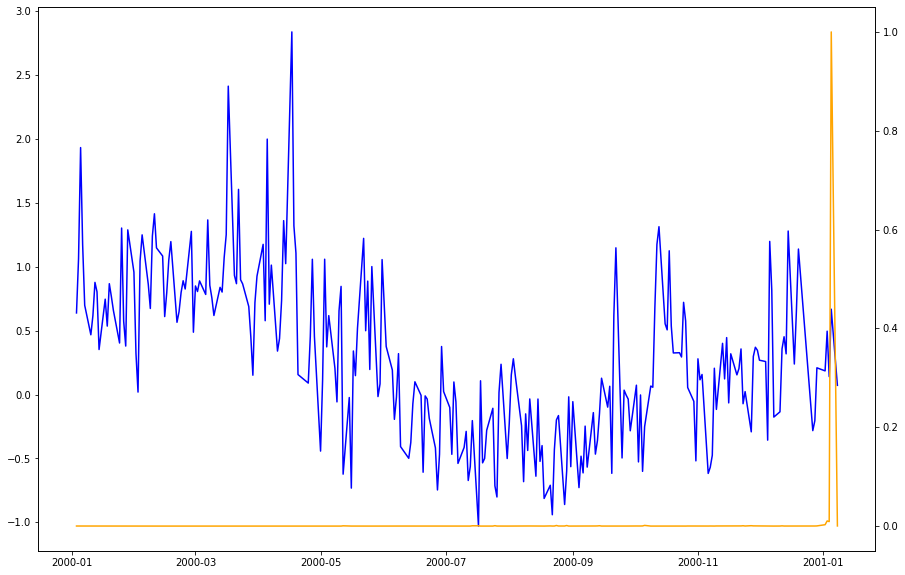

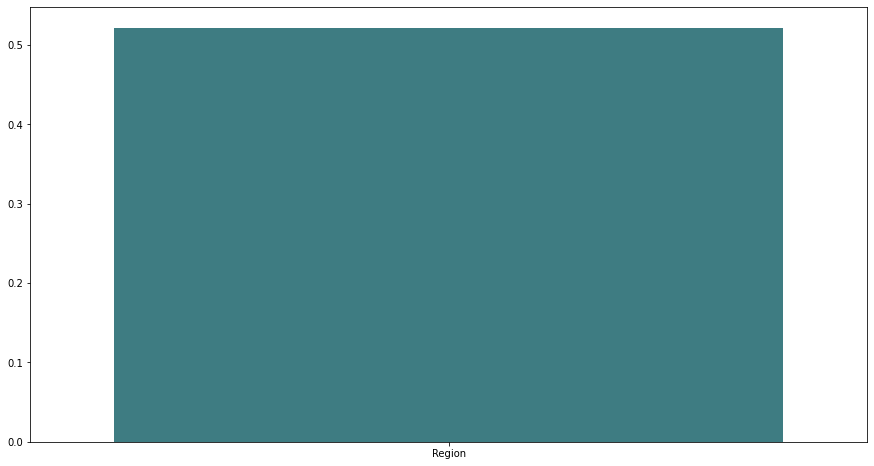

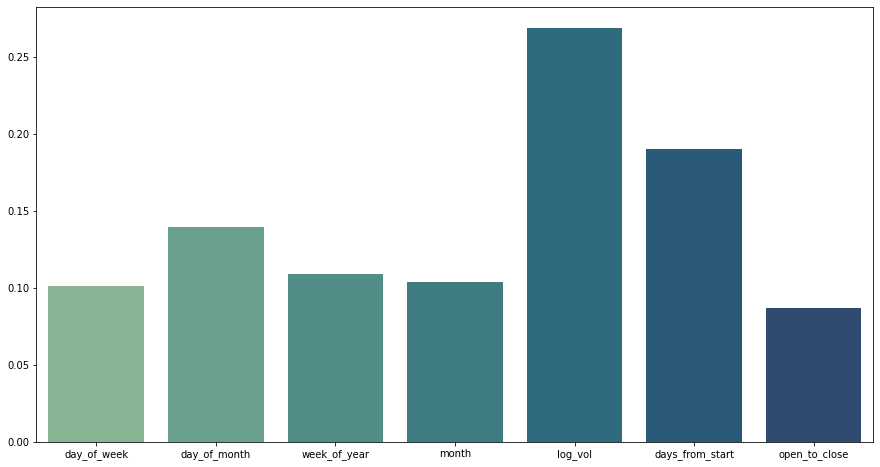

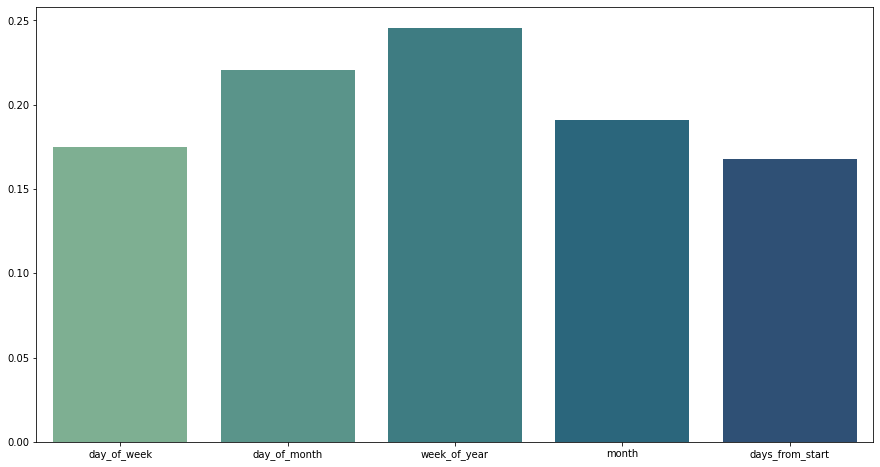


Plotting interpreation plots for a batch of entity 1:


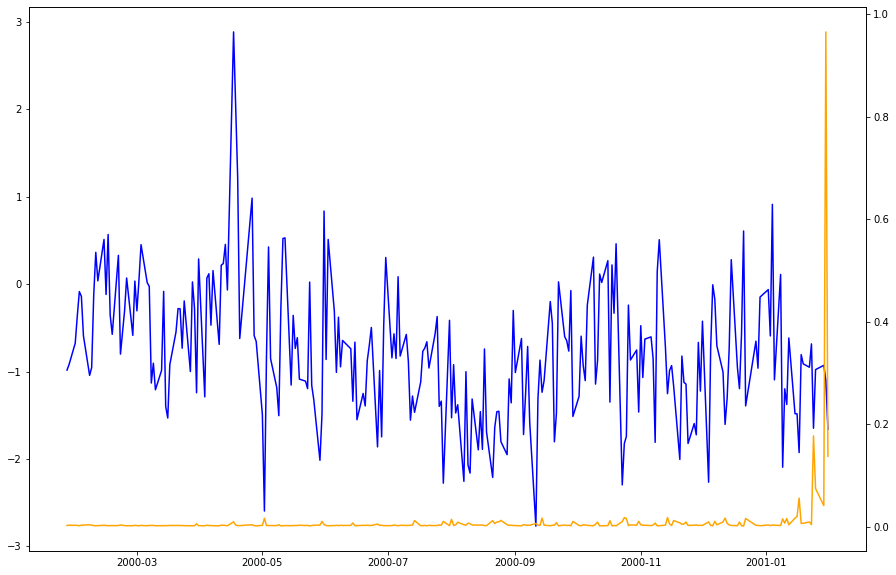

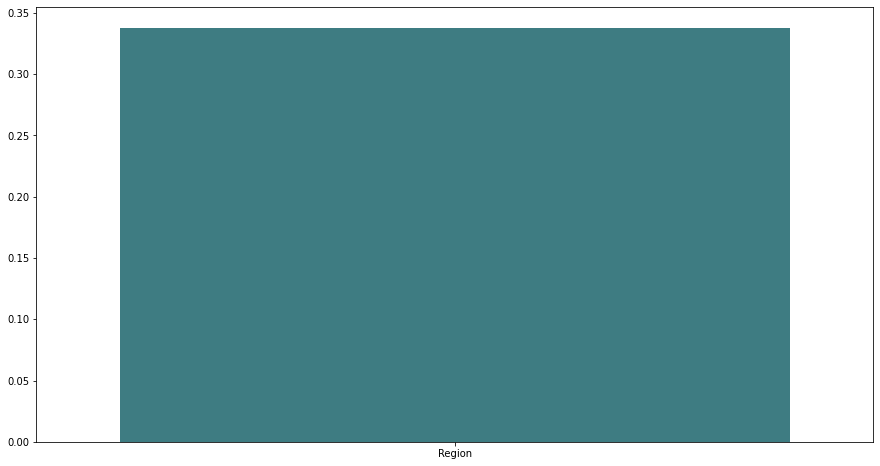

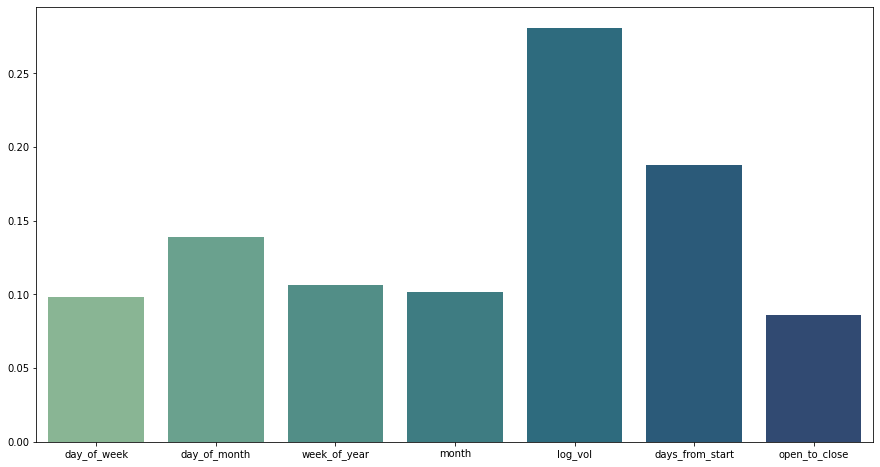

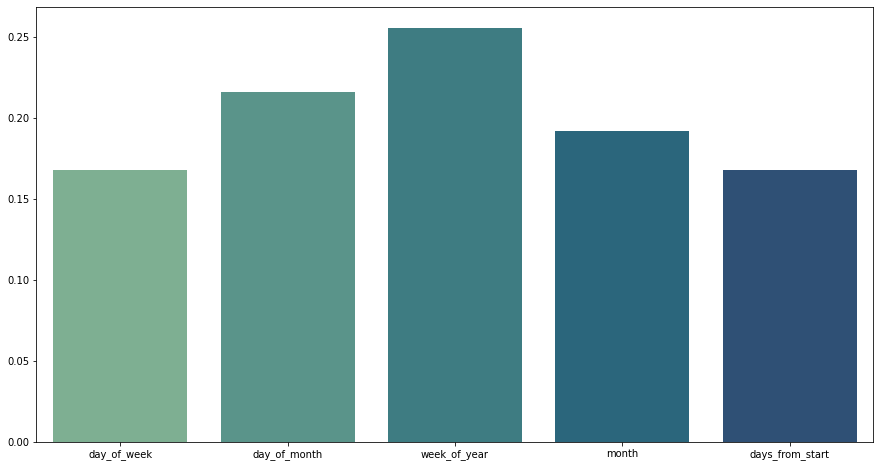


Plotting interpreation plots for a batch of entity 2:


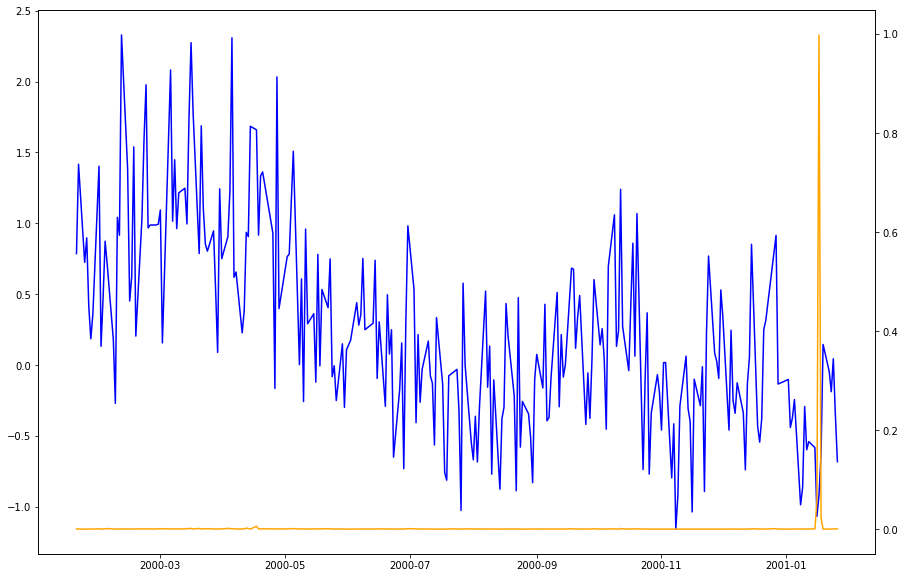

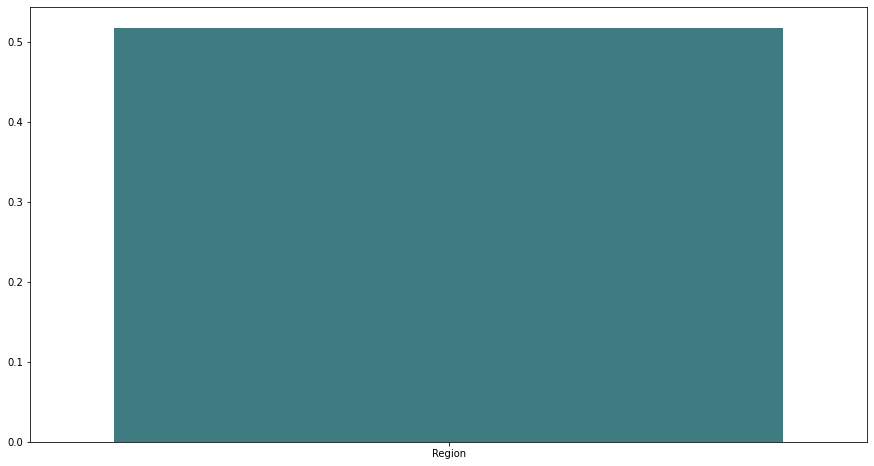

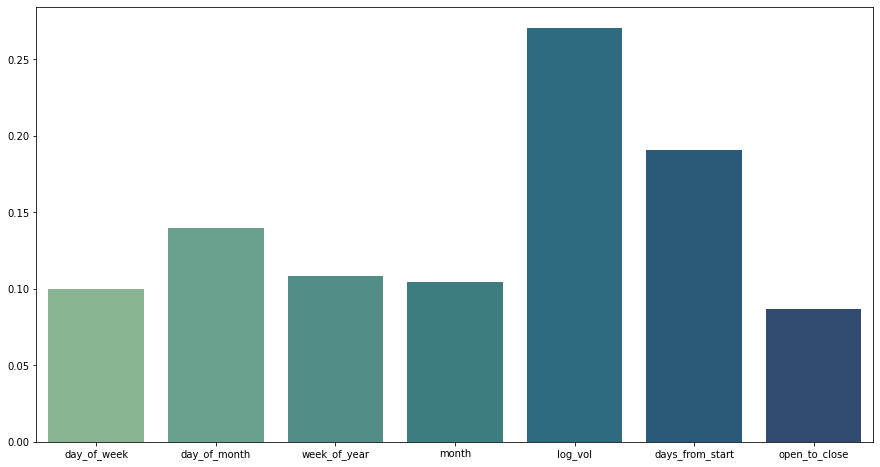

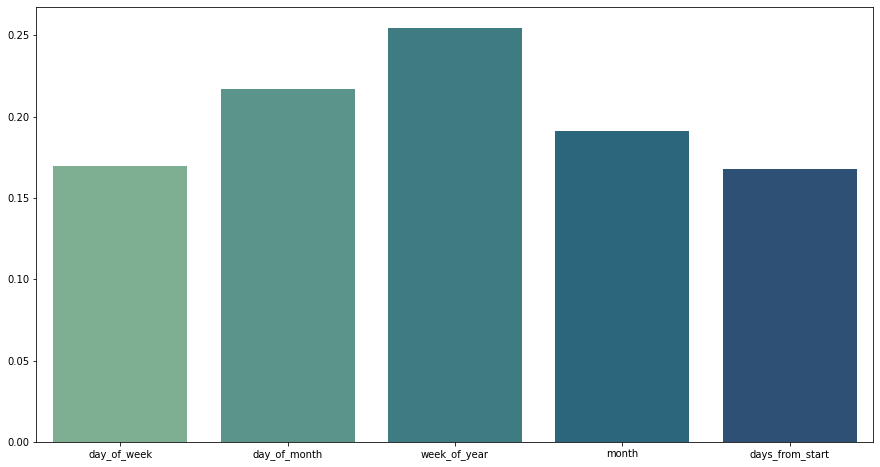


Plotting interpreation plots for a batch of entity 3:


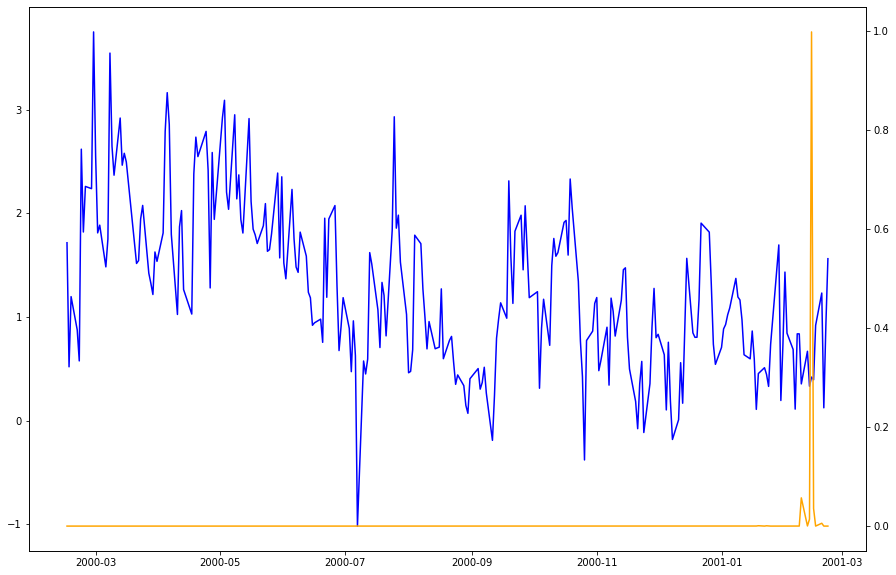

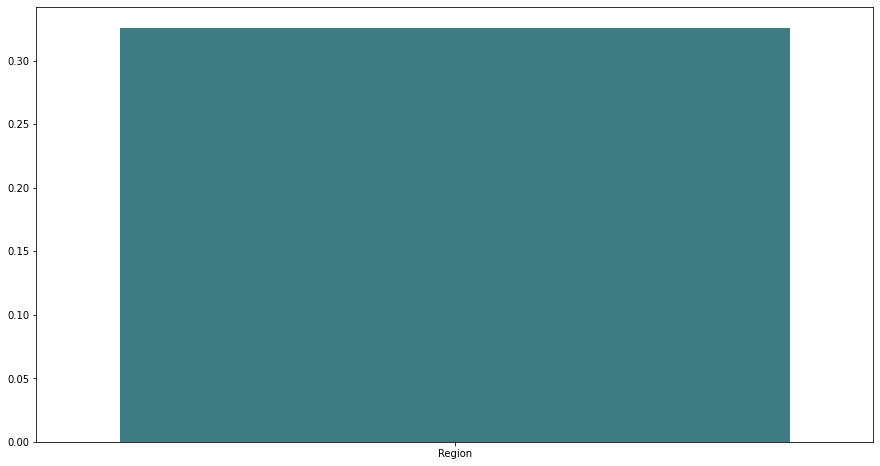

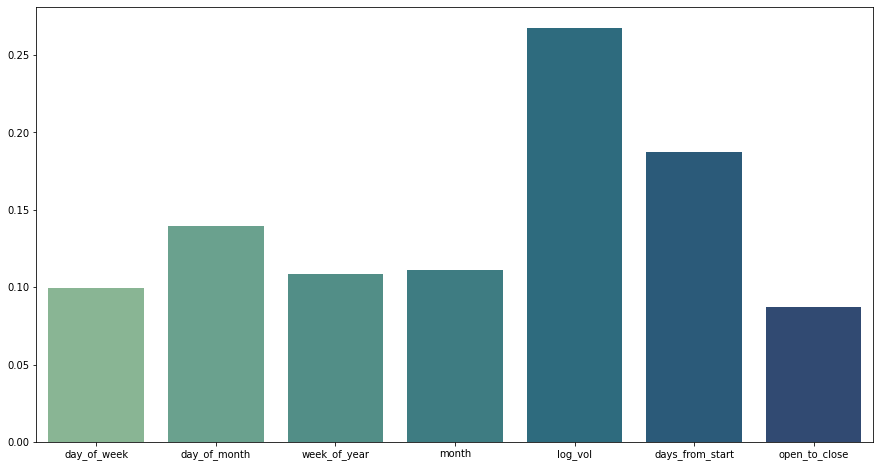

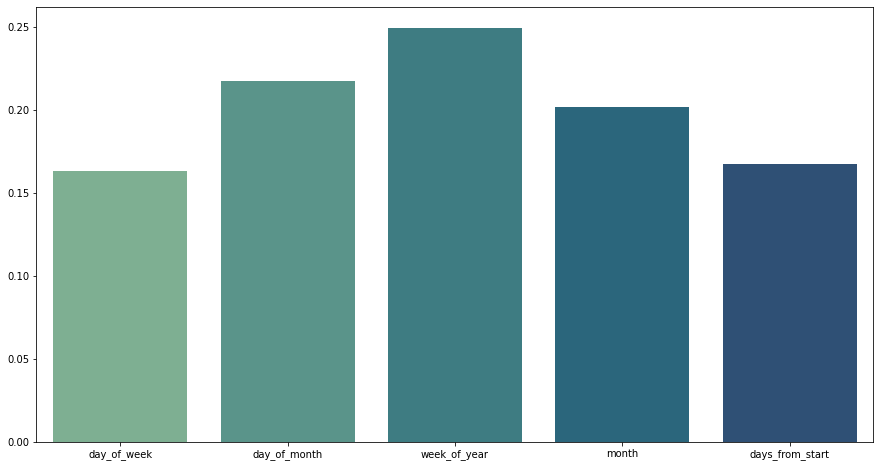


Plotting interpreation plots for a batch of entity 4:


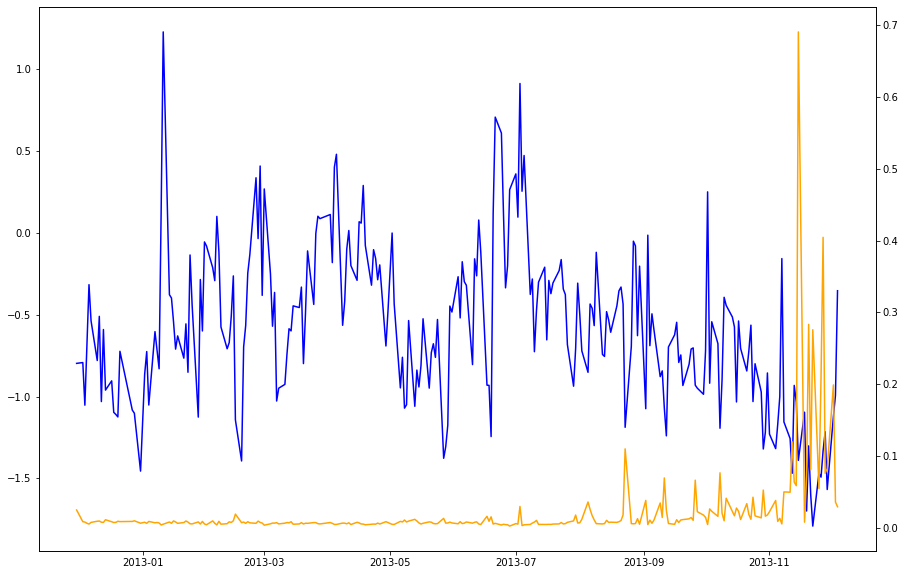

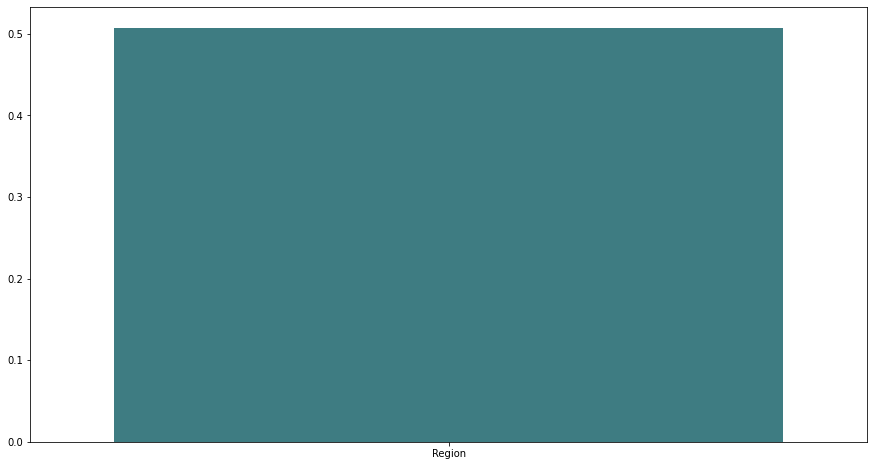

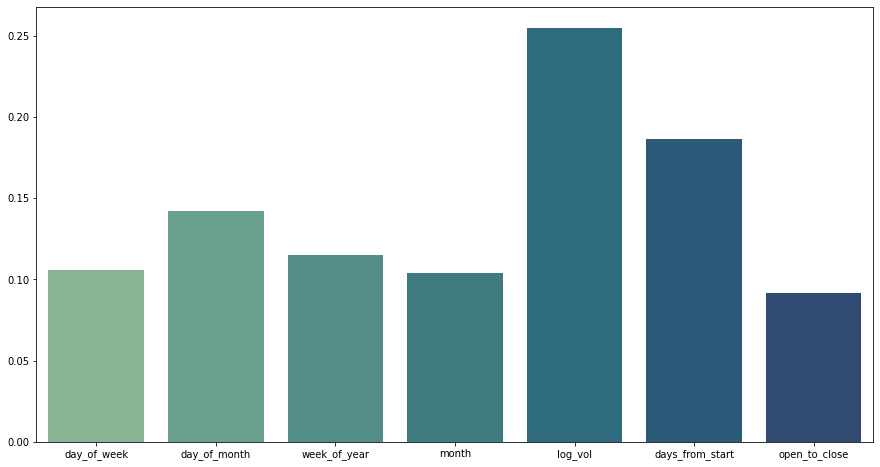

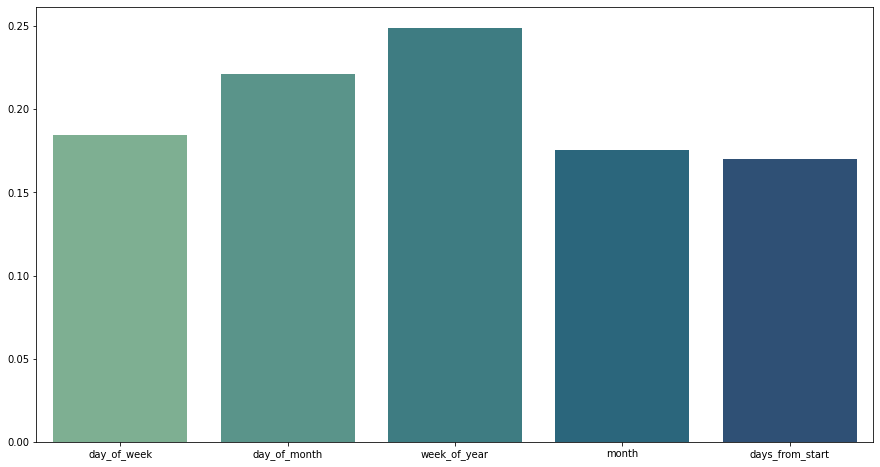


Plotting interpreation plots for a batch of entity 5:


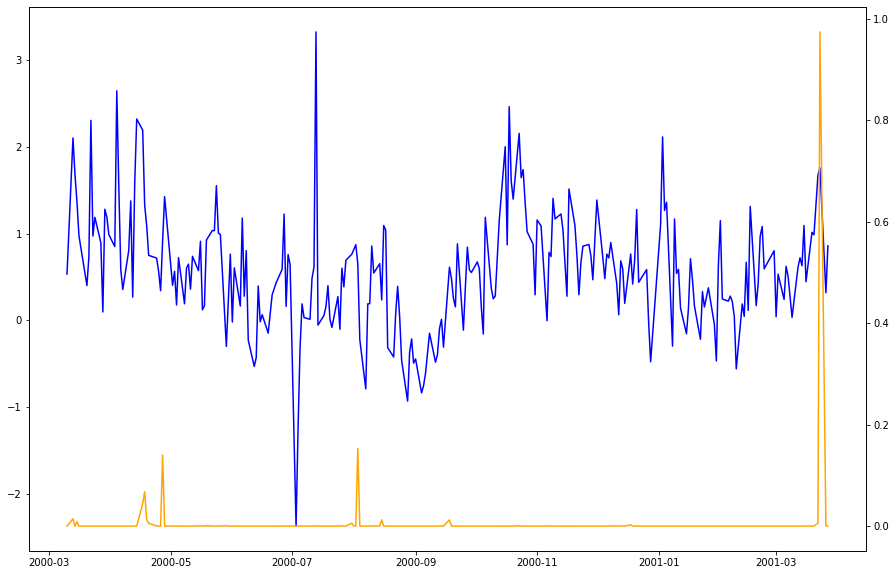

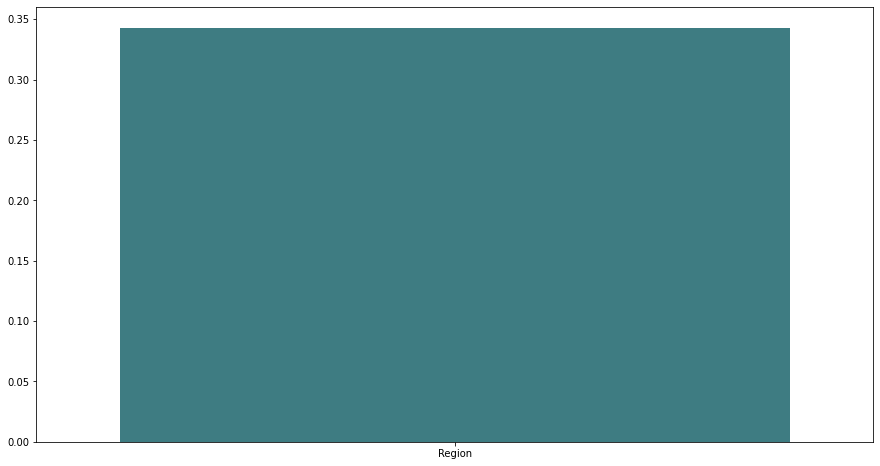

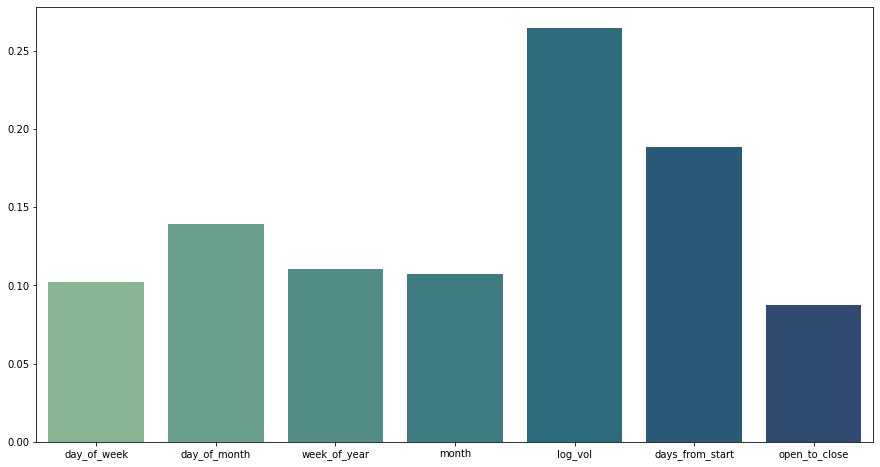

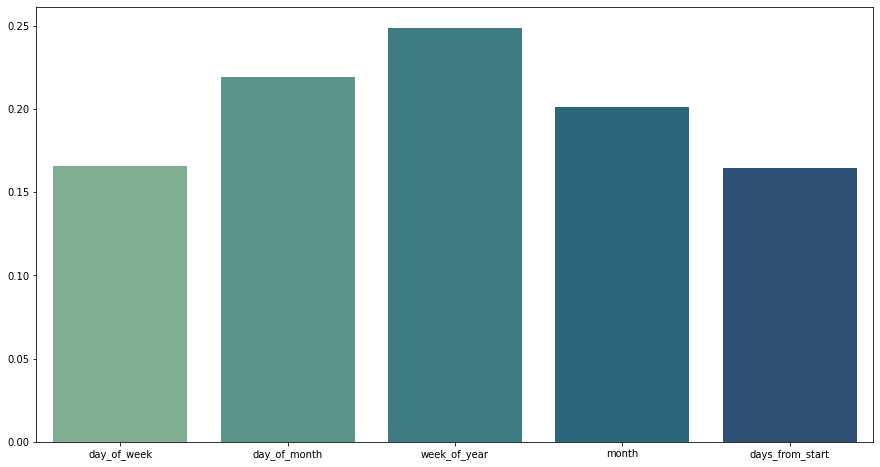


Plotting interpreation plots for a batch of entity 6:


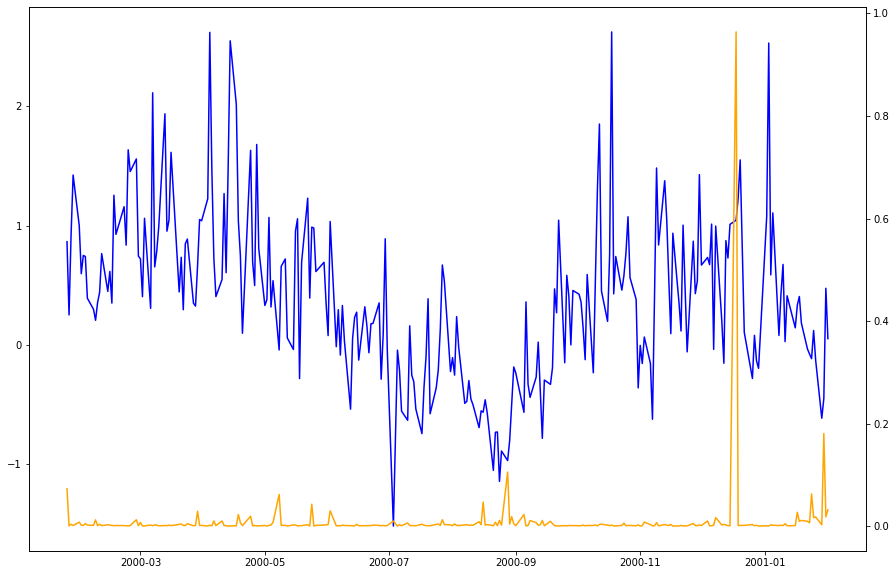

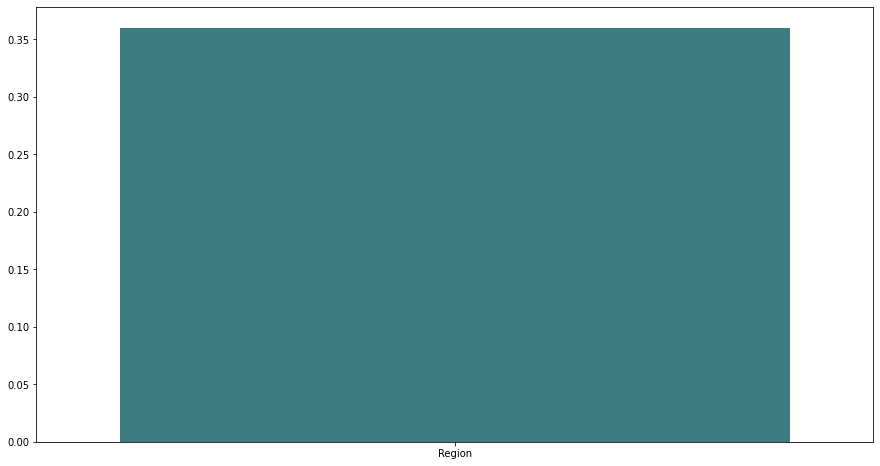

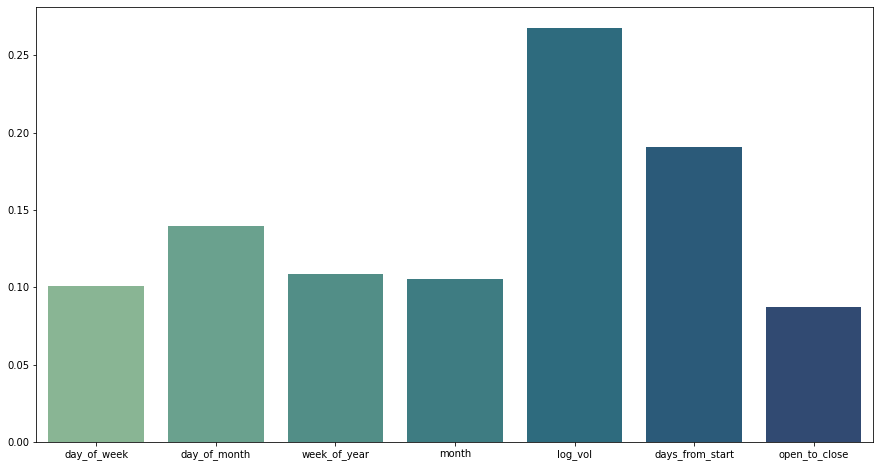

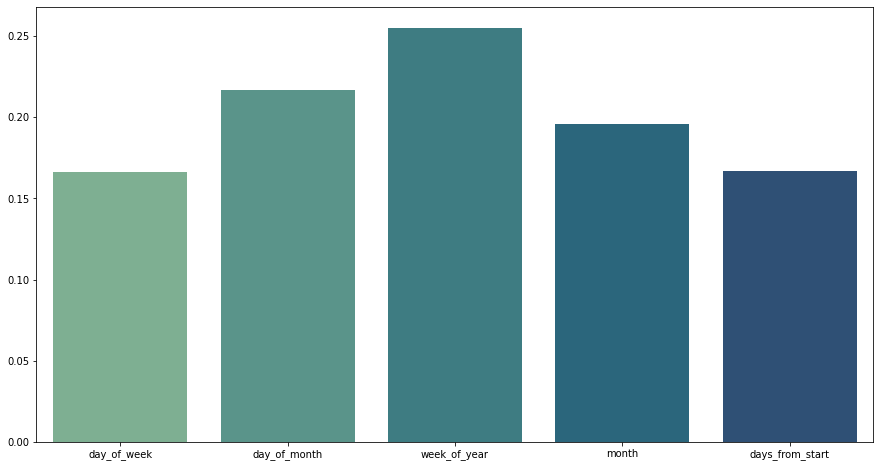


Plotting interpreation plots for a batch of entity 7:


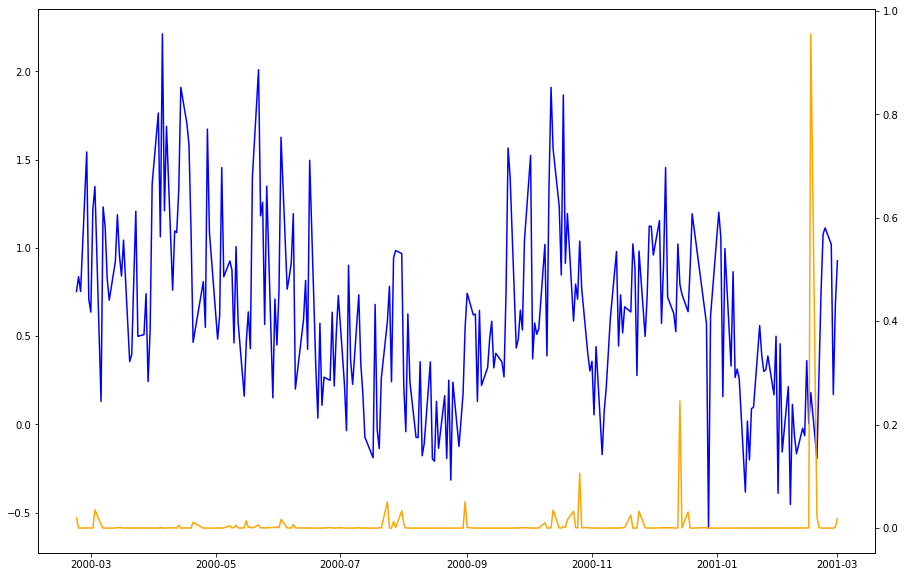

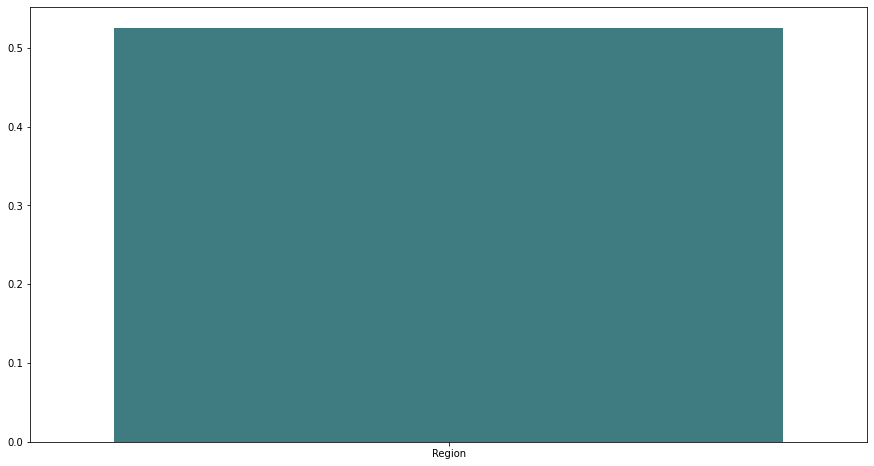

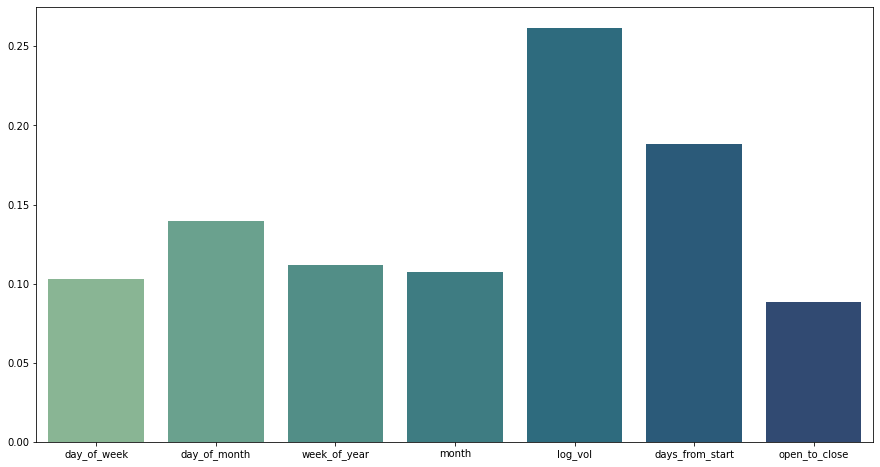

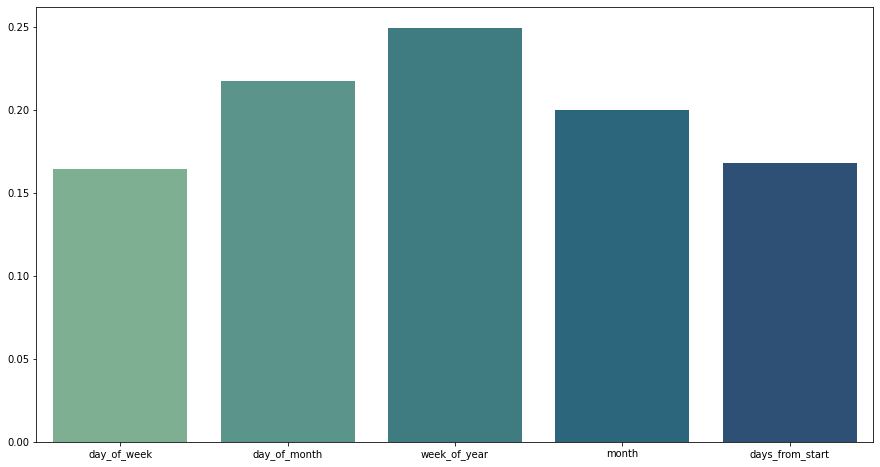


Plotting interpreation plots for a batch of entity 8:


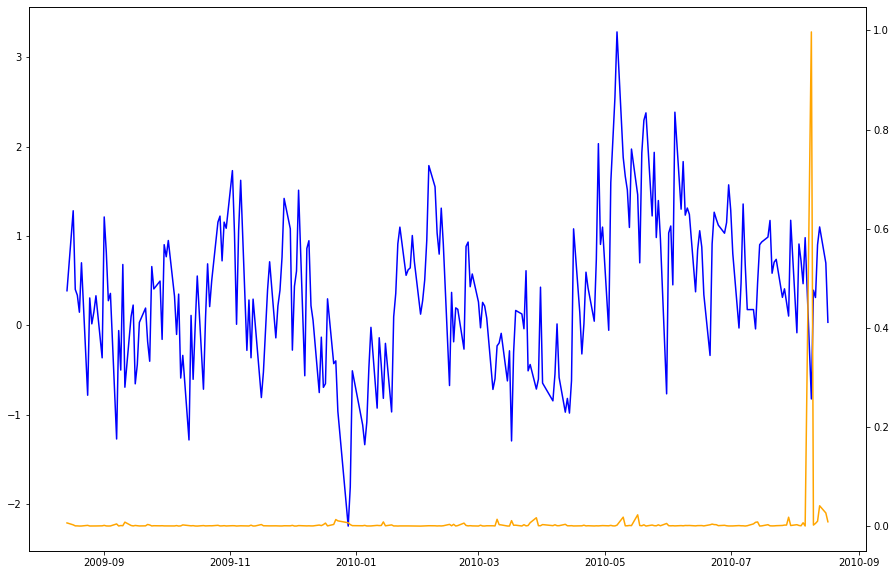

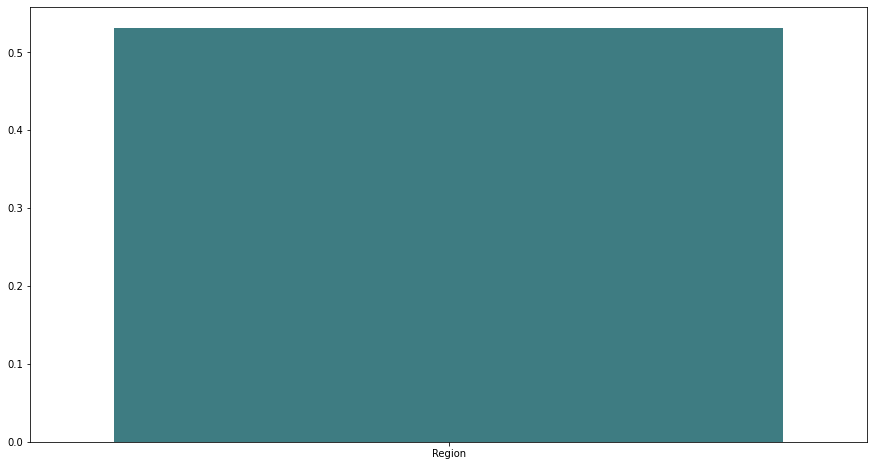

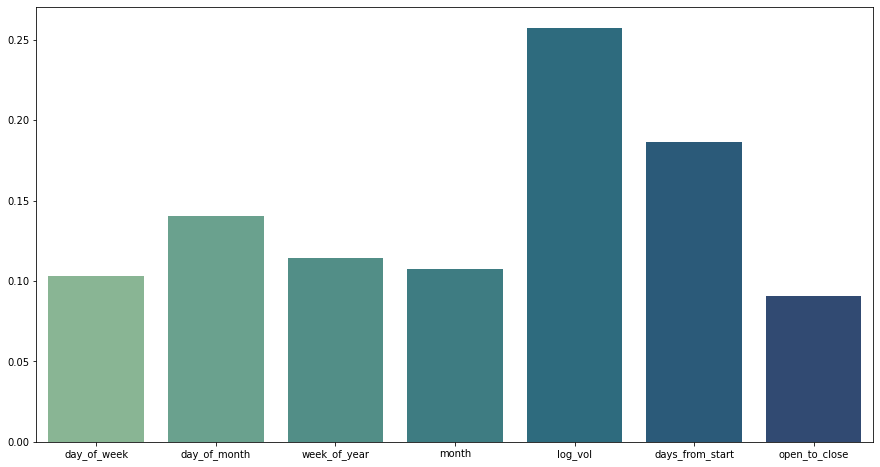

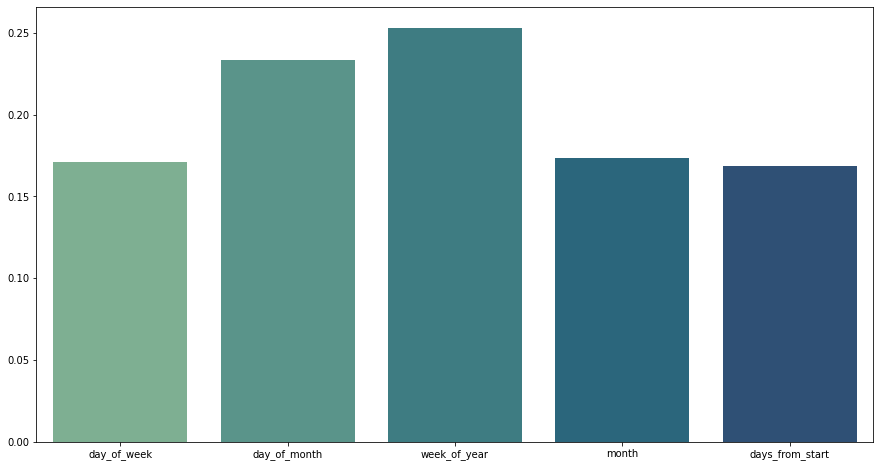


Plotting interpreation plots for a batch of entity 9:


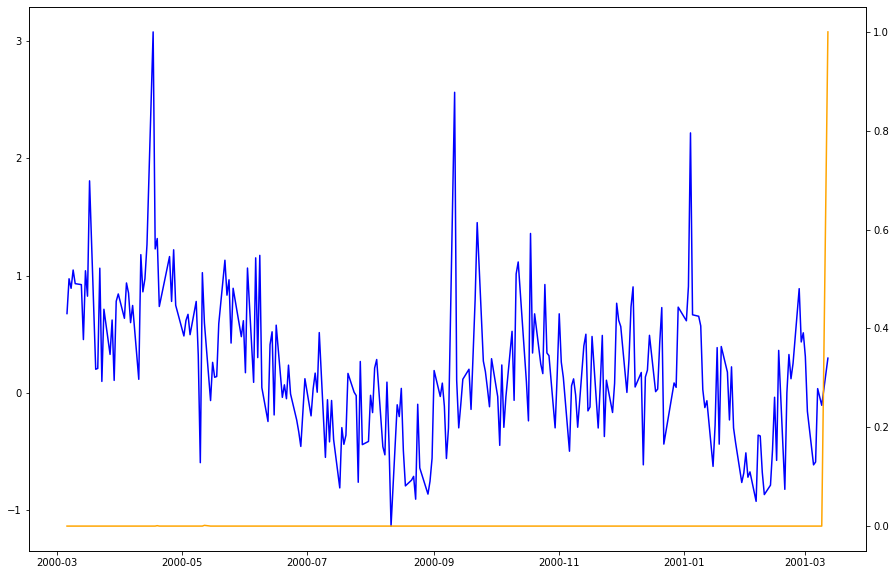

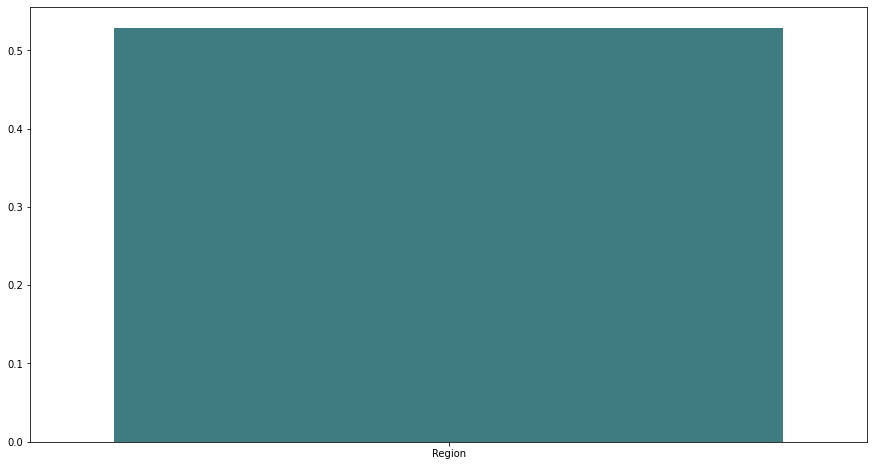

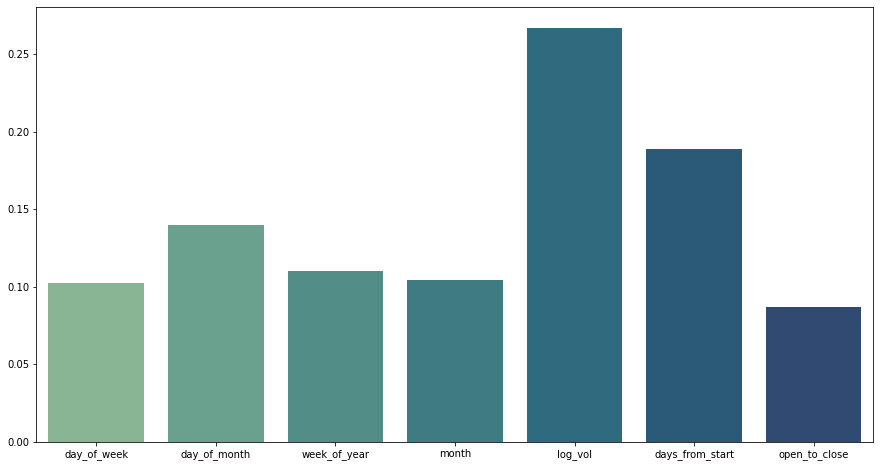

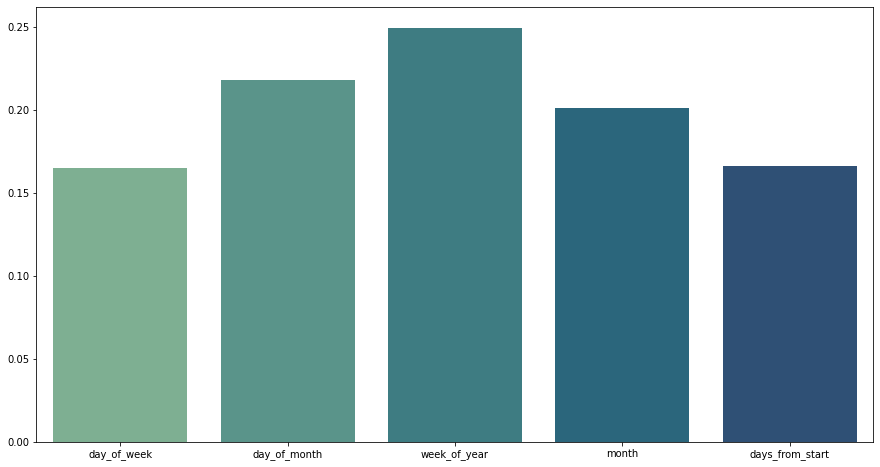


Plotting interpreation plots for a batch of entity 10:


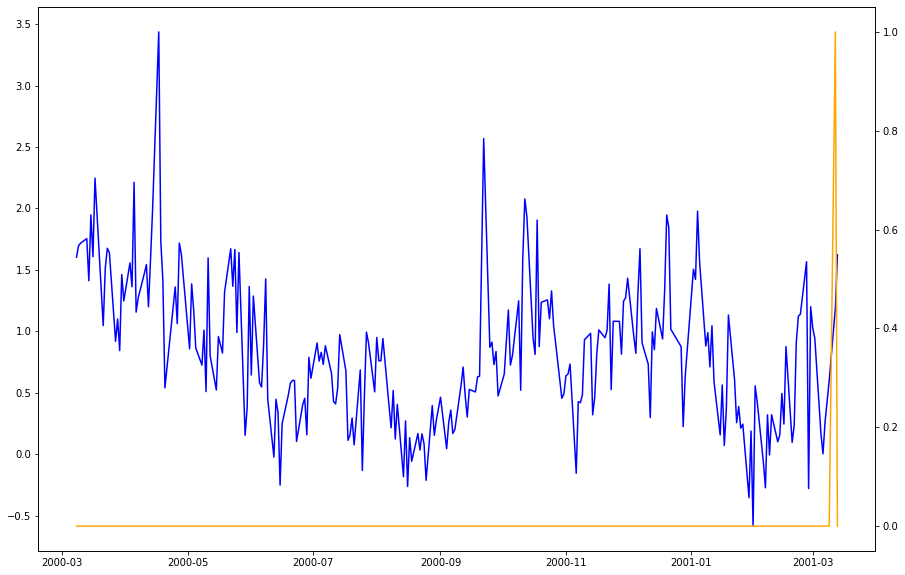

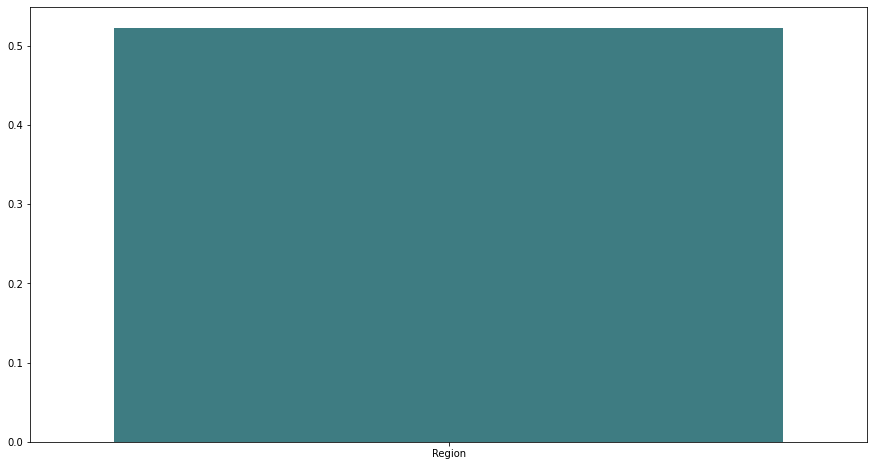

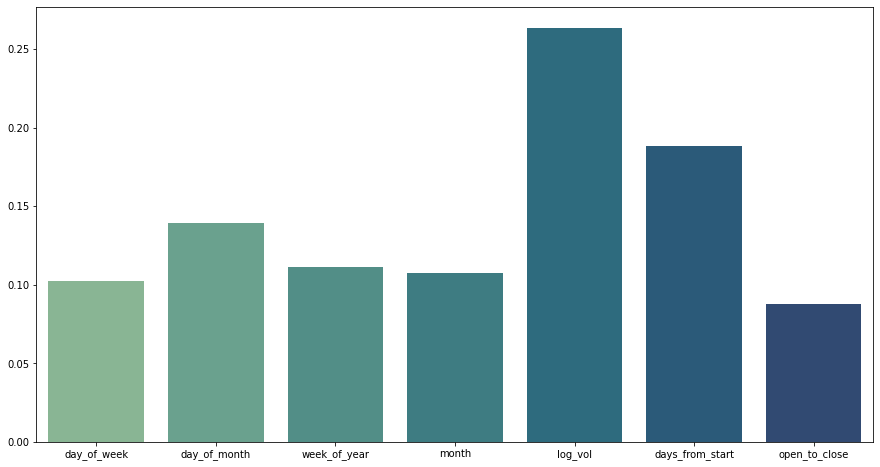

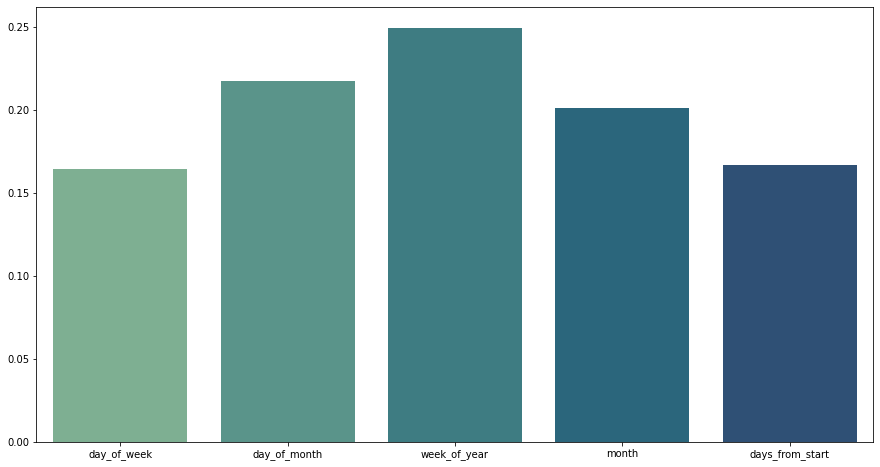


Plotting interpreation plots for a batch of entity 11:


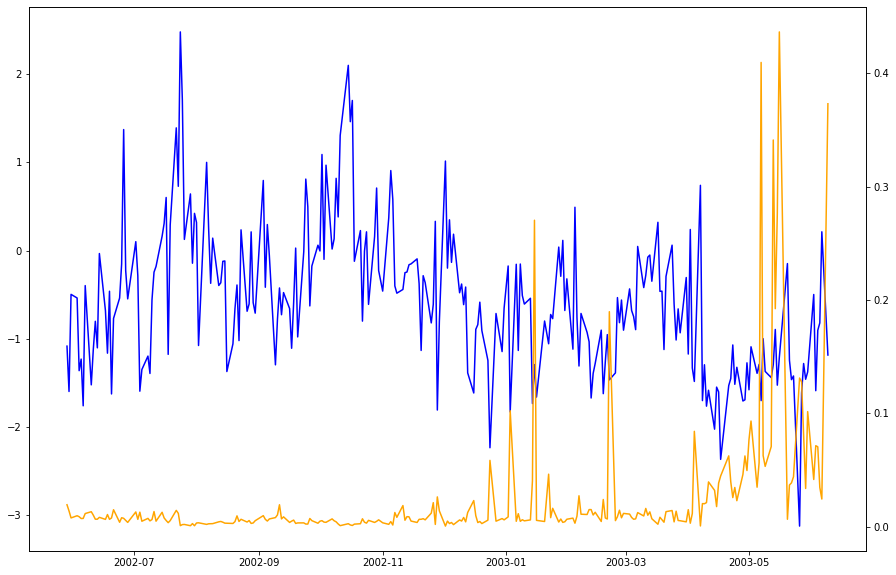

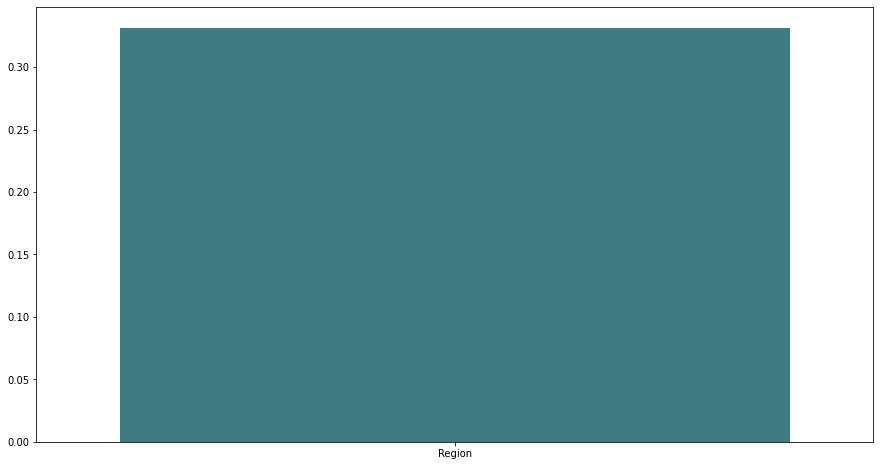

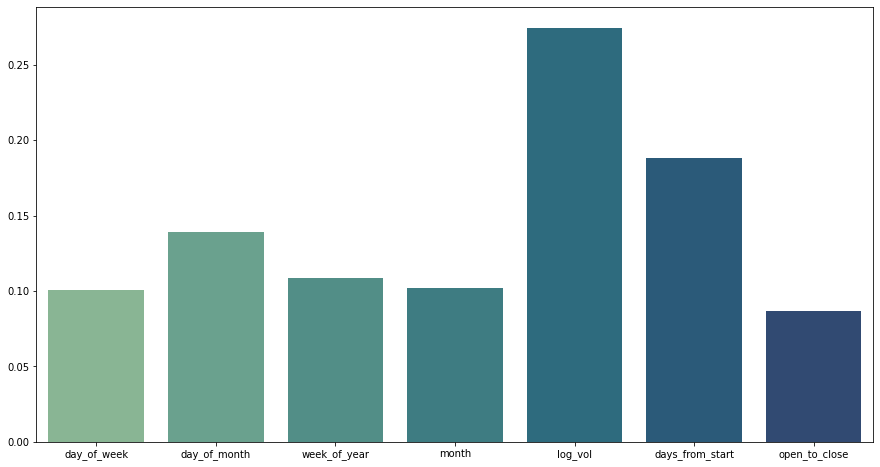

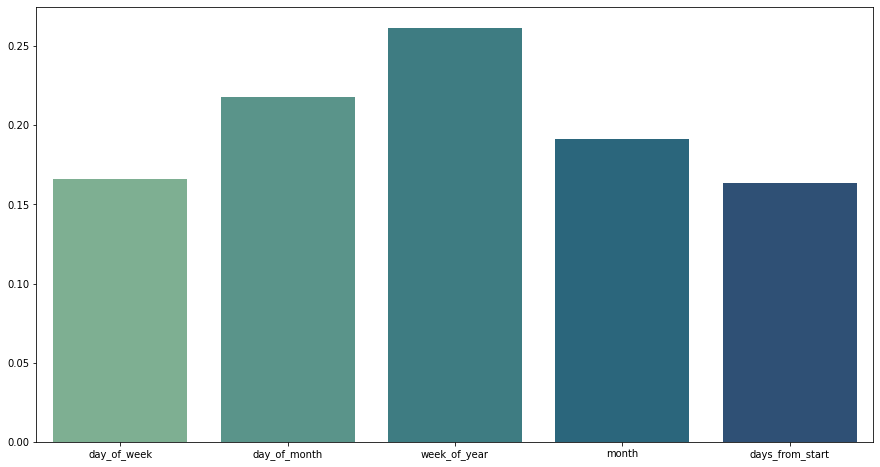


Plotting interpreation plots for a batch of entity 12:


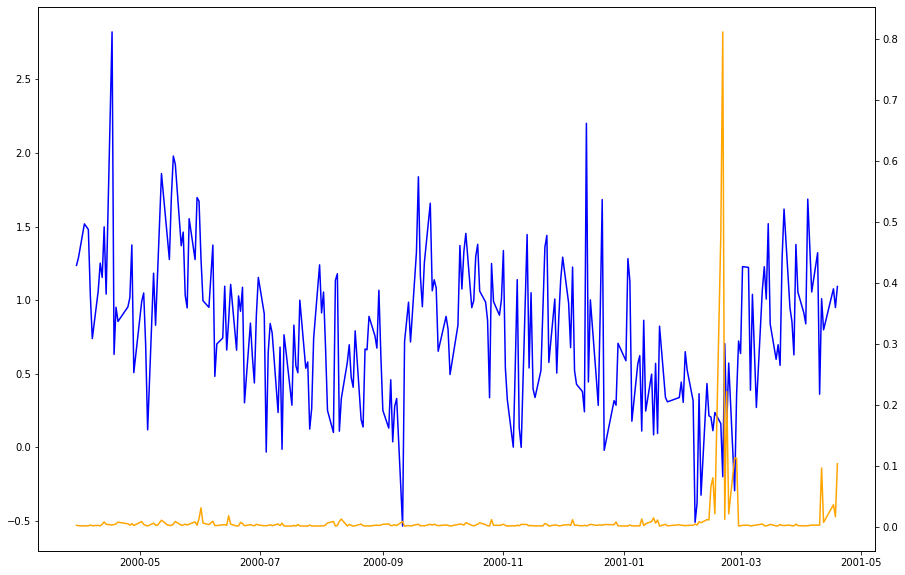

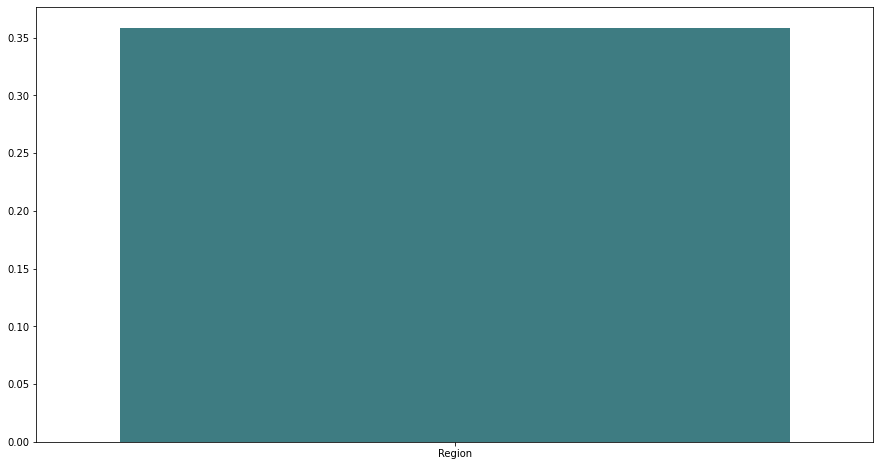

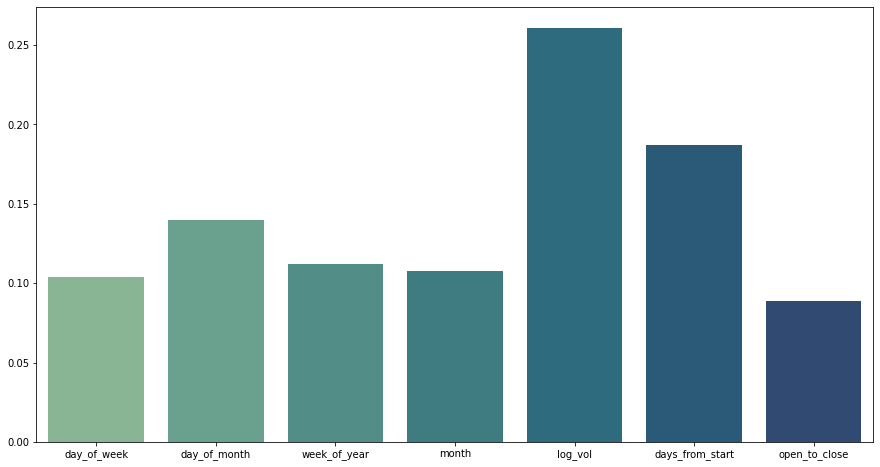

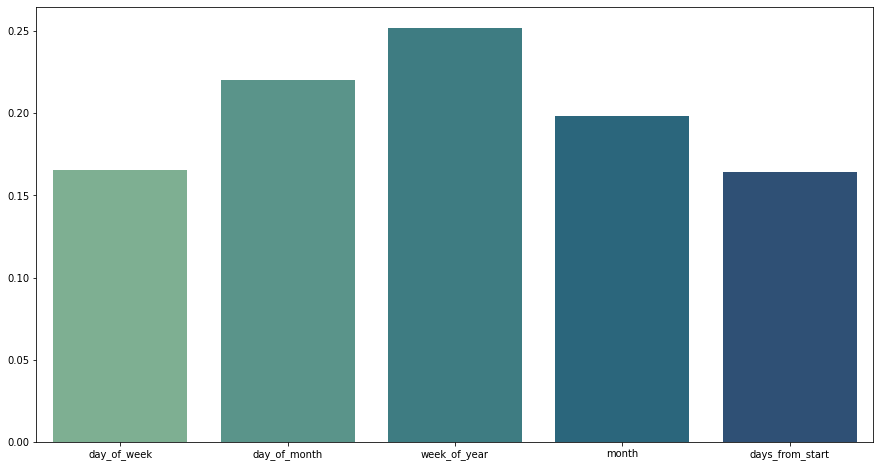


Plotting interpreation plots for a batch of entity 13:


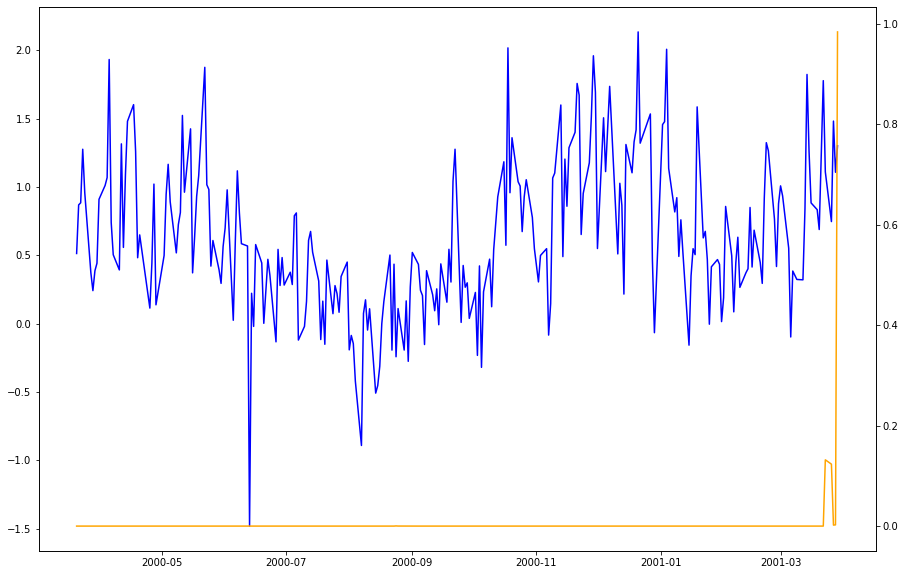

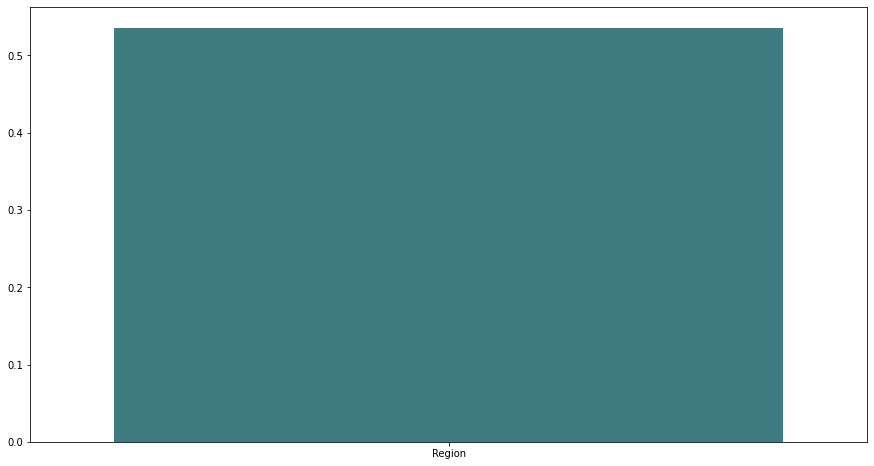

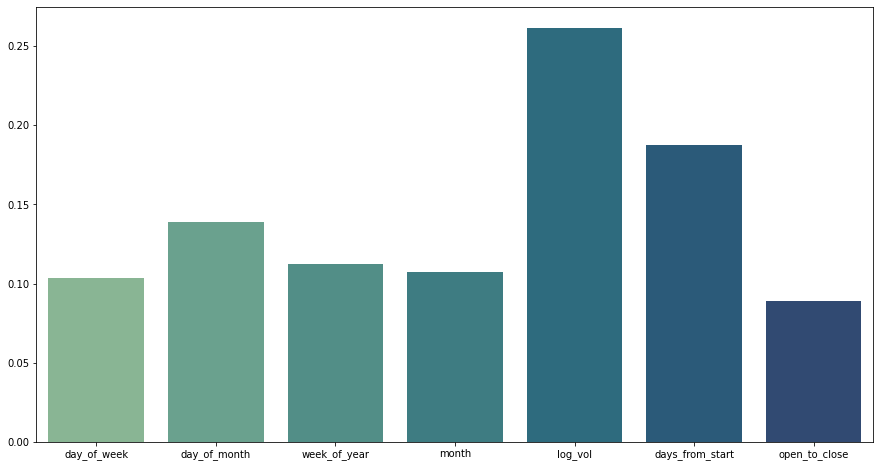

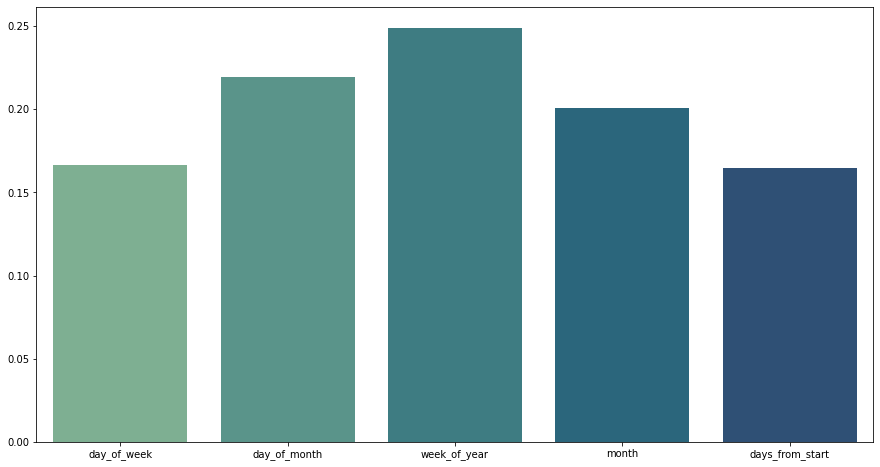


Plotting interpreation plots for a batch of entity 14:


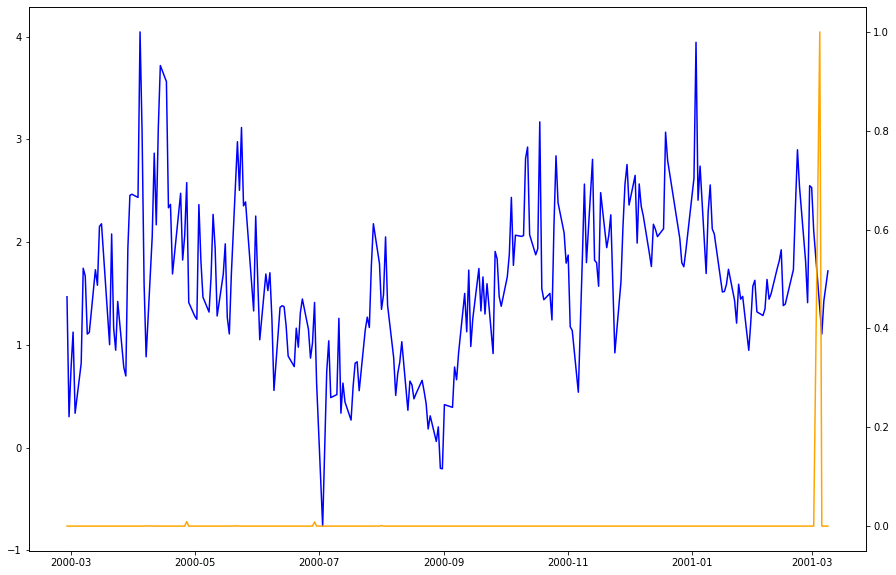

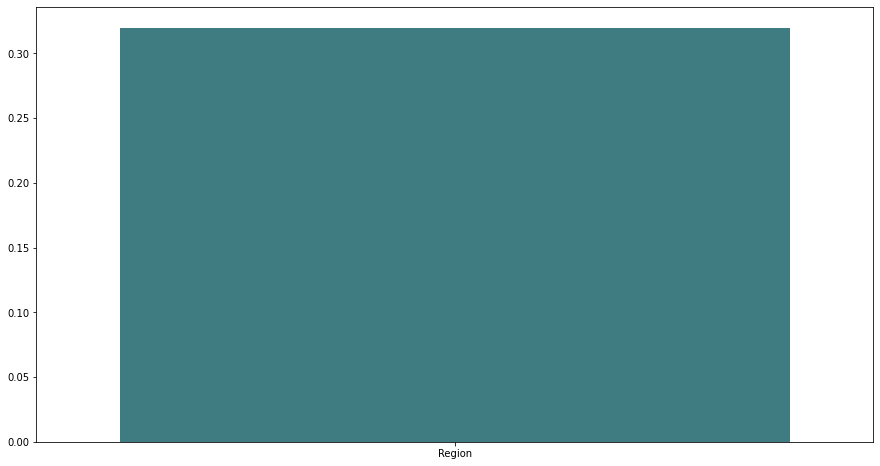

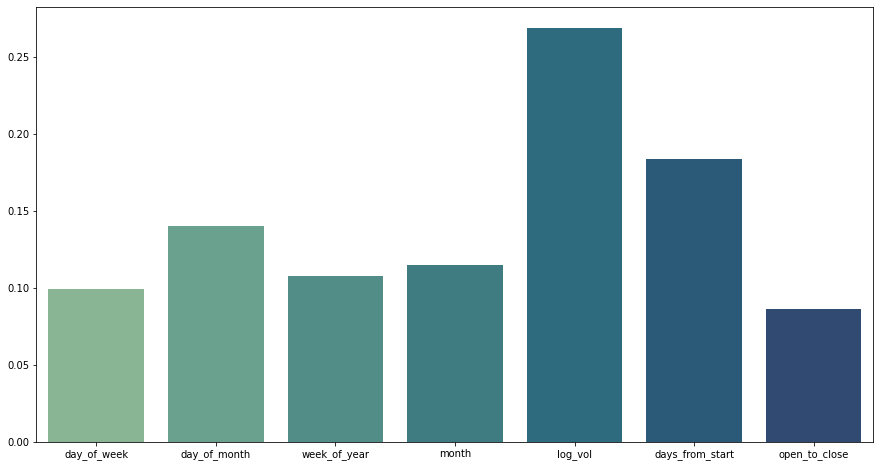

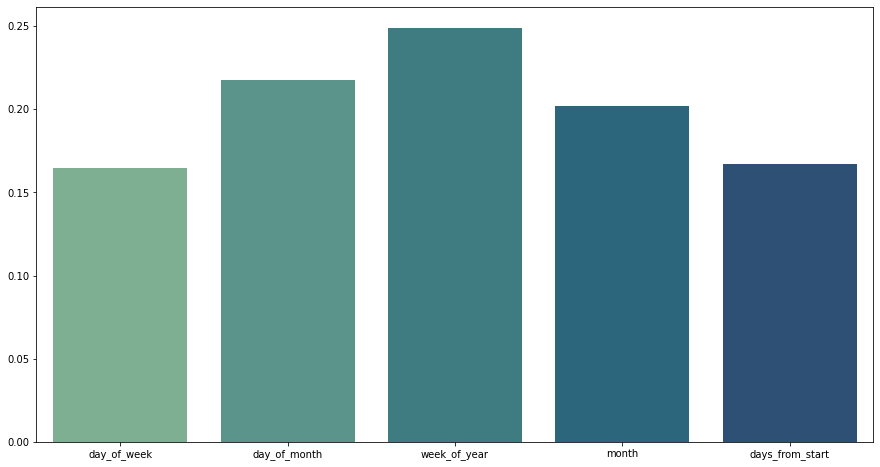


Plotting interpreation plots for a batch of entity 15:


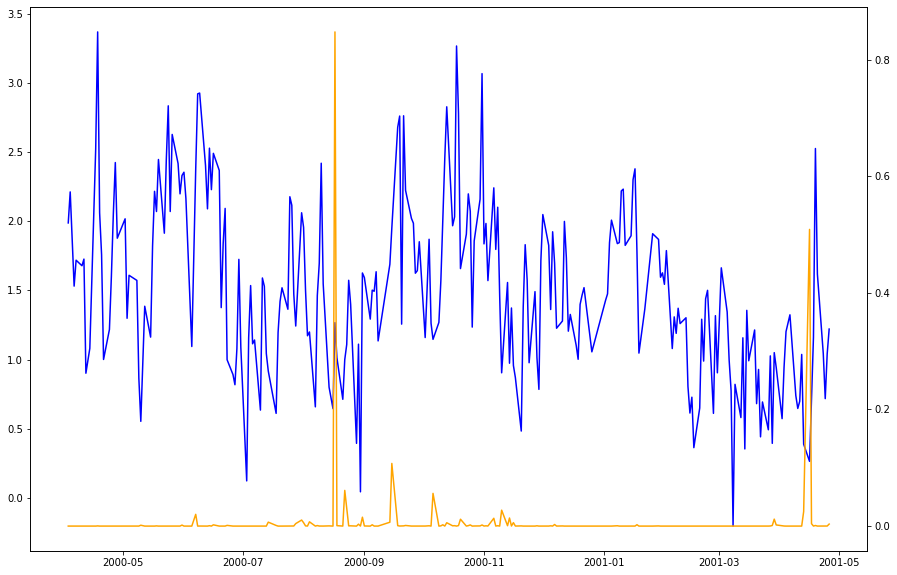

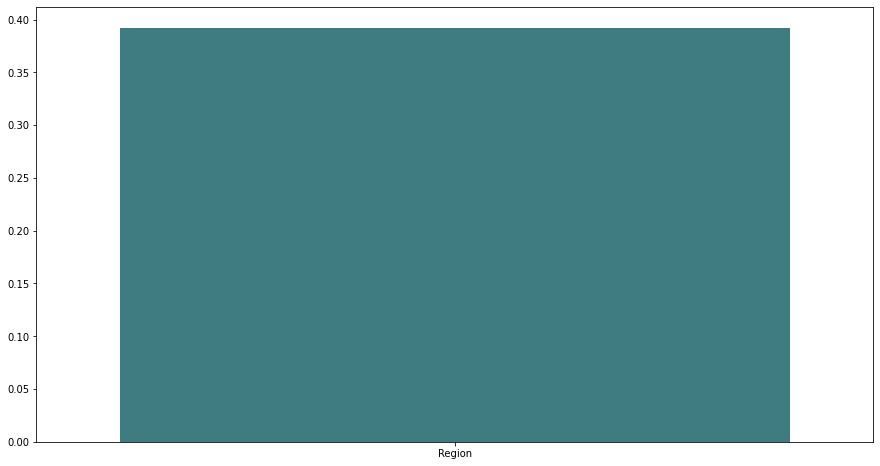

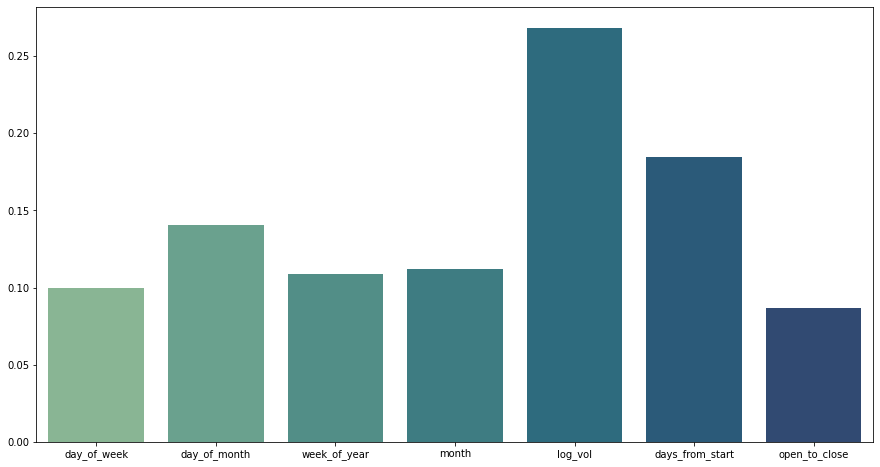

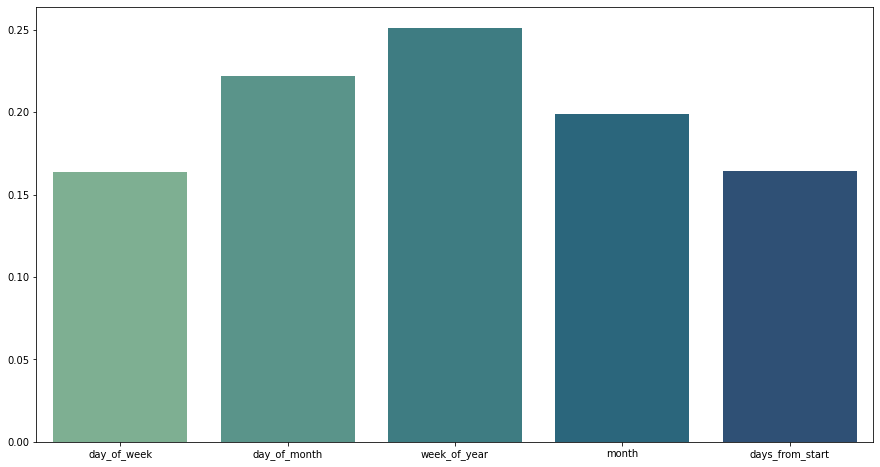


Plotting interpreation plots for a batch of entity 16:


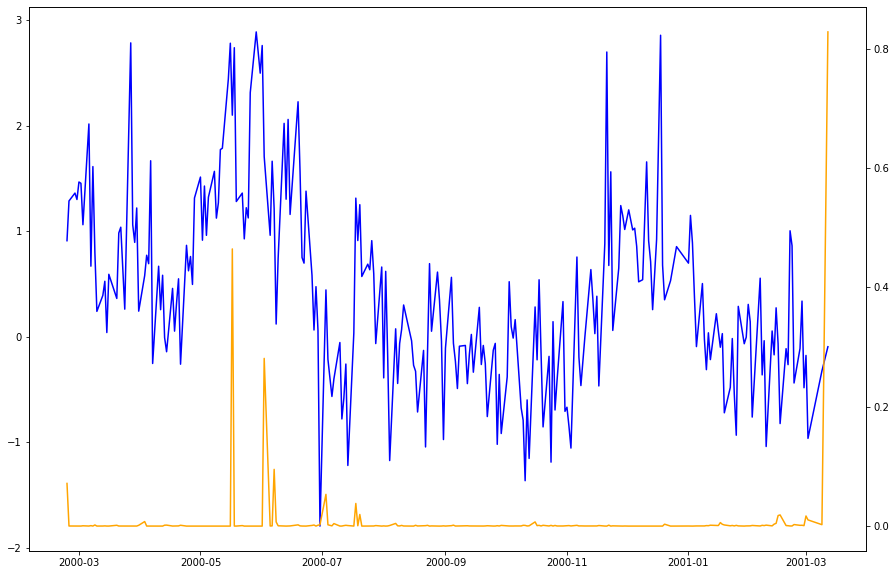

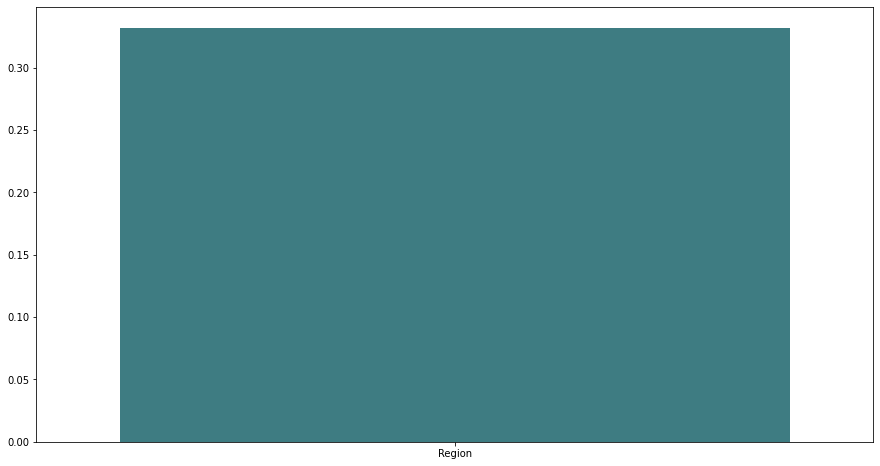

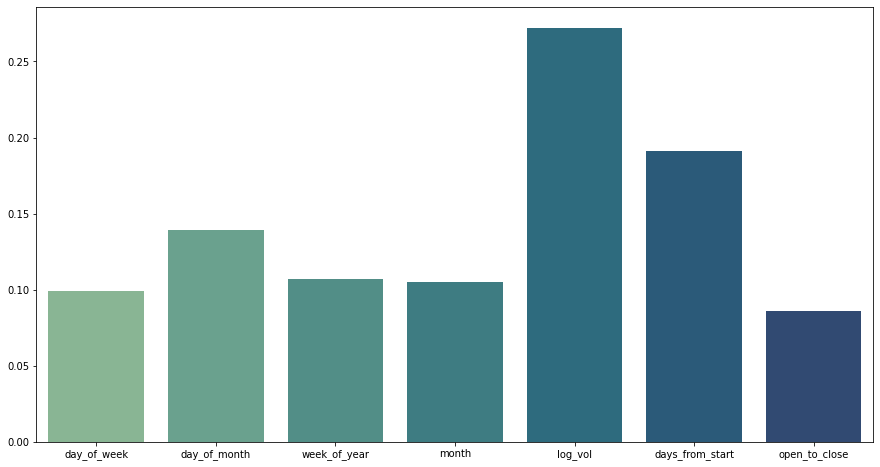

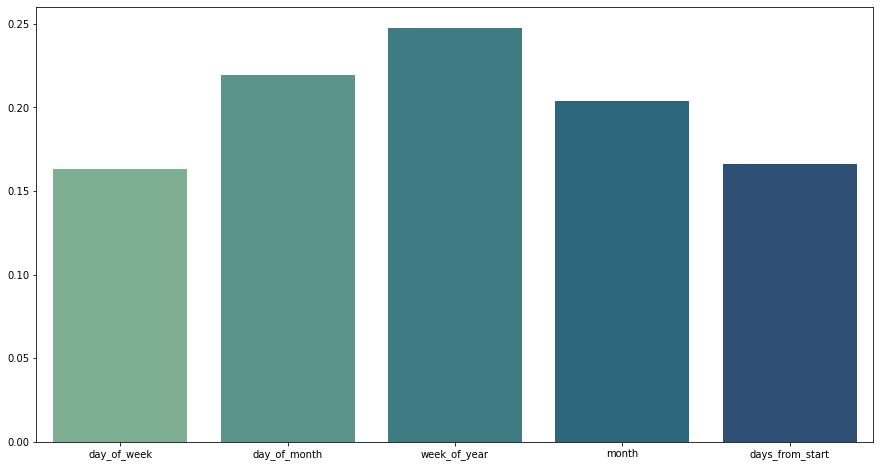


Plotting interpreation plots for a batch of entity 17:


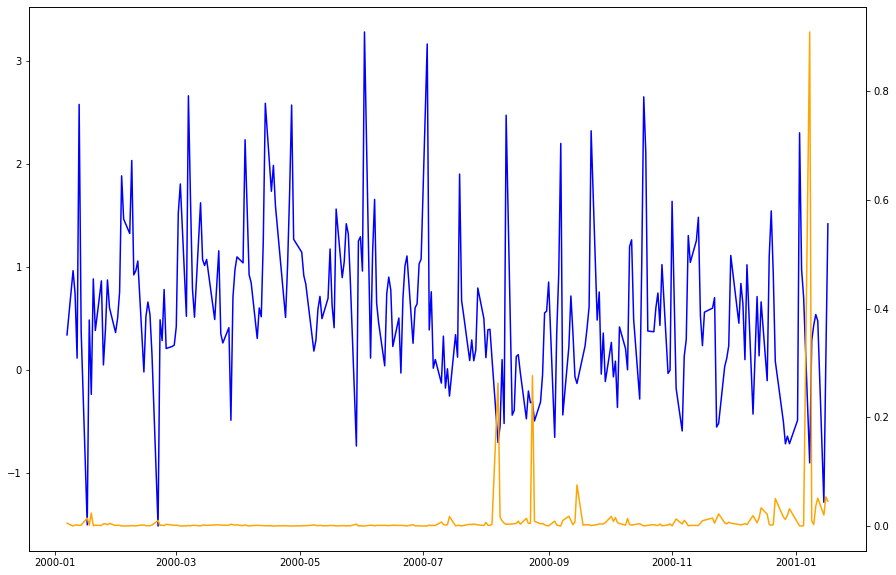

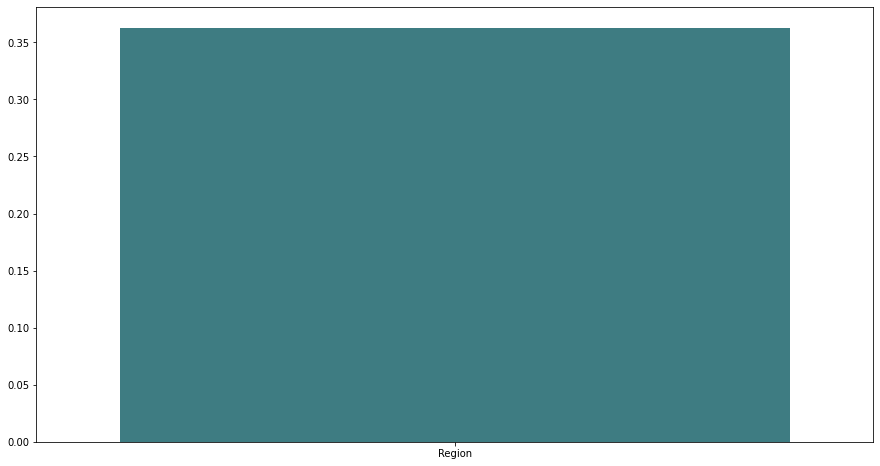

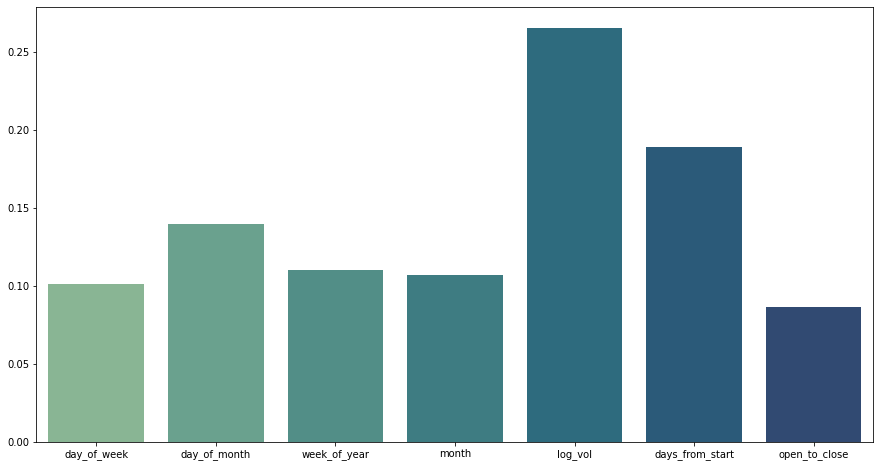

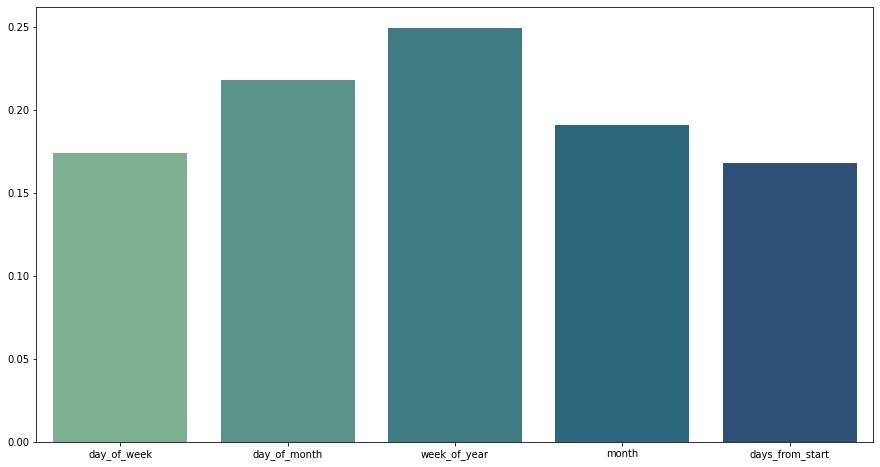


Plotting interpreation plots for a batch of entity 18:


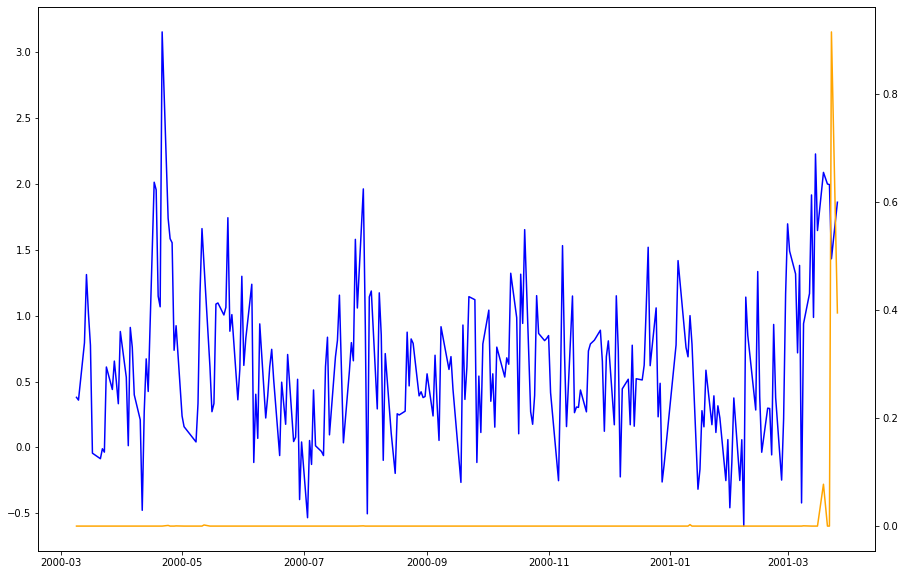

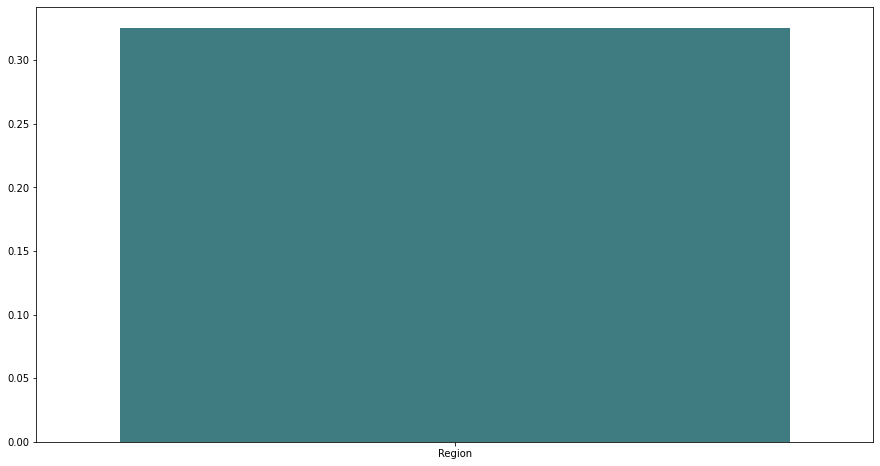

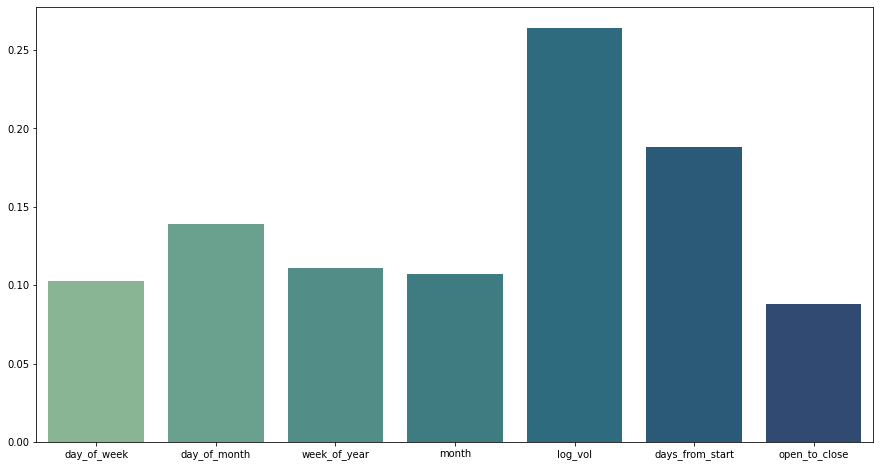

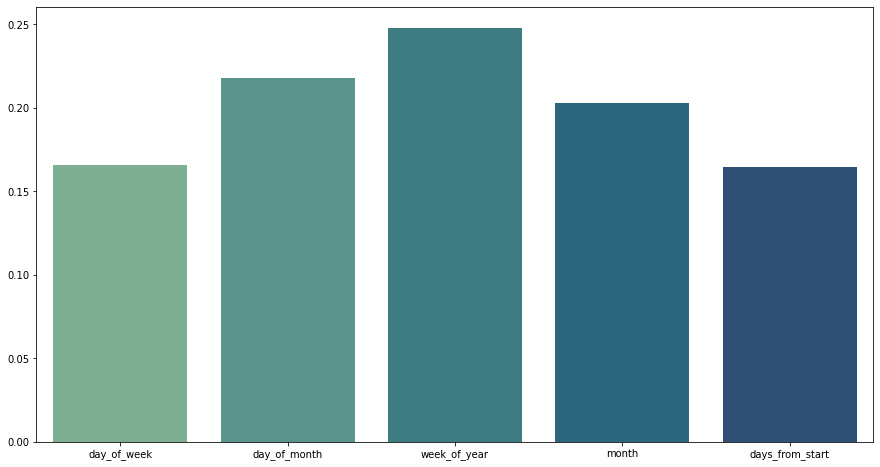


Plotting interpreation plots for a batch of entity 19:


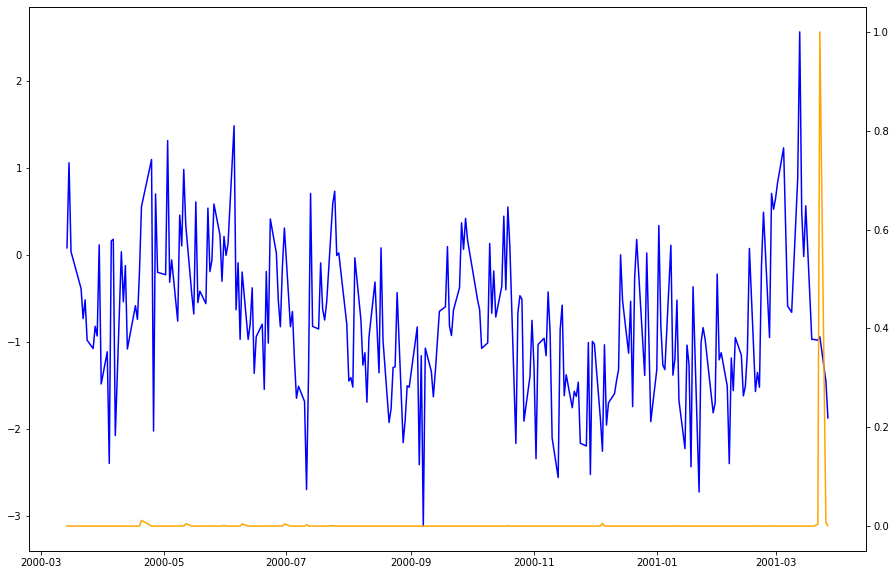

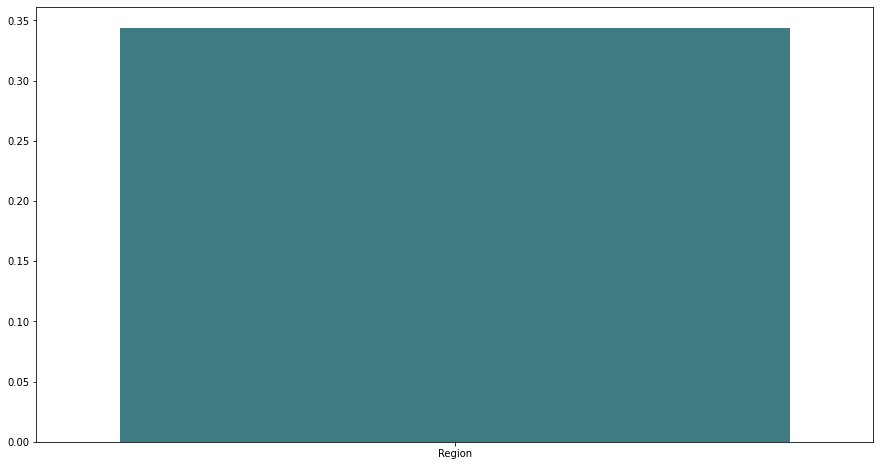

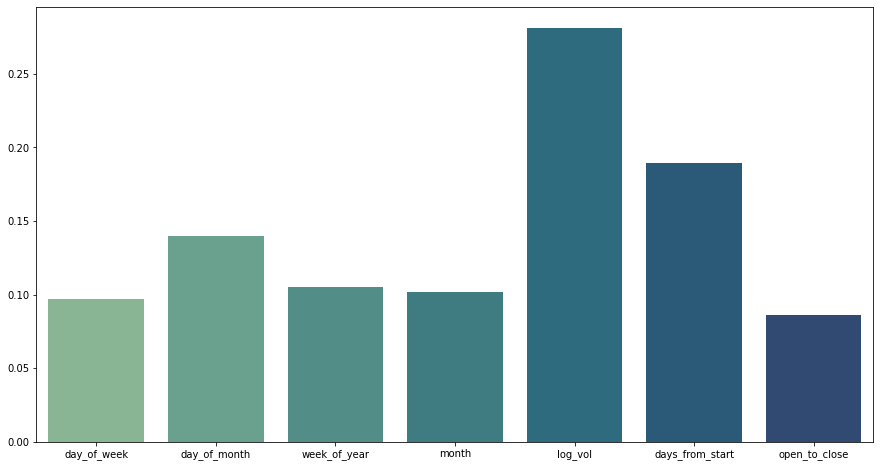

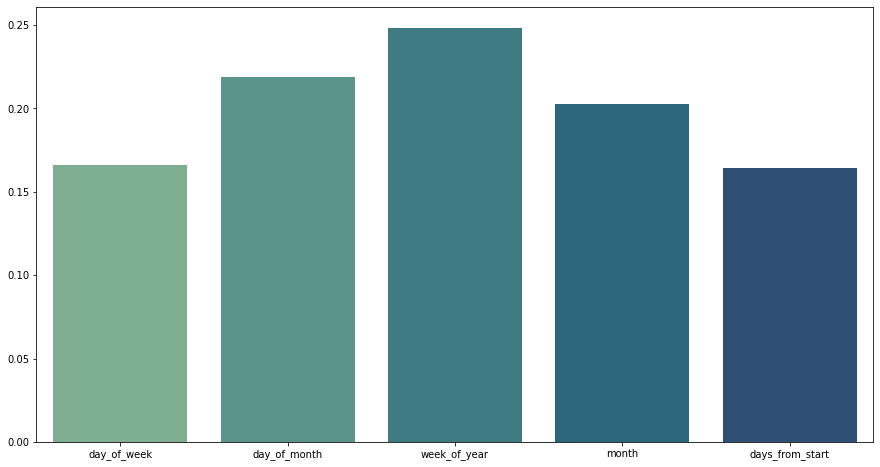


Plotting interpreation plots for a batch of entity 20:


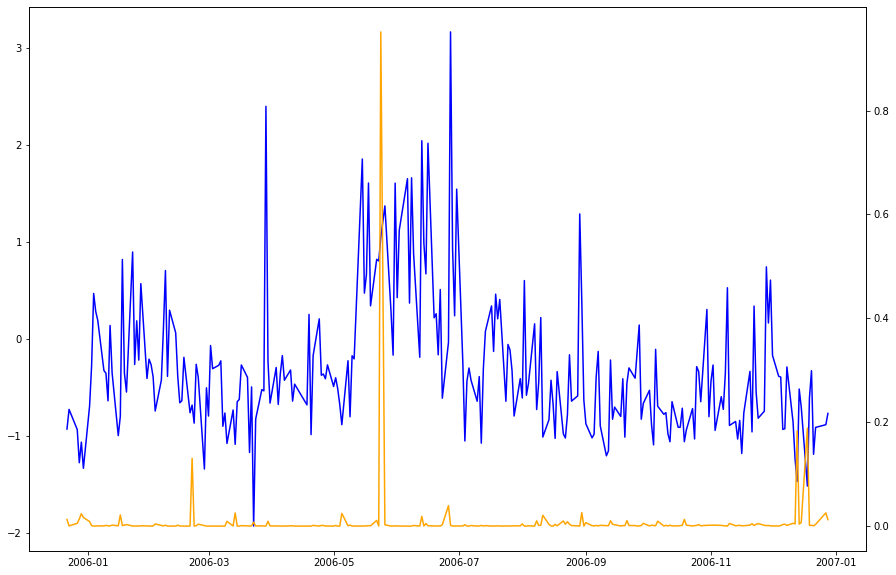

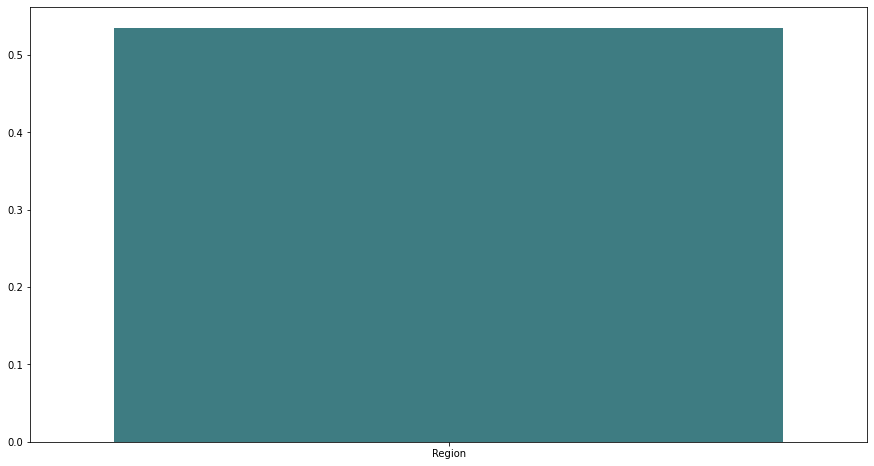

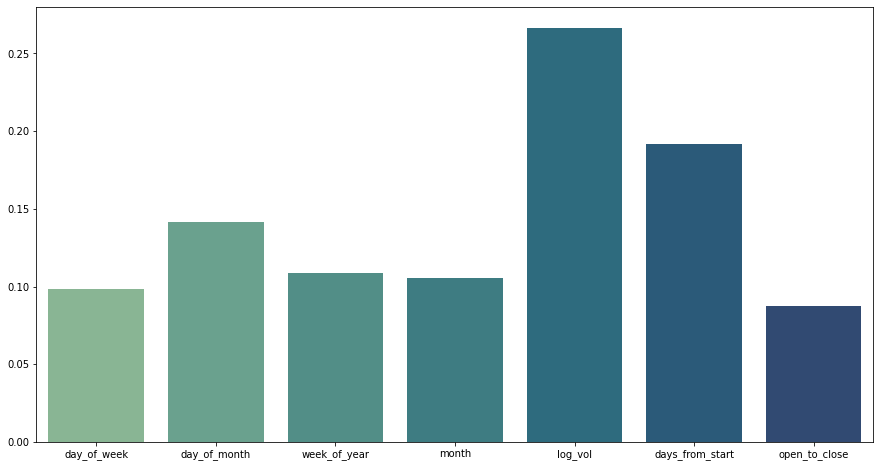

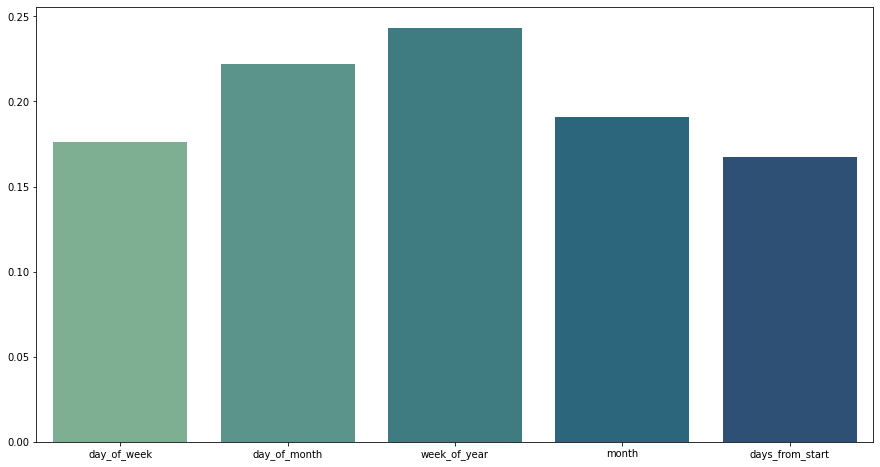


Plotting interpreation plots for a batch of entity 21:


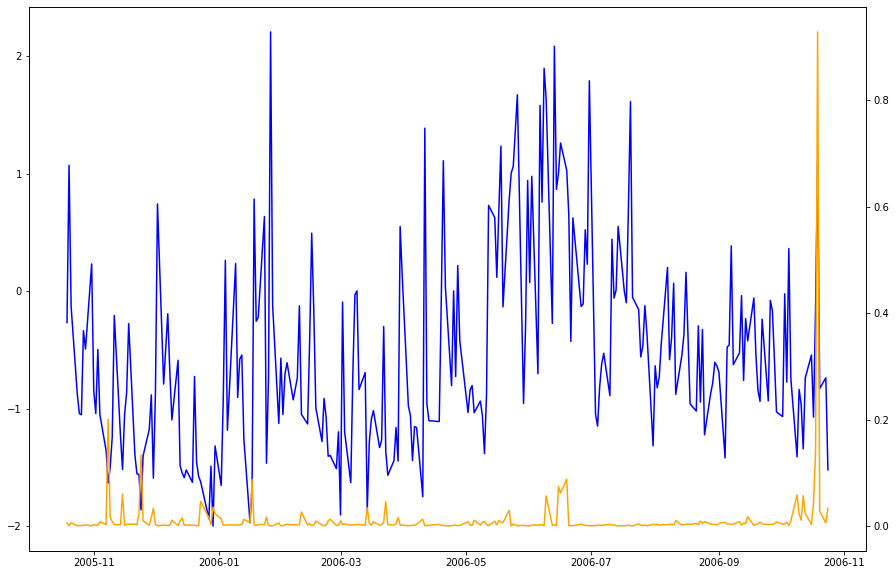

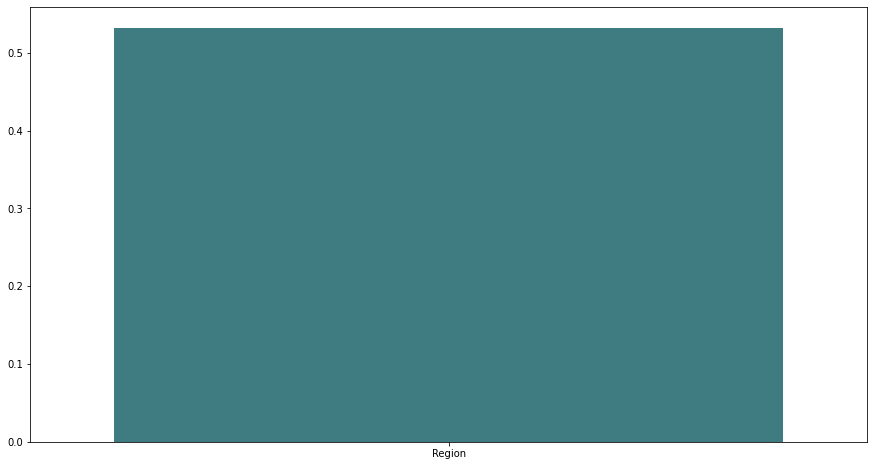

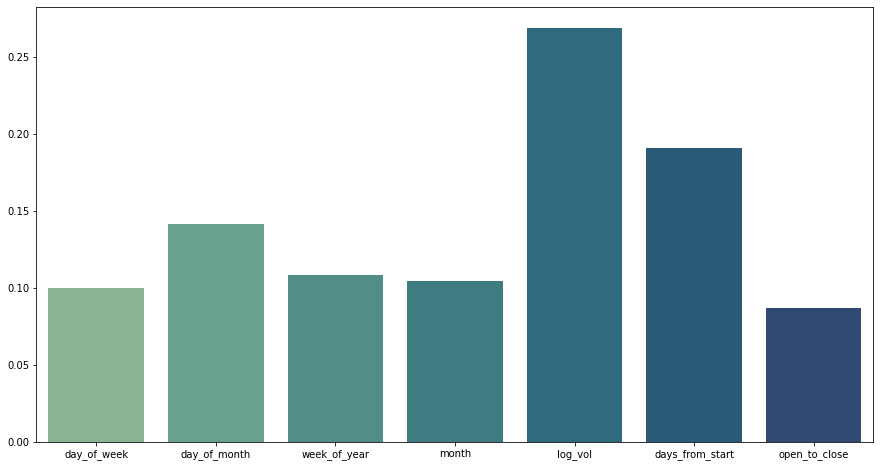

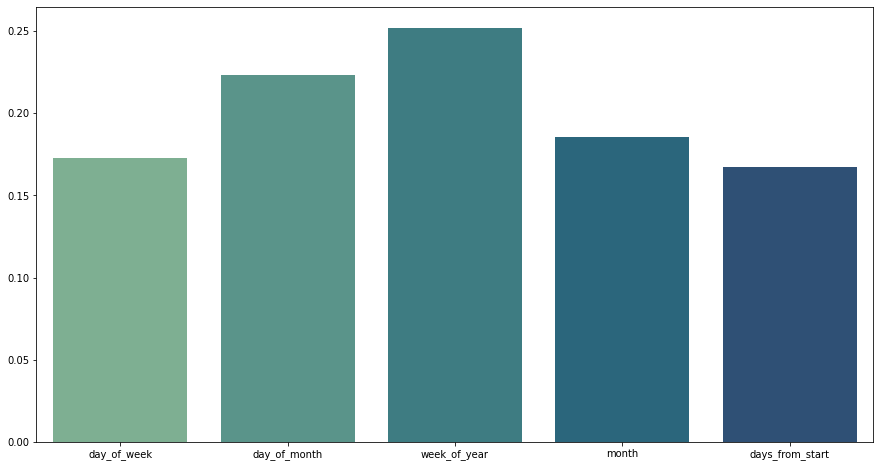


Plotting interpreation plots for a batch of entity 22:


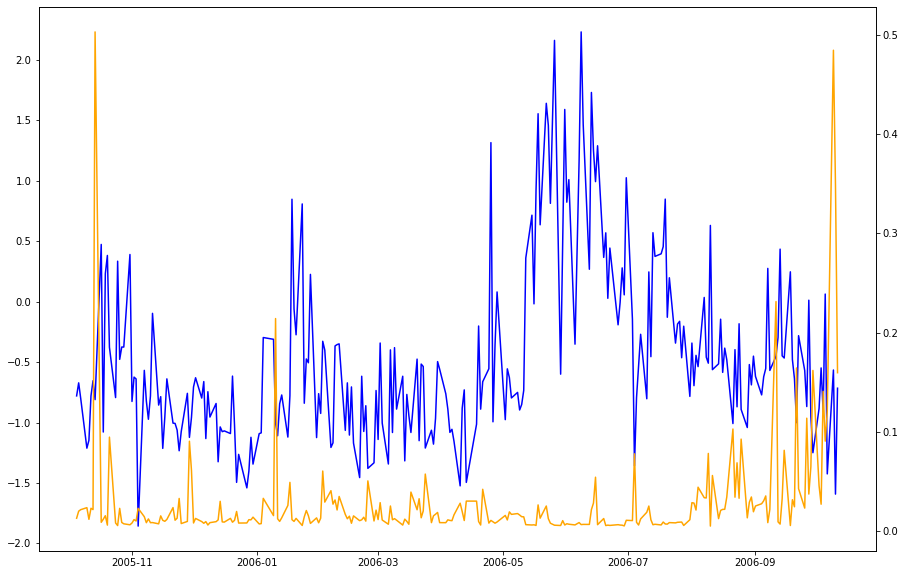

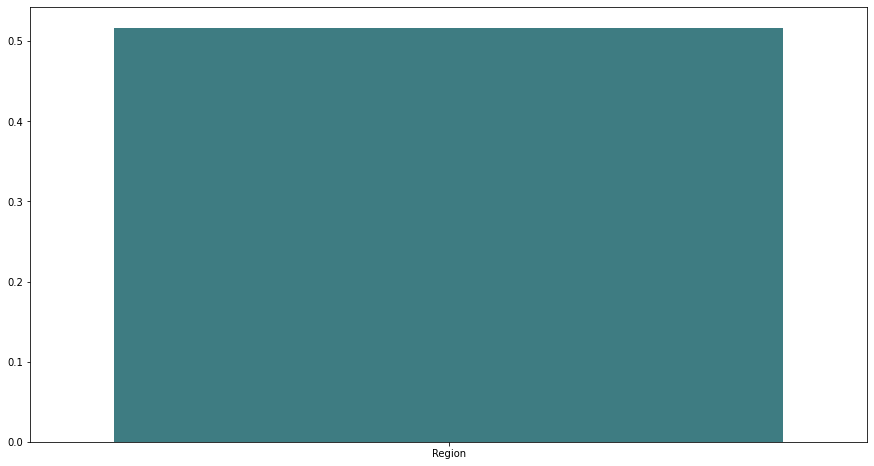

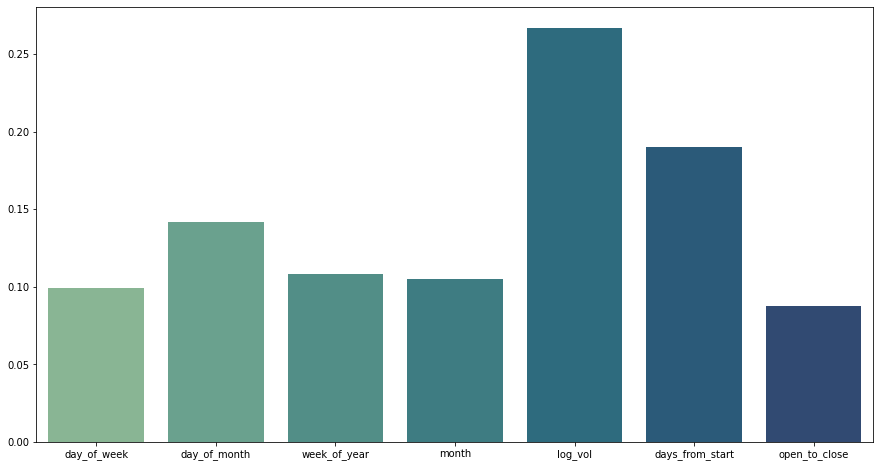

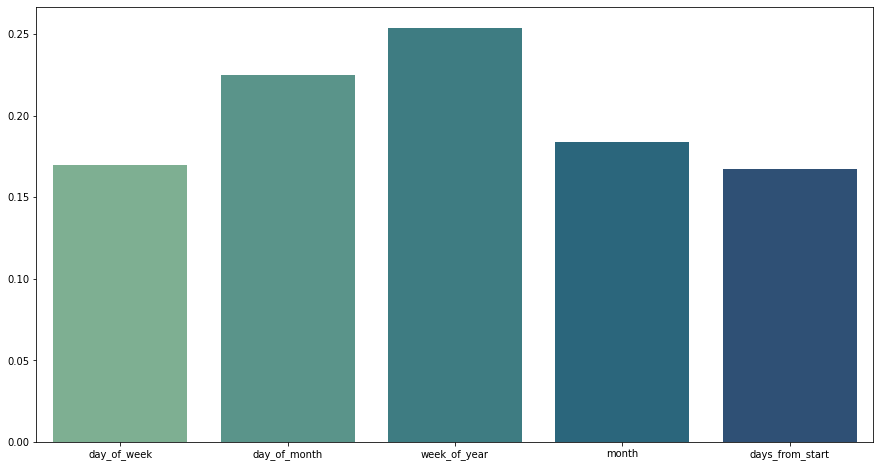


Plotting interpreation plots for a batch of entity 23:


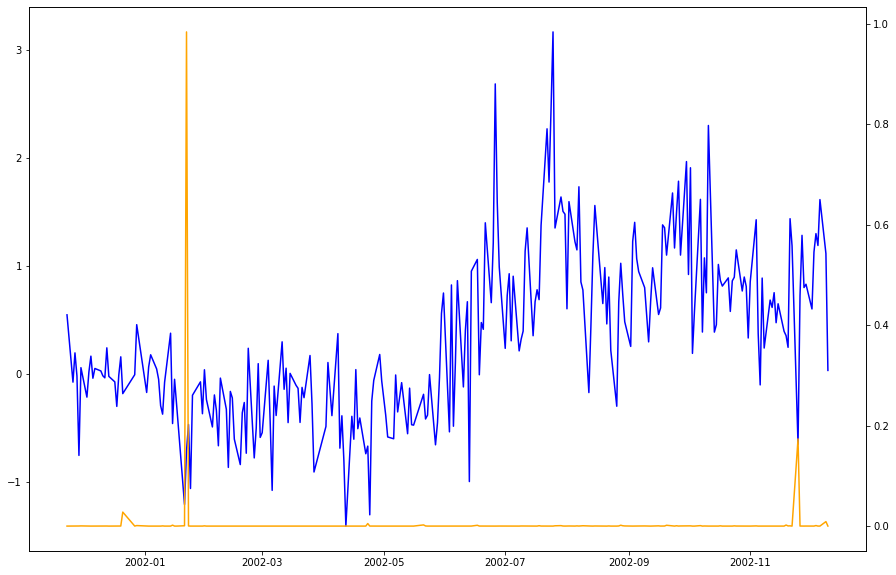

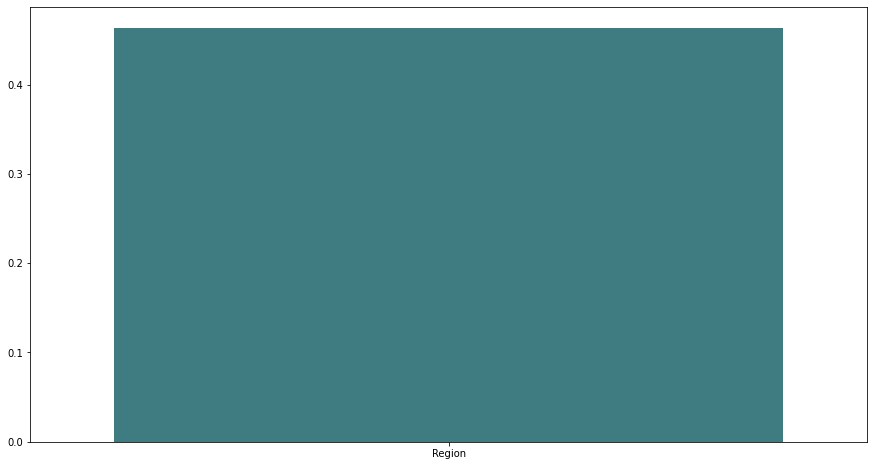

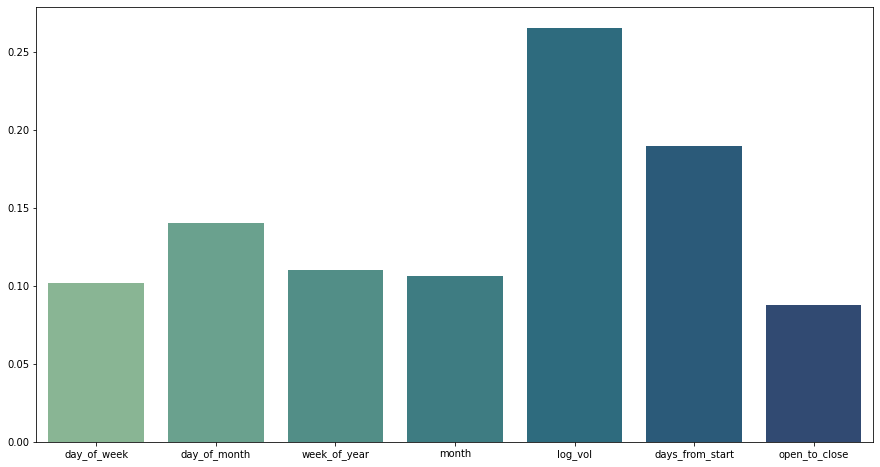

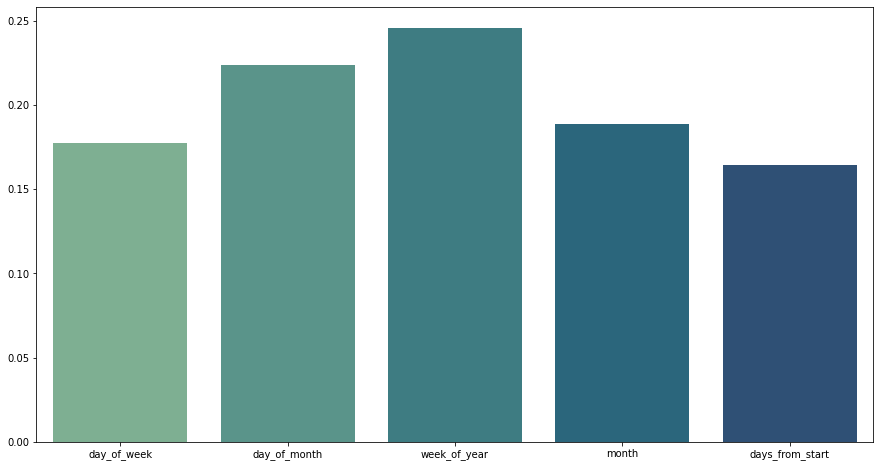


Plotting interpreation plots for a batch of entity 24:


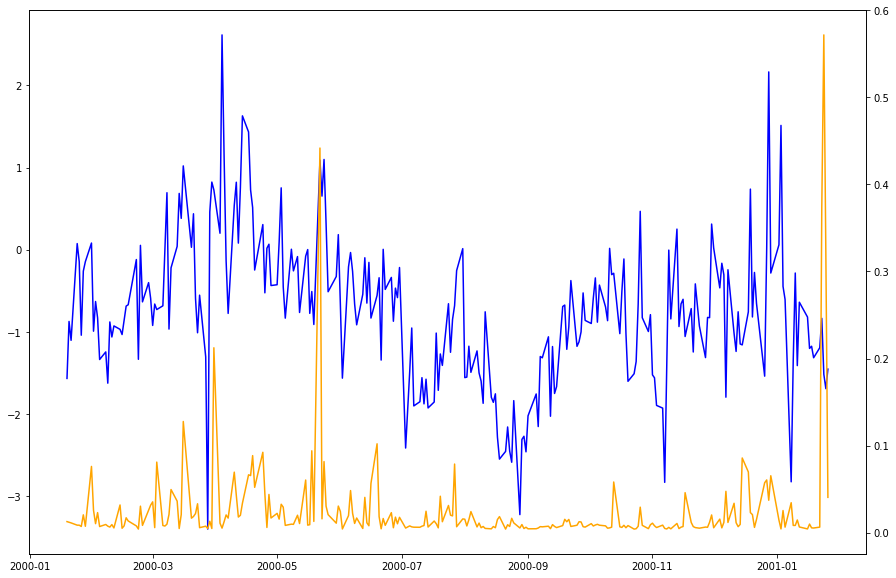

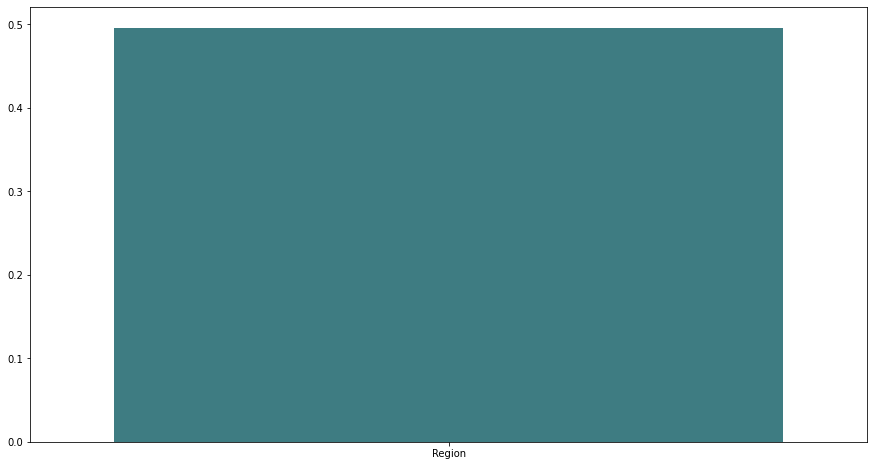

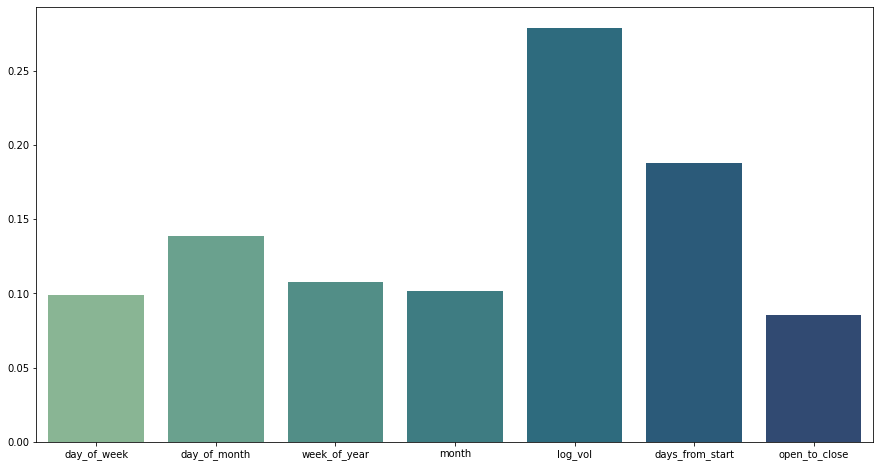

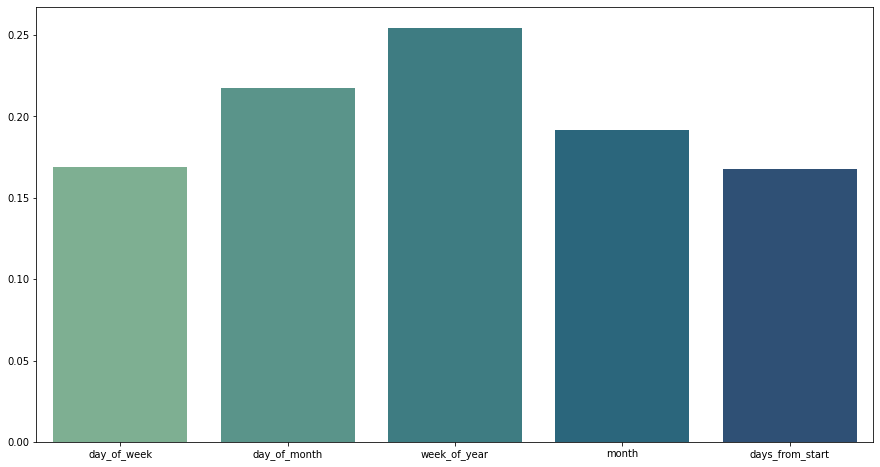


Plotting interpreation plots for a batch of entity 25:


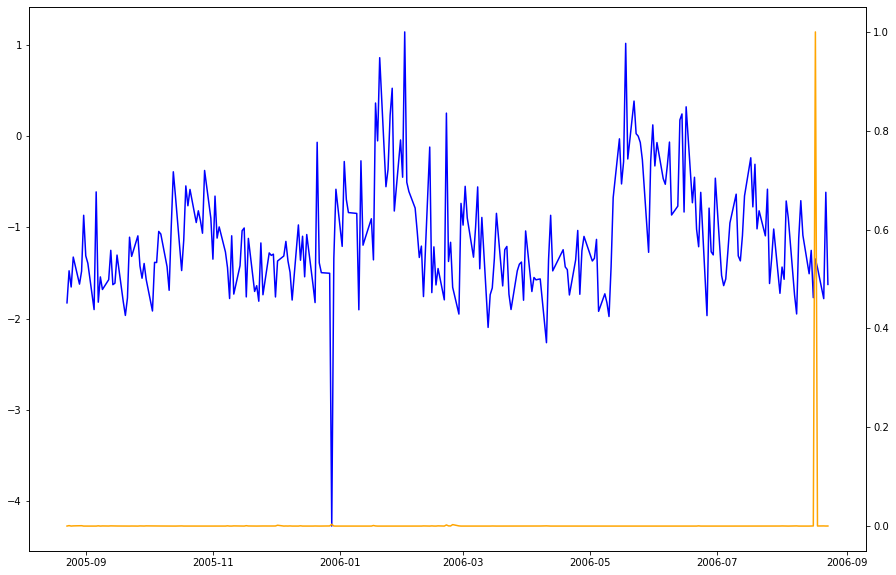

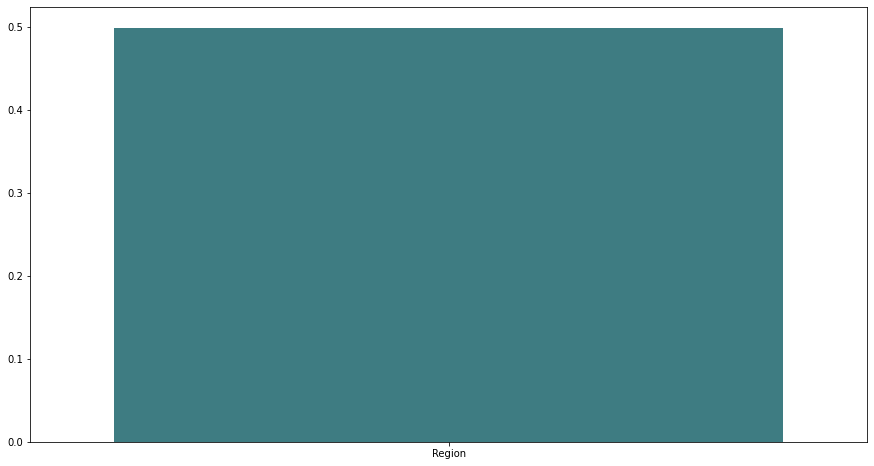

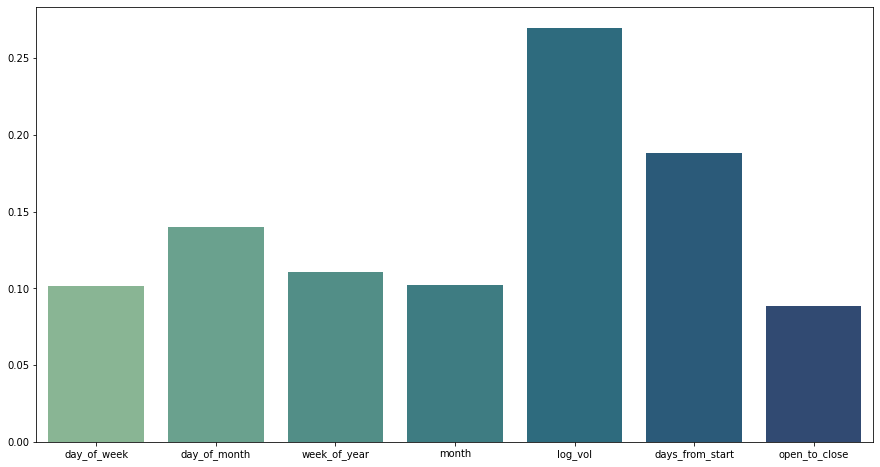

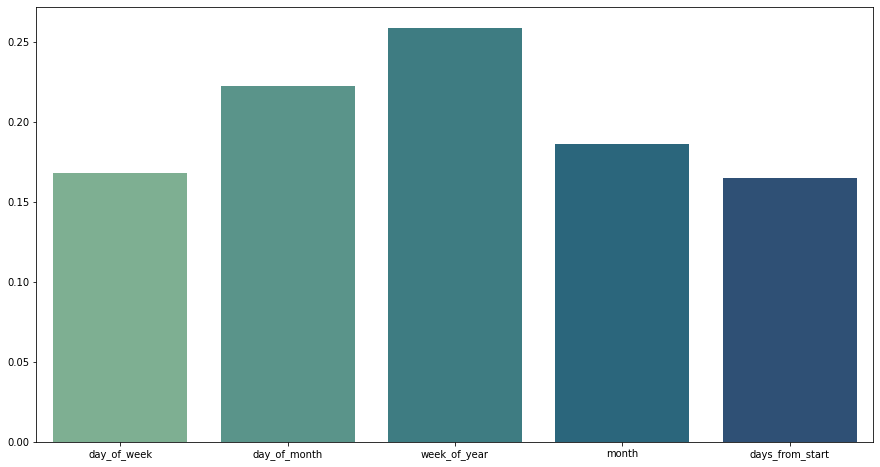


Plotting interpreation plots for a batch of entity 26:


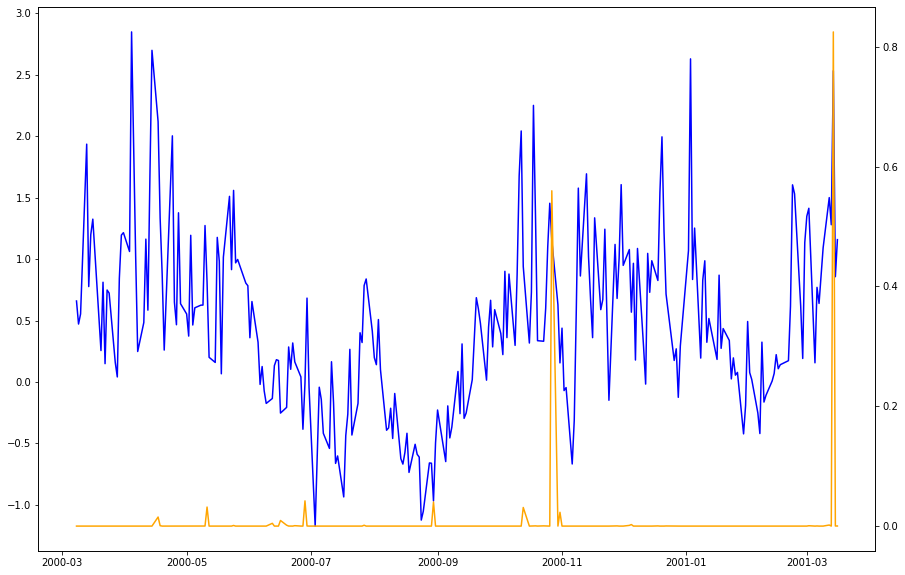

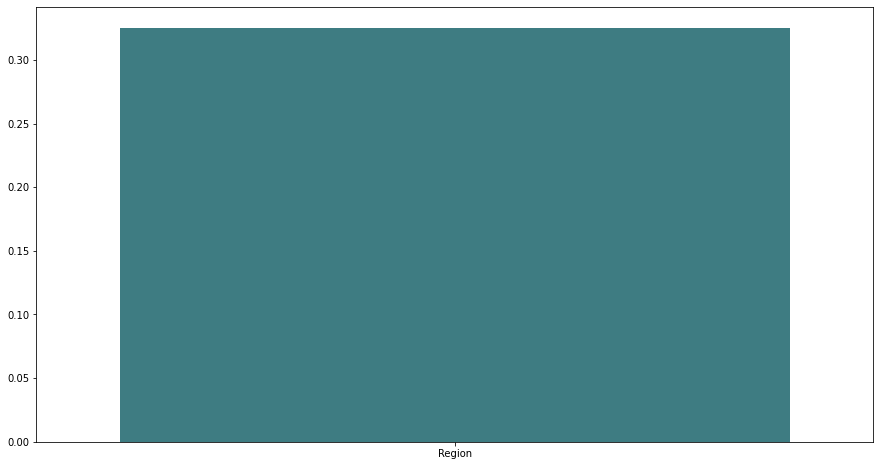

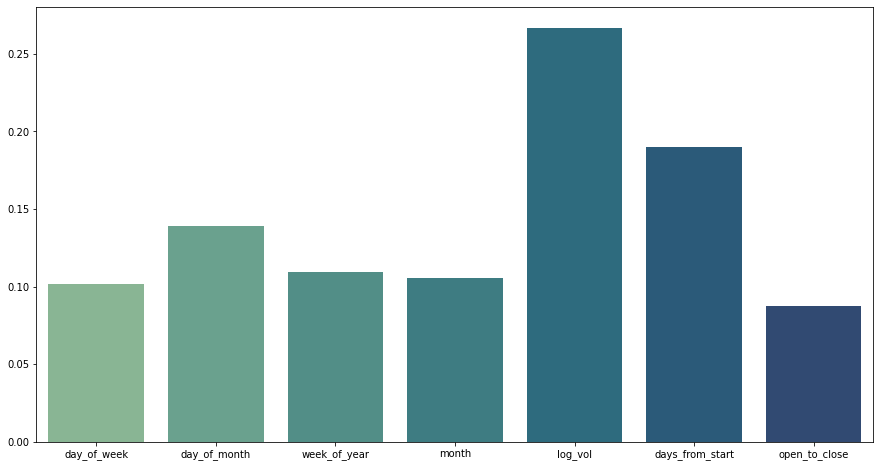

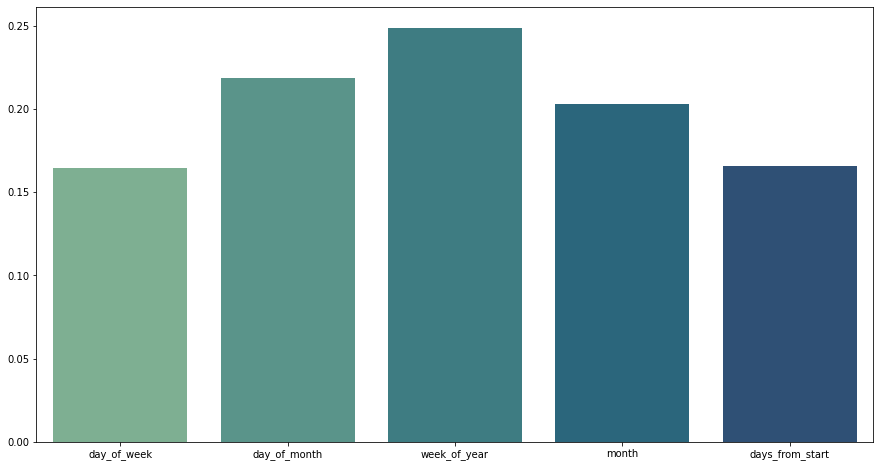


Plotting interpreation plots for a batch of entity 27:


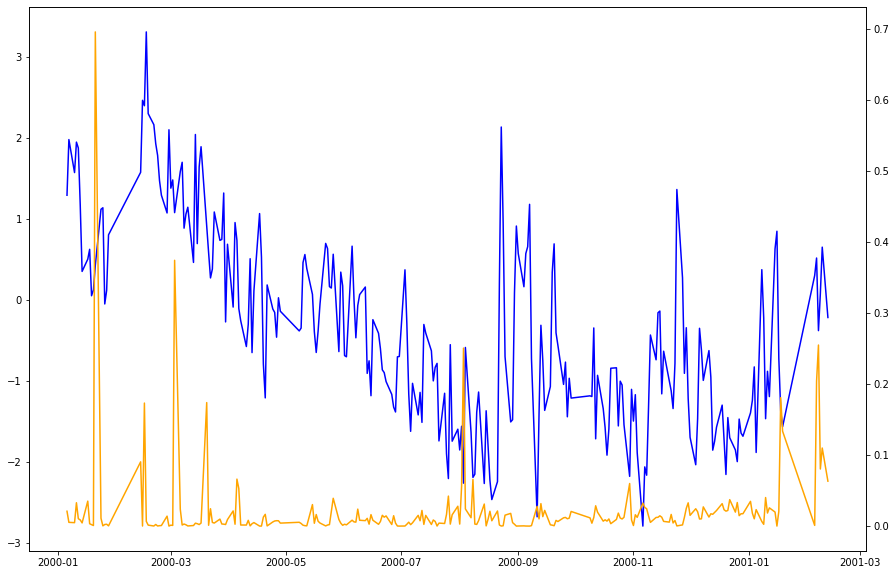

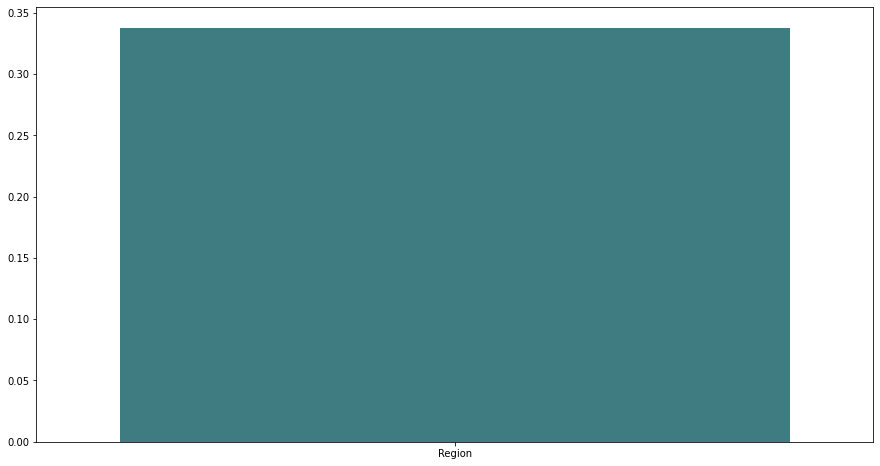

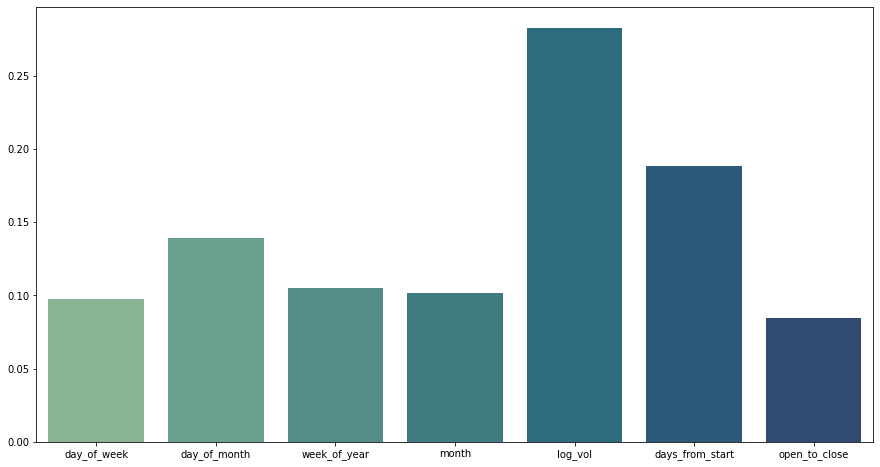

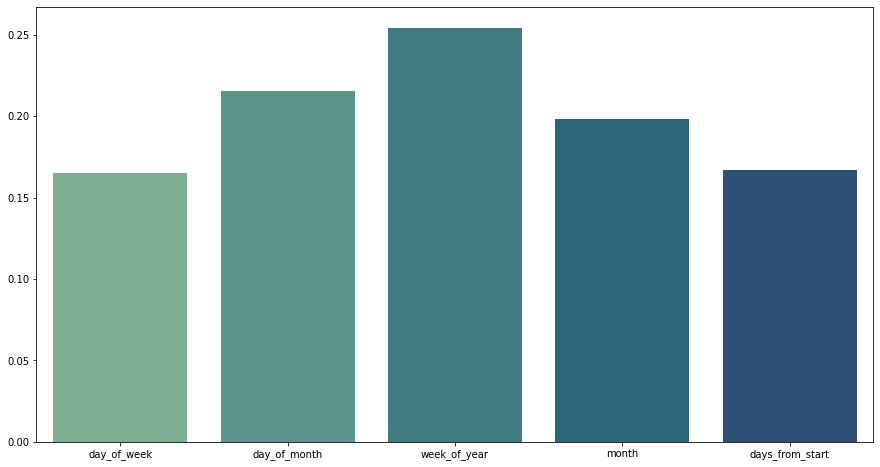


Plotting interpreation plots for a batch of entity 28:


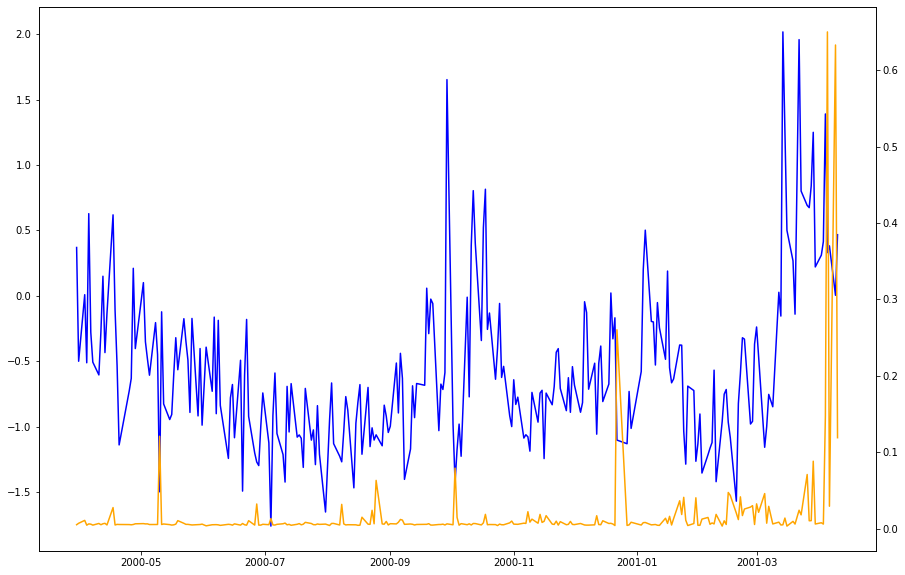

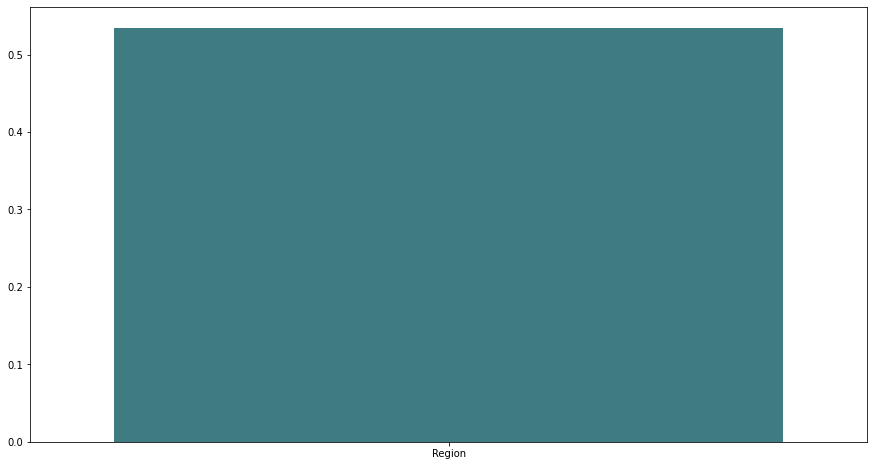

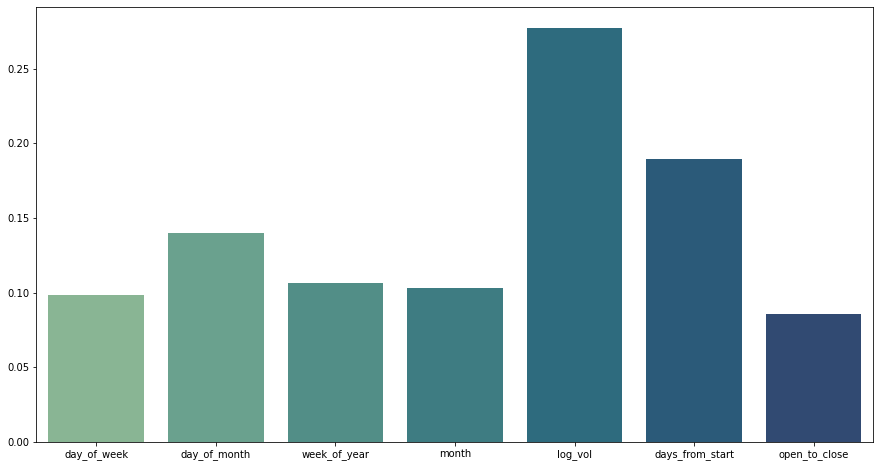

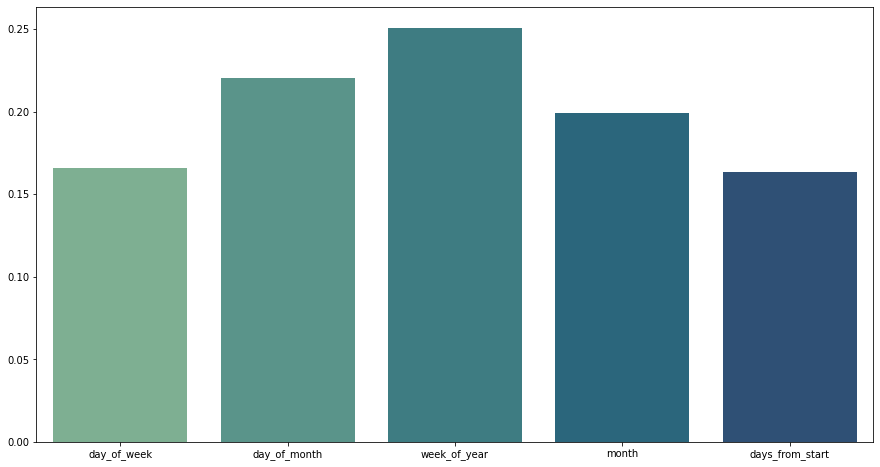


Plotting interpreation plots for a batch of entity 29:


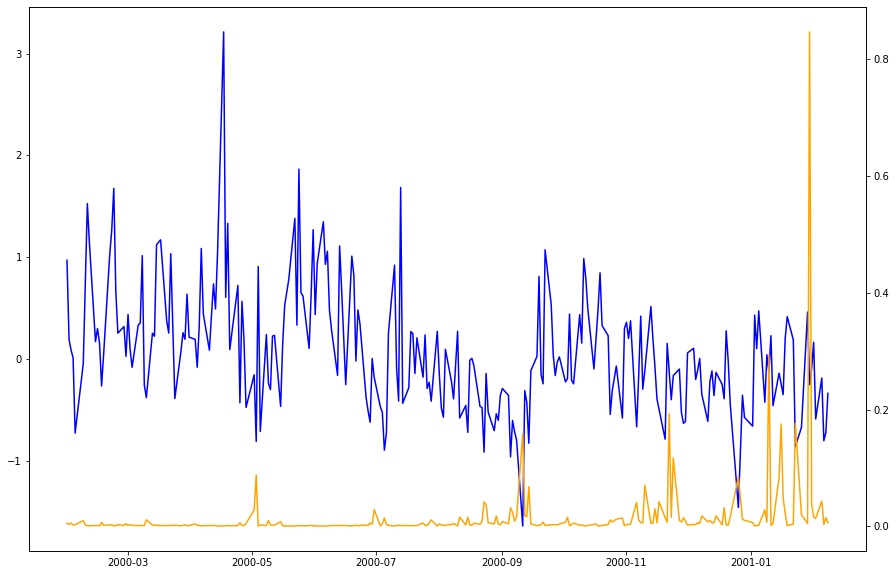

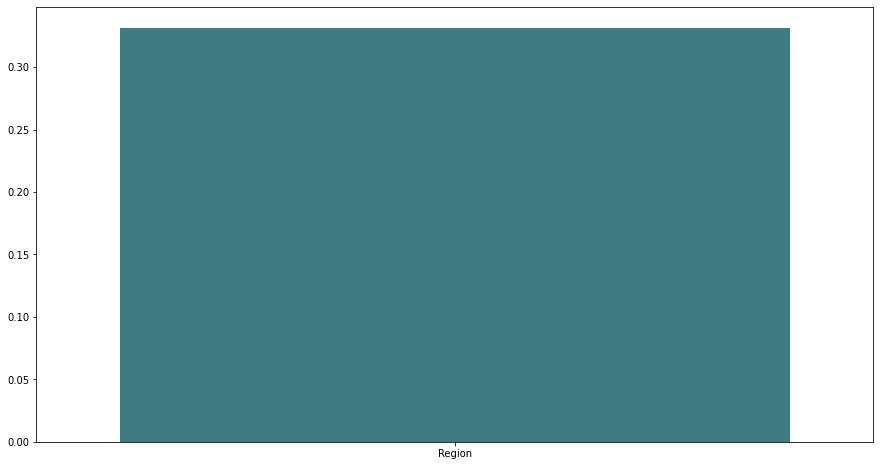

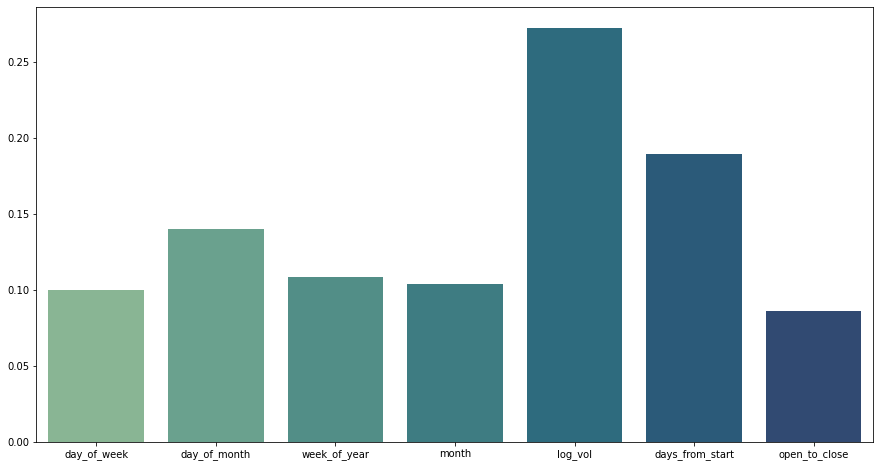

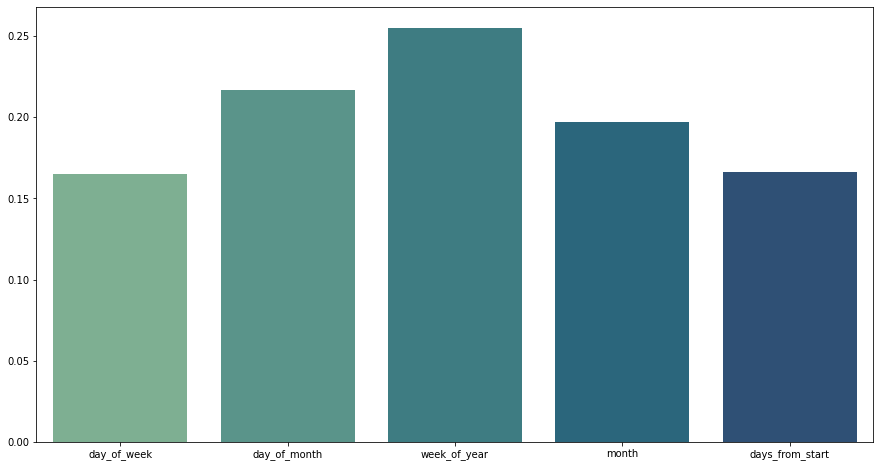


Plotting interpreation plots for a batch of entity 30:


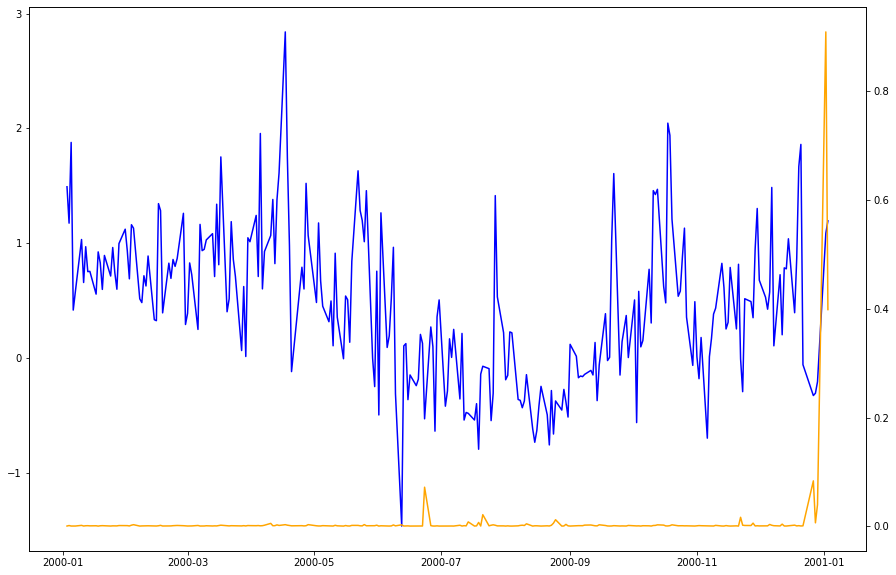

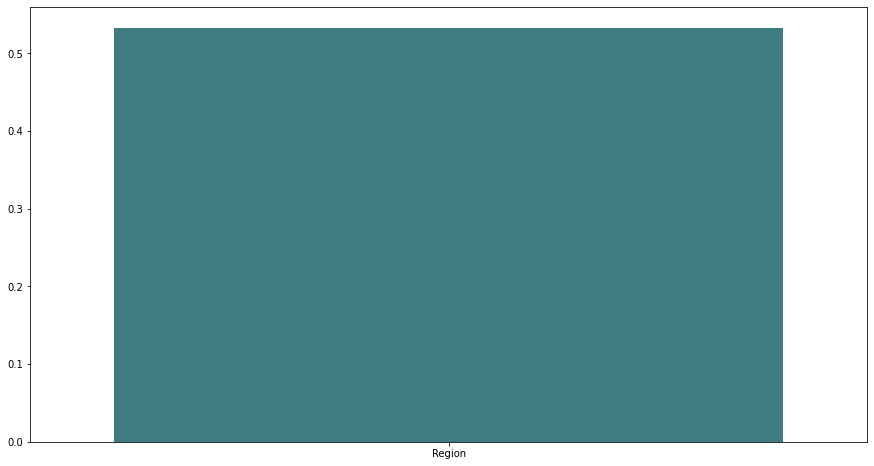

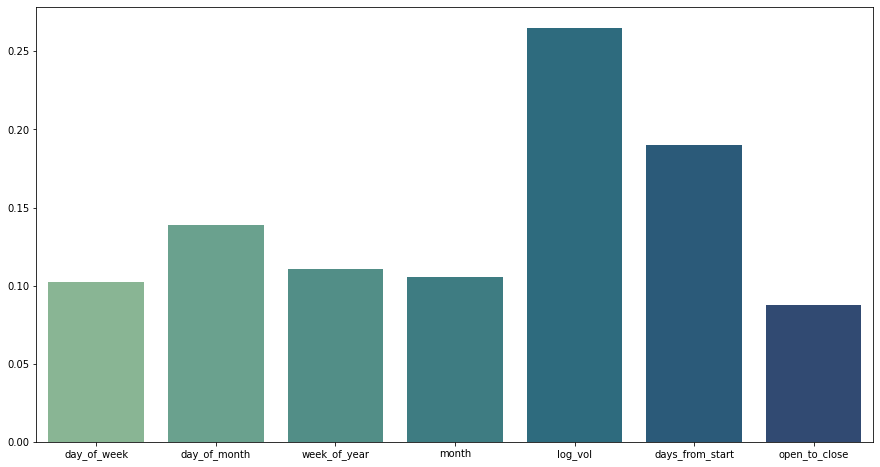

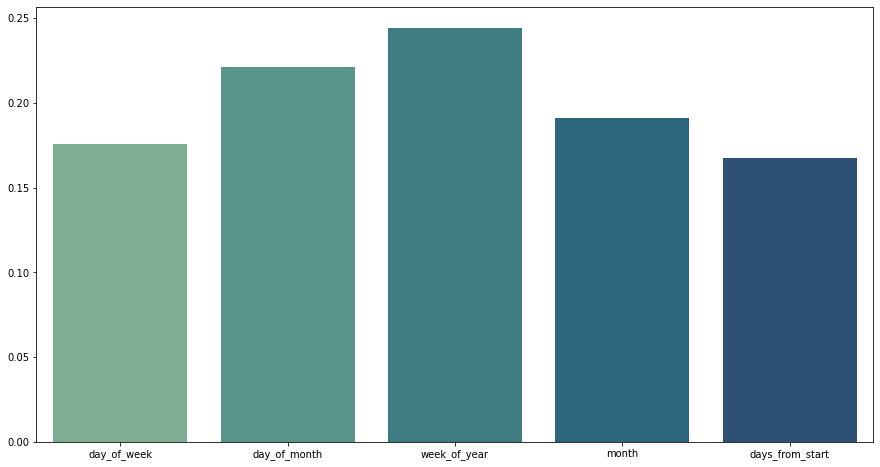

In [25]:
out_df = pd.DataFrame(columns=['p10', 'p50', 'p90', 'identifier'])

start_id = -1

for i, batch in enumerate(train_dataloader):

    outputs, attention_weights = model(batch)
    bs = batch["outputs"].shape[0]

    process_map = {f"p{int(q * 100)}": outputs.reshape(bs, 5, 3)[:, :, i].cpu().detach().numpy()[::5,:].reshape(-1)[:bs] for i, q in enumerate(QUANTILES)}

    tmp = pd.DataFrame(data=process_map, index=pd.to_datetime(batch['time'][:, ENCODER_STEPS - 1, 0]))
    tmp["labels"] = batch["outputs"].reshape(-1)[::5]
    tmp["identifier"] = batch['identifier'][:, 0, 0]
    
    out_df = pd.concat([out_df, tmp])
    
    e = int(batch['identifier'][0, 0, 0].numpy())
    if batch['identifier'][0, 0, 0].numpy() != start_id:
        
        print("="*20)
        print(f"Plotting interpreation plots for a batch of entity {e}:")
        
        id_mask = batch['identifier'][:, 0, 0]==e
        
        #print(id_mask)
        
        #Plotting multi-head attention
        plt.figure(figsize=(15,10))
        sns.lineplot(x=pd.to_datetime(batch["time"][0,:,0].numpy()),
                     y=batch["inputs"][0,:,0].numpy(), color="blue")
        ax2 = plt.twinx()
        #print(attention_weights)
        attn = attention_weights['multihead_attention'][0].cpu().detach().numpy().mean(axis=0)
        
        sns.lineplot(x=pd.to_datetime(batch["time"][0,:,0].numpy()),
                     y=attn/np.linalg.norm(attn),
                     ax=ax2, color="orange")
        plt.show()
        
        static_input = ["Region"]
        past_inputs = ["day_of_week", "day_of_month", "week_of_year", "month", 'log_vol', 'days_from_start', "open_to_close"]
        future_inputs = ["day_of_week", "day_of_month", "week_of_year", "month", "days_from_start"]
        
        stat = attention_weights['static_weights'].sum(dim=(1,0)).cpu().detach().numpy()
        past = attention_weights['past_weights'].sum(dim=(1,0)).cpu().detach().numpy()
        future = attention_weights['future_weights'].sum(dim=(1,0)).cpu().detach().numpy()
        
        #print('stat : ', stat)
        #print('past : ', past)
        #print('future : ', future)
        
        # Plotting static weights
        plt.figure(figsize=(15,8))
        sns.barplot(x=static_input, 
                    y=attention_weights['static_weights'].mean(dim=(0,1)).cpu().detach().numpy(), 
                    palette="crest")
        plt.show()
        
        # Plotting past weights
        plt.figure(figsize=(15,8))
        sns.barplot(x=past_inputs, 
                    y=attention_weights['past_weights'][id_mask,:,:].mean(dim=(0,1)).cpu().detach().numpy(), 
                    palette="crest")
        plt.show()

        # Plotting future weights
        plt.figure(figsize=(15,8))
        sns.barplot(x=future_inputs, 
                    y=attention_weights['future_weights'][id_mask,:,:].mean(dim=(0,1)).cpu().detach().numpy(), 
                    palette="crest")
        plt.show()
        start_id = e
        print()

## Validation Interpretation

Plotting interpreation plots for a batch of entity 0:


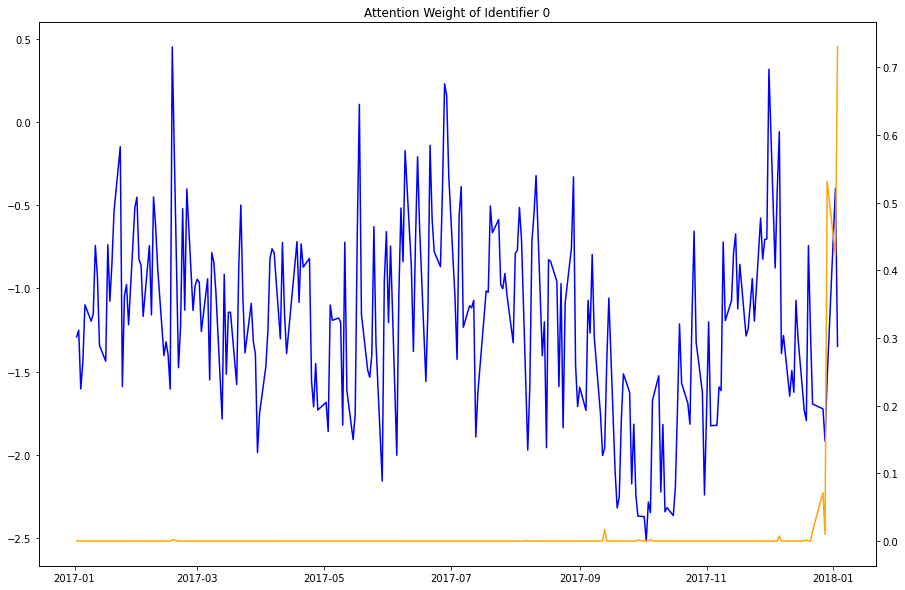

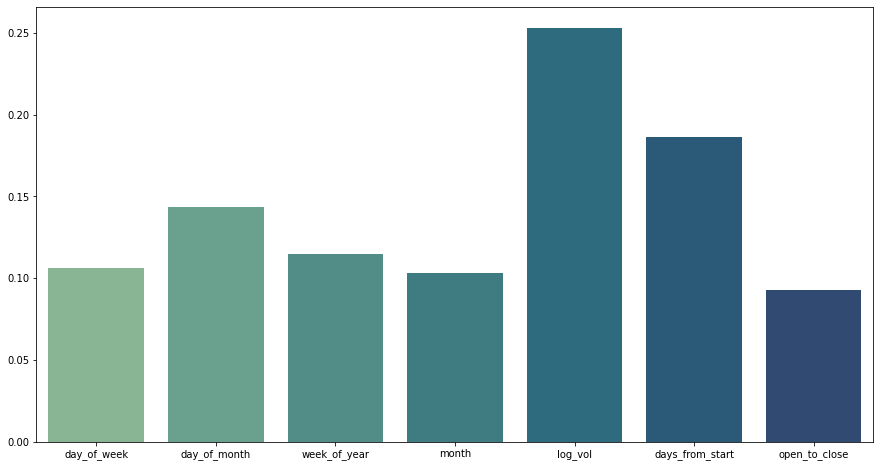

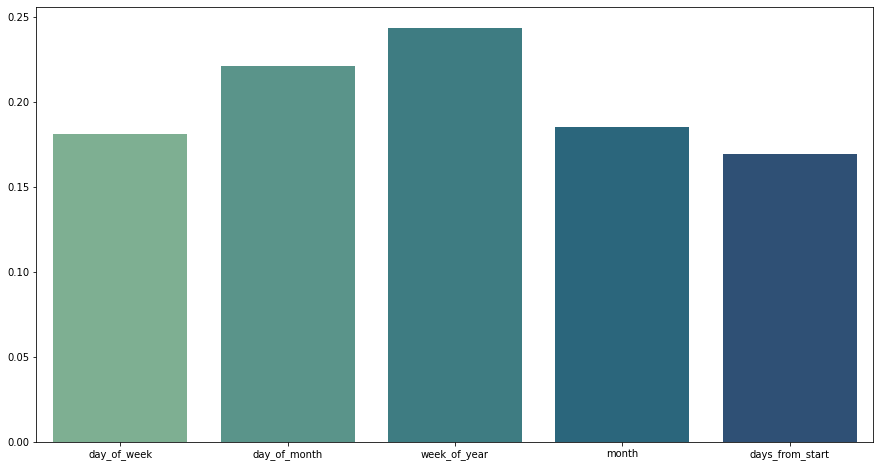


Plotting interpreation plots for a batch of entity 1:


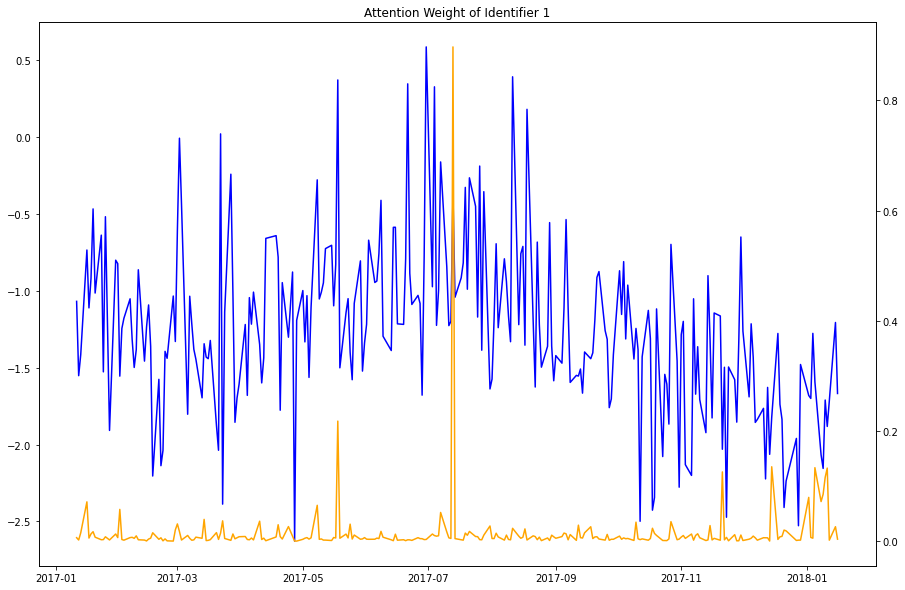

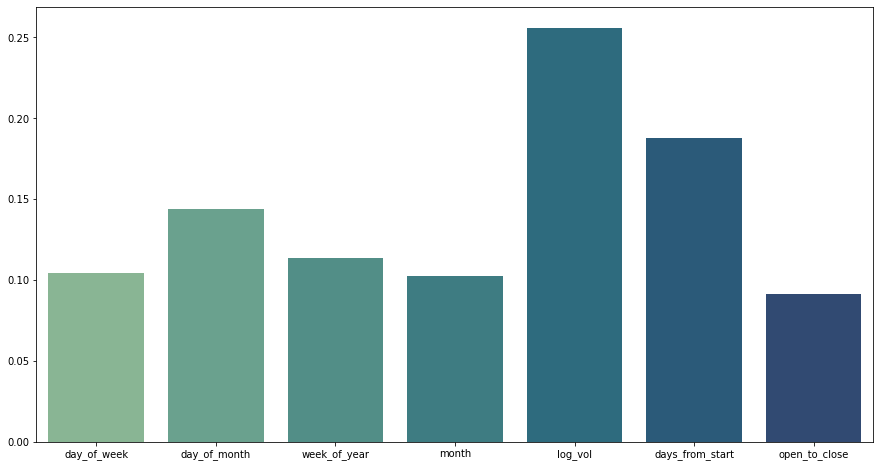

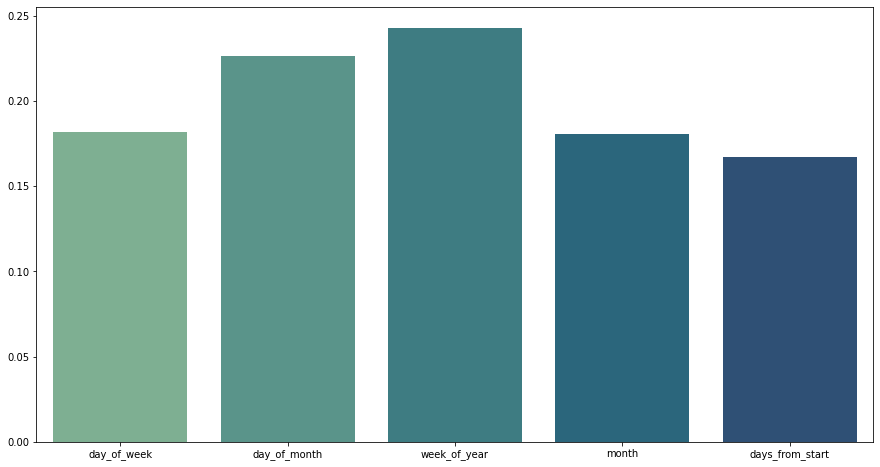


Plotting interpreation plots for a batch of entity 2:


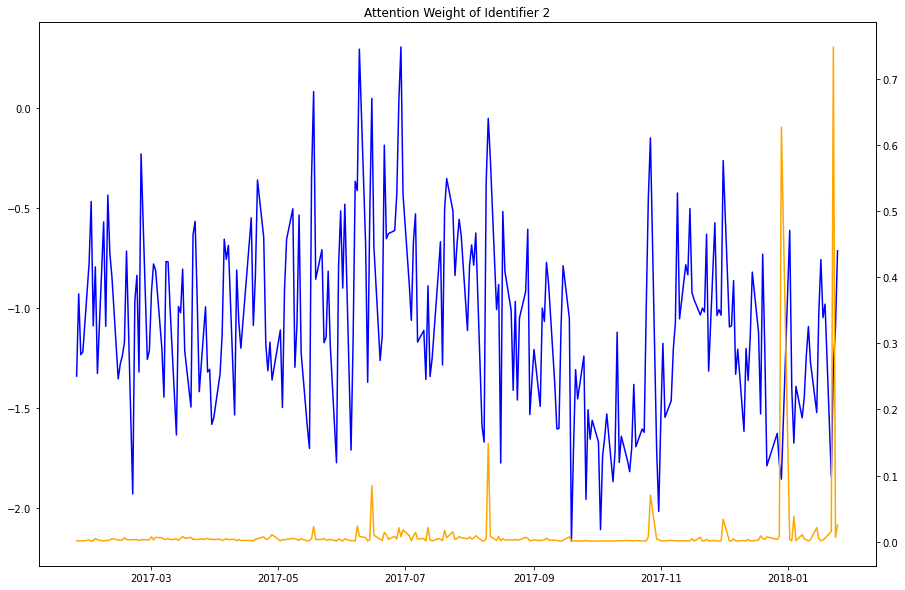

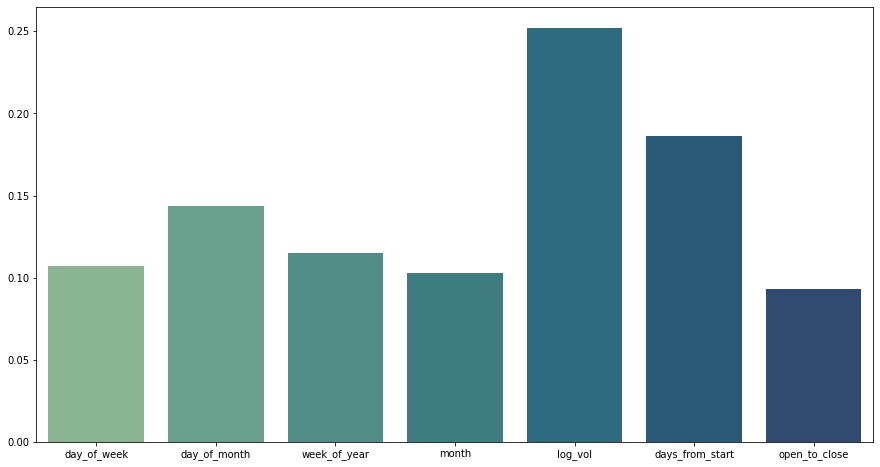

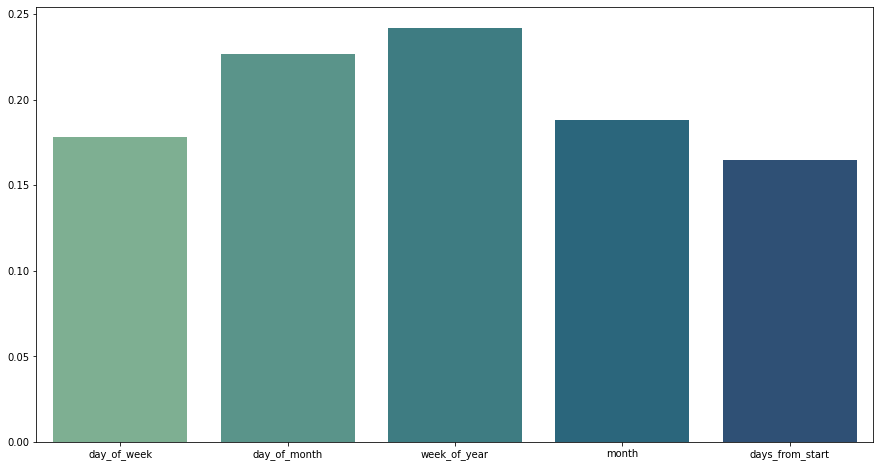


Plotting interpreation plots for a batch of entity 3:


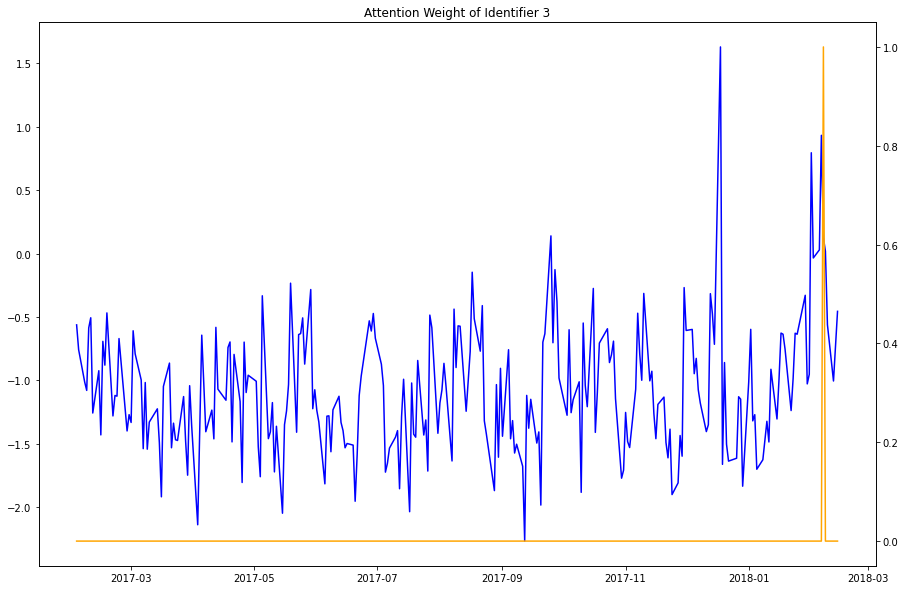

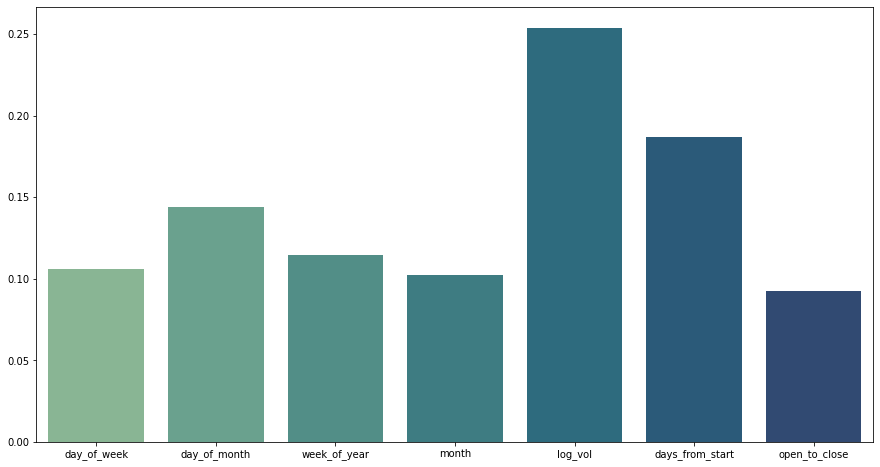

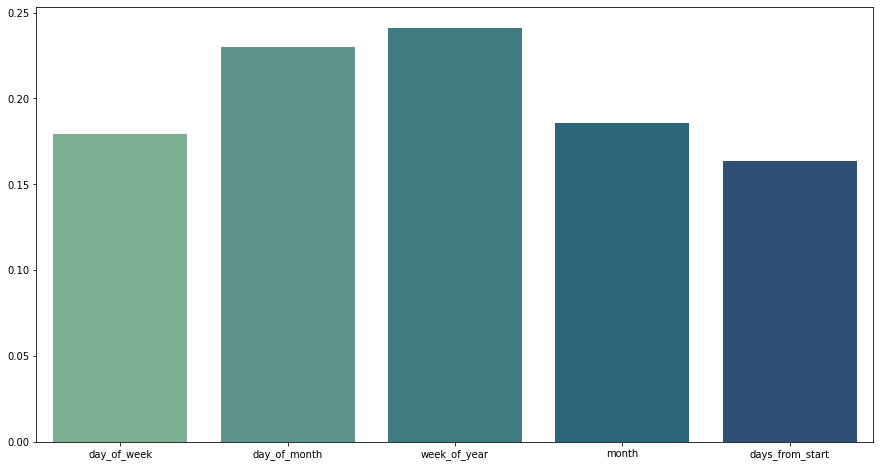


Plotting interpreation plots for a batch of entity 4:


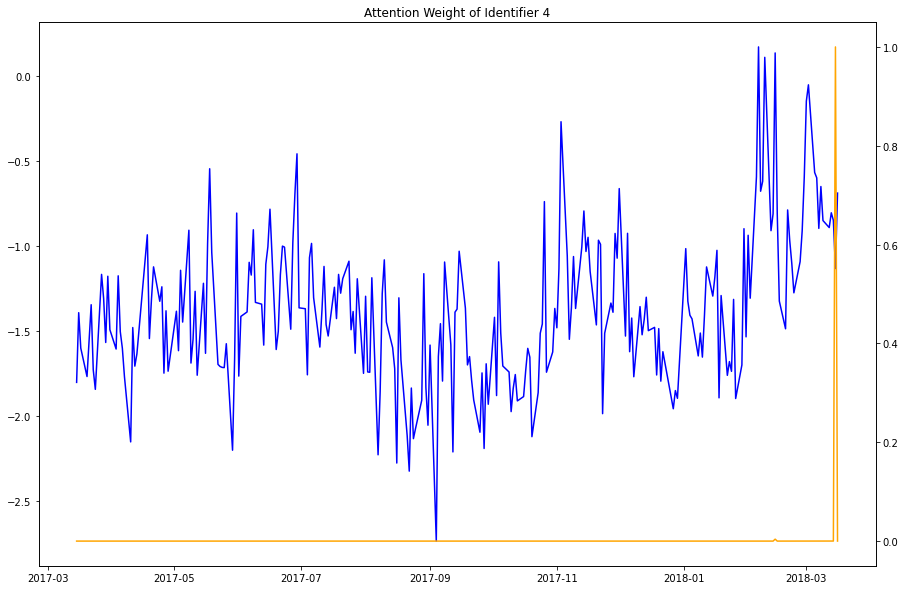

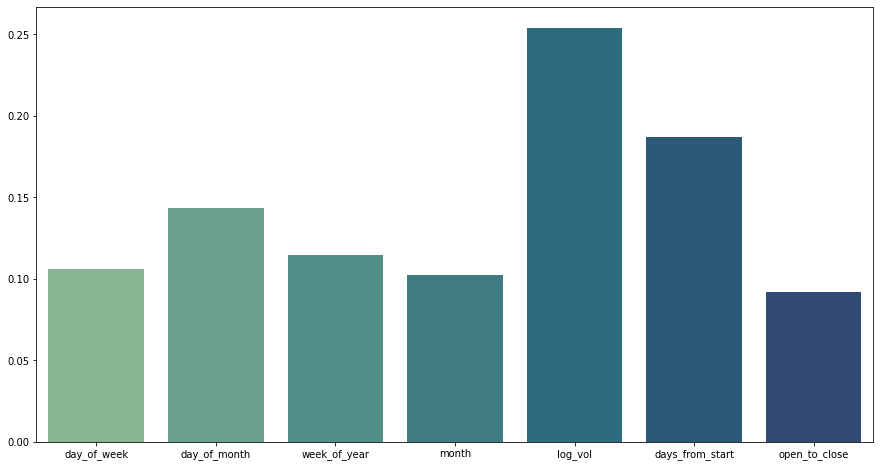

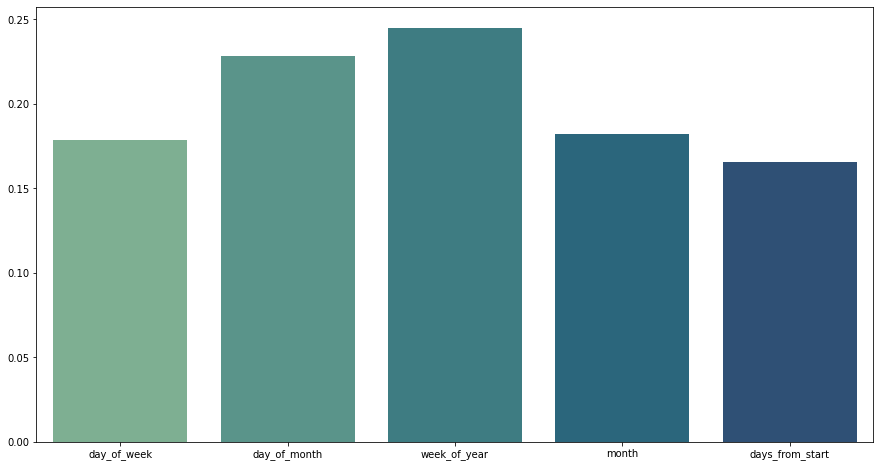


Plotting interpreation plots for a batch of entity 5:


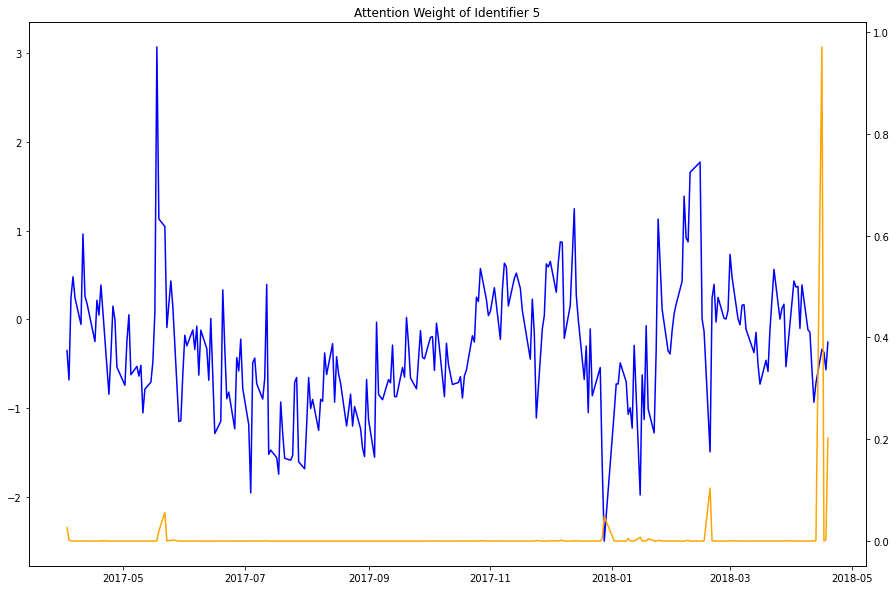

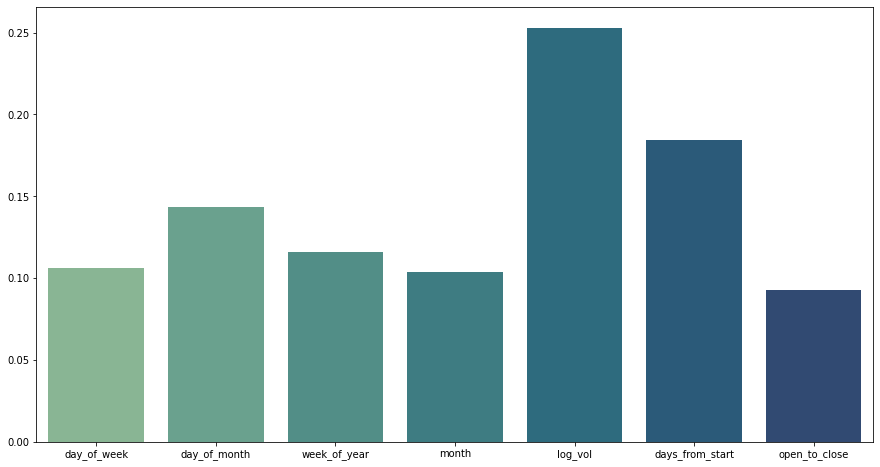

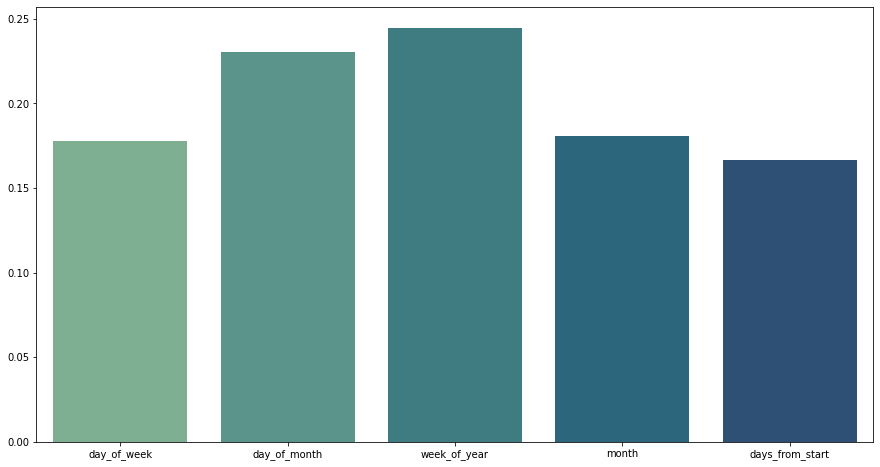


Plotting interpreation plots for a batch of entity 6:


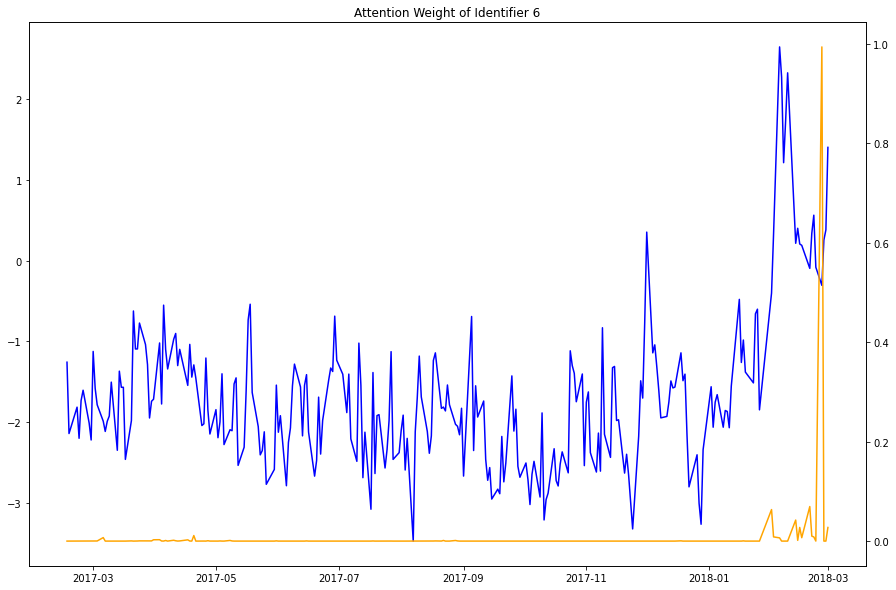

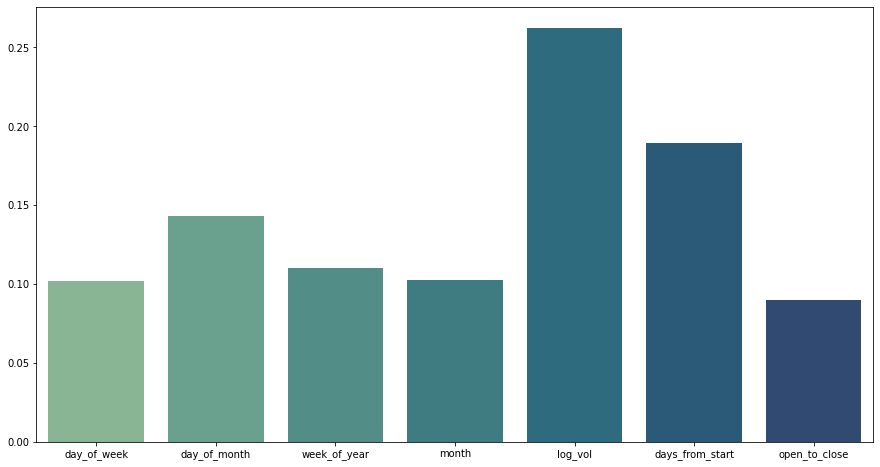

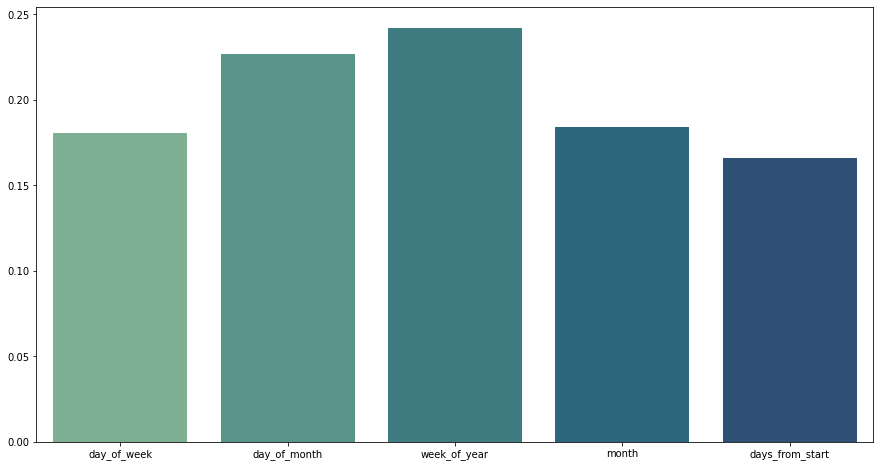


Plotting interpreation plots for a batch of entity 7:


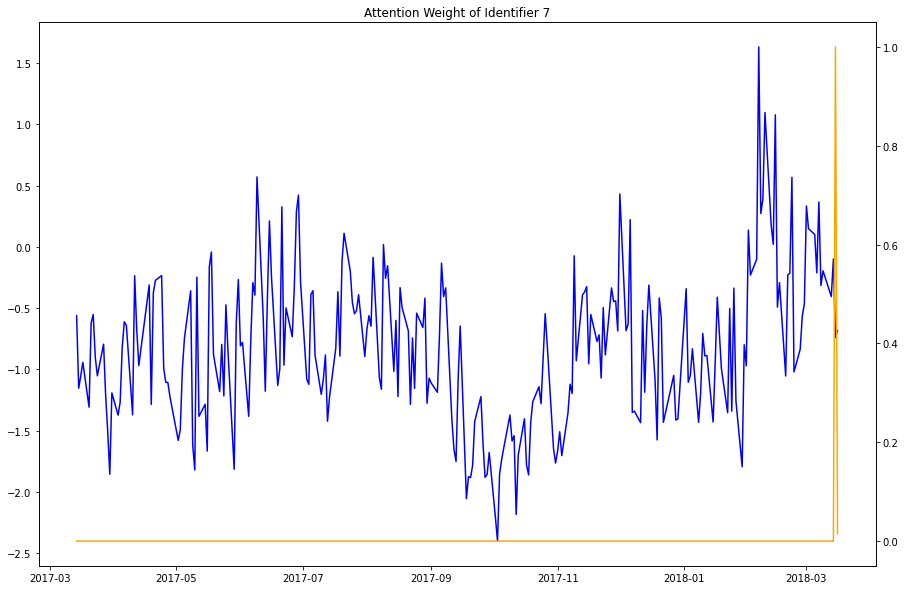

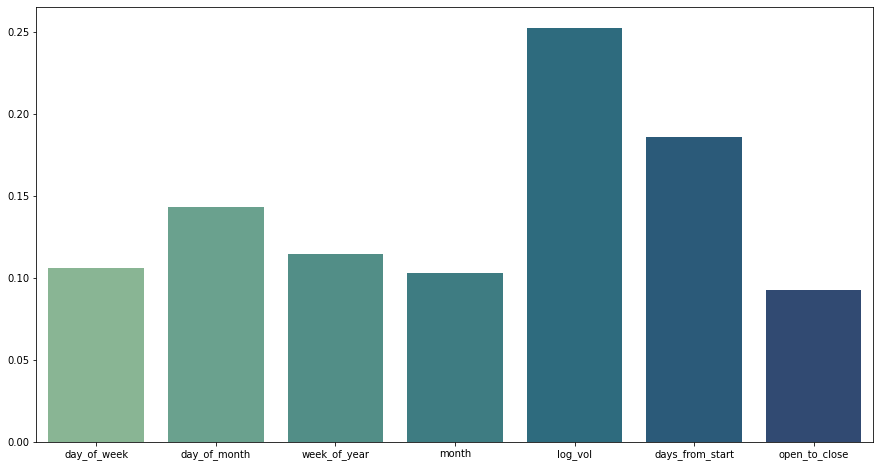

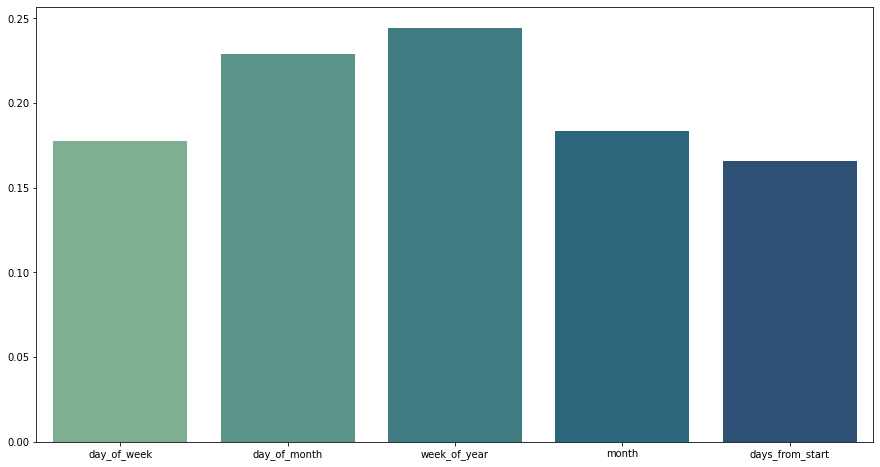


Plotting interpreation plots for a batch of entity 8:


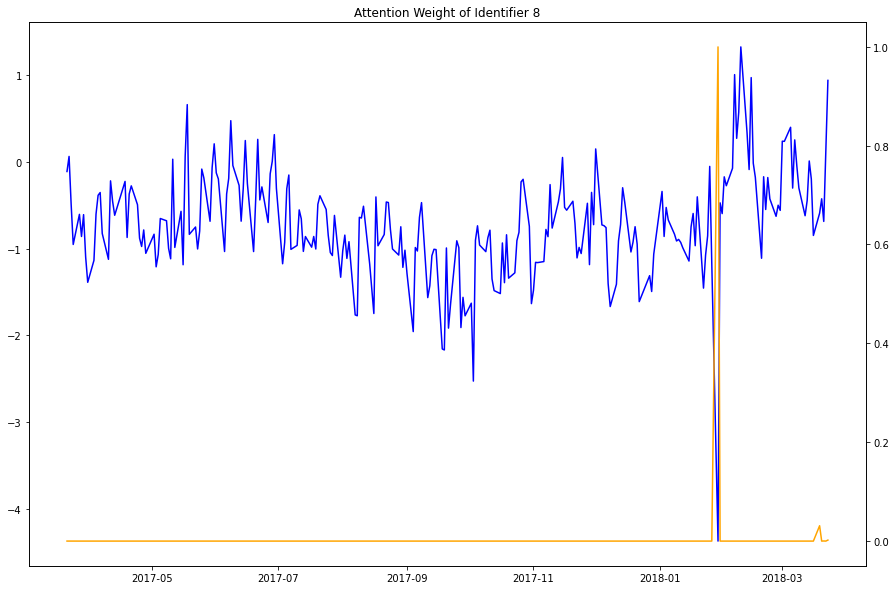

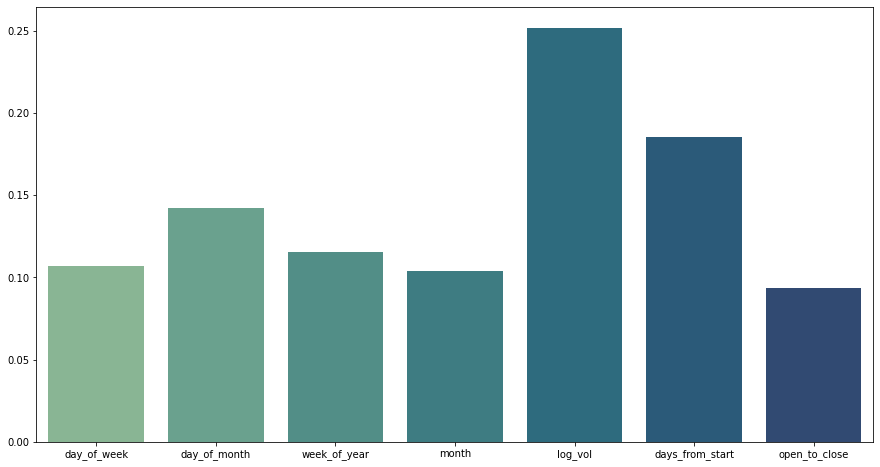

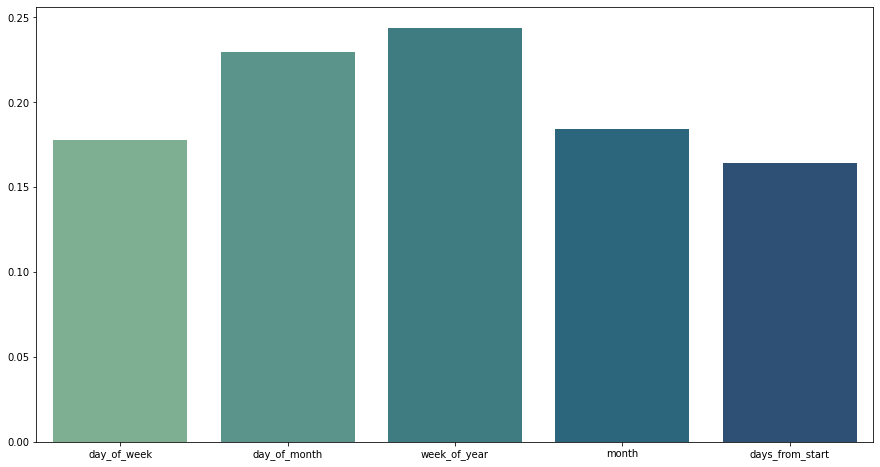


Plotting interpreation plots for a batch of entity 9:


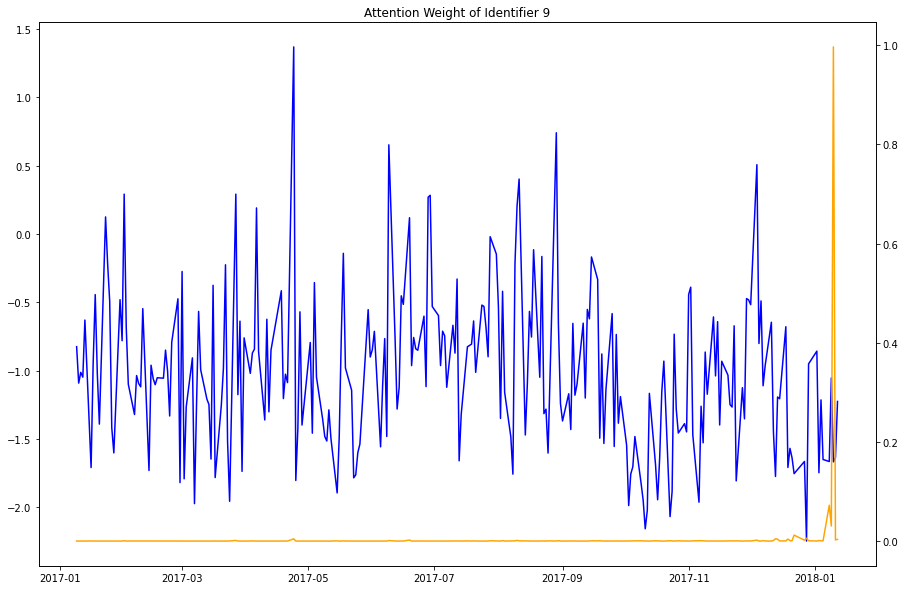

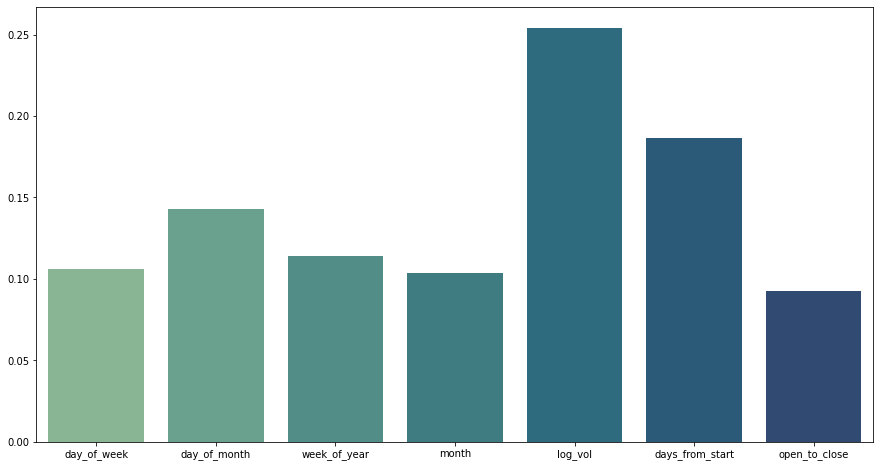

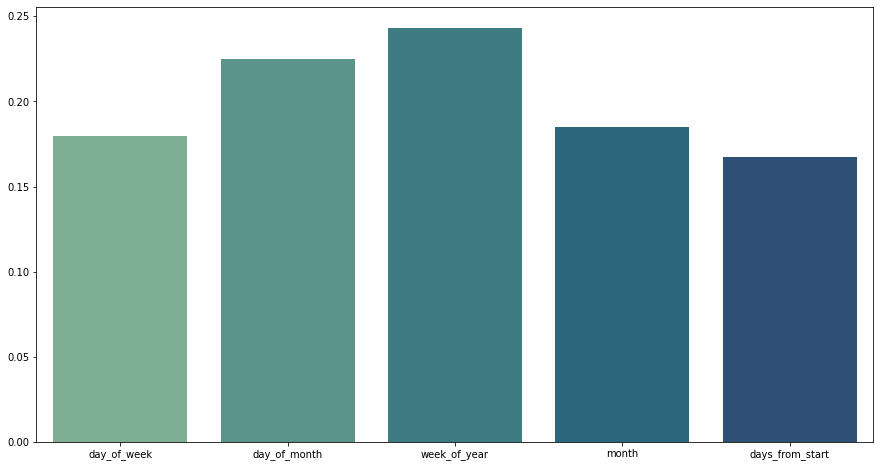


Plotting interpreation plots for a batch of entity 10:


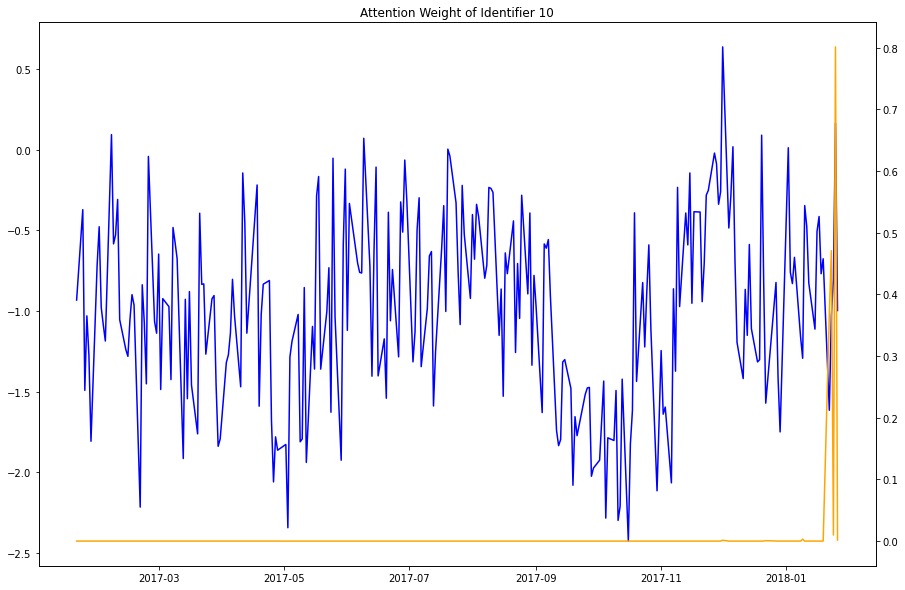

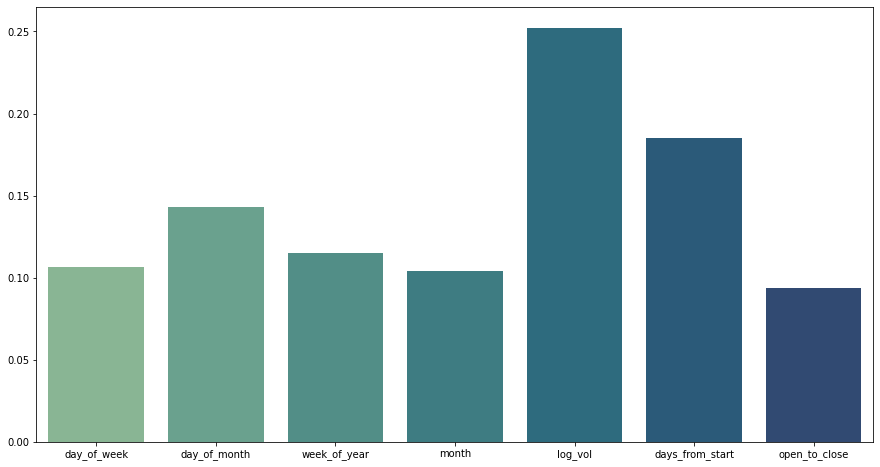

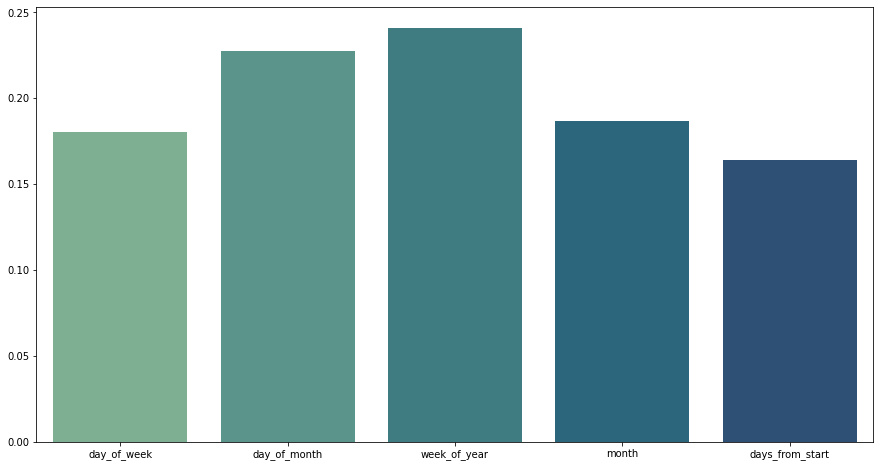


Plotting interpreation plots for a batch of entity 11:


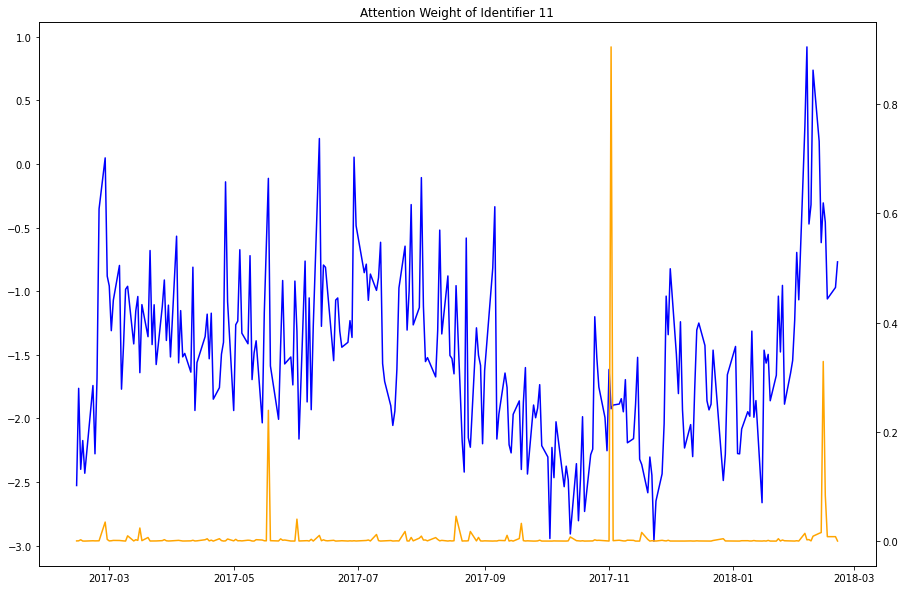

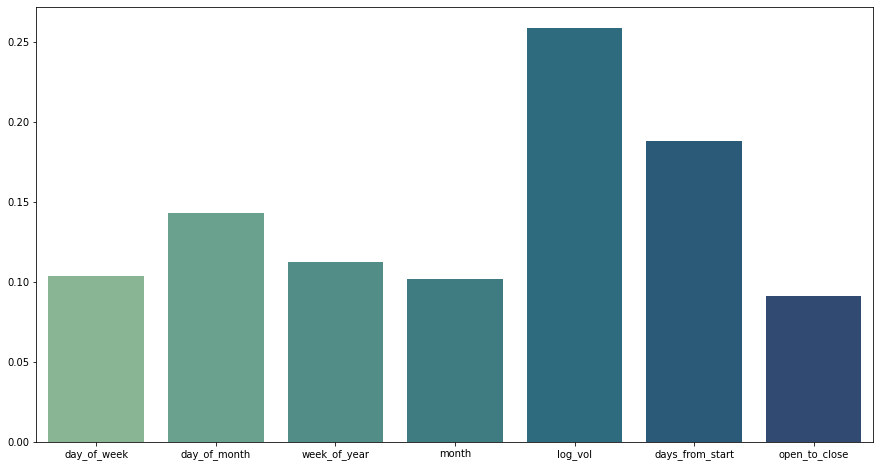

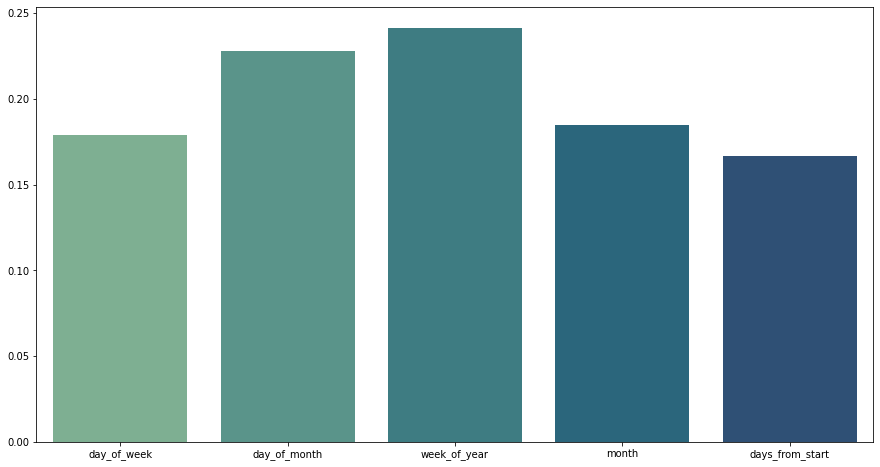


Plotting interpreation plots for a batch of entity 12:


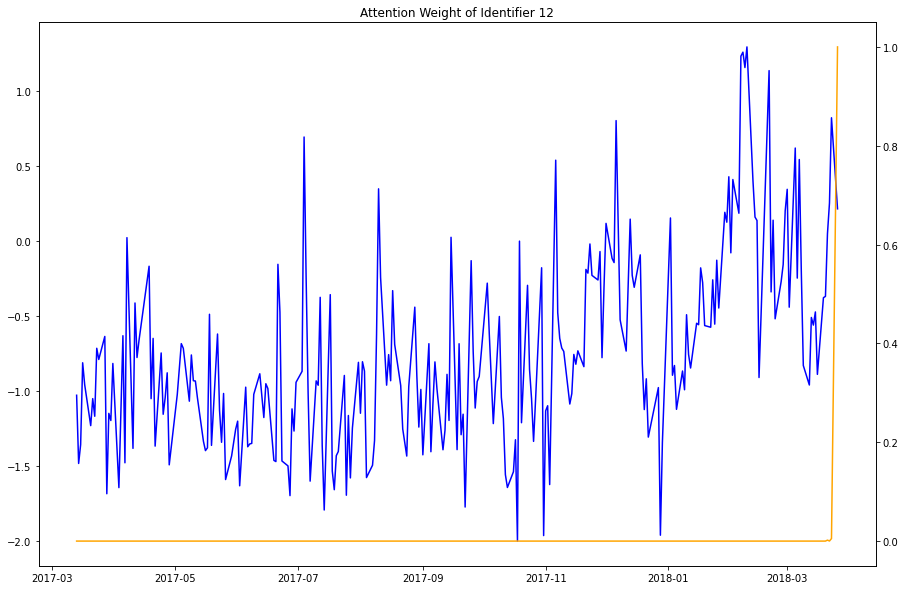

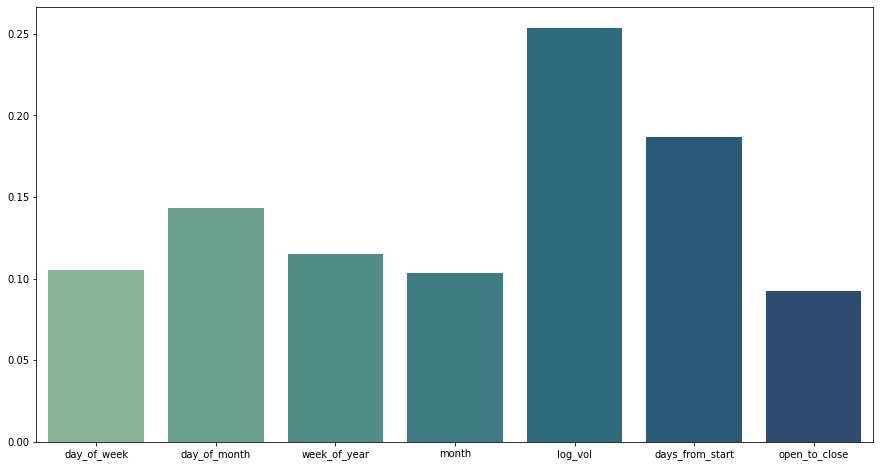

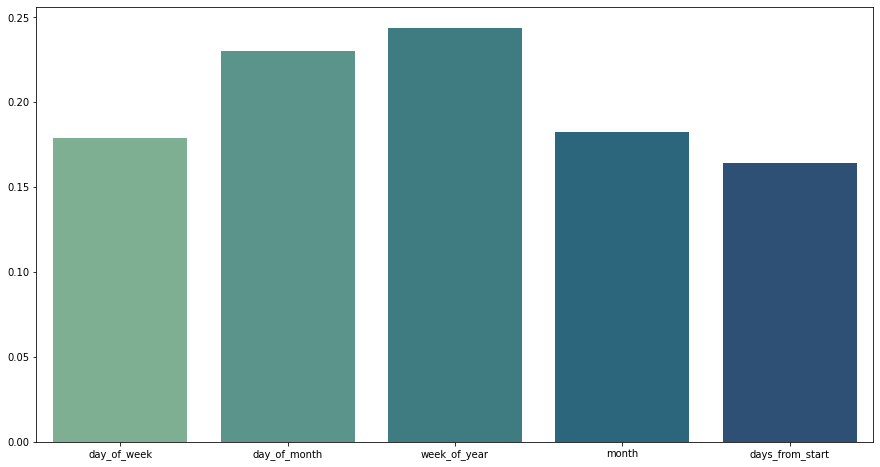


Plotting interpreation plots for a batch of entity 13:


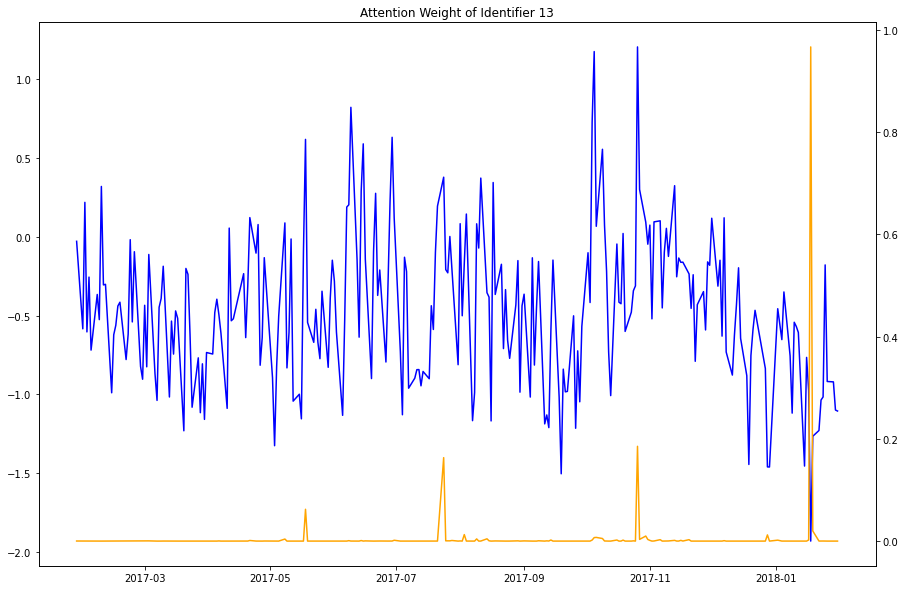

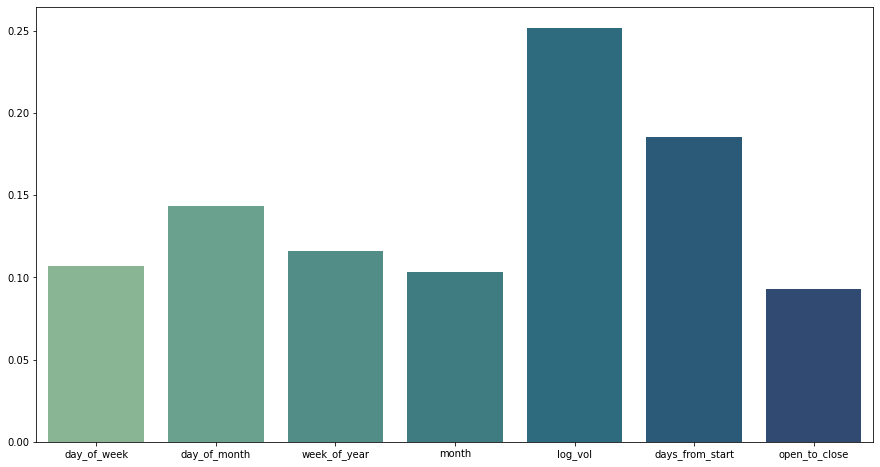

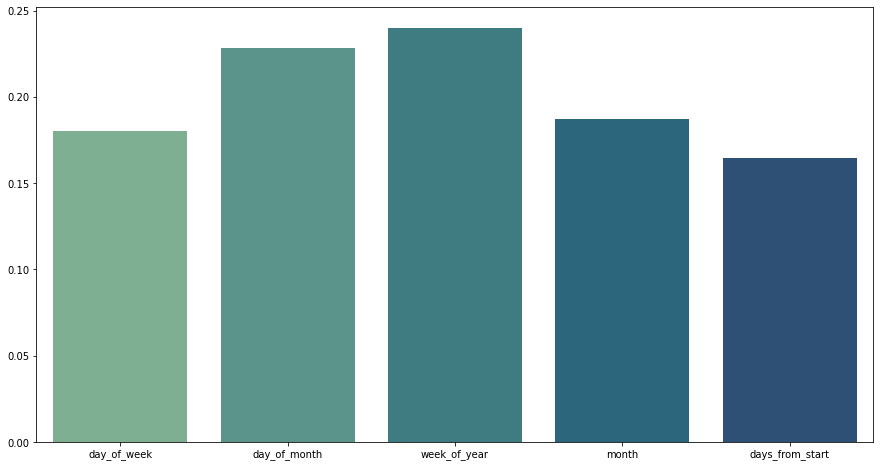


Plotting interpreation plots for a batch of entity 14:


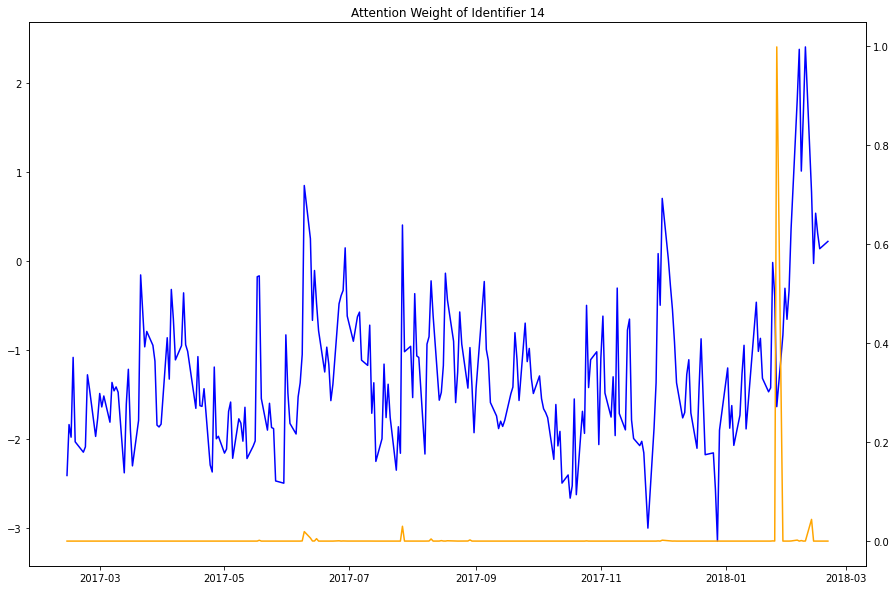

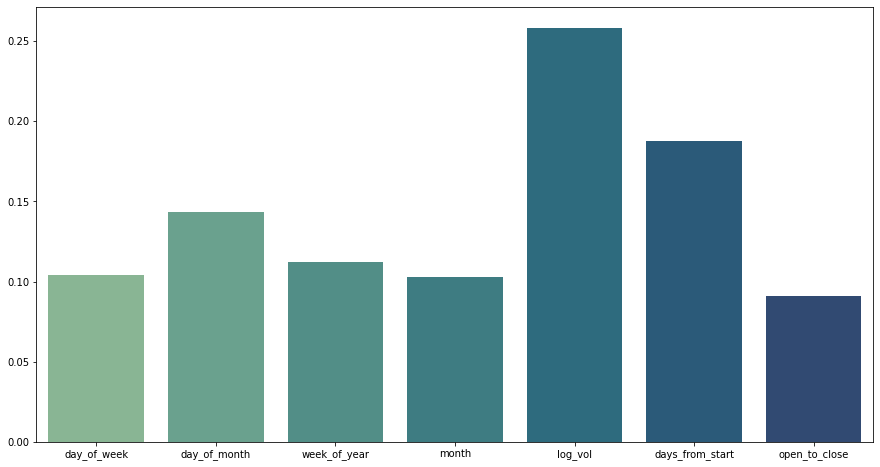

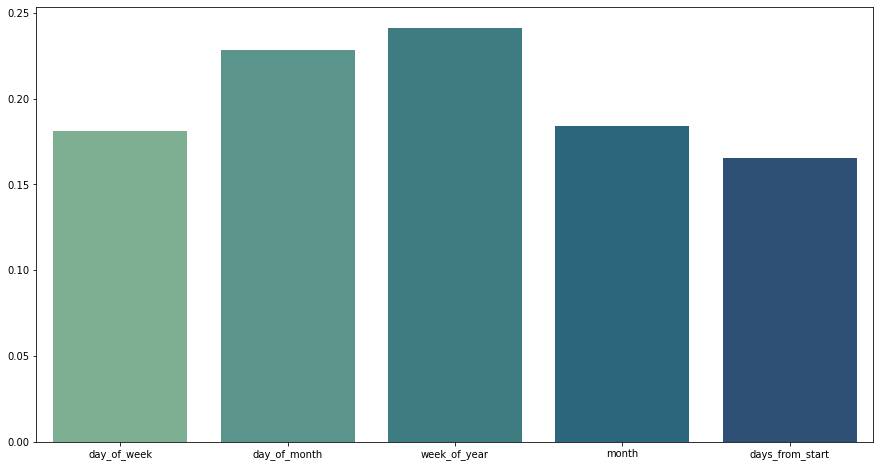


Plotting interpreation plots for a batch of entity 15:


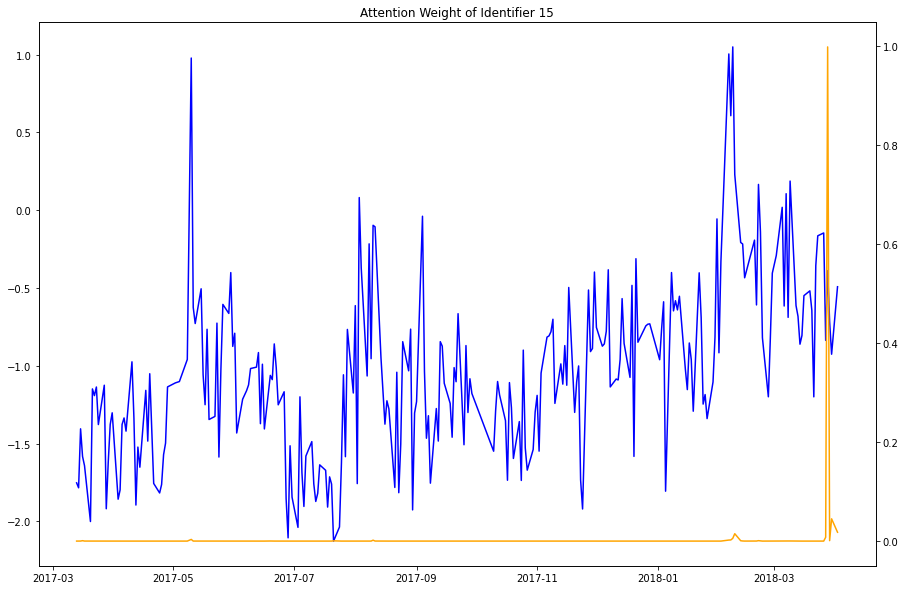

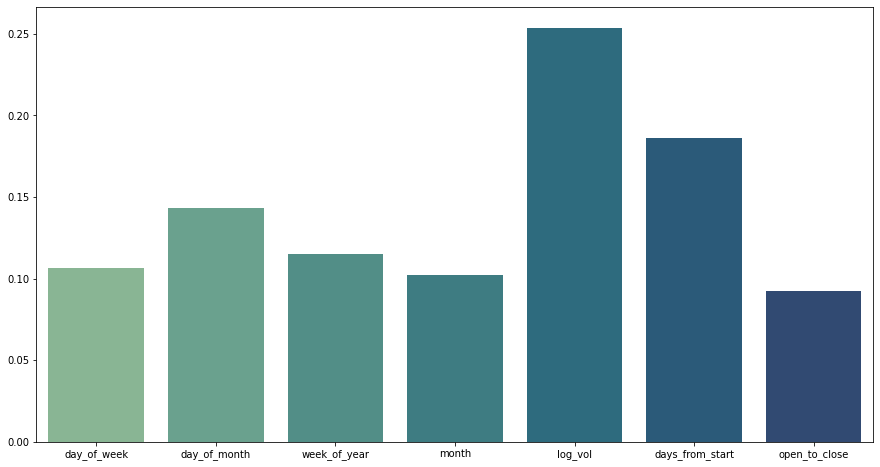

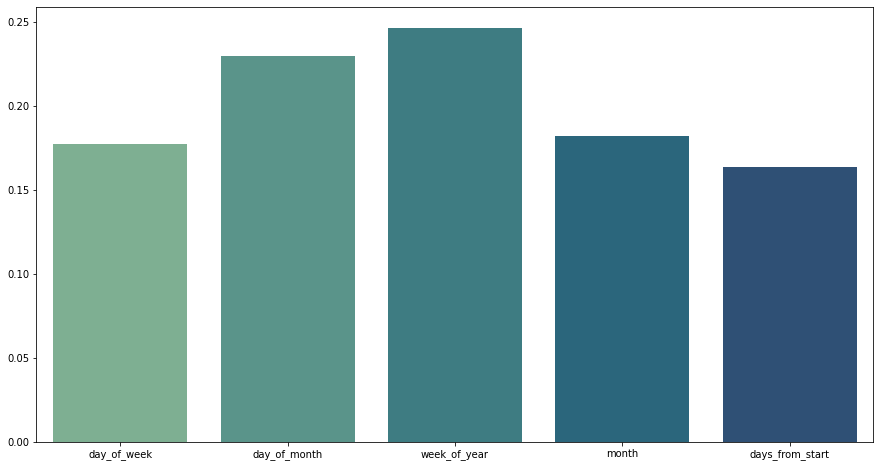


Plotting interpreation plots for a batch of entity 16:


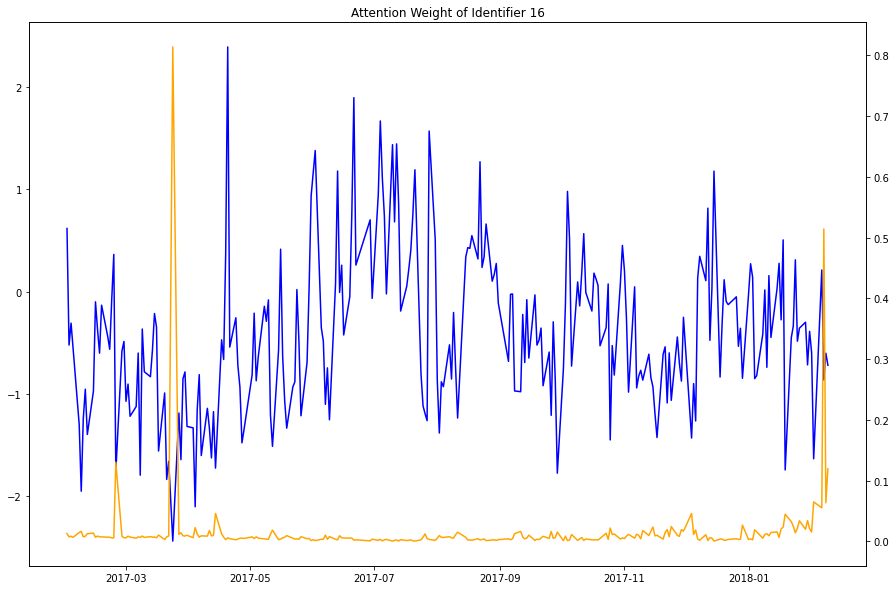

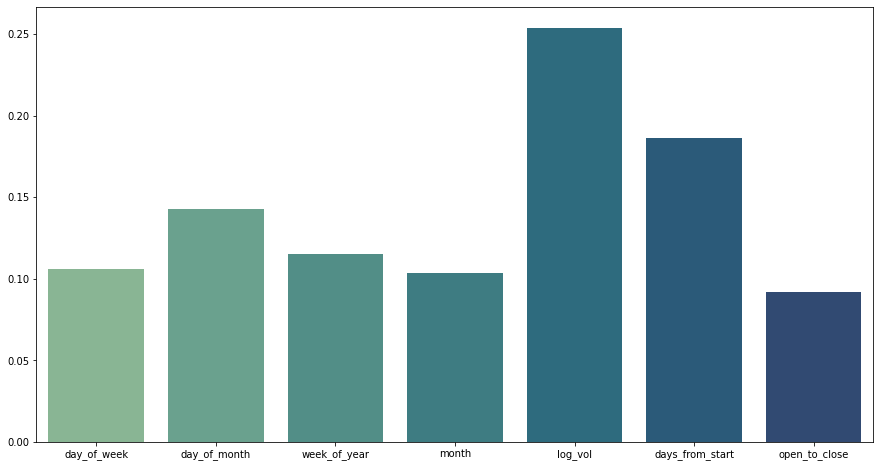

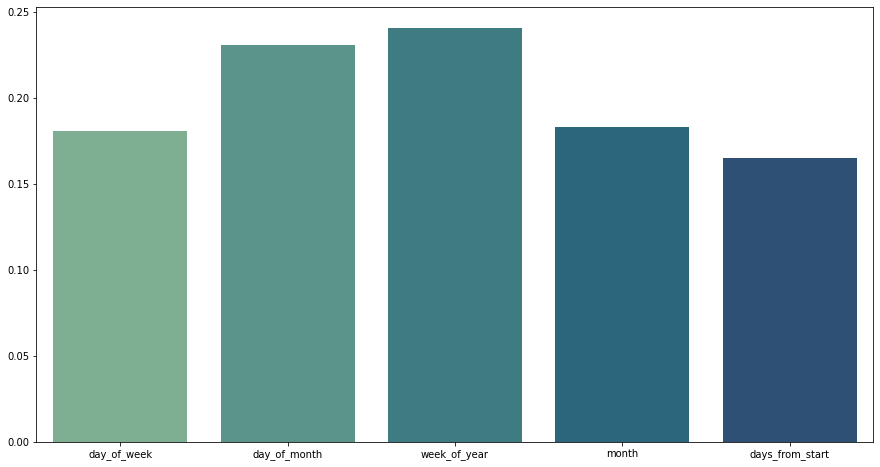


Plotting interpreation plots for a batch of entity 17:


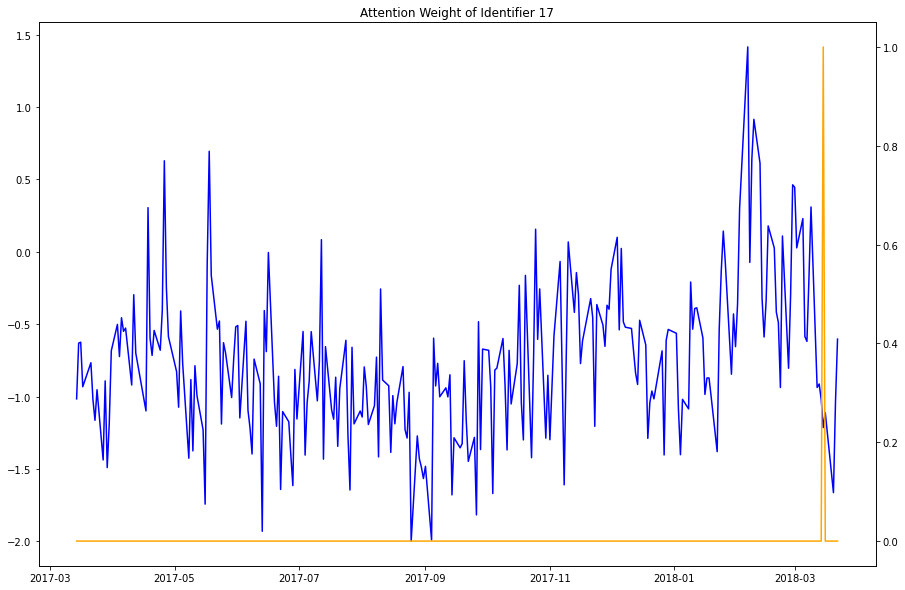

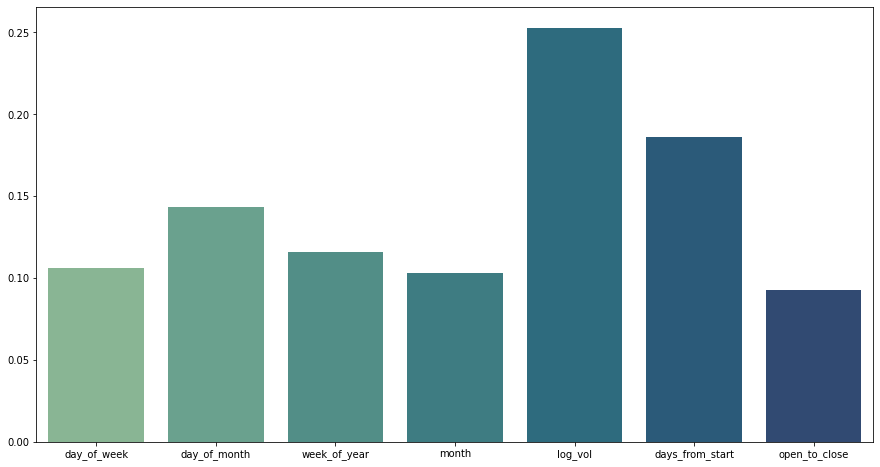

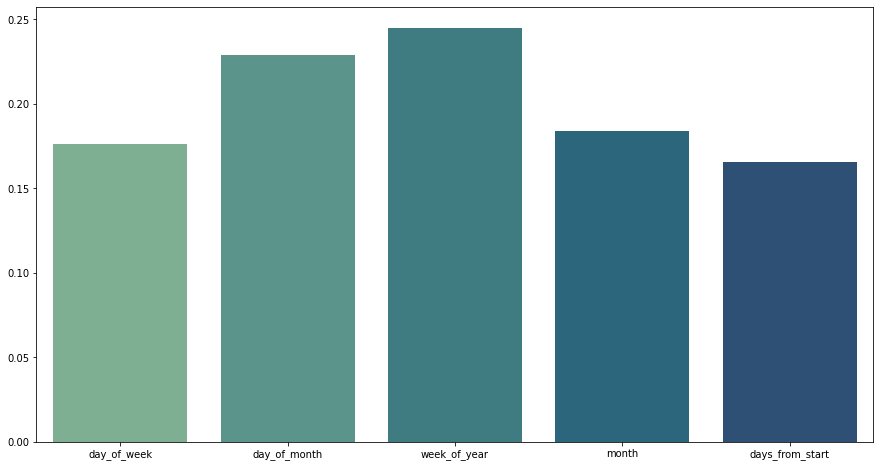


Plotting interpreation plots for a batch of entity 18:


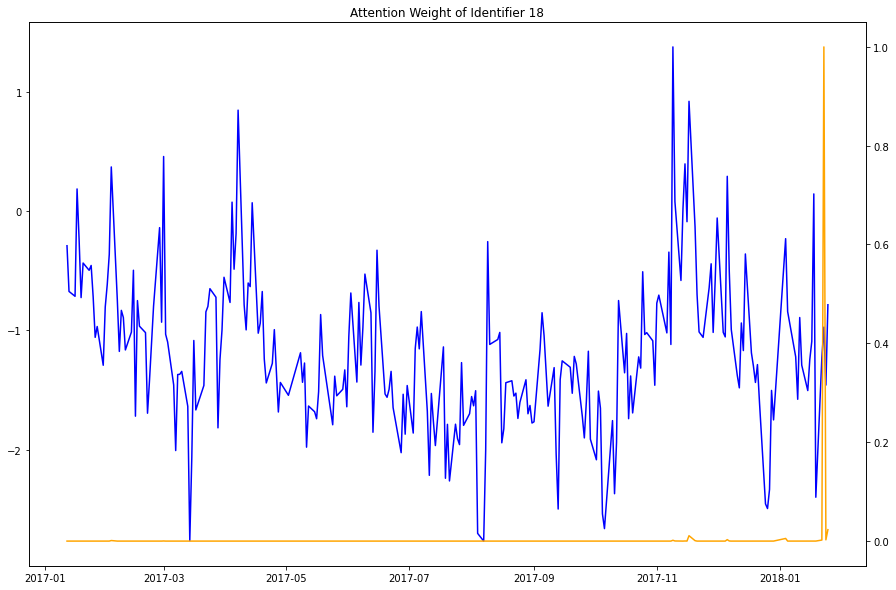

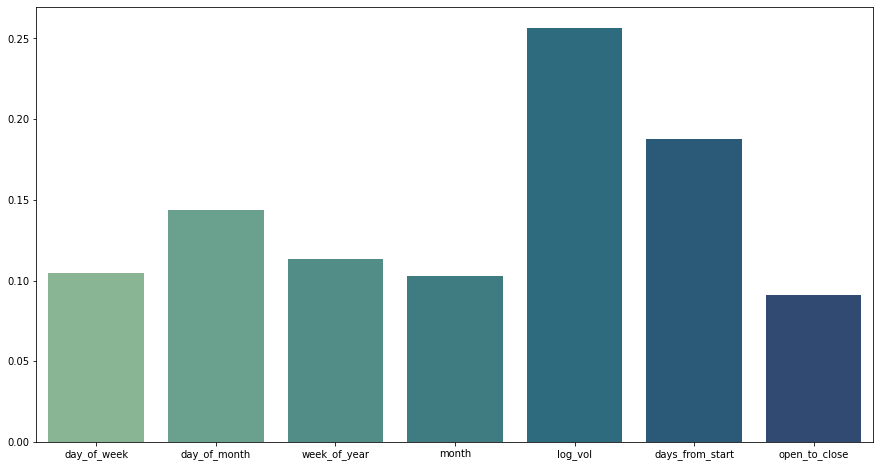

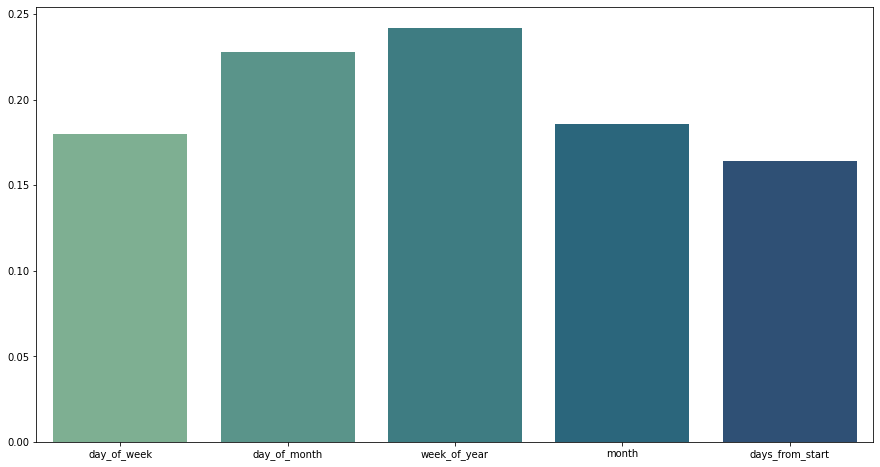


Plotting interpreation plots for a batch of entity 19:


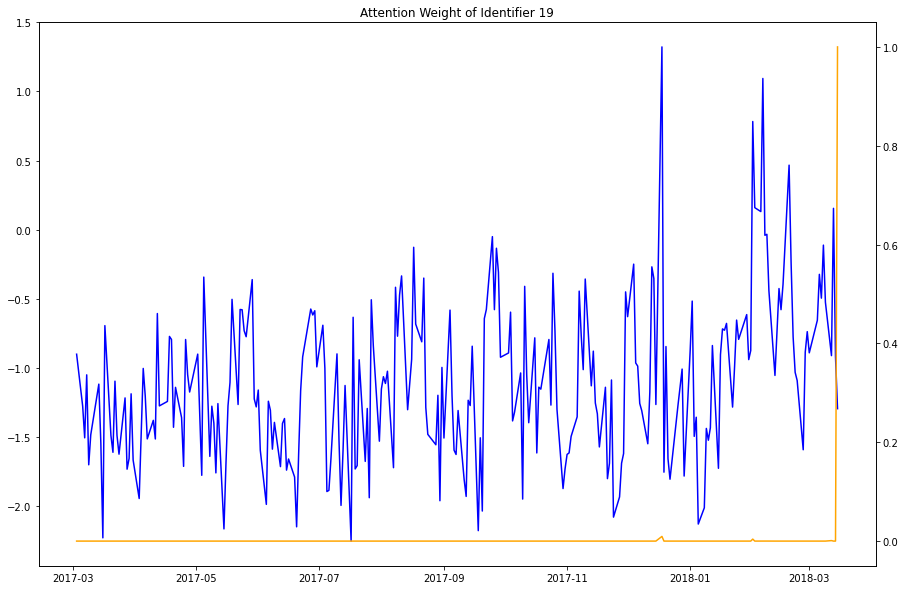

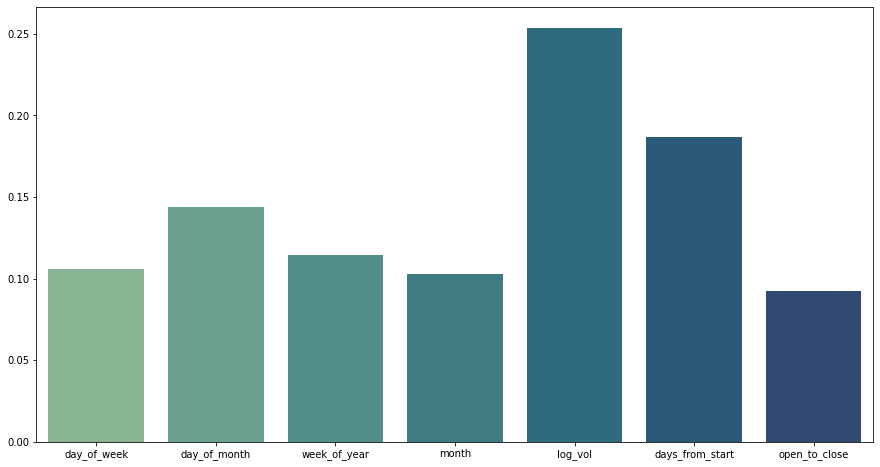

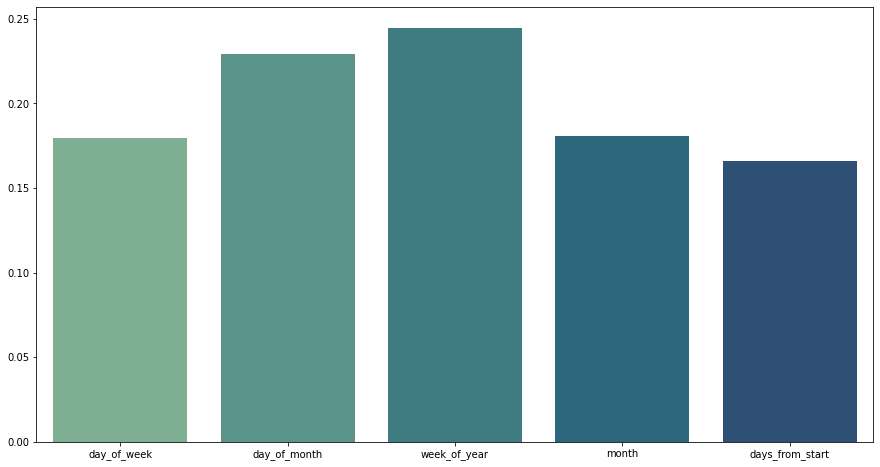


Plotting interpreation plots for a batch of entity 20:


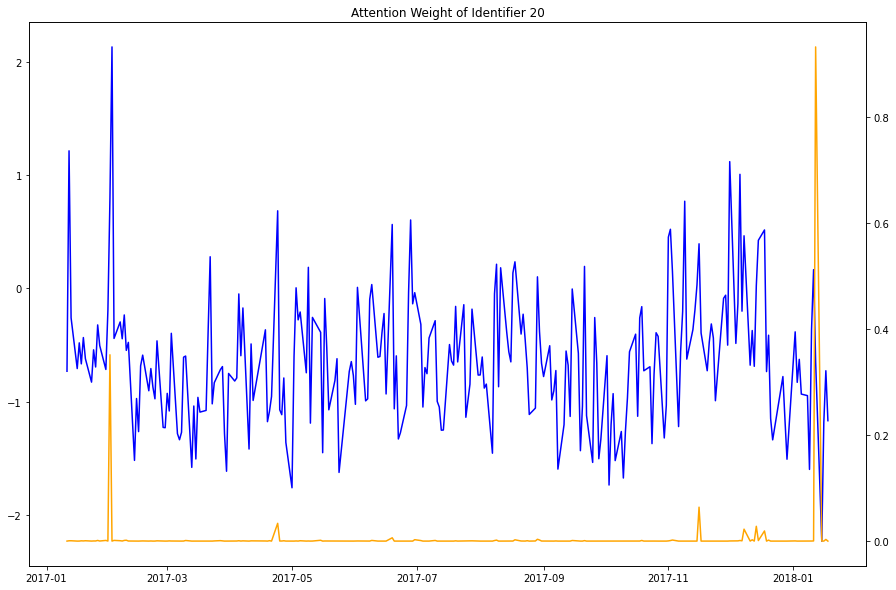

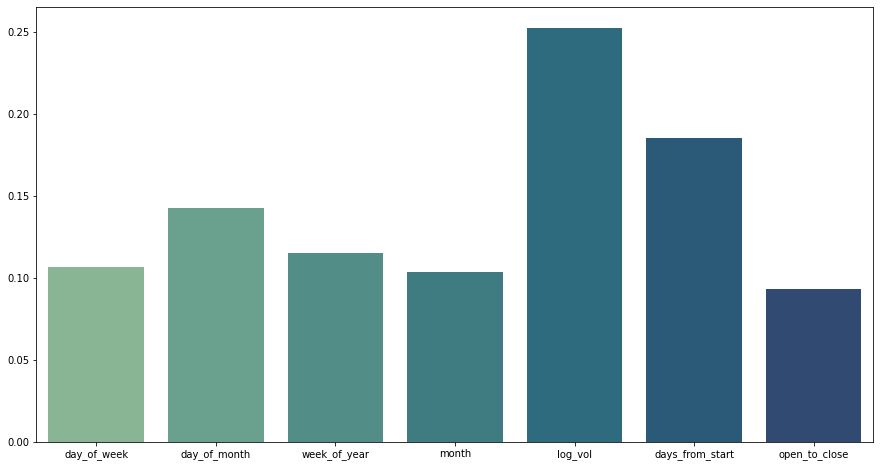

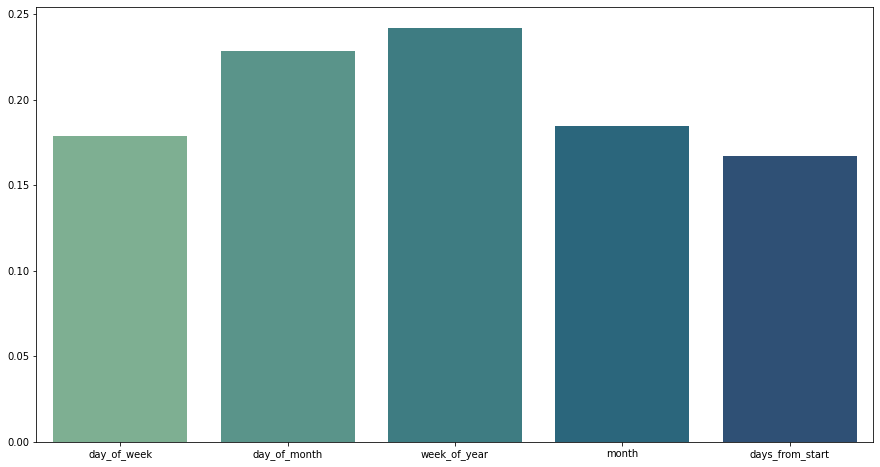


Plotting interpreation plots for a batch of entity 21:


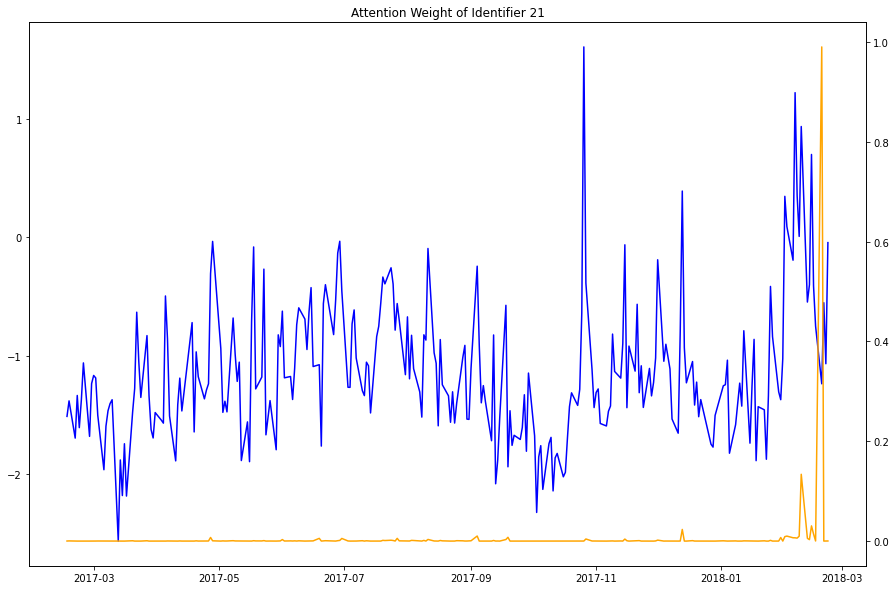

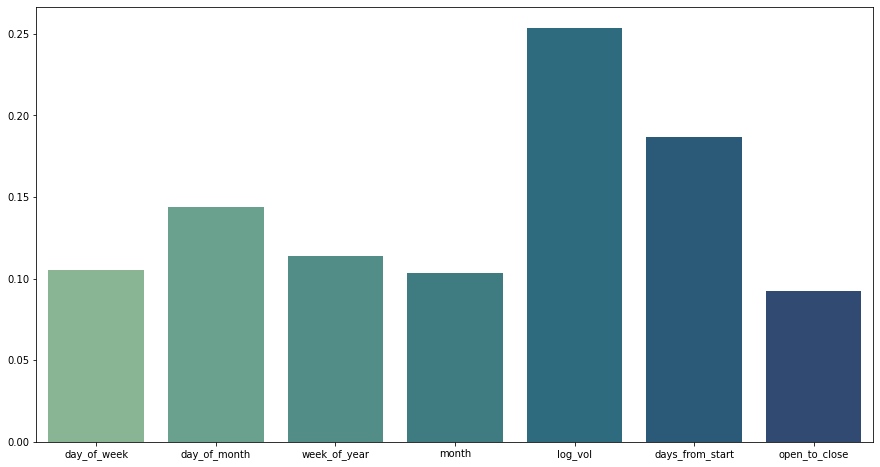

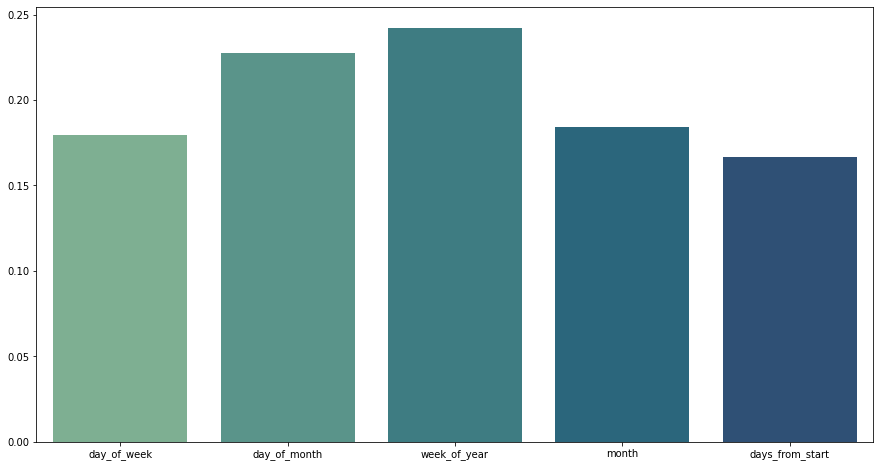


Plotting interpreation plots for a batch of entity 22:


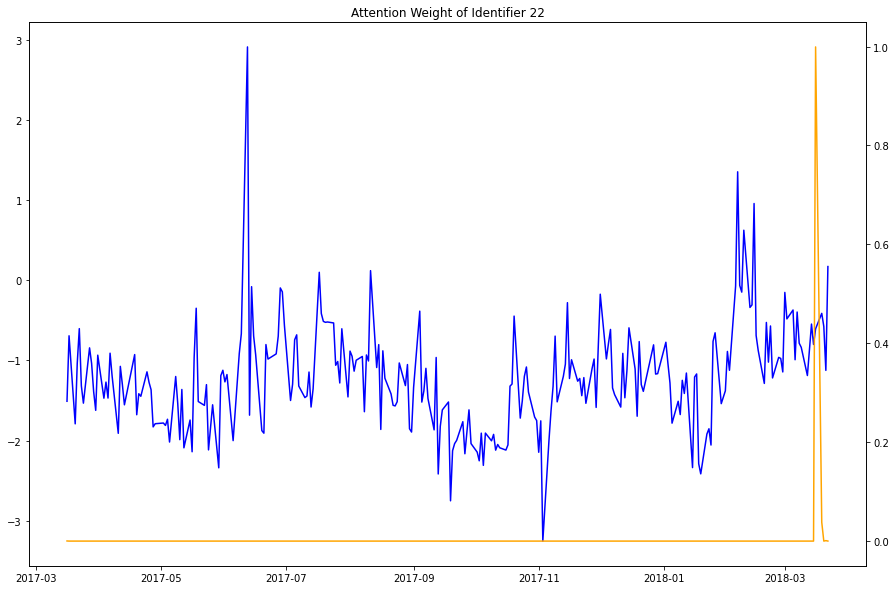

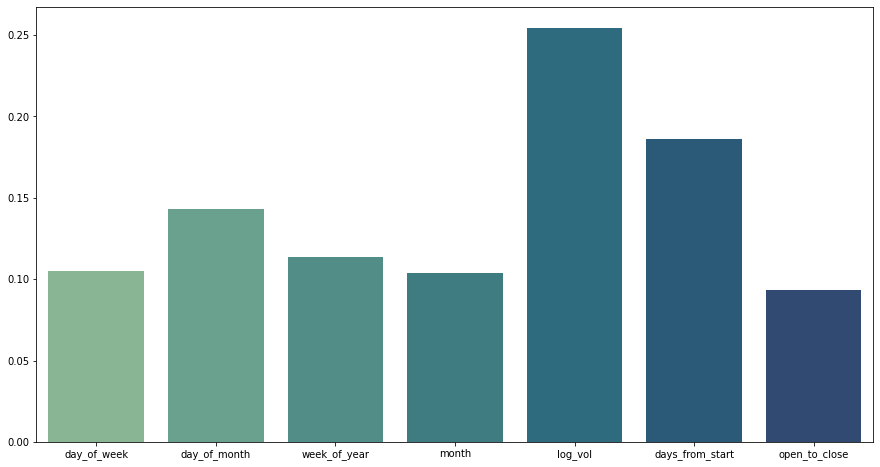

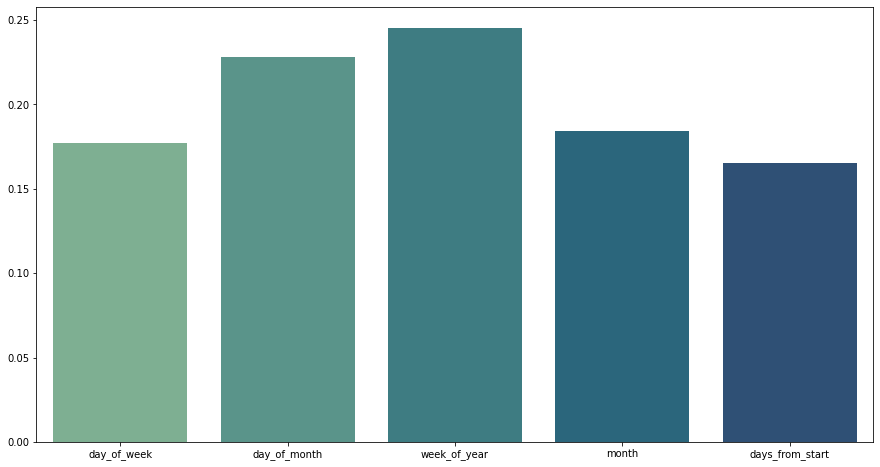


Plotting interpreation plots for a batch of entity 23:


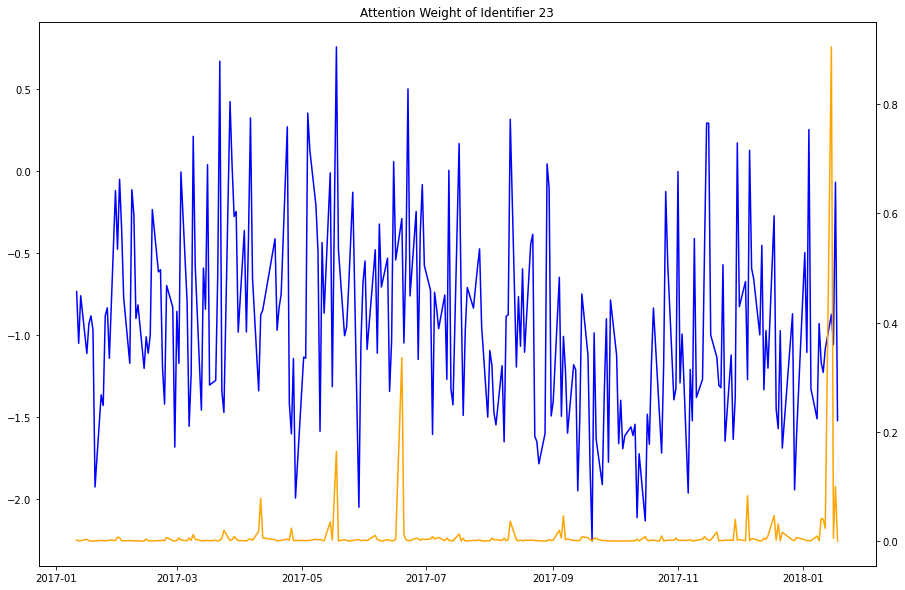

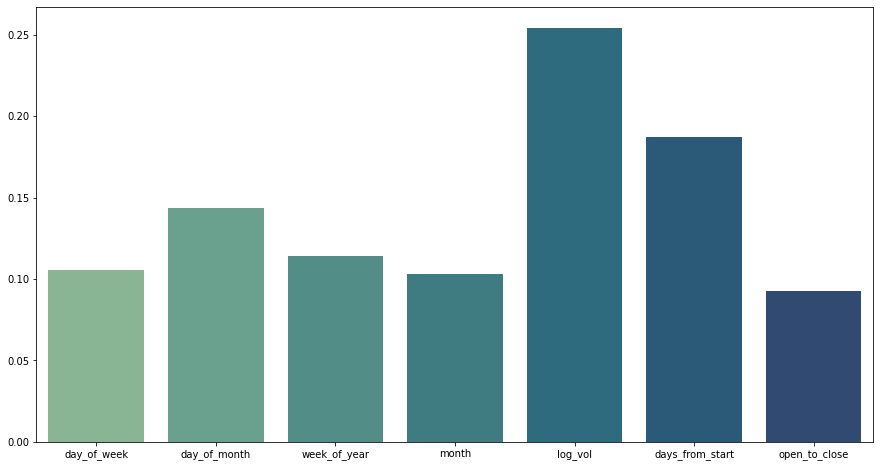

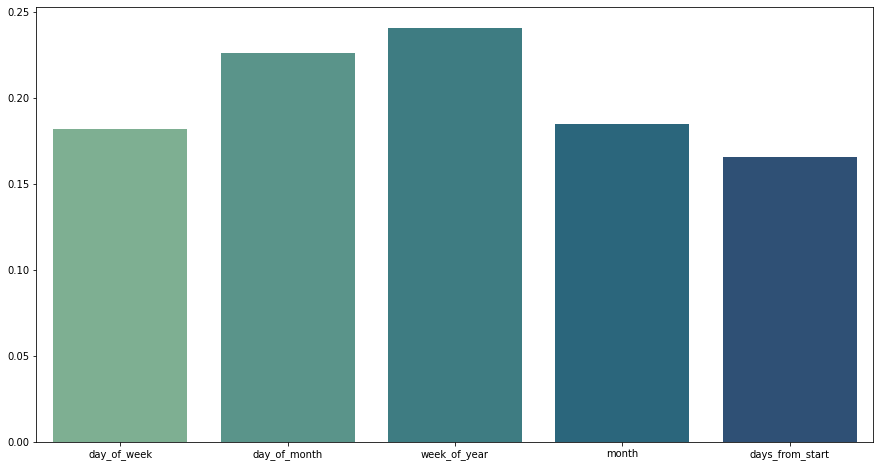


Plotting interpreation plots for a batch of entity 24:


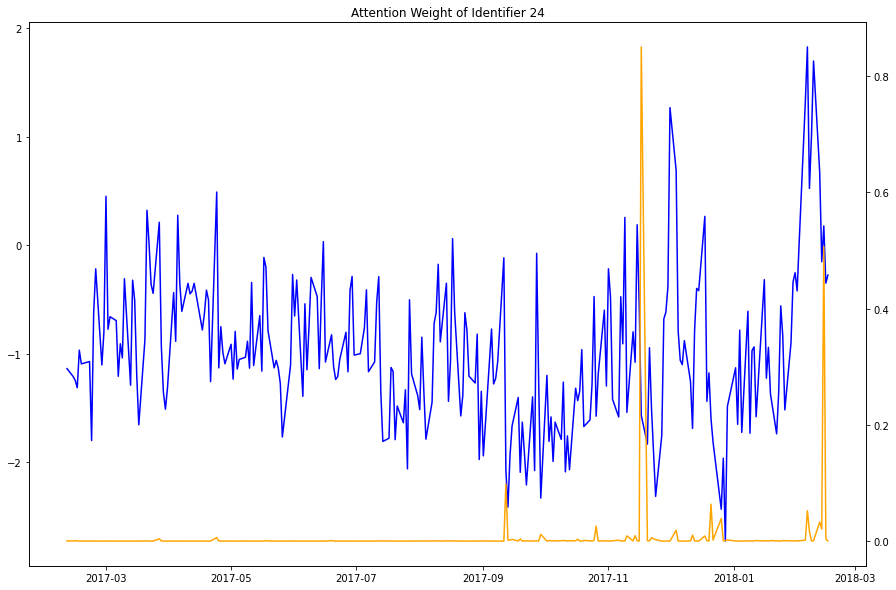

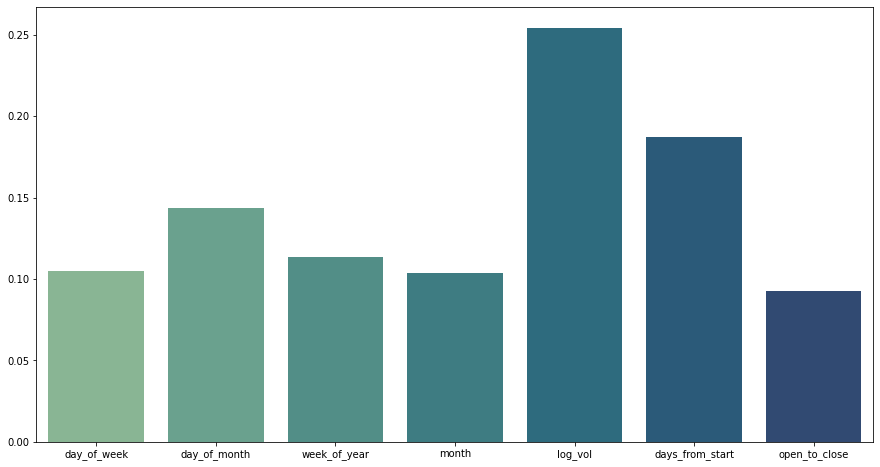

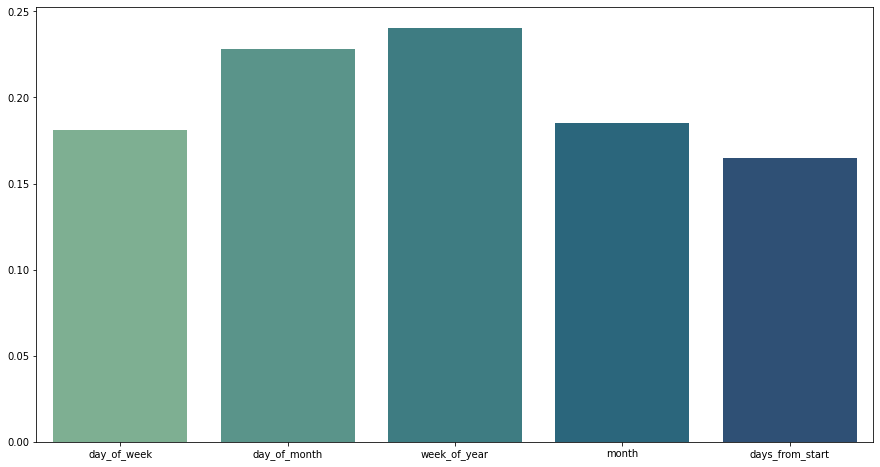


Plotting interpreation plots for a batch of entity 25:


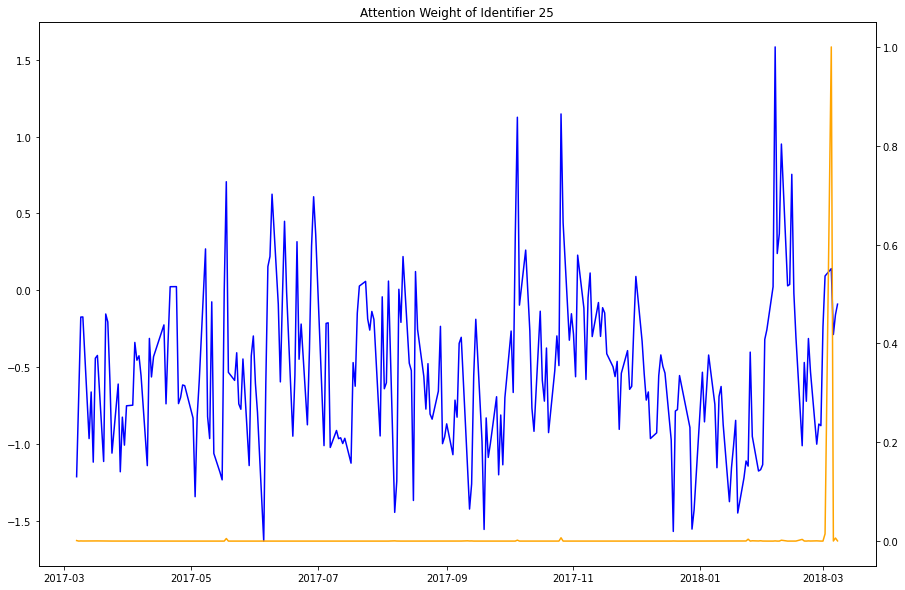

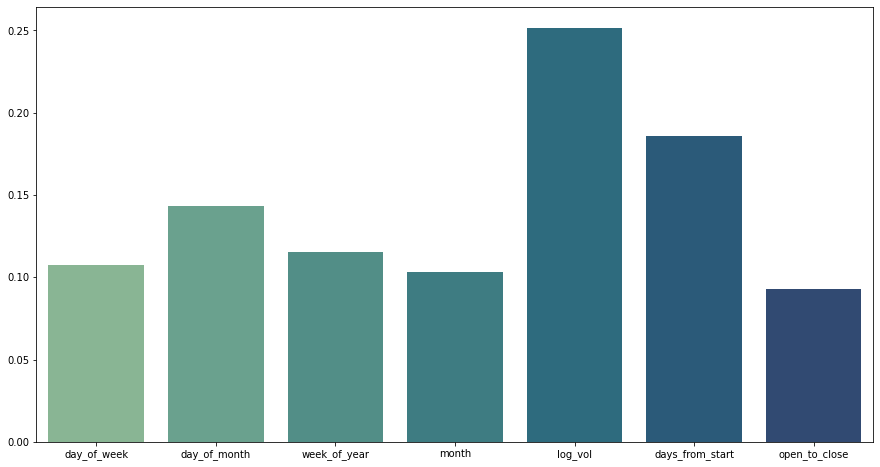

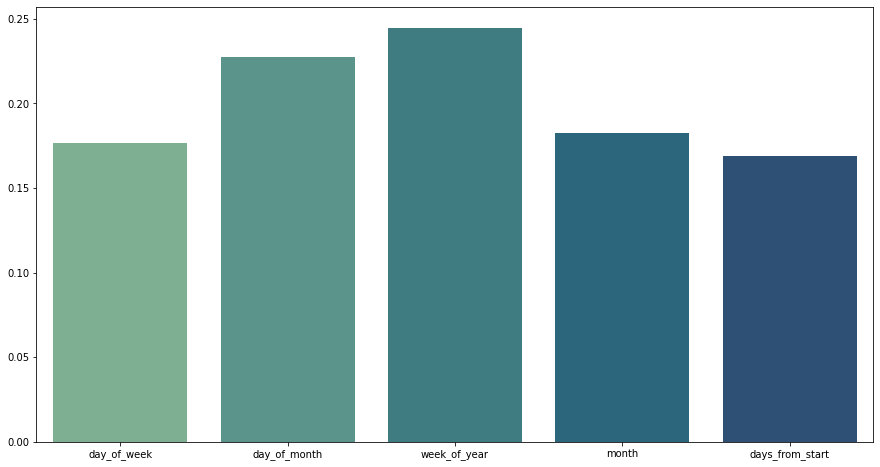


Plotting interpreation plots for a batch of entity 26:


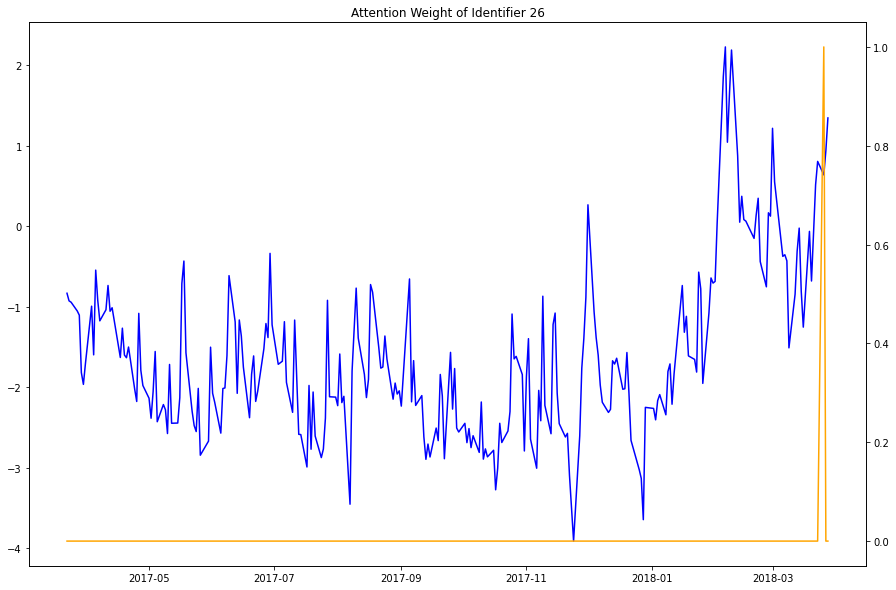

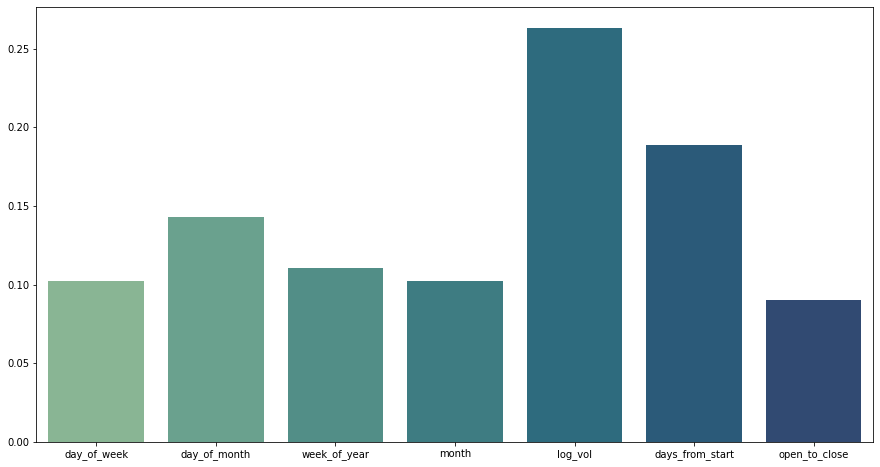

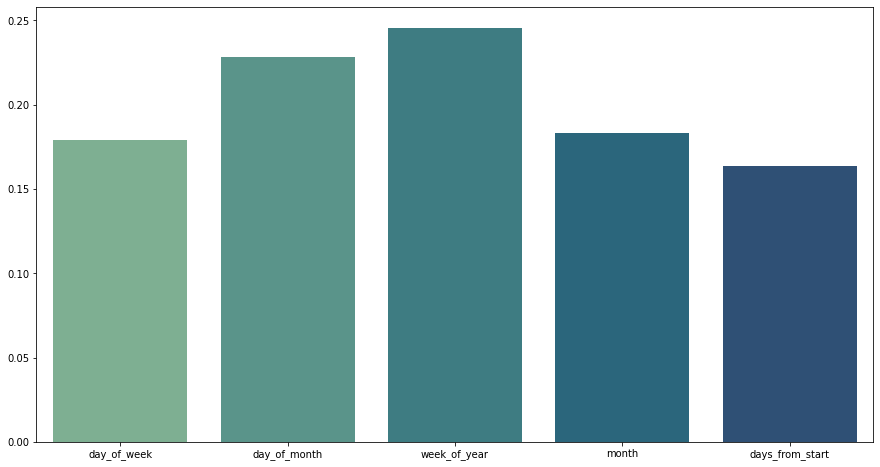


Plotting interpreation plots for a batch of entity 27:


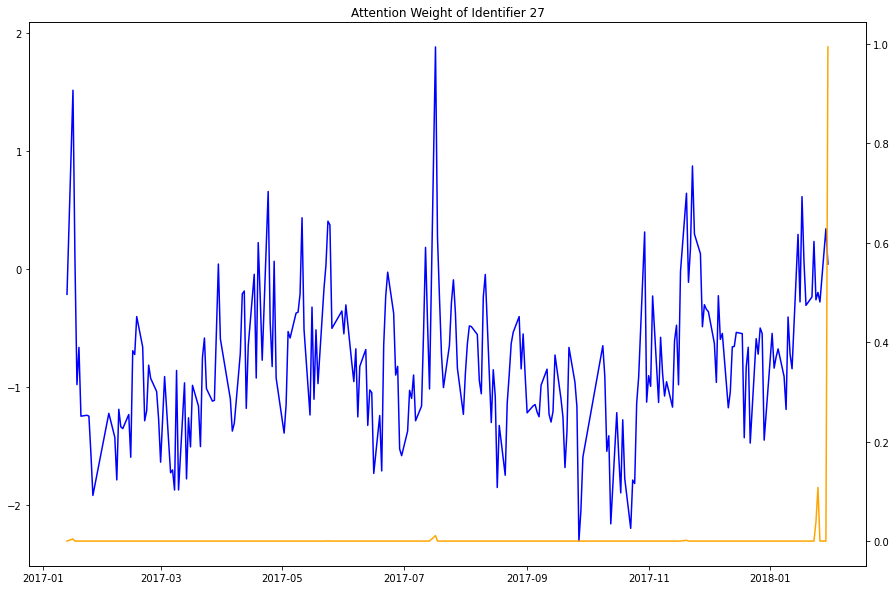

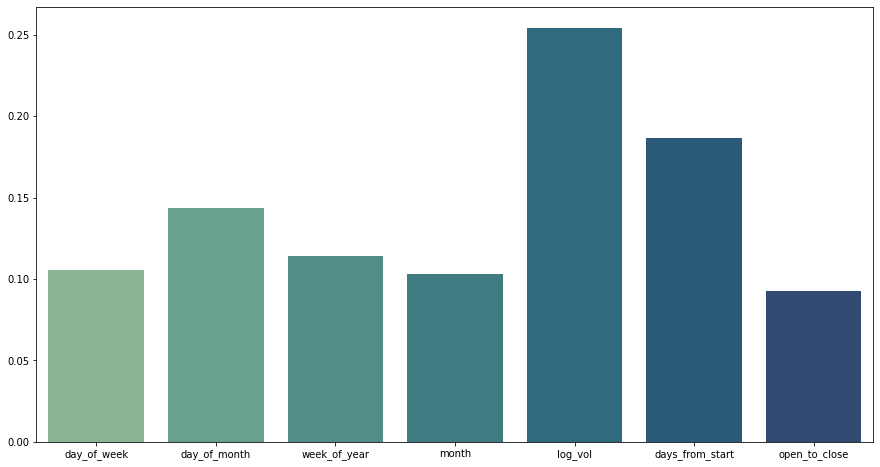

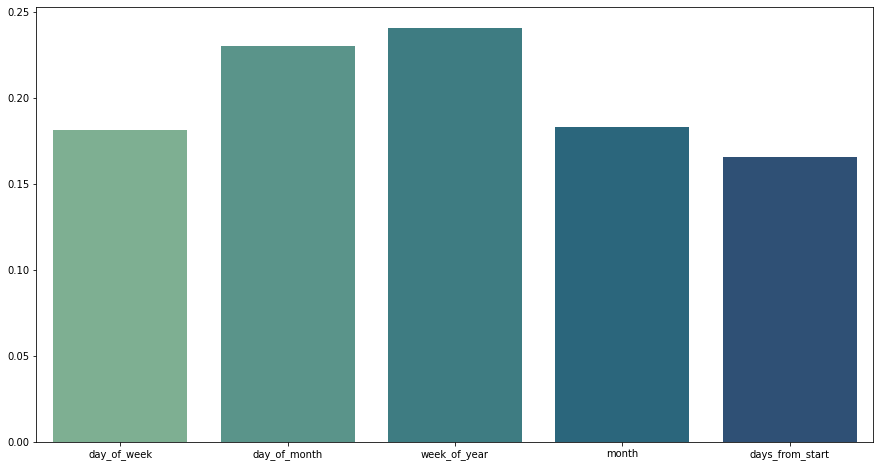


Plotting interpreation plots for a batch of entity 28:


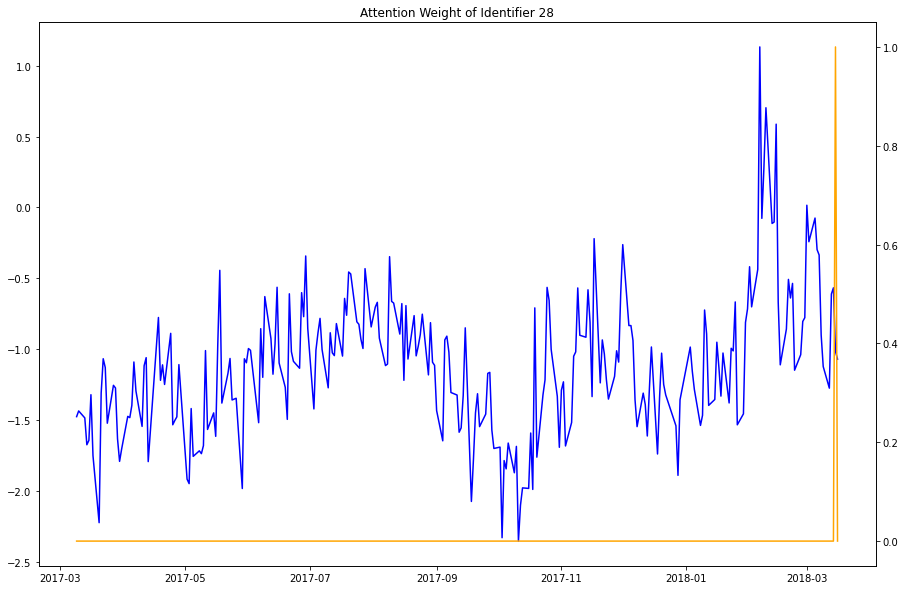

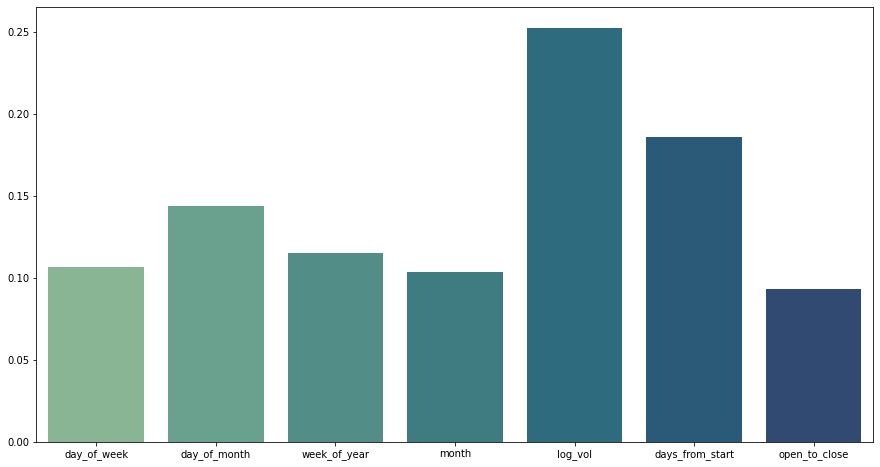

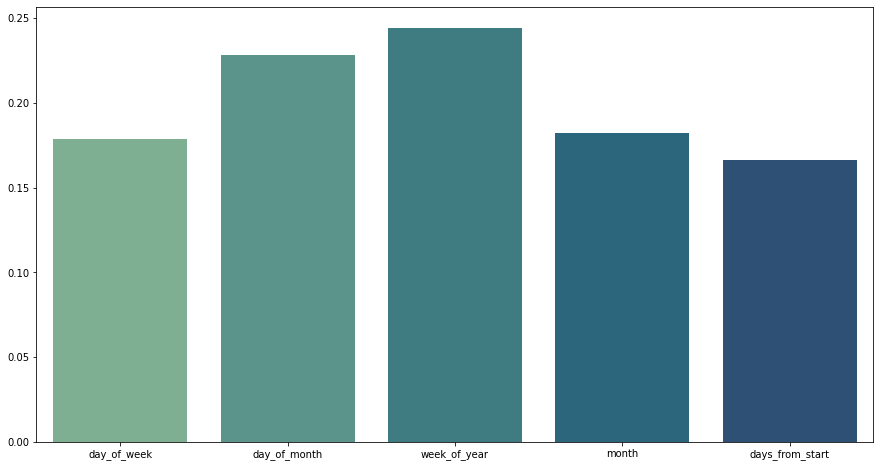


Plotting interpreation plots for a batch of entity 29:


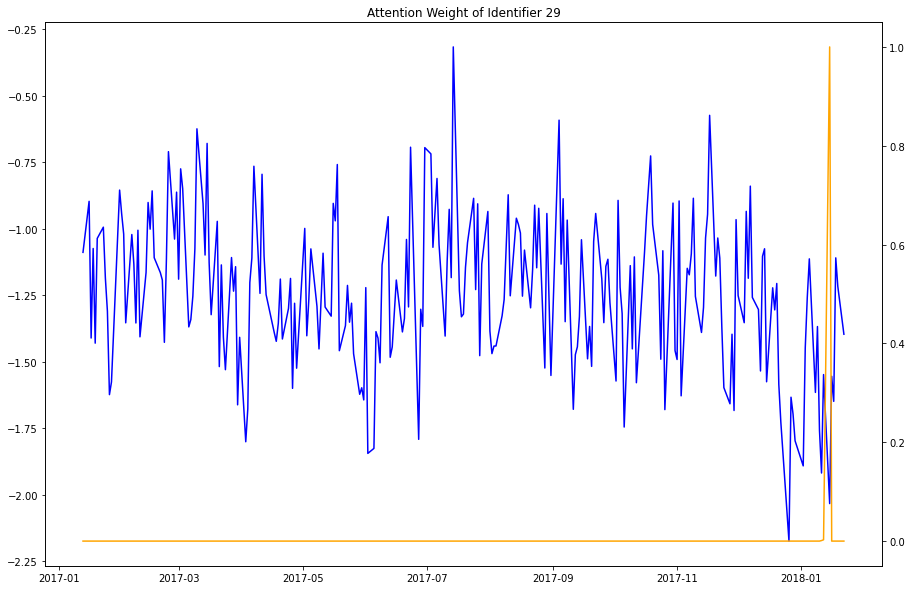

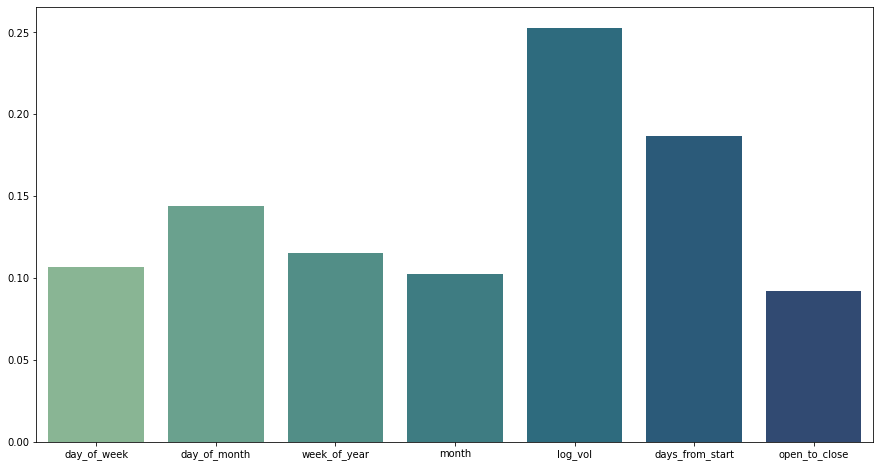

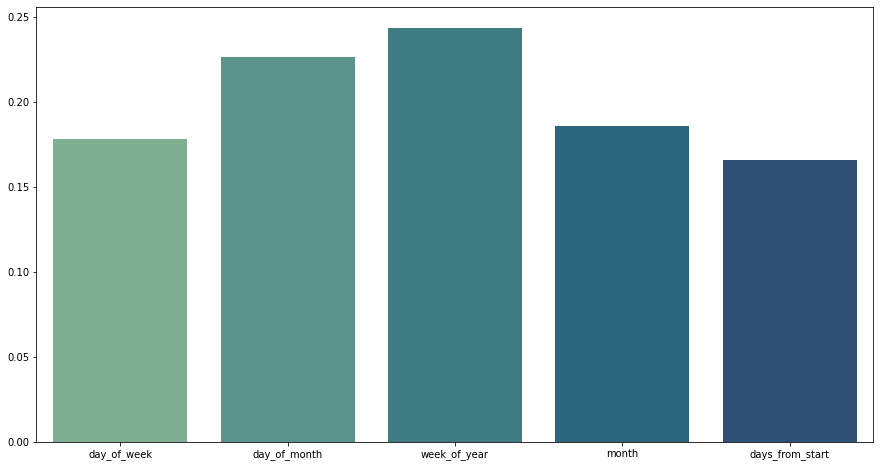


Plotting interpreation plots for a batch of entity 30:


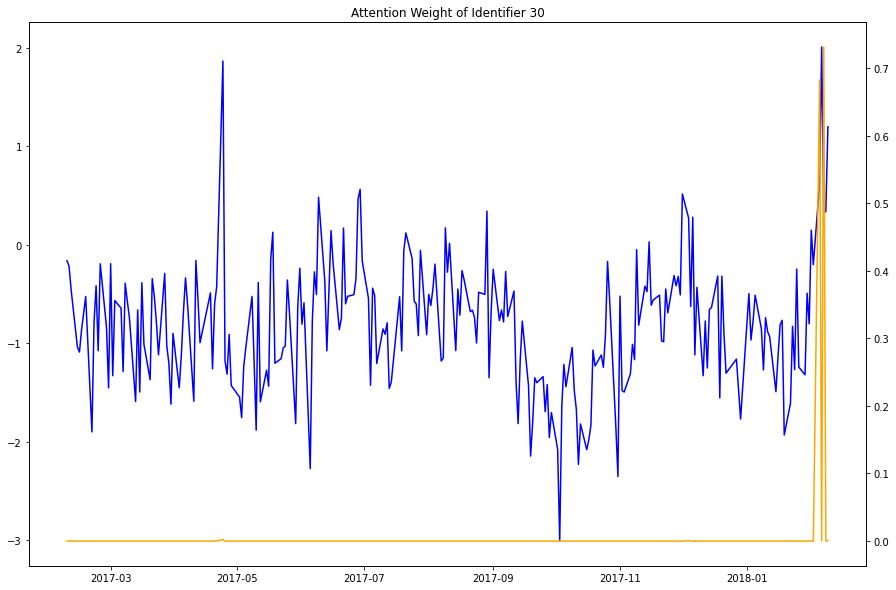

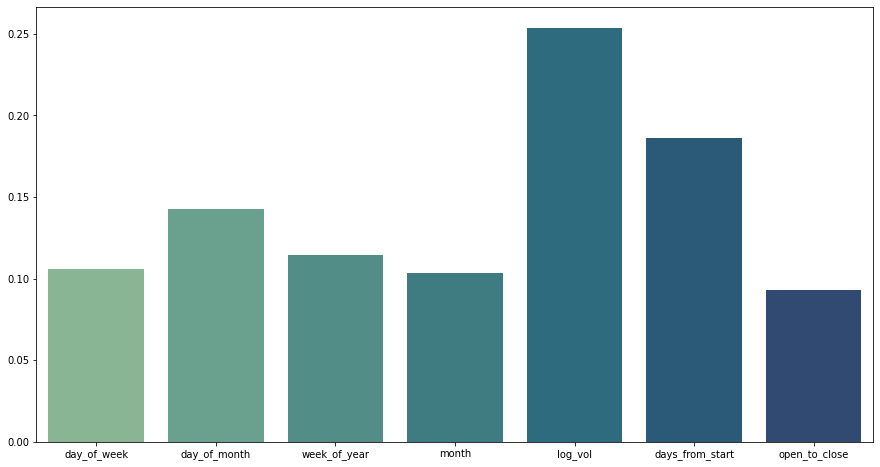

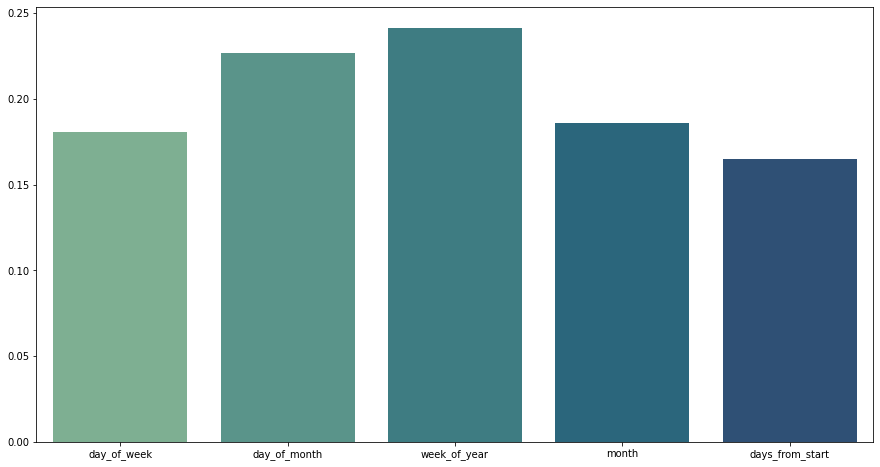

In [37]:
out_df = pd.DataFrame(columns=['p10', 'p50', 'p90', 'identifier'])

start_id = -1

for i, batch in enumerate(valid_dataloader):

    outputs, attention_weights = model(batch)
    bs = batch["outputs"].shape[0]

    process_map = {f"p{int(q * 100)}": outputs.reshape(bs, 5, 3)[:, :, i].cpu().detach().numpy()[::5,:].reshape(-1)[:bs] for i, q in enumerate(QUANTILES)}

    tmp = pd.DataFrame(data=process_map, index=pd.to_datetime(batch['time'][:, ENCODER_STEPS - 1, 0]))
    tmp["labels"] = batch["outputs"].reshape(-1)[::5]
    tmp["identifier"] = batch['identifier'][:, 0, 0]
    
    out_df = pd.concat([out_df, tmp])
    
    e = int(batch['identifier'][0, 0, 0].numpy())
    if batch['identifier'][0, 0, 0].numpy() != start_id:
        
        print("="*20)
        print(f"Plotting interpreation plots for a batch of entity {e}:")
        
        id_mask = batch['identifier'][:, 0, 0]==e
        
        #Plotting multi-head attention
        plt.figure(figsize=(15,10))
        plt.title(f"Attention Weight of Identifier {e}")
        sns.lineplot(x=pd.to_datetime(batch["time"][0,:,0].numpy()),
                     y=batch["inputs"][0,:,0].numpy(), color="blue")
        ax2 = plt.twinx()

        attn = attention_weights['multihead_attention'][0].cpu().detach().numpy().mean(axis=0)
        sns.lineplot(x=pd.to_datetime(batch["time"][0,:,0].numpy()),
                     y=attn/np.linalg.norm(attn),
                     ax=ax2, color="orange")
        plt.show()
        
        past_inputs = ["day_of_week", "day_of_month", "week_of_year", "month", 'log_vol', 'days_from_start', "open_to_close"]
        future_inputs = ["day_of_week", "day_of_month", "week_of_year", "month", "days_from_start"]
        
        # Plotting past weights
        plt.figure(figsize=(15,8))
        sns.barplot(x=past_inputs, 
                    y=attention_weights['past_weights'][id_mask,:,:].mean(dim=(0,1)).cpu().detach().numpy(), 
                    palette="crest")
        plt.show()

        # Plotting future weights
        plt.figure(figsize=(15,8))
        sns.barplot(x=future_inputs, 
                    y=attention_weights['future_weights'][id_mask,:,:].mean(dim=(0,1)).cpu().detach().numpy(), 
                    palette="crest")
        plt.show()
        start_id = e
        print()

## Test Interpretation

Plotting interpreation plots for a batch of entity 0:


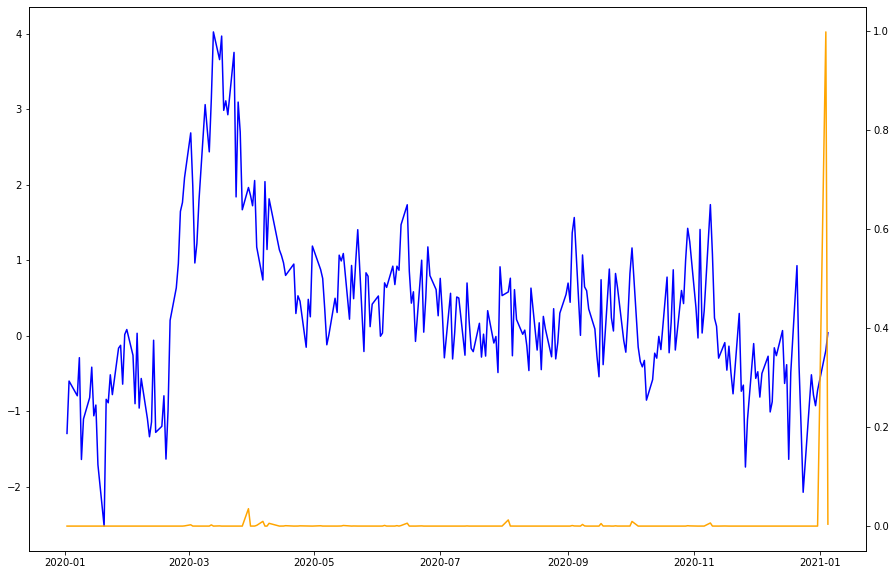

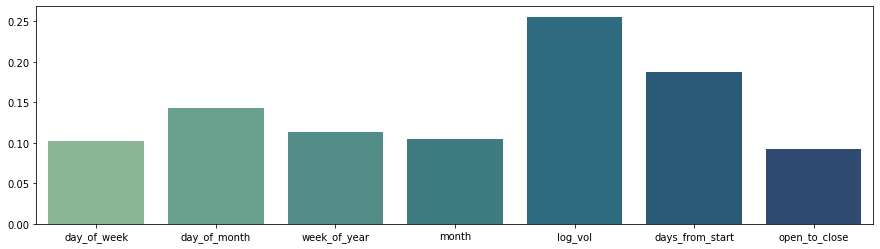

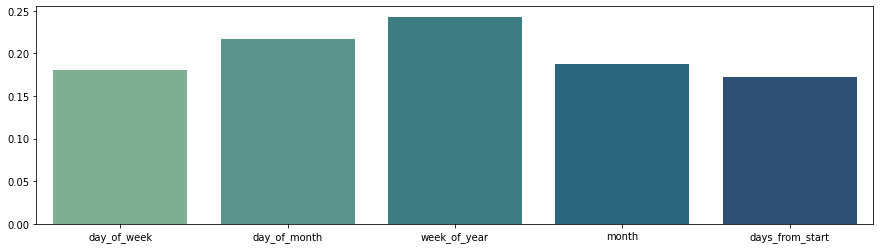


Plotting interpreation plots for a batch of entity 1:


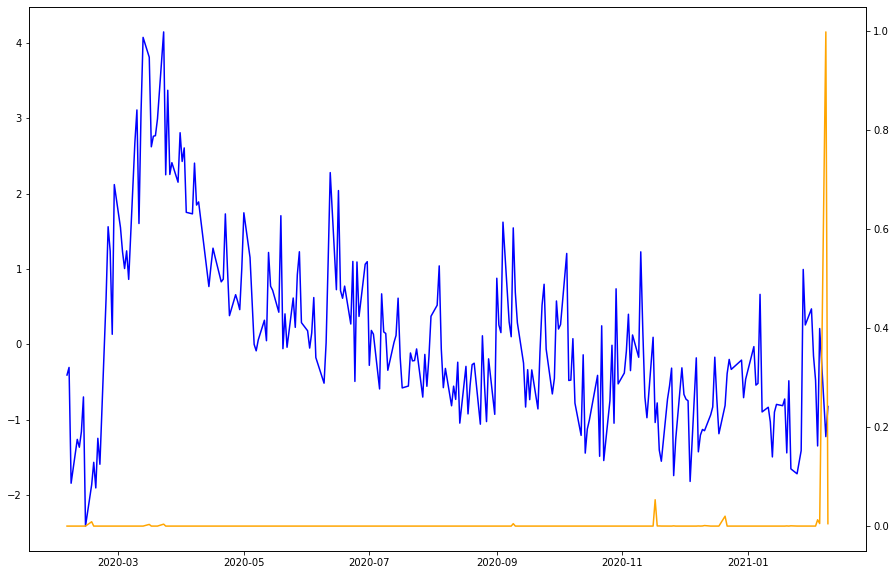

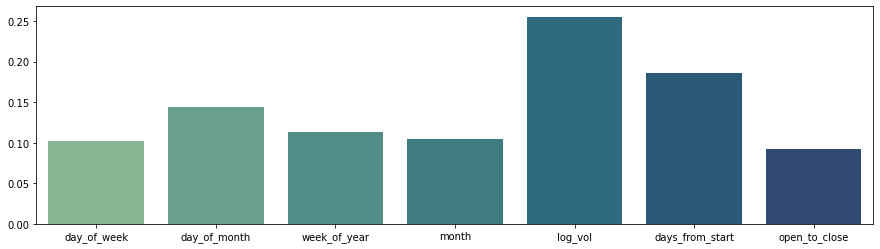

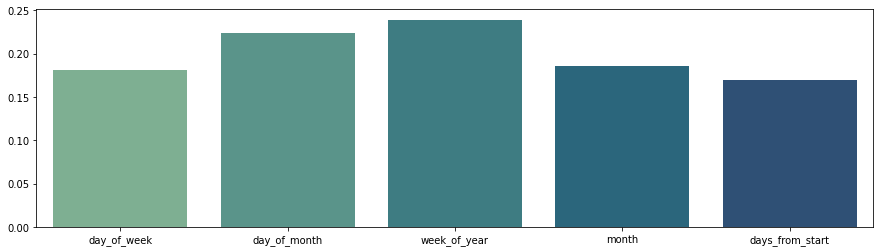


Plotting interpreation plots for a batch of entity 2:


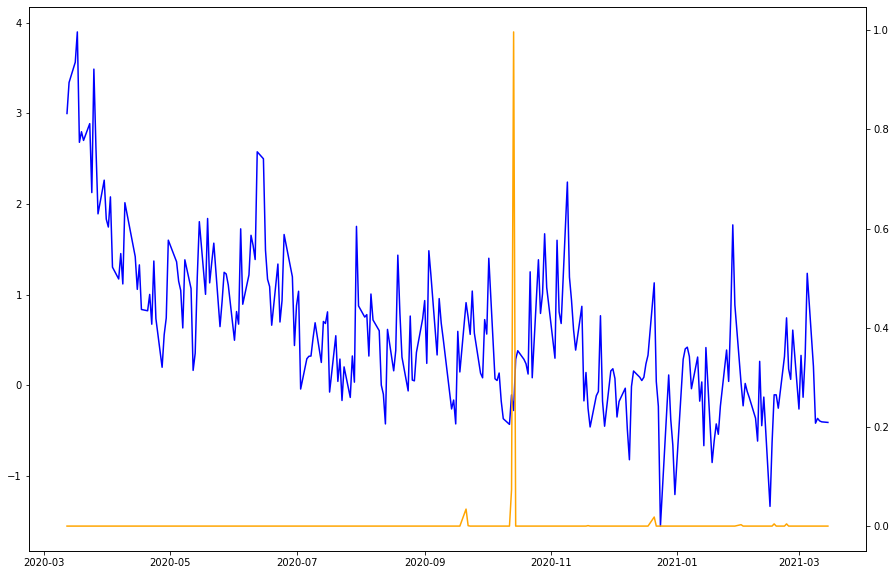

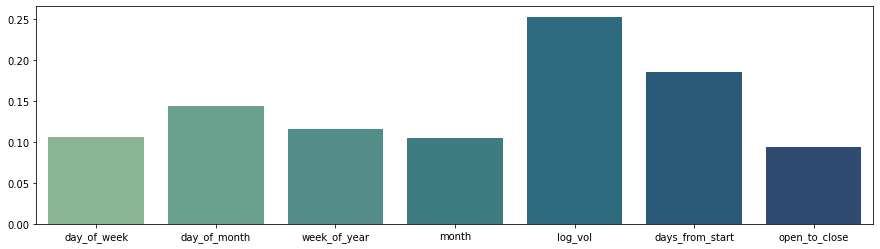

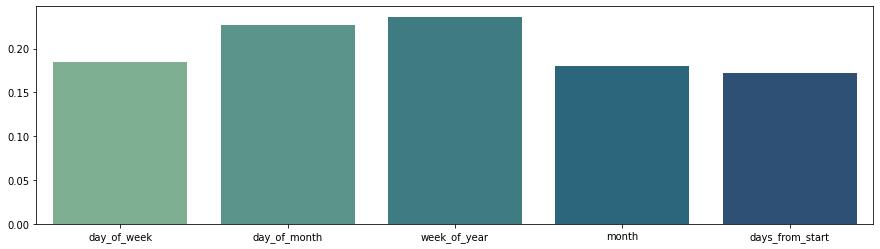


Plotting interpreation plots for a batch of entity 3:


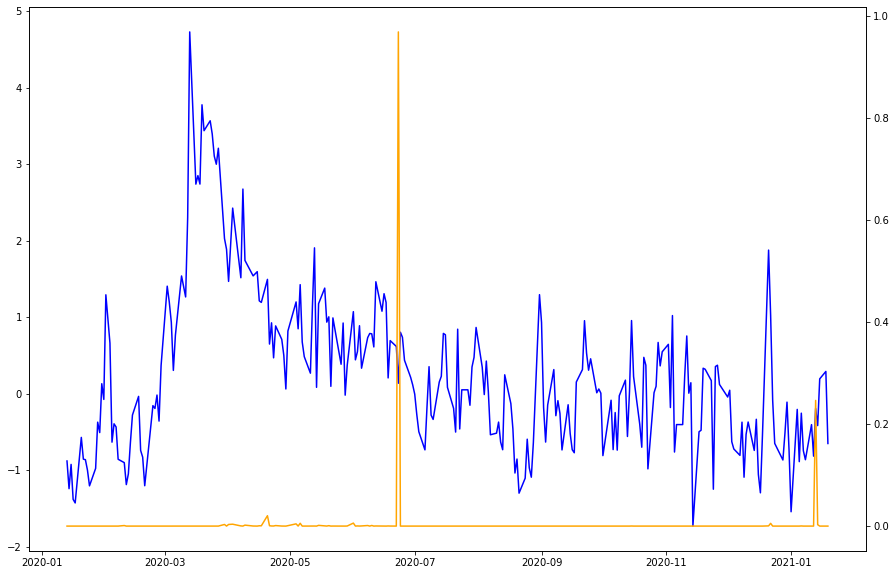

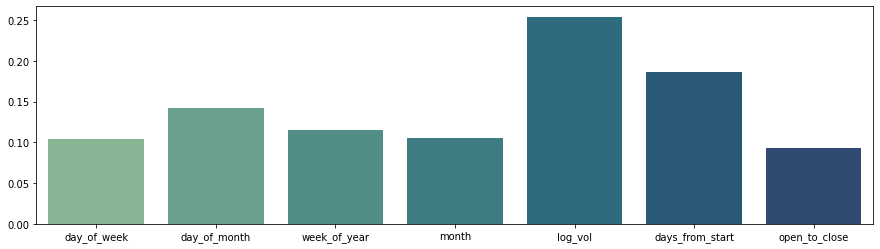

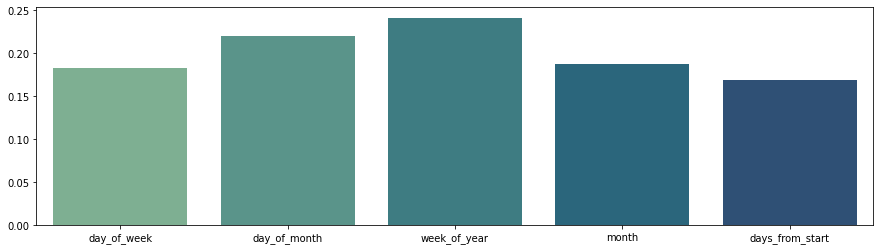


Plotting interpreation plots for a batch of entity 4:


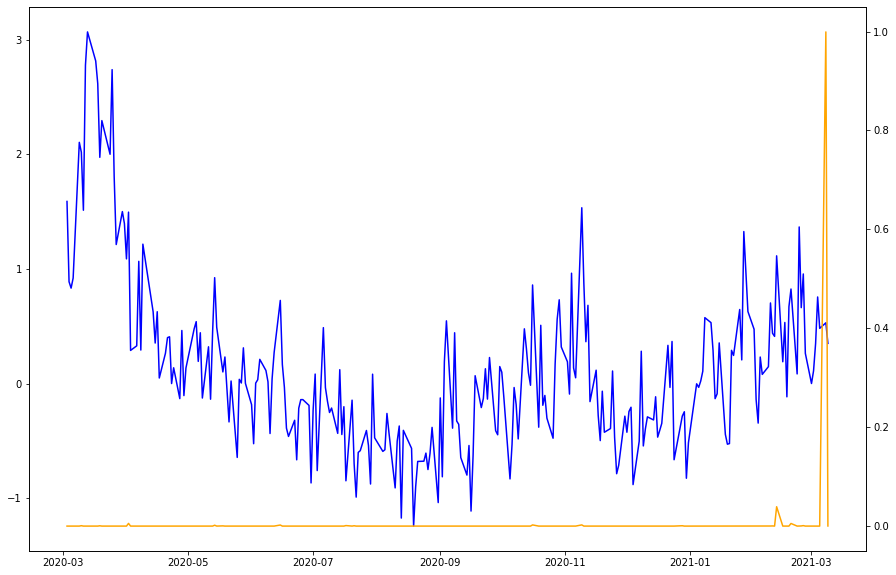

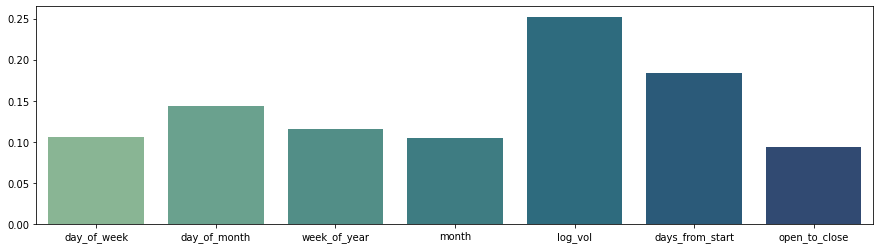

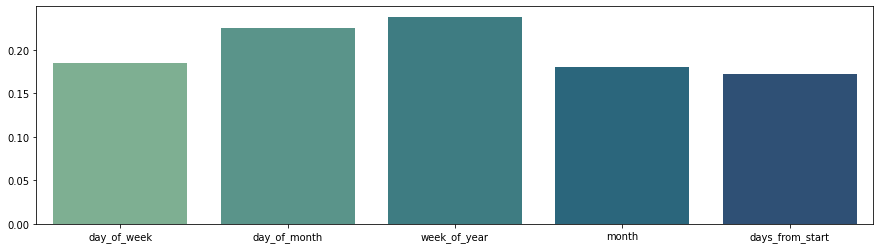


Plotting interpreation plots for a batch of entity 5:


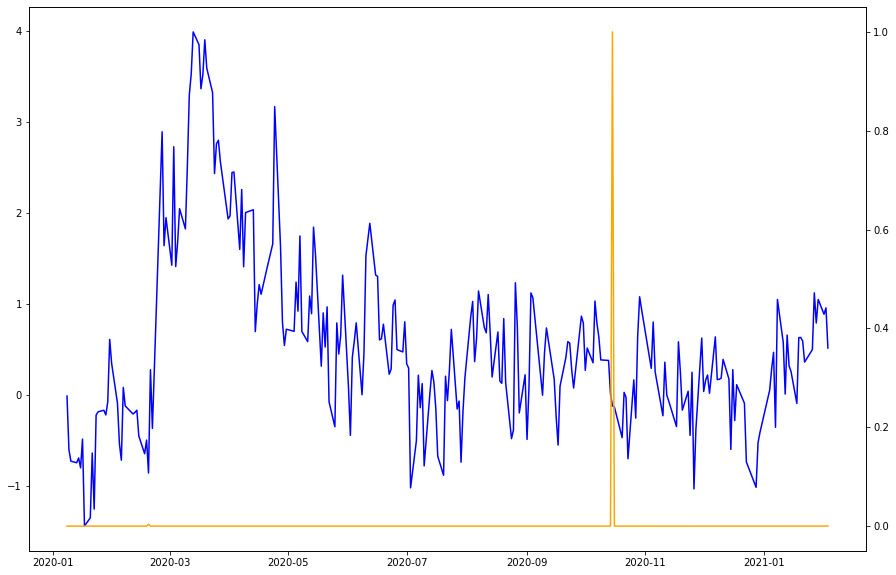

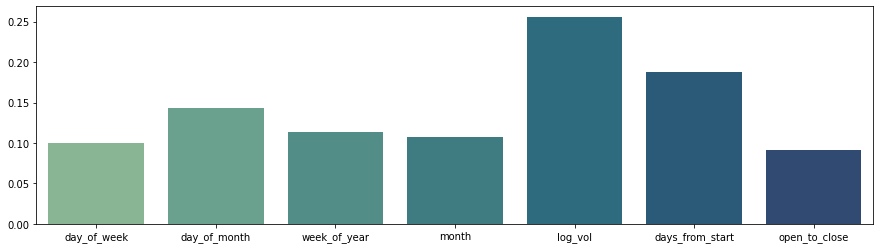

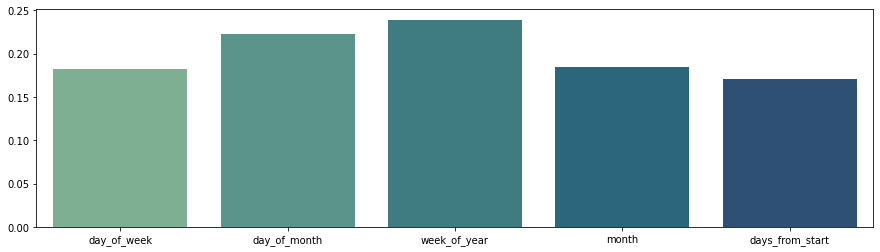


Plotting interpreation plots for a batch of entity 6:


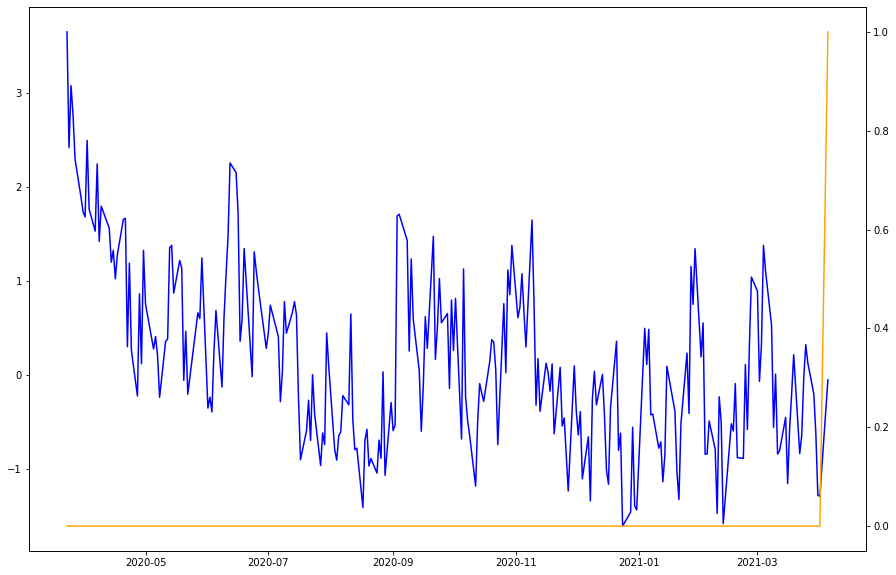

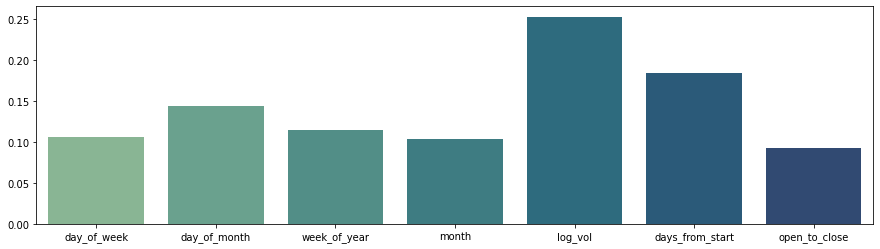

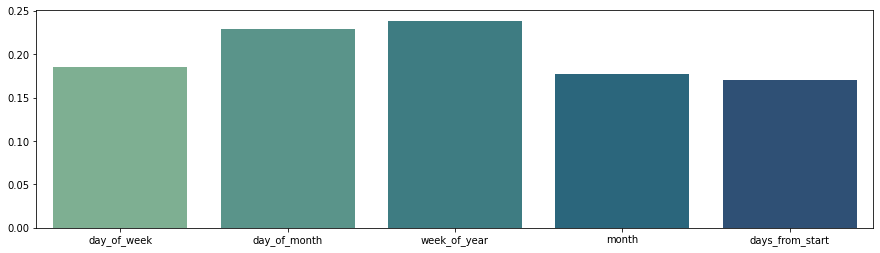


Plotting interpreation plots for a batch of entity 7:


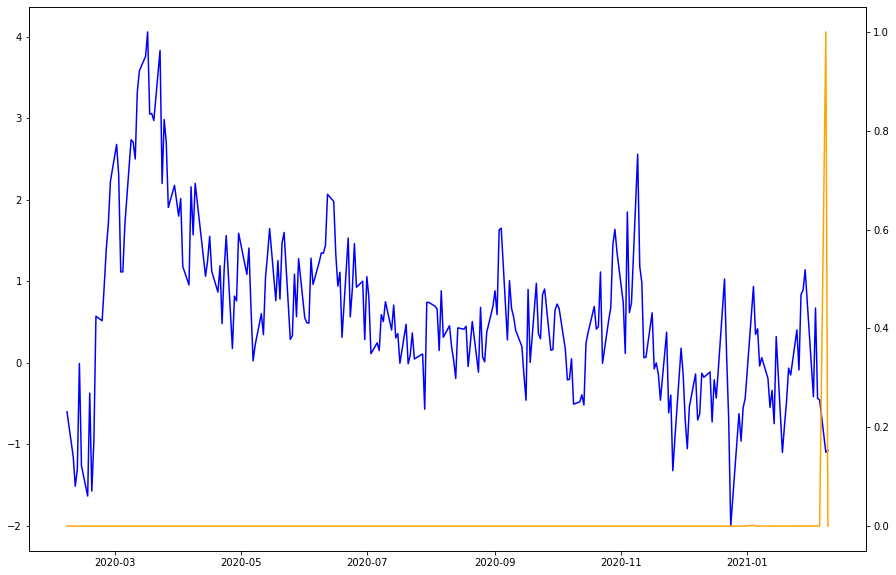

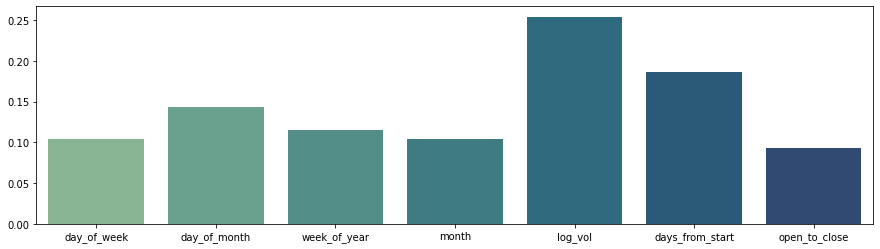

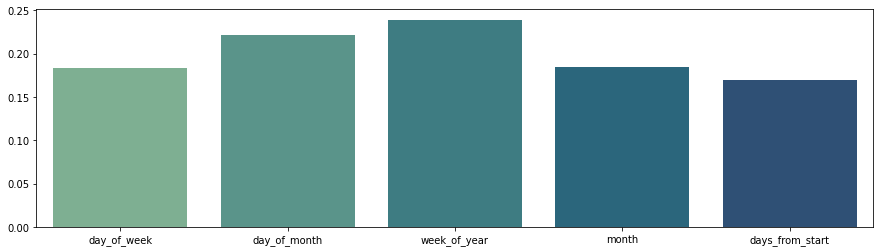


Plotting interpreation plots for a batch of entity 8:


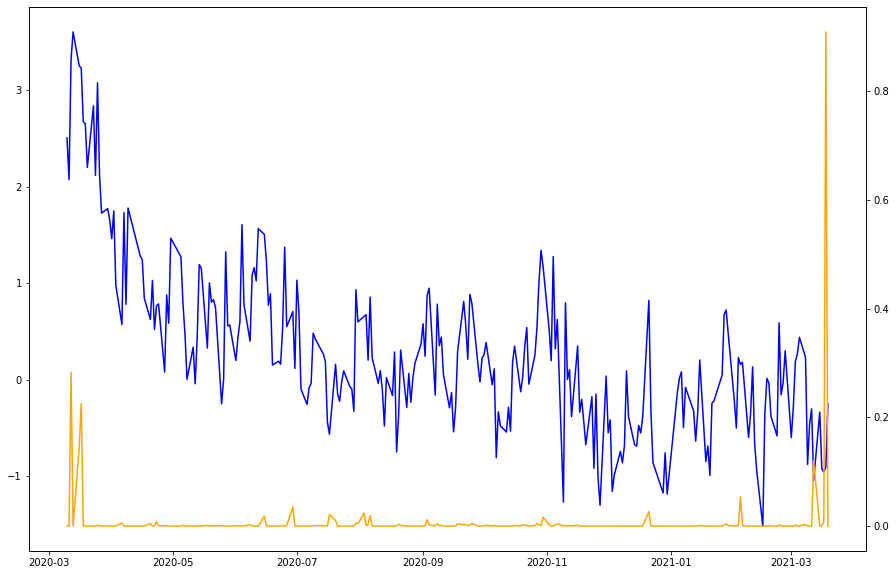

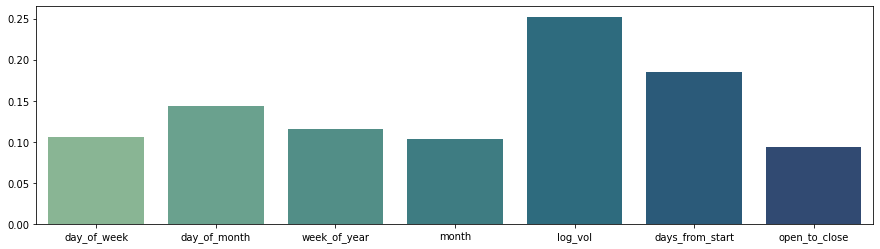

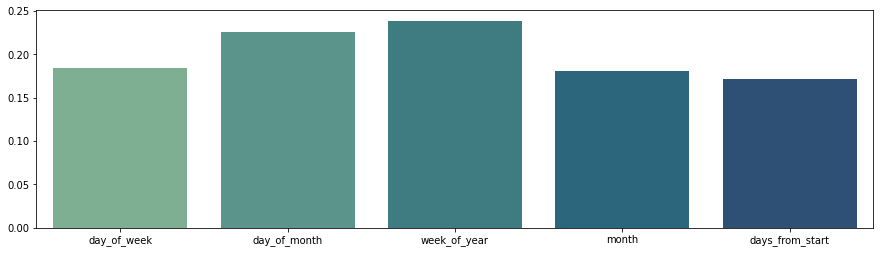


Plotting interpreation plots for a batch of entity 9:


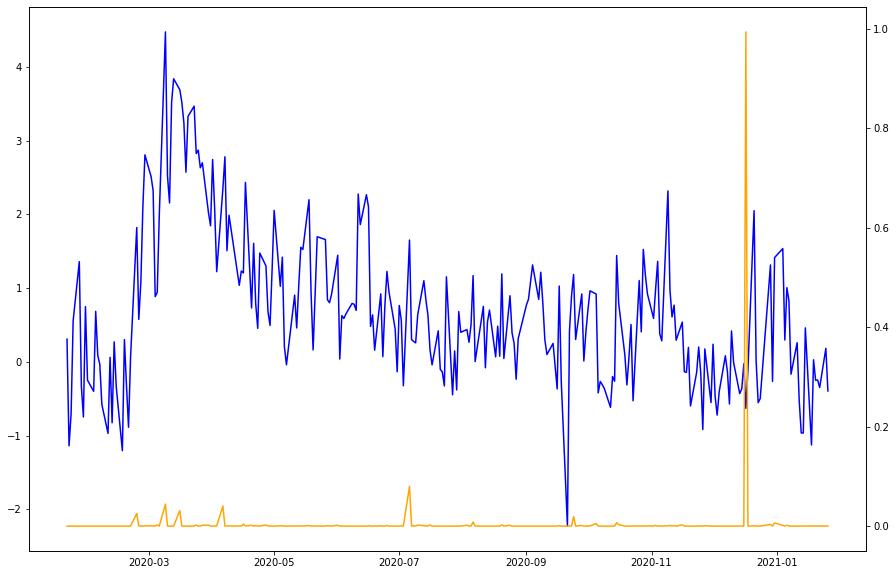

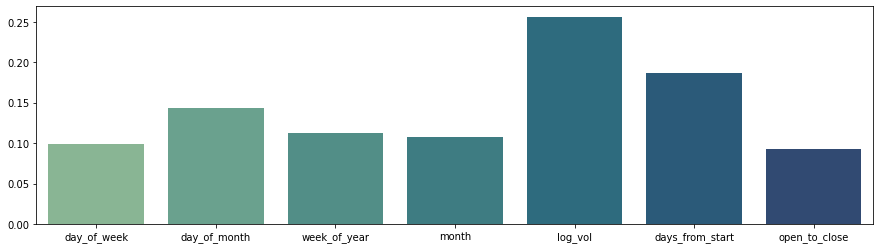

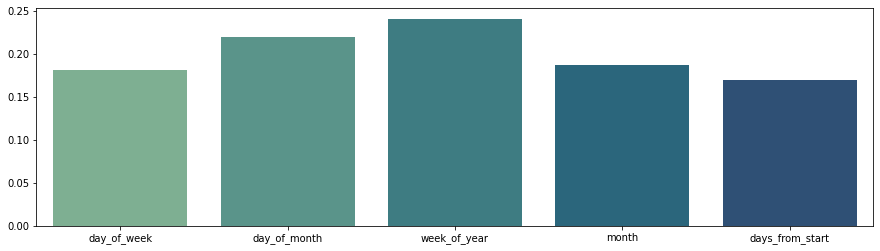


Plotting interpreation plots for a batch of entity 10:


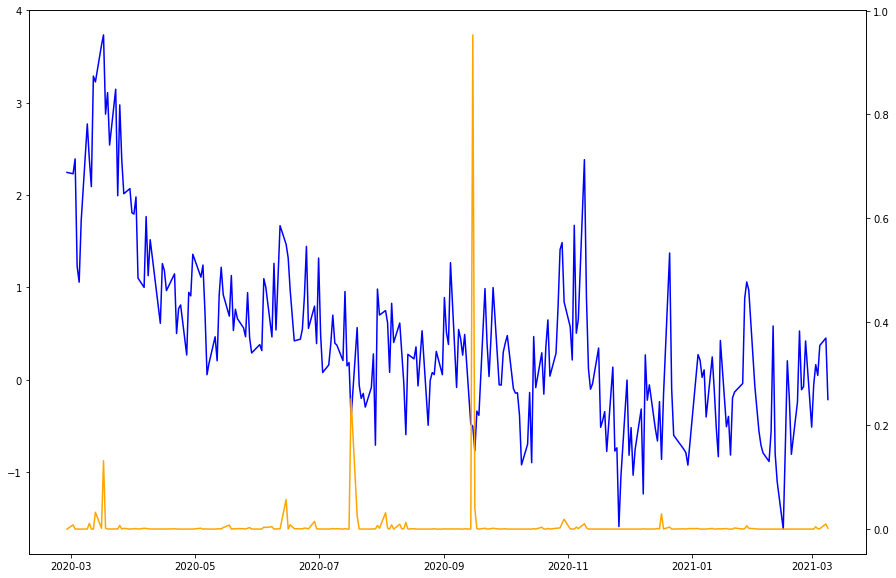

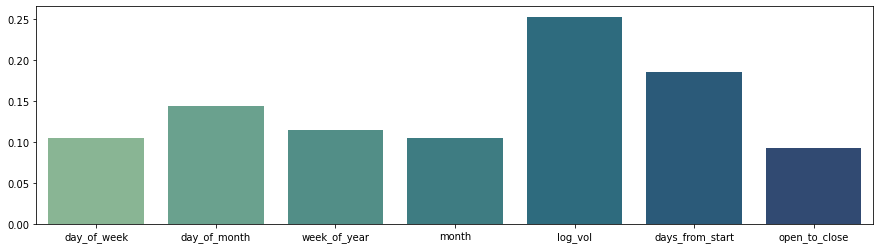

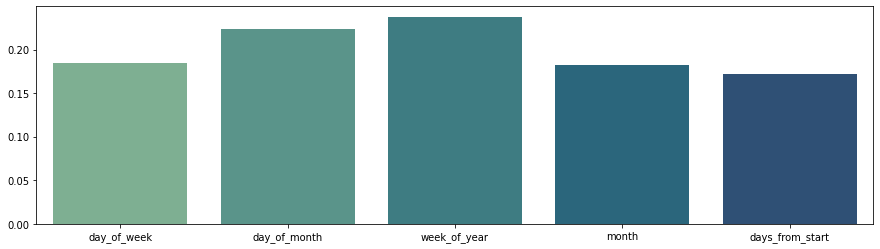


Plotting interpreation plots for a batch of entity 11:


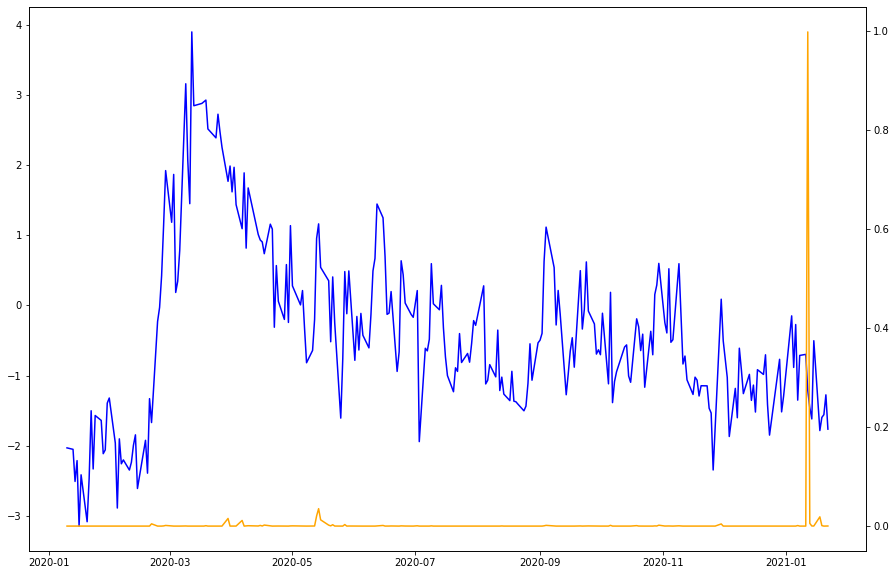

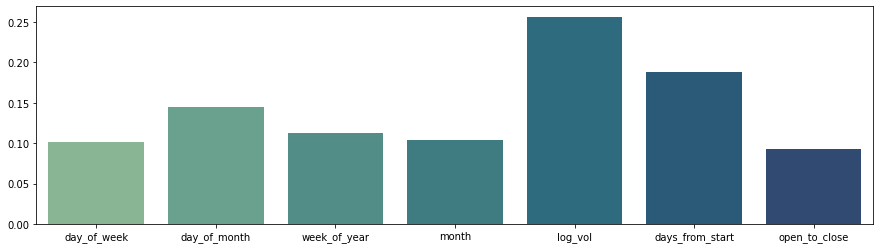

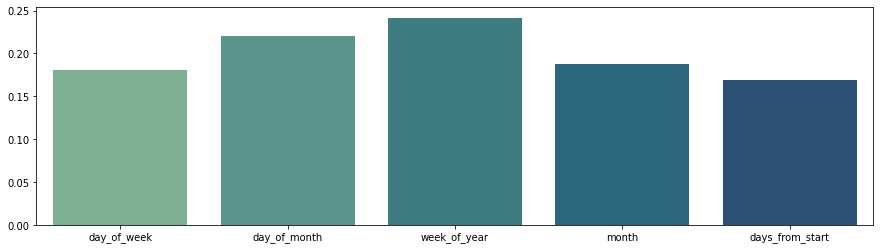


Plotting interpreation plots for a batch of entity 12:


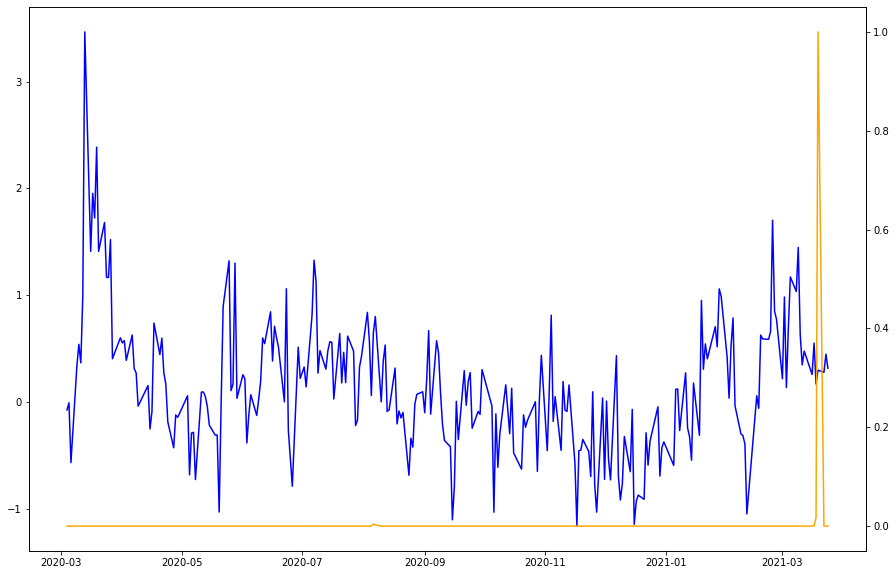

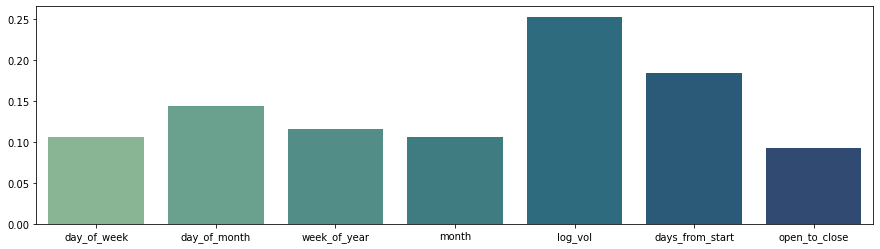

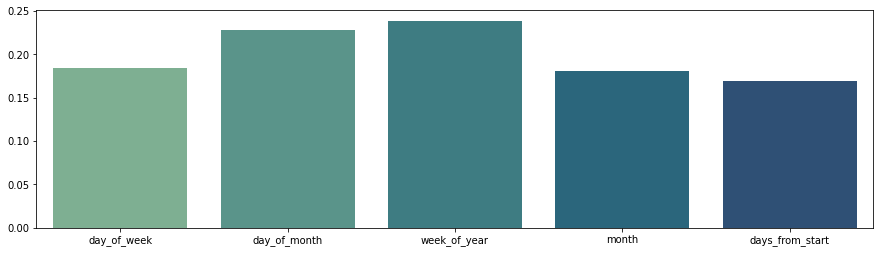


Plotting interpreation plots for a batch of entity 13:


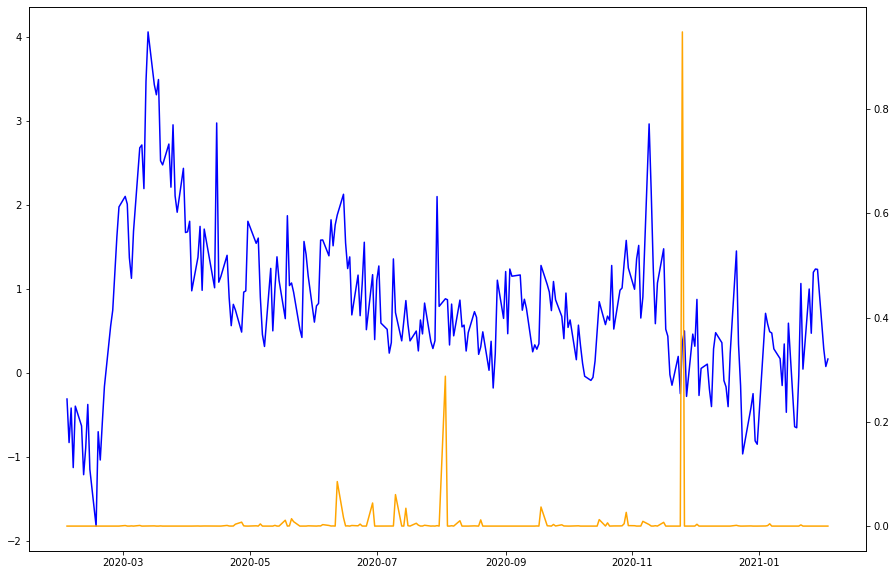

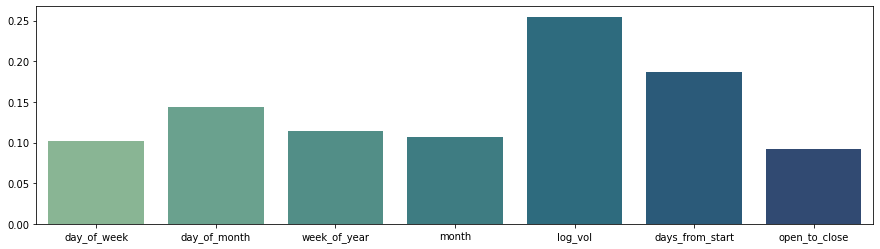

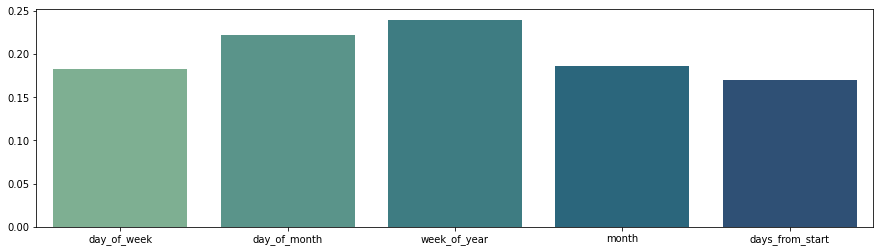


Plotting interpreation plots for a batch of entity 14:


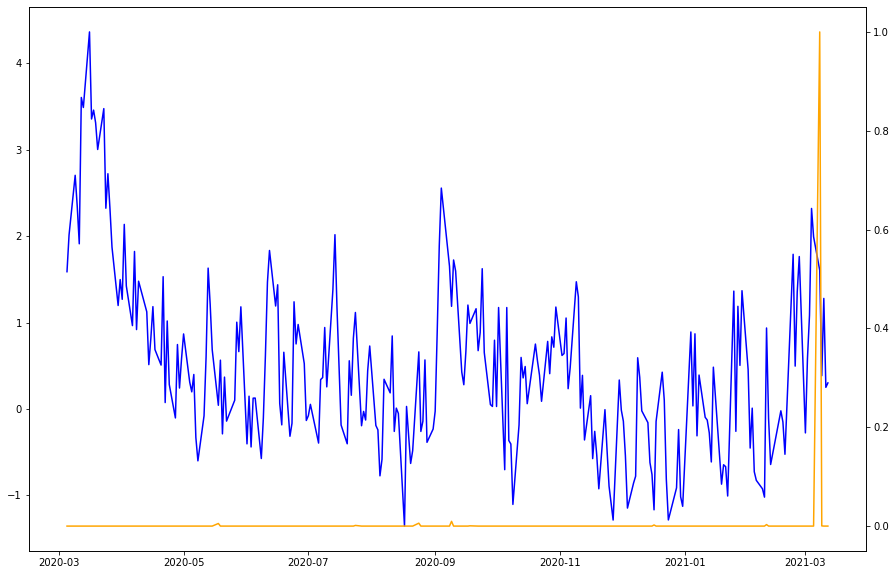

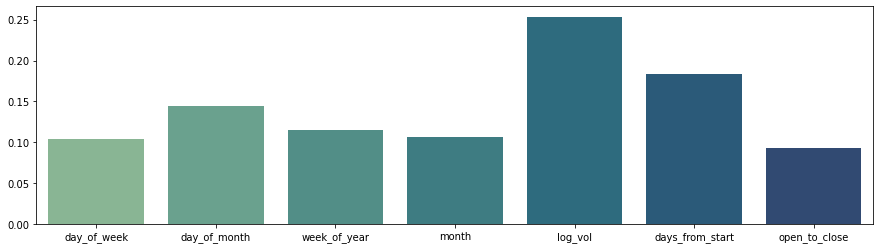

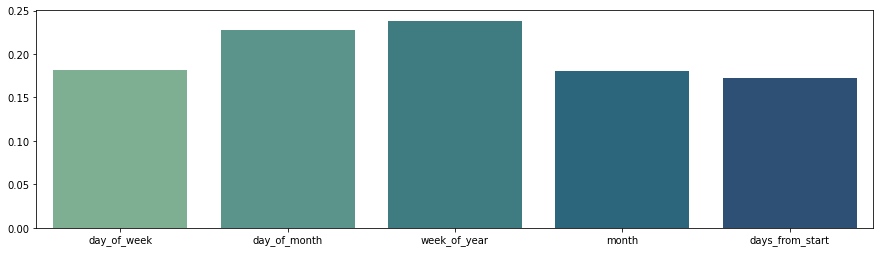


Plotting interpreation plots for a batch of entity 15:


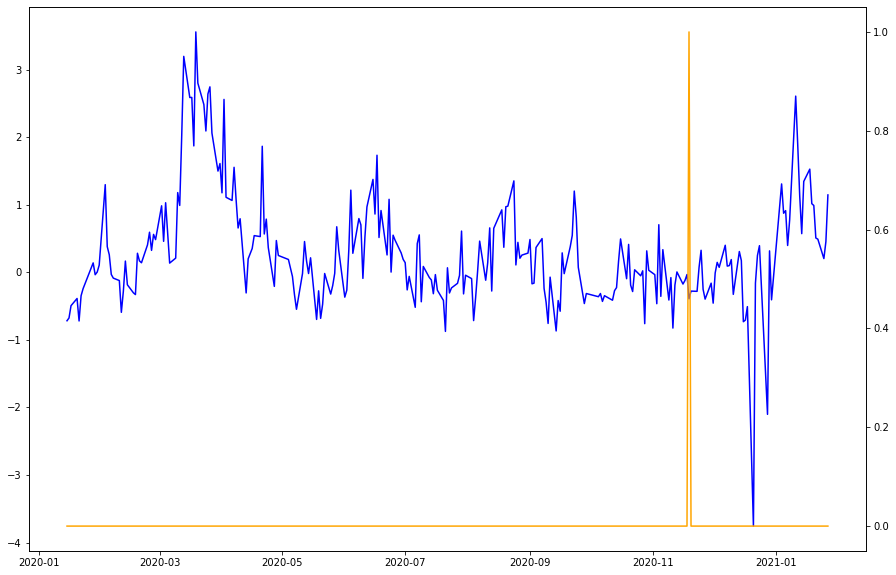

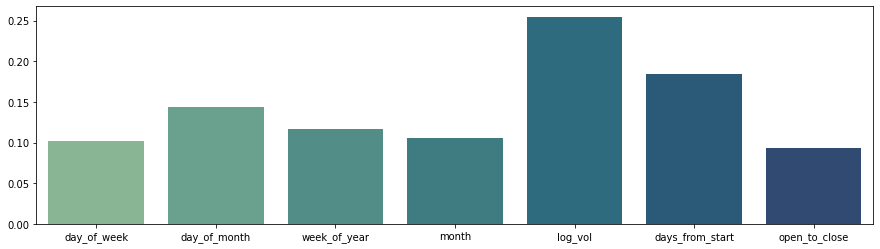

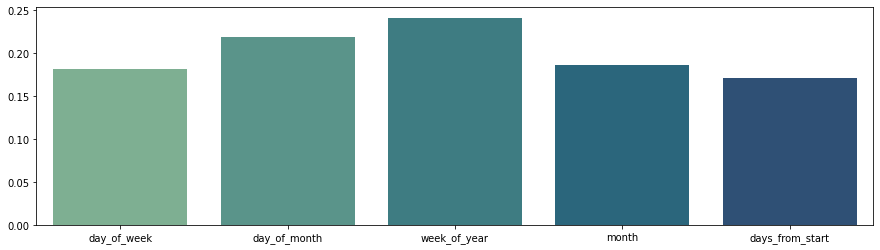


Plotting interpreation plots for a batch of entity 16:


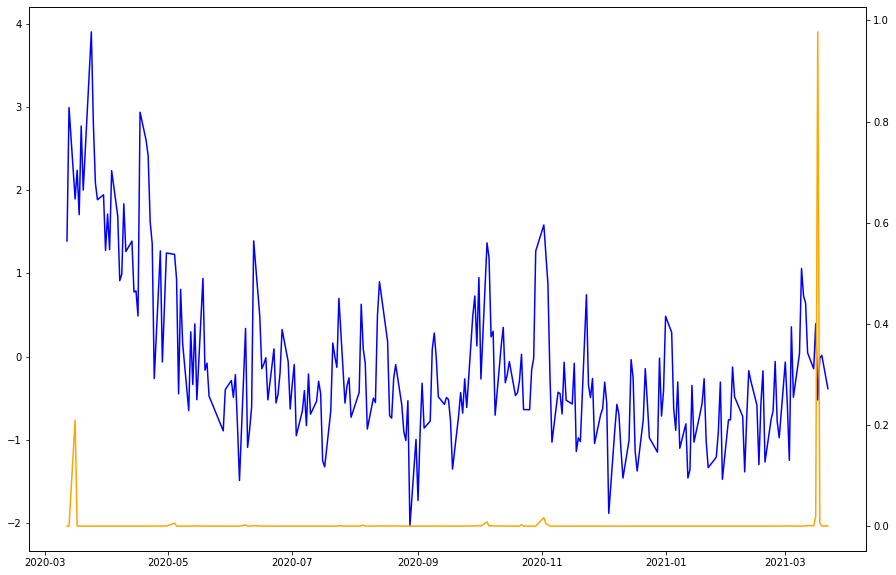

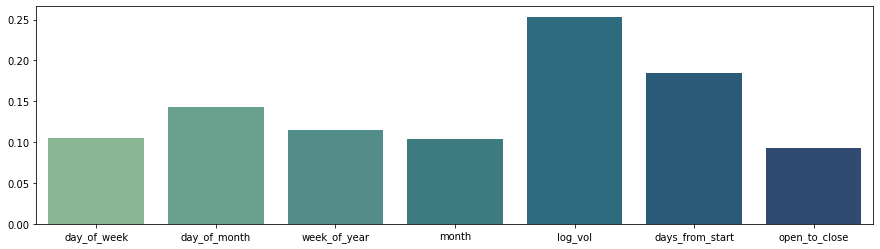

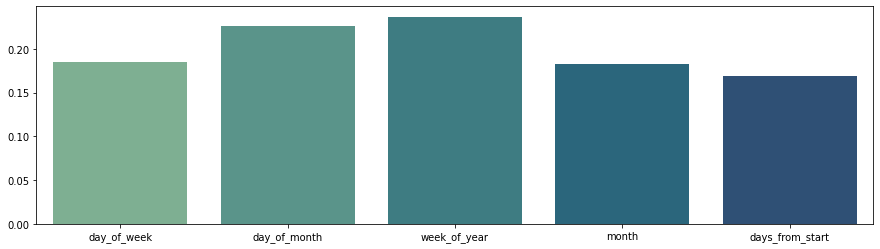


Plotting interpreation plots for a batch of entity 17:


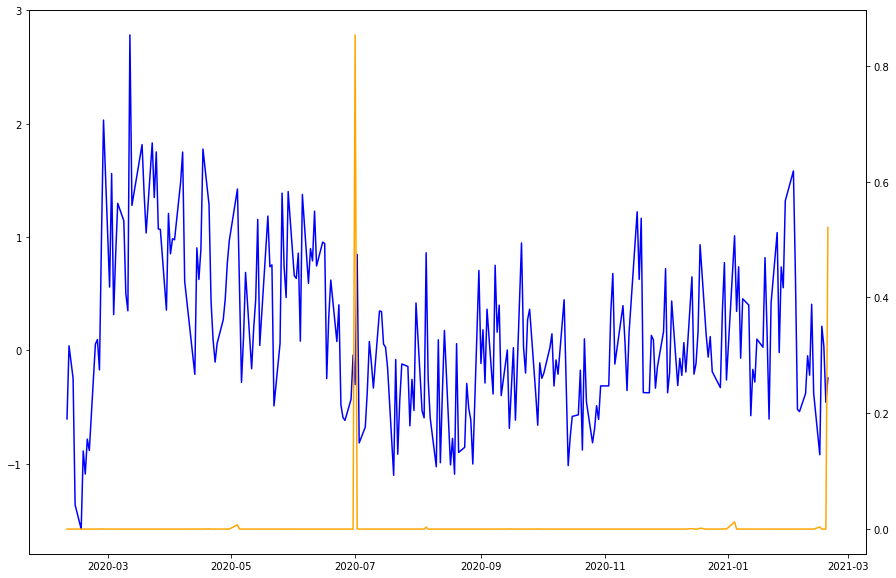

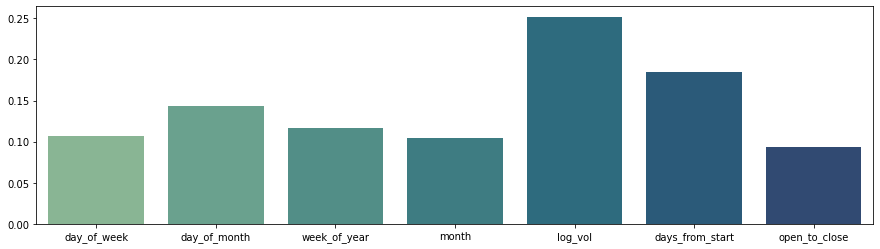

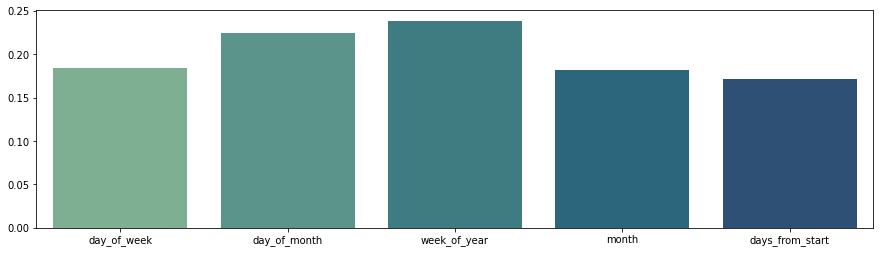


Plotting interpreation plots for a batch of entity 18:


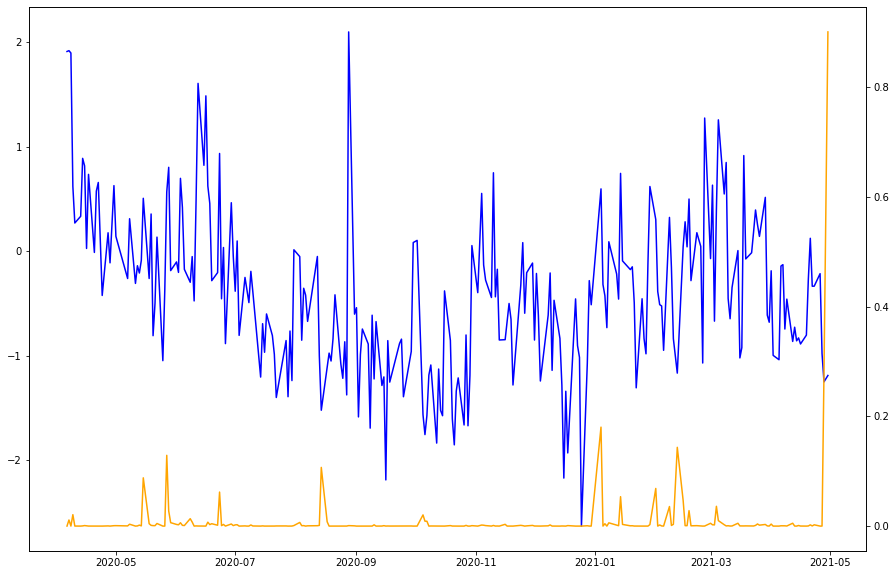

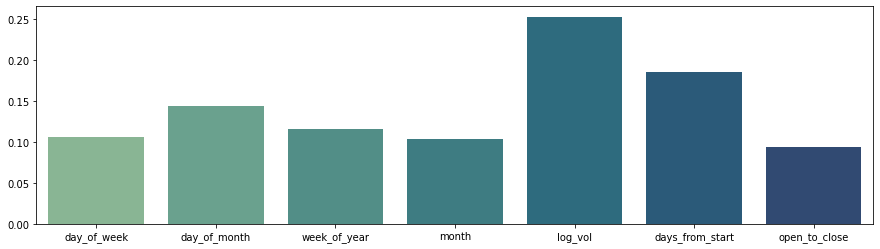

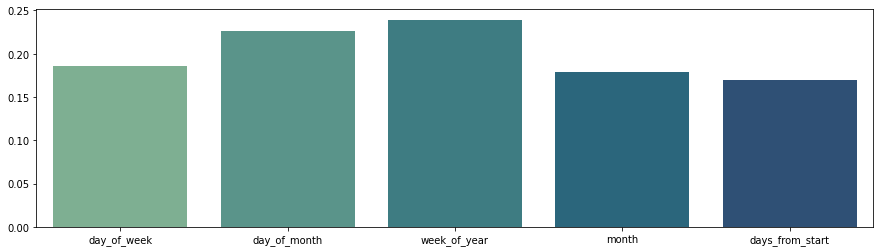


Plotting interpreation plots for a batch of entity 19:


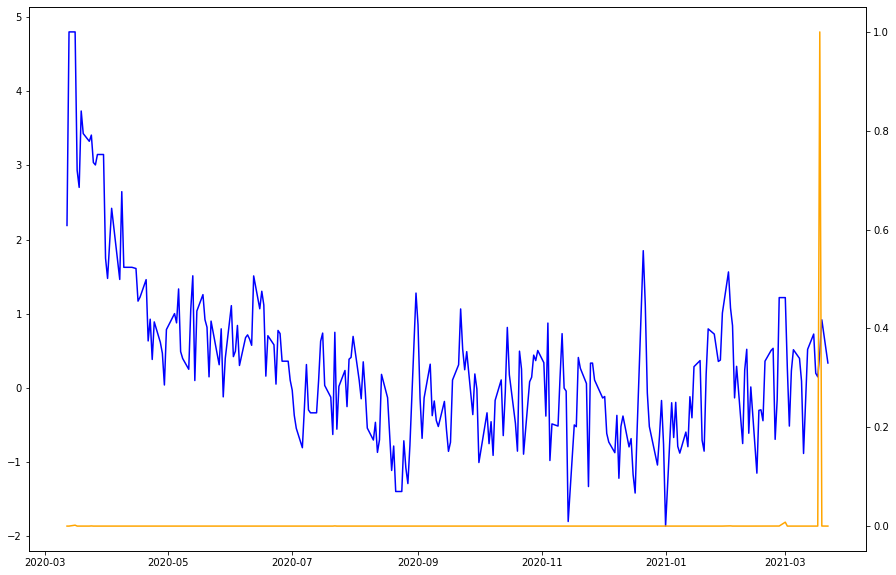

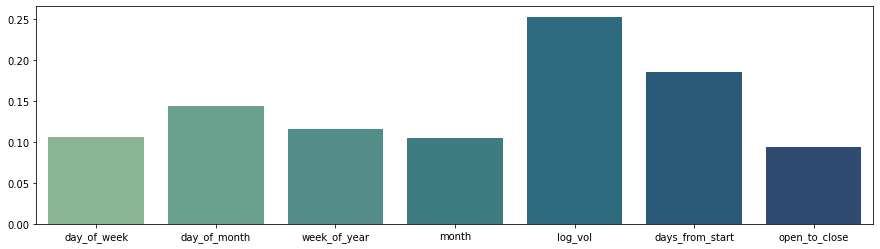

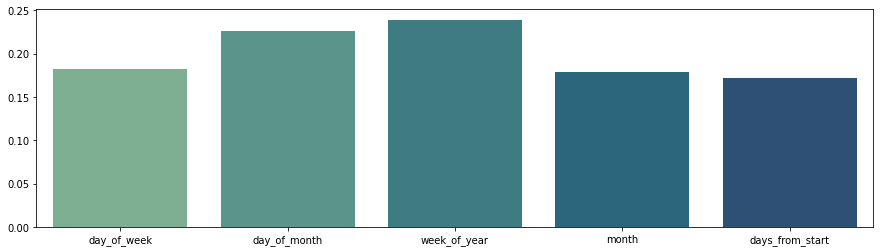


Plotting interpreation plots for a batch of entity 20:


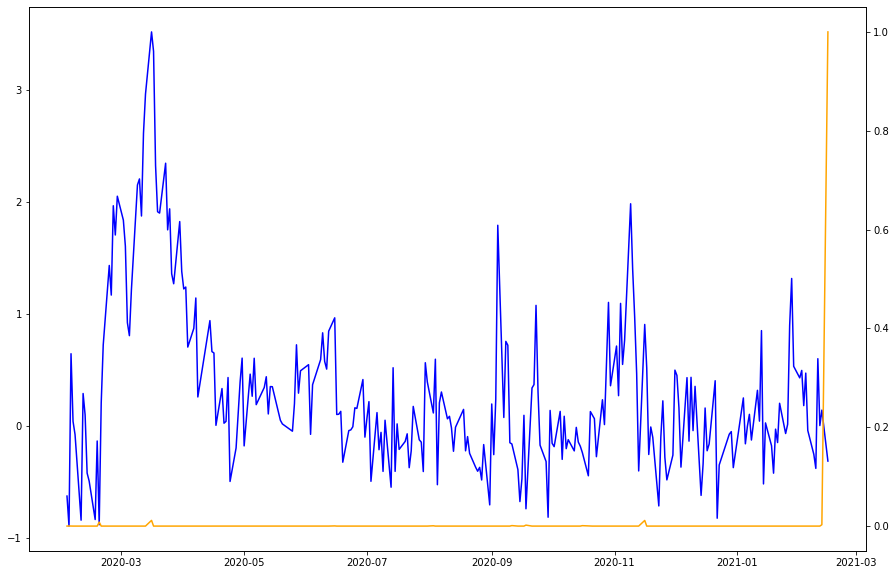

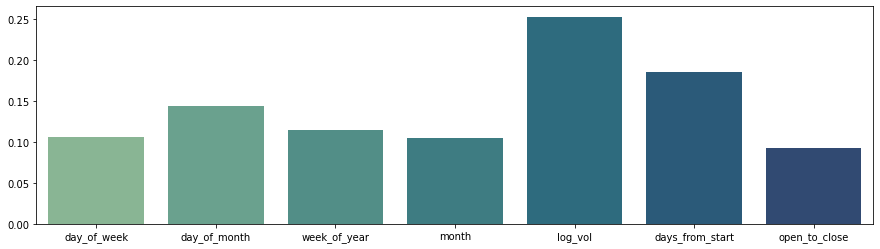

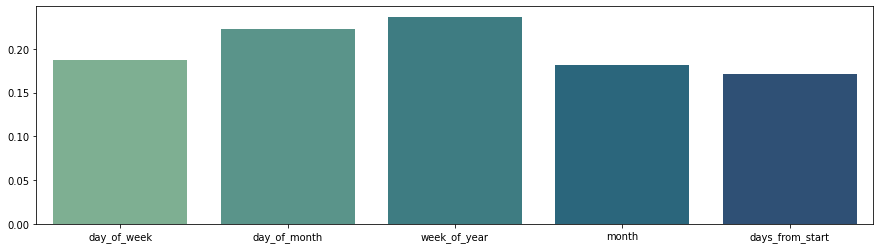


Plotting interpreation plots for a batch of entity 21:


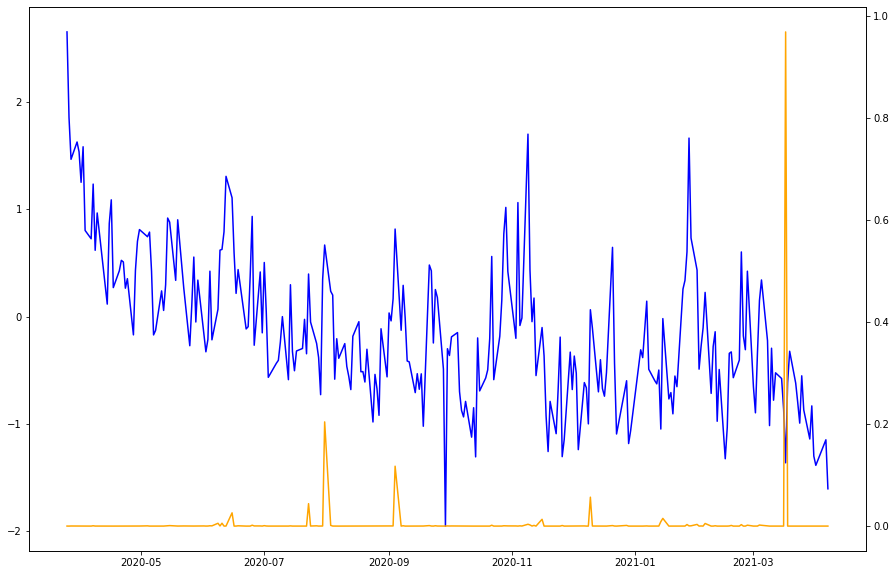

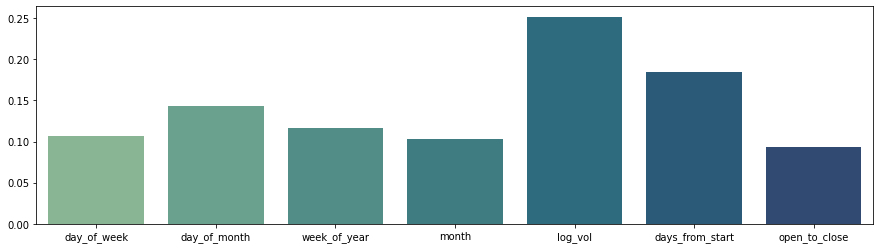

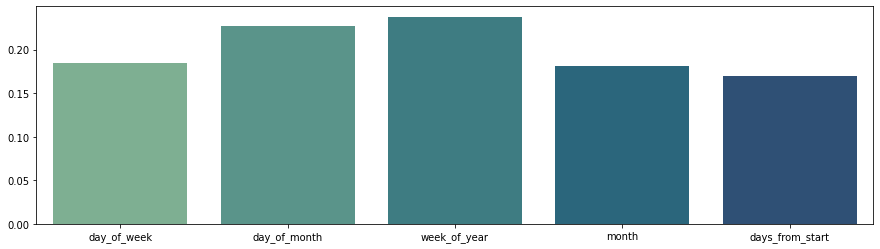


Plotting interpreation plots for a batch of entity 22:


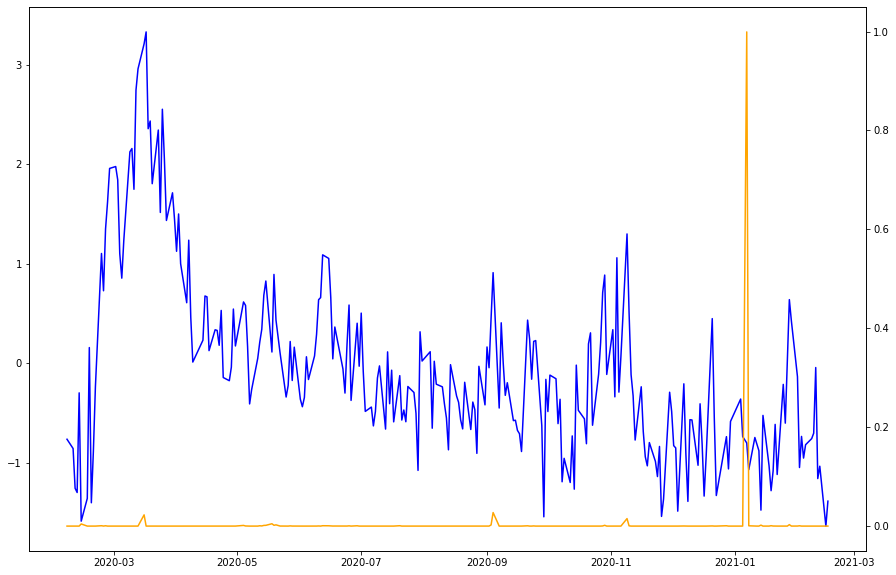

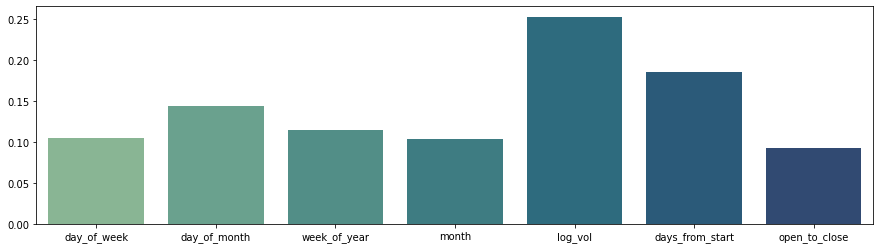

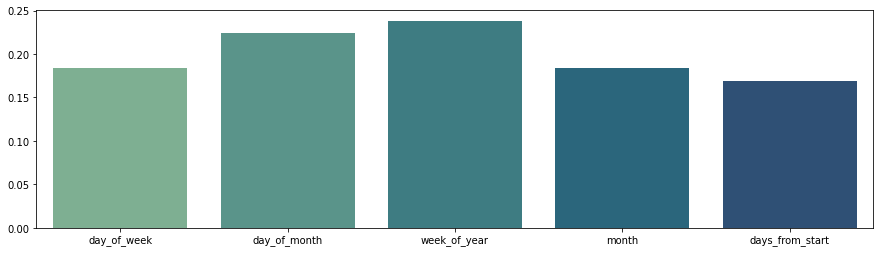


Plotting interpreation plots for a batch of entity 23:


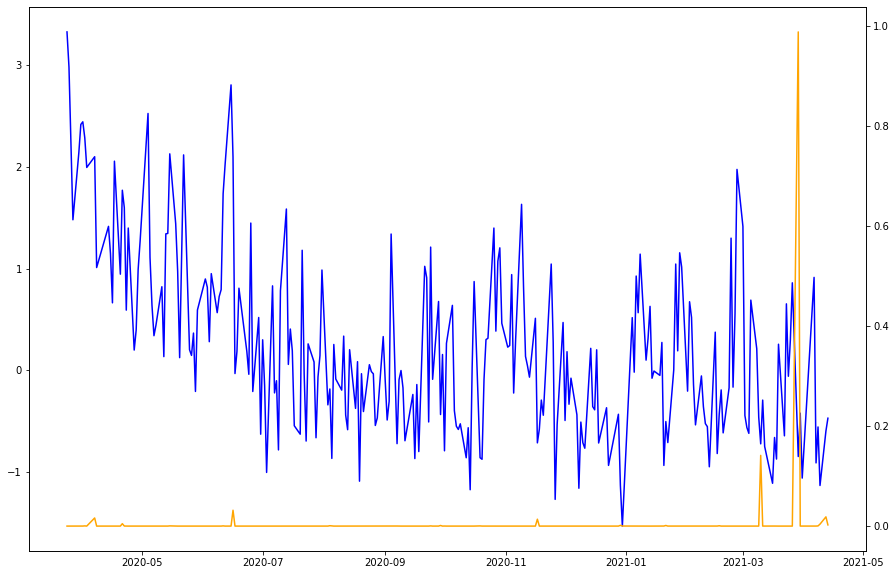

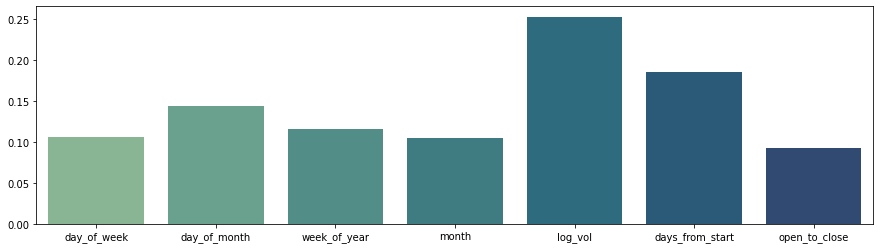

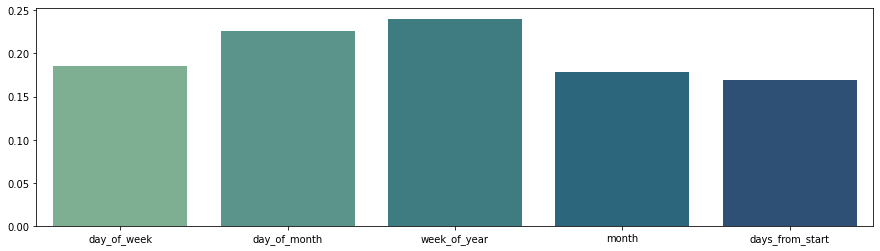


Plotting interpreation plots for a batch of entity 24:


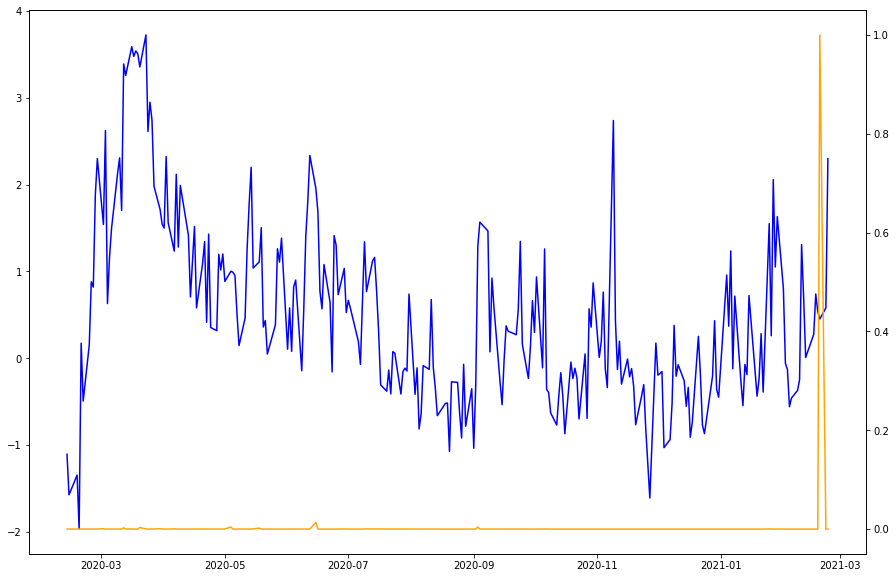

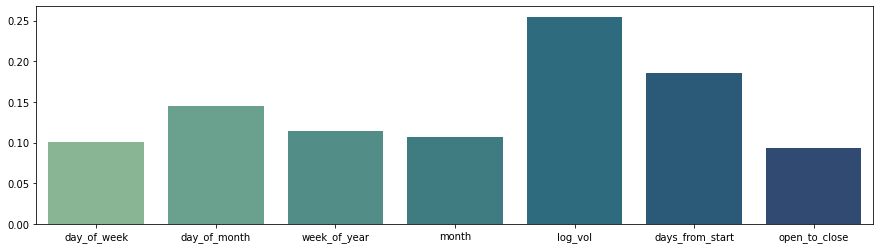

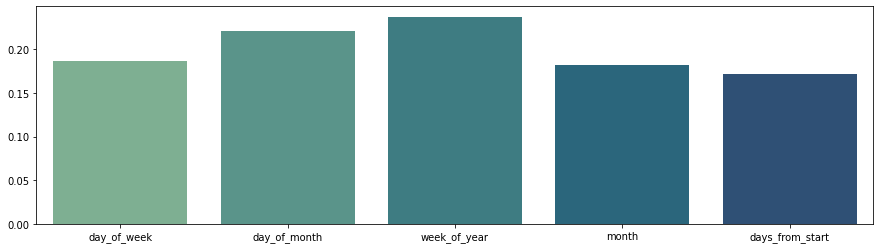


Plotting interpreation plots for a batch of entity 25:


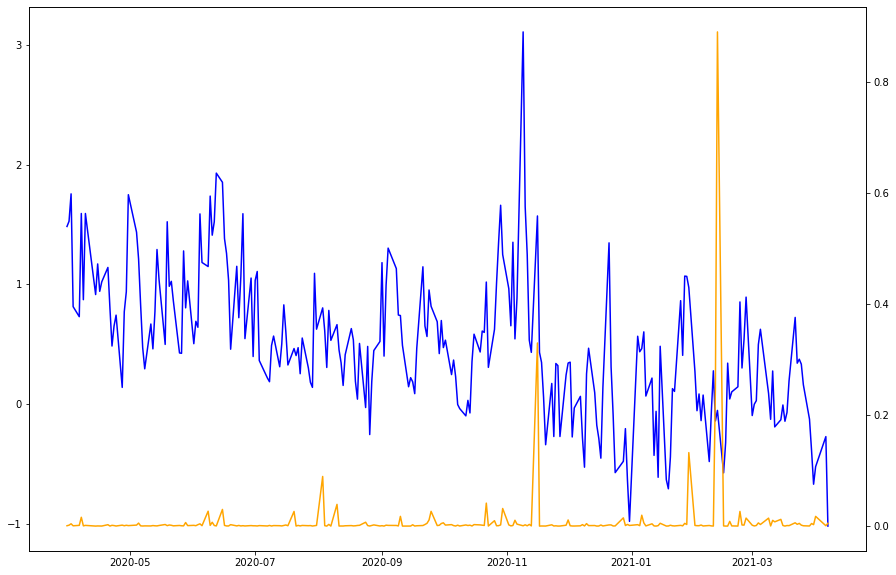

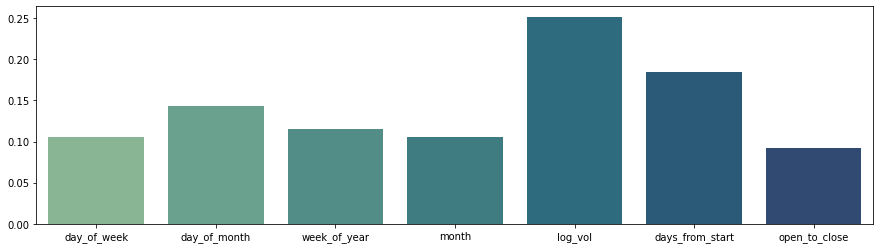

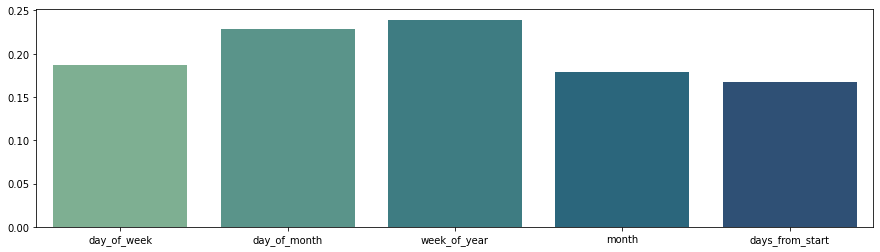


Plotting interpreation plots for a batch of entity 26:


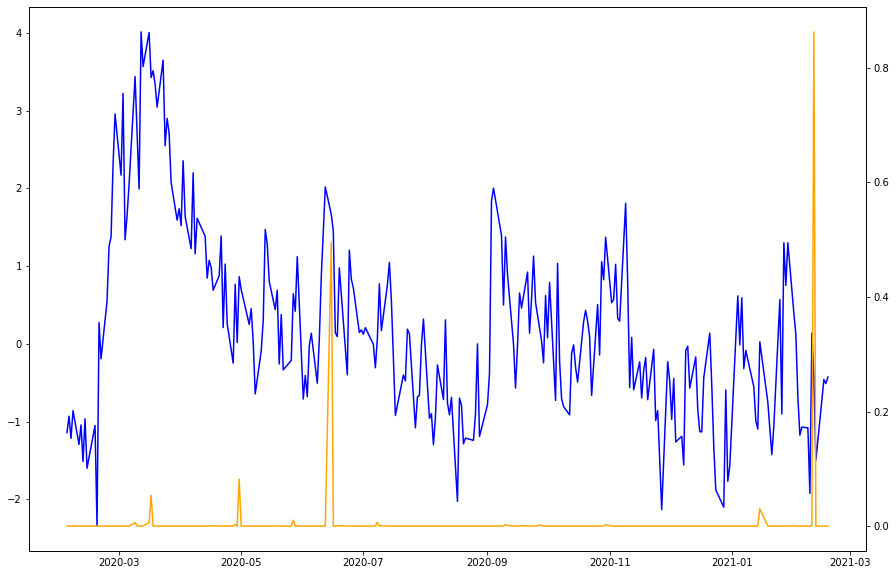

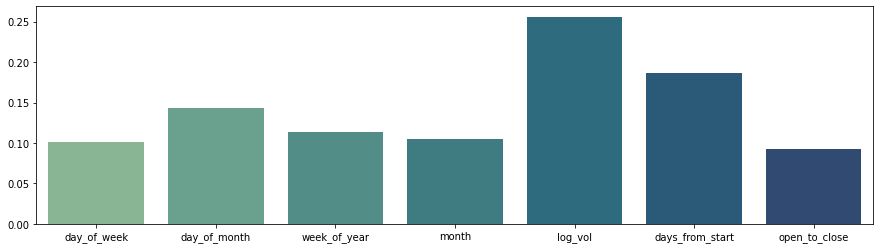

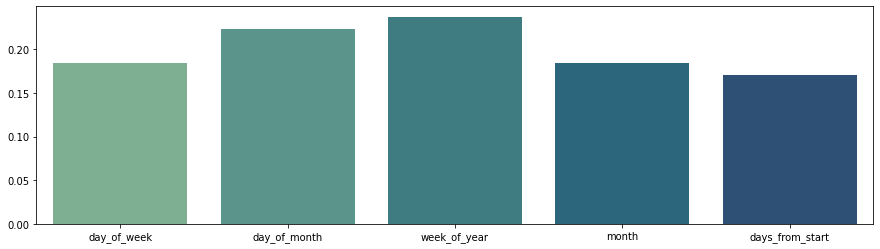


Plotting interpreation plots for a batch of entity 27:


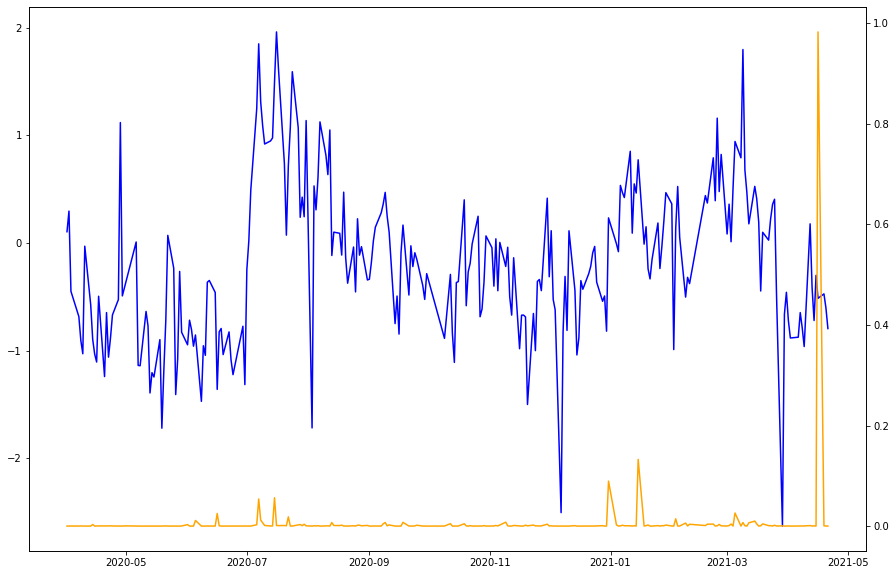

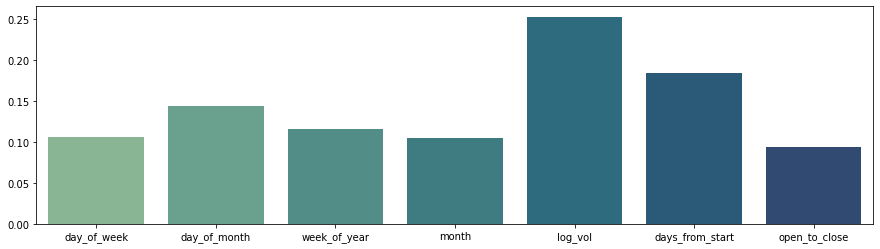

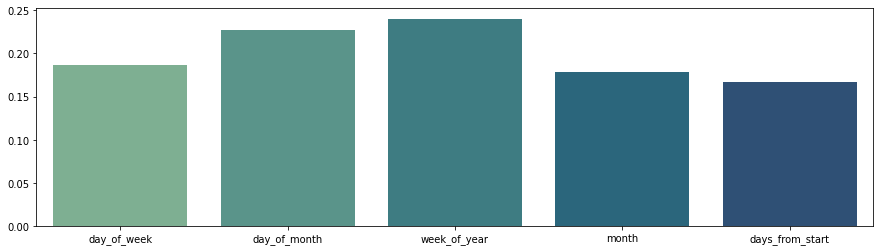


Plotting interpreation plots for a batch of entity 28:


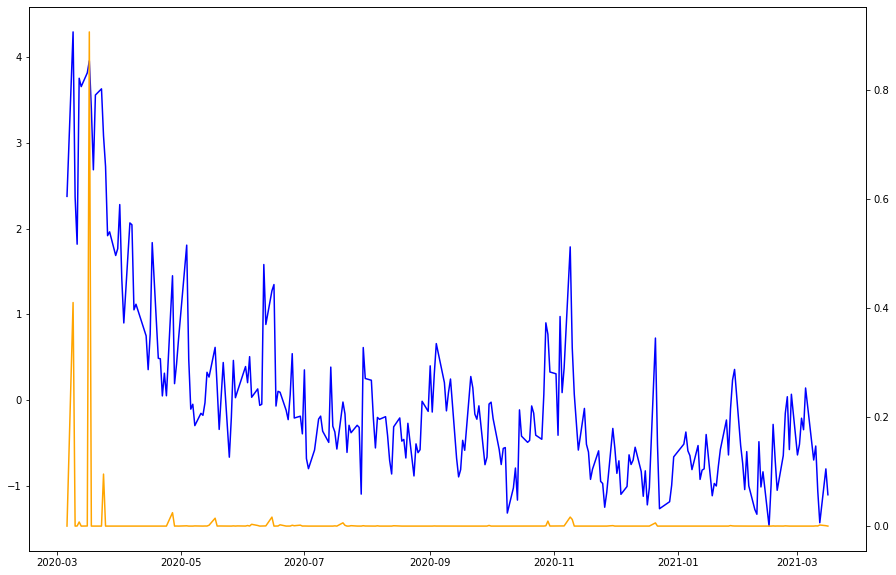

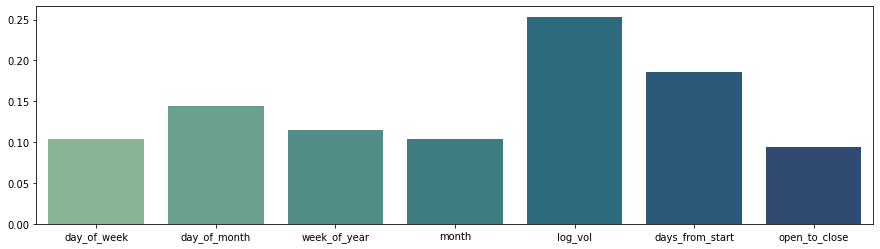

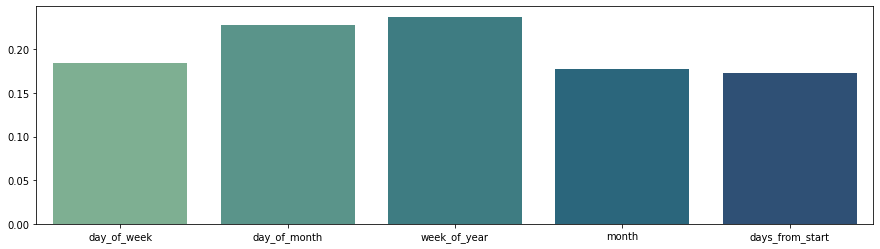


Plotting interpreation plots for a batch of entity 29:


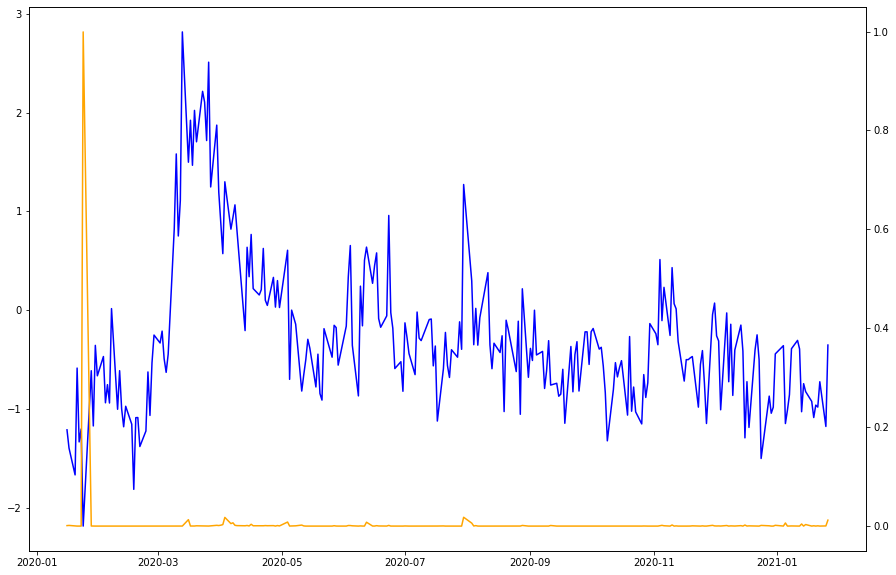

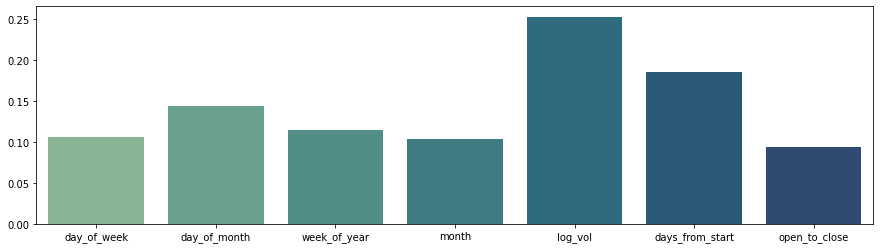

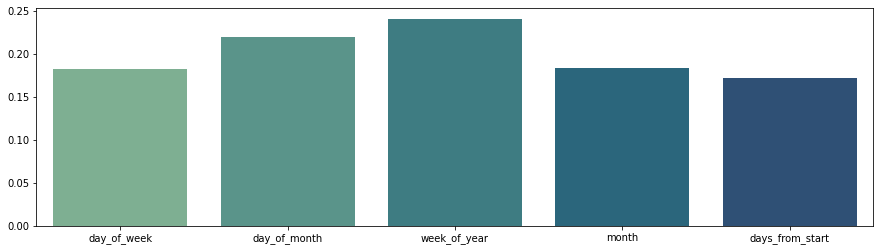


Plotting interpreation plots for a batch of entity 30:


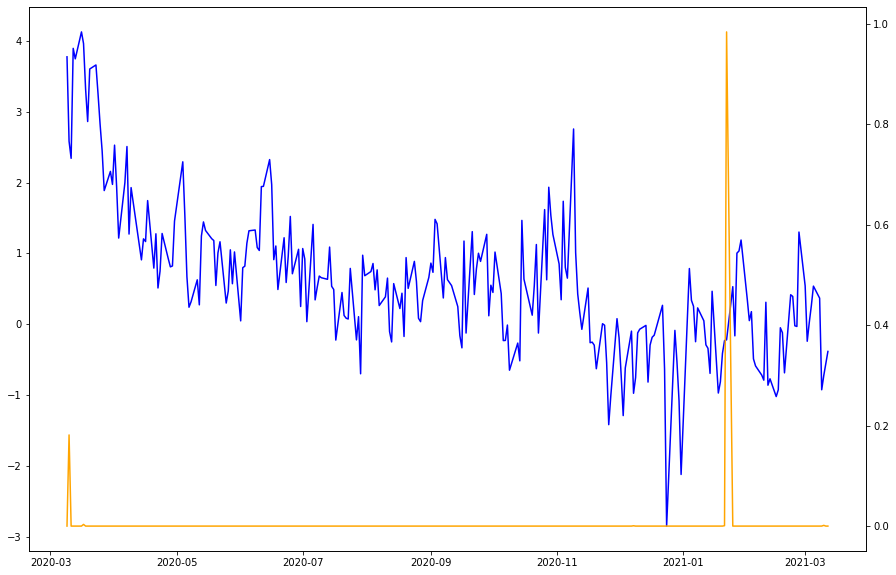

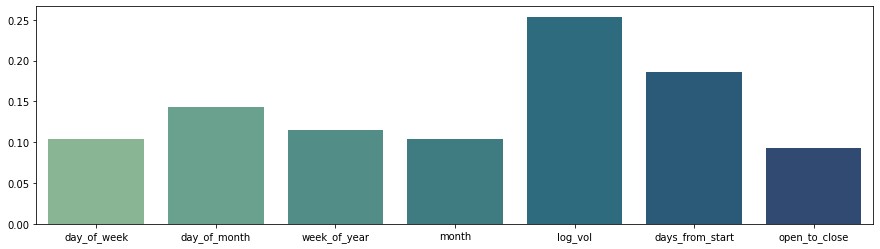

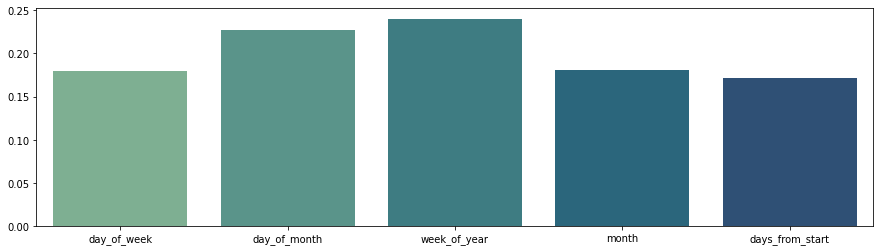

In [42]:
out_df = pd.DataFrame(columns=['p10', 'p50', 'p90', 'identifier'])

start_id = -1

for i, batch in enumerate(test_dataloader):

    outputs, attention_weights = model(batch)
    bs = batch["outputs"].shape[0]

    process_map = {f"p{int(q * 100)}": outputs.reshape(bs, 5, 3)[:, :, i].cpu().detach().numpy()[::5,:].reshape(-1)[:bs] for i, q in enumerate(QUANTILES)}

    tmp = pd.DataFrame(data=process_map, index=pd.to_datetime(batch['time'][:, ENCODER_STEPS - 1, 0]))
    tmp["labels"] = batch["outputs"].reshape(-1)[::5]
    tmp["identifier"] = batch['identifier'][:, 0, 0]
    
    out_df = pd.concat([out_df, tmp])
    
    e = int(batch['identifier'][0, 0, 0].numpy())
    if batch['identifier'][0, 0, 0].numpy() != start_id:
        
        print("="*20)
        print(f"Plotting interpreation plots for a batch of entity {e}:")
        
        id_mask = batch['identifier'][:, 0, 0]==e
        
        #Plotting multi-head attention
        plt.figure(figsize=(15,10))
        sns.lineplot(x=pd.to_datetime(batch["time"][0,:,0].numpy()),
                     y=batch["inputs"][0,:,0].numpy(), color="blue")
        ax2 = plt.twinx()

        attn = attention_weights['multihead_attention'][0].cpu().detach().numpy().mean(axis=0)
        sns.lineplot(x=pd.to_datetime(batch["time"][0,:,0].numpy()),
                     y=attn/np.linalg.norm(attn),
                     ax=ax2, color="orange")
        plt.show()
        
        past_inputs = ["day_of_week", "day_of_month", "week_of_year", "month", 'log_vol', 'days_from_start', "open_to_close"]
        future_inputs = ["day_of_week", "day_of_month", "week_of_year", "month", "days_from_start"]
        
        # Plotting past weights
        plt.figure(figsize=(15,4))
        sns.barplot(x=past_inputs, 
                    y=attention_weights['past_weights'][id_mask,:,:].mean(dim=(0,1)).cpu().detach().numpy(), 
                    palette="crest")
        plt.show()

        # Plotting future weights
        plt.figure(figsize=(15,4))
        sns.barplot(x=future_inputs, 
                    y=attention_weights['future_weights'][id_mask,:,:].mean(dim=(0,1)).cpu().detach().numpy(), 
                    palette="crest")
        plt.show()
        start_id = e
        print()

# Forecast Result

['.AEX']
MAE :  0.82728726
MSE :  1.0433145
SMAPE :  0.6754477


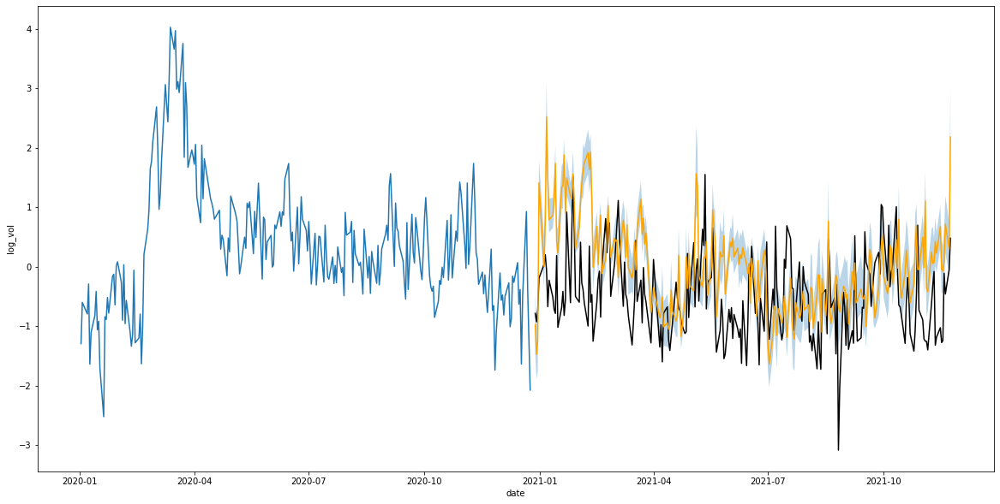

['.AORD']
MAE :  0.84351647
MSE :  1.10455
SMAPE :  0.58469576


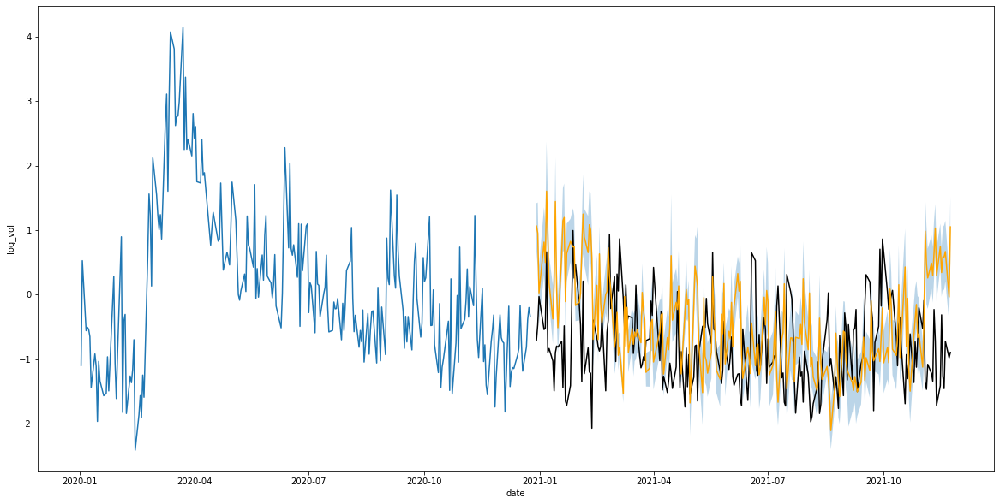

['.BFX']
MAE :  0.78587466
MSE :  0.9458063
SMAPE :  0.6572944


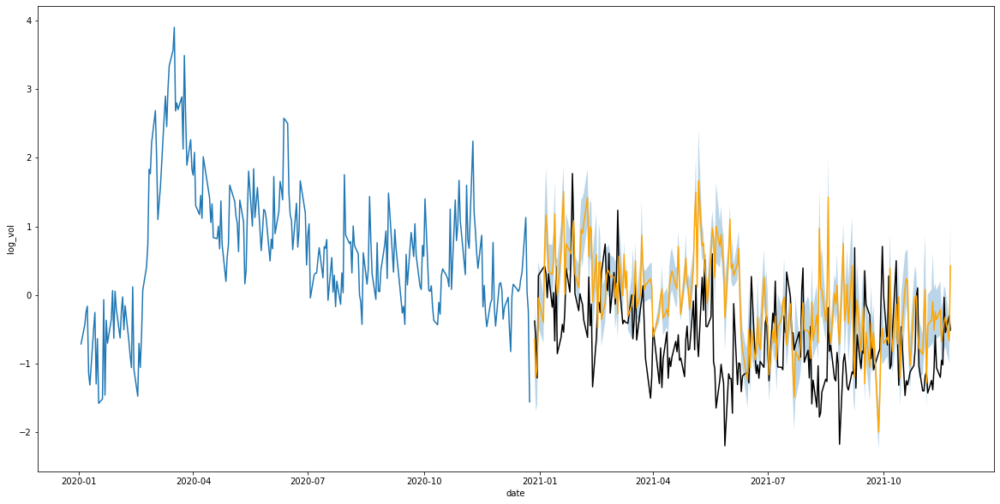

['.BSESN']
MAE :  0.852511
MSE :  1.0749549
SMAPE :  0.72439134


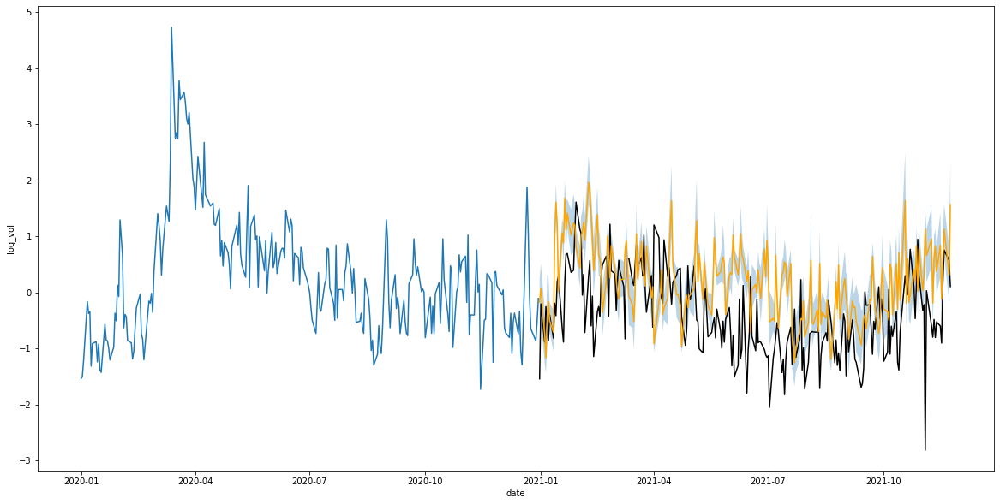

['.BVLG']
MAE :  0.53701174
MSE :  0.4791918
SMAPE :  0.6542834


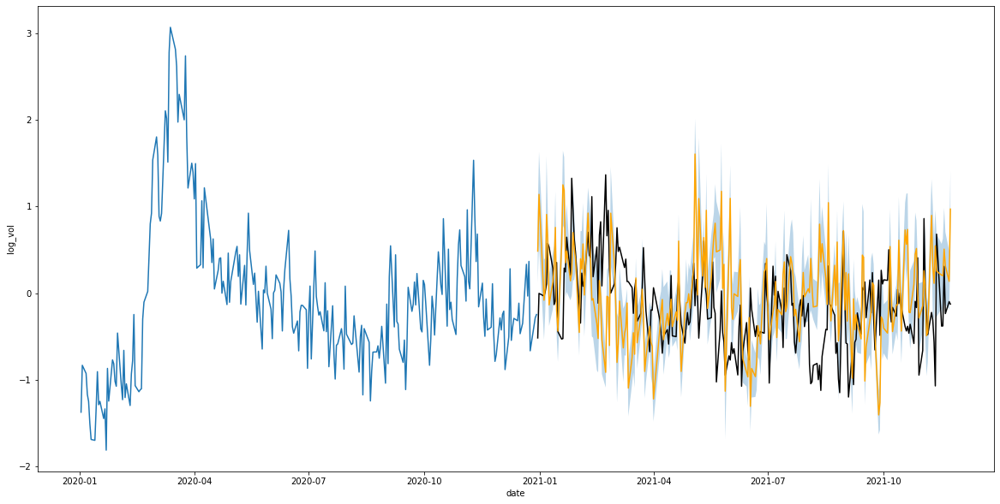

['.BVSP']
MAE :  0.8516044
MSE :  1.0879347
SMAPE :  0.6960473


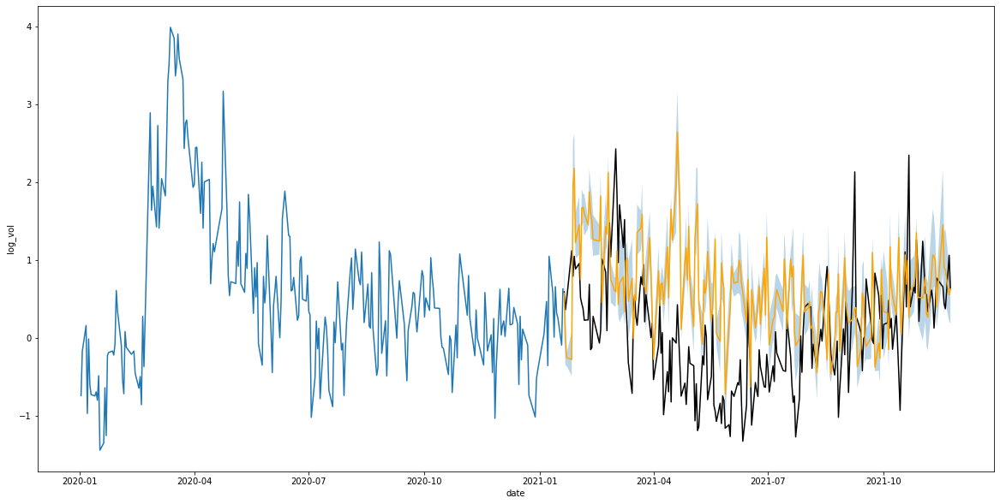

['.DJI']
MAE :  0.9593358
MSE :  1.4053339
SMAPE :  0.70771426


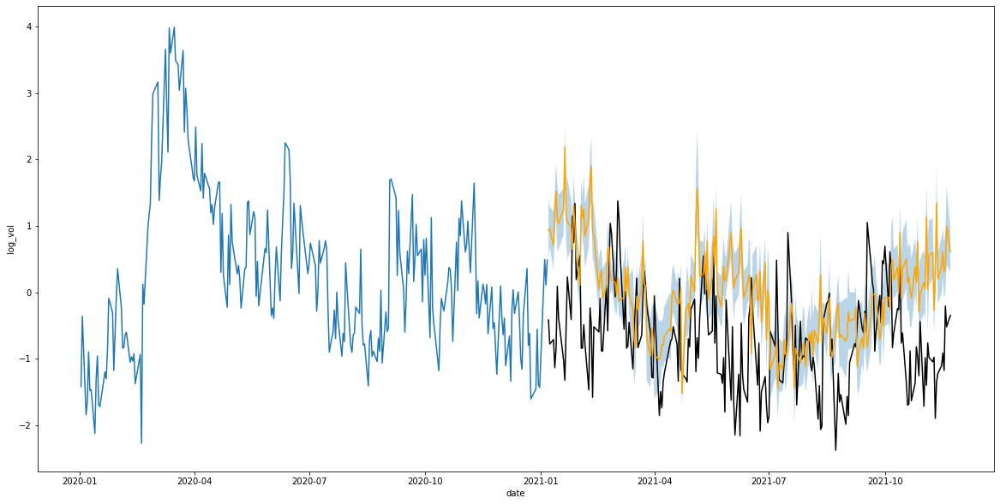

['.FCHI']
MAE :  0.9126035
MSE :  1.2258452
SMAPE :  0.72808796


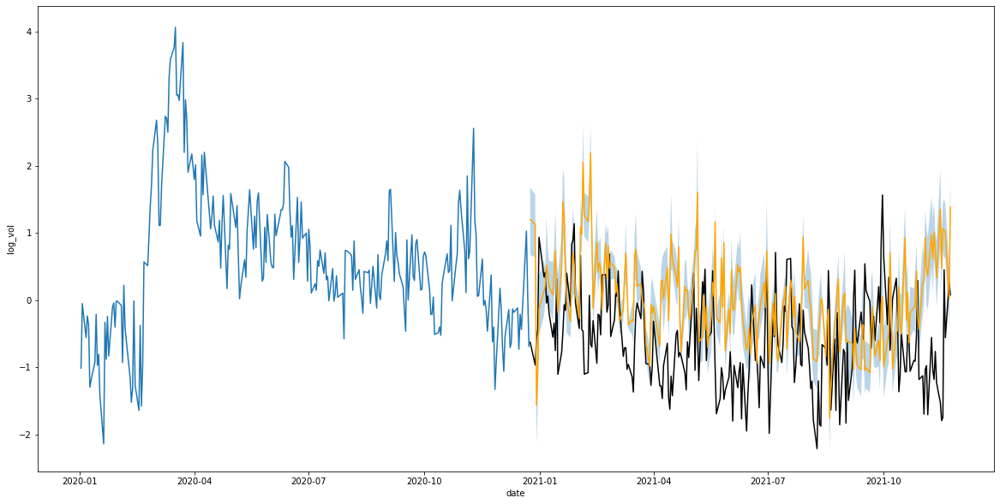

['.FTMIB']
MAE :  0.8199361
MSE :  1.0286572
SMAPE :  0.63957417


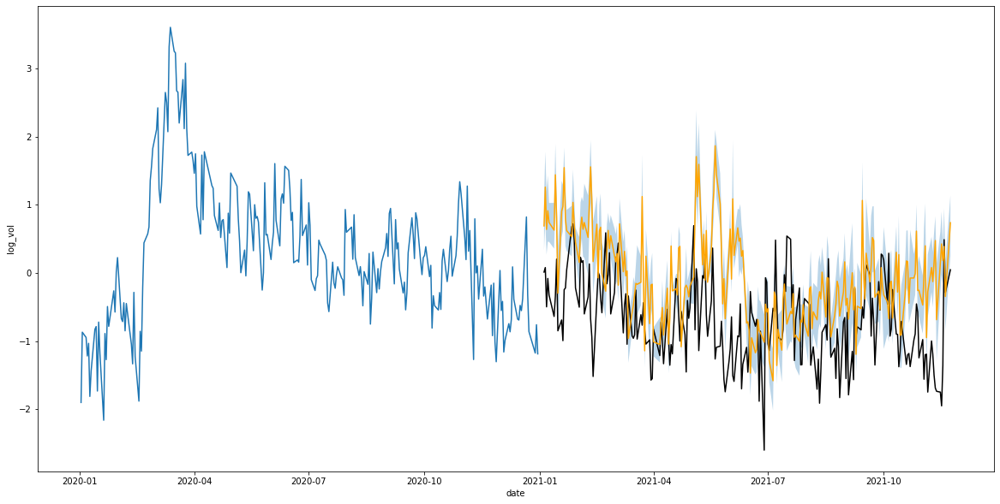

['.FTSE']
MAE :  1.0437058
MSE :  1.5698054
SMAPE :  0.7908645


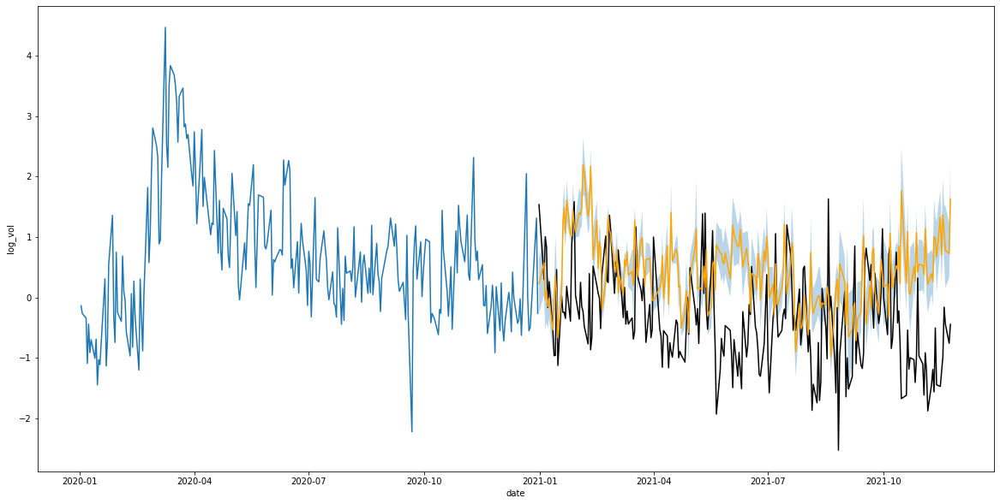

['.GDAXI']
MAE :  0.8224072
MSE :  0.9918994
SMAPE :  0.65677243


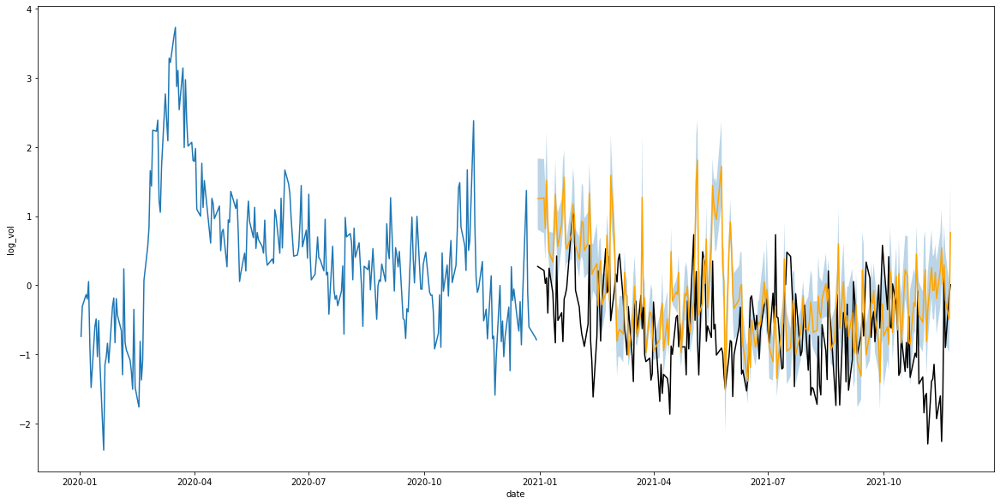

['.GSPTSE']
MAE :  0.86853844
MSE :  1.2042392
SMAPE :  0.4703868


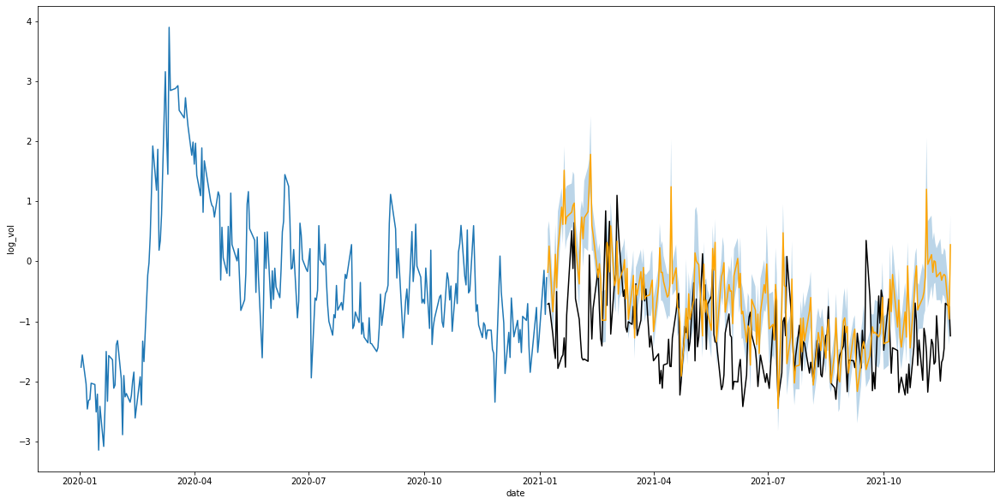

['.HSI']
MAE :  0.8853462
MSE :  1.146868
SMAPE :  0.7495623


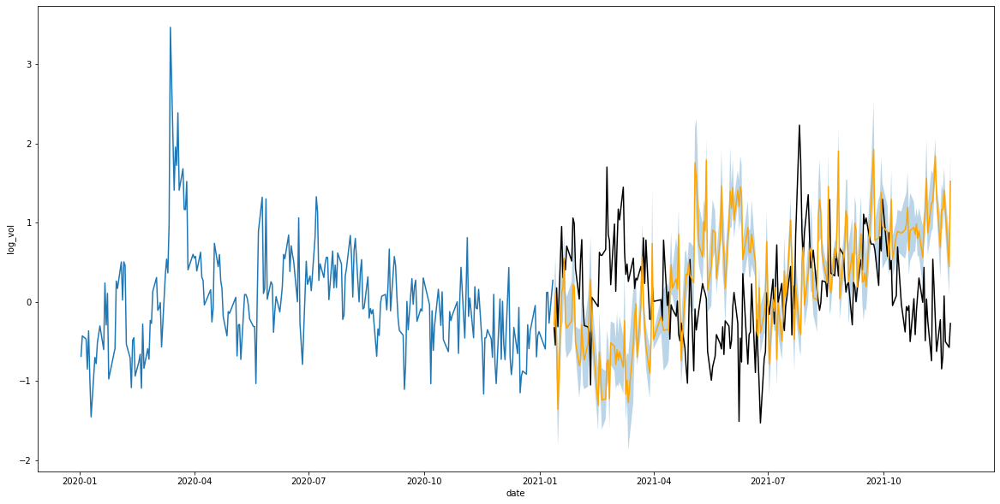

['.IBEX']
MAE :  0.8845449
MSE :  1.1112224
SMAPE :  0.7624522


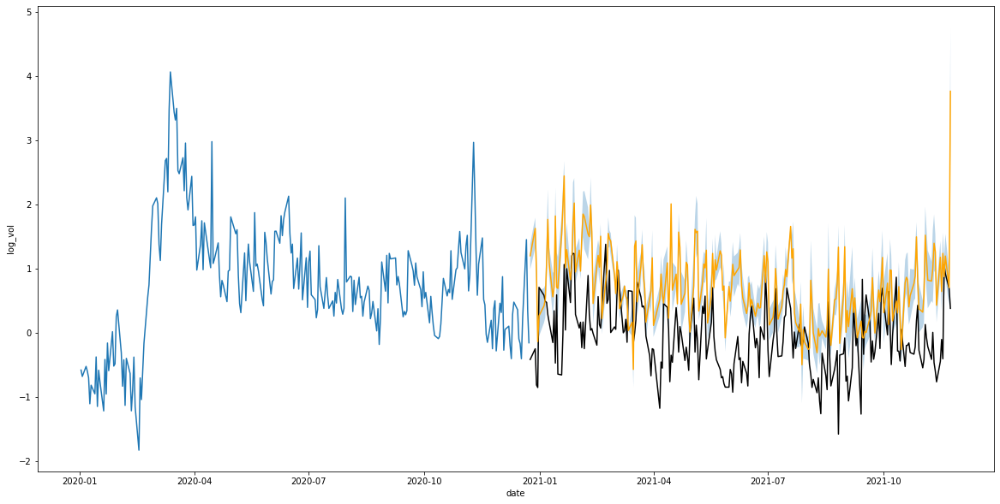

['.IXIC']
MAE :  0.9905132
MSE :  1.4324582
SMAPE :  0.76553357


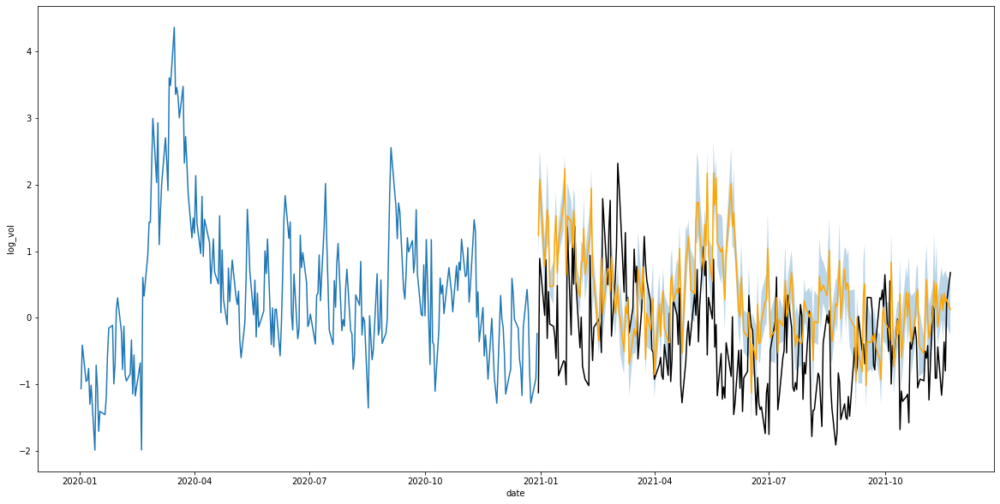

['.KS11']
MAE :  1.0006224
MSE :  1.5687369
SMAPE :  0.7655091


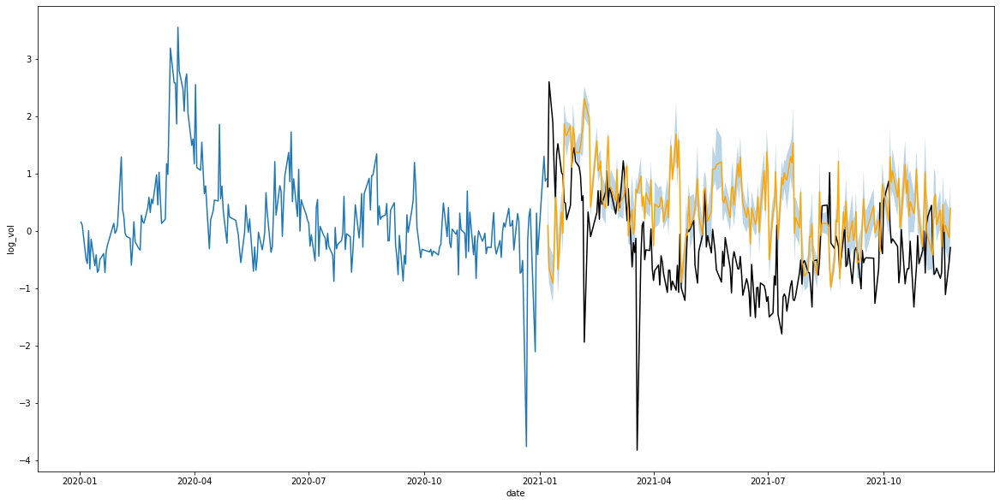

['.KSE']
MAE :  0.7844196
MSE :  0.96009153
SMAPE :  0.60664654


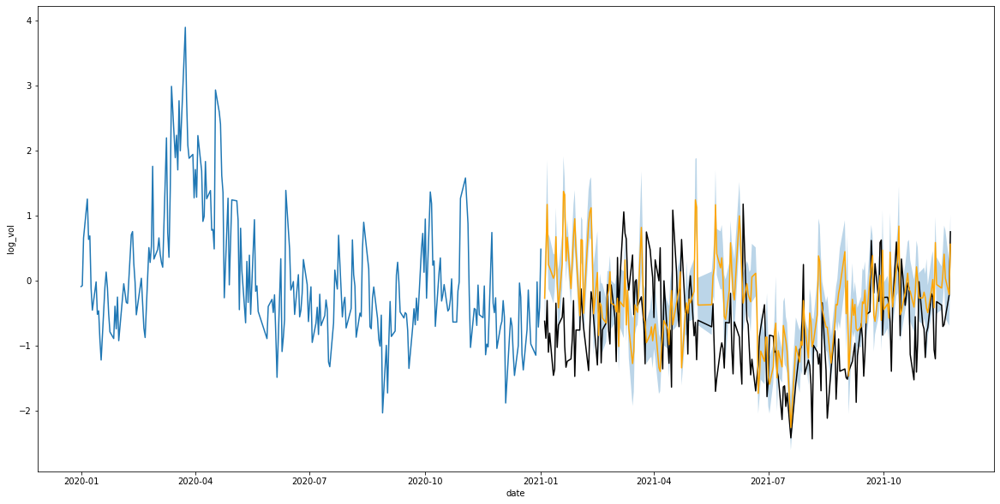

['.MXX']
MAE :  0.6504809
MSE :  0.67516303
SMAPE :  0.6703929


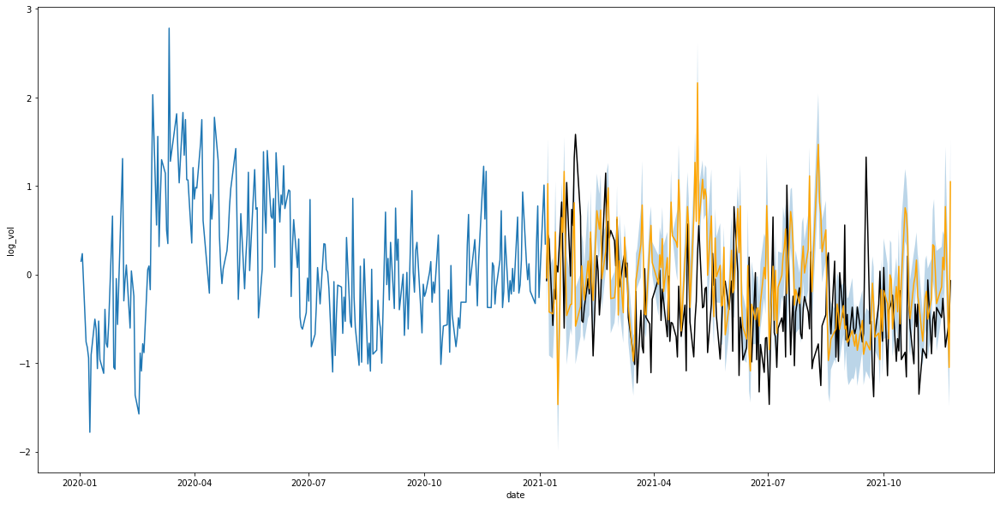

['.N225']
MAE :  0.69419056
MSE :  0.79700434
SMAPE :  0.6360758


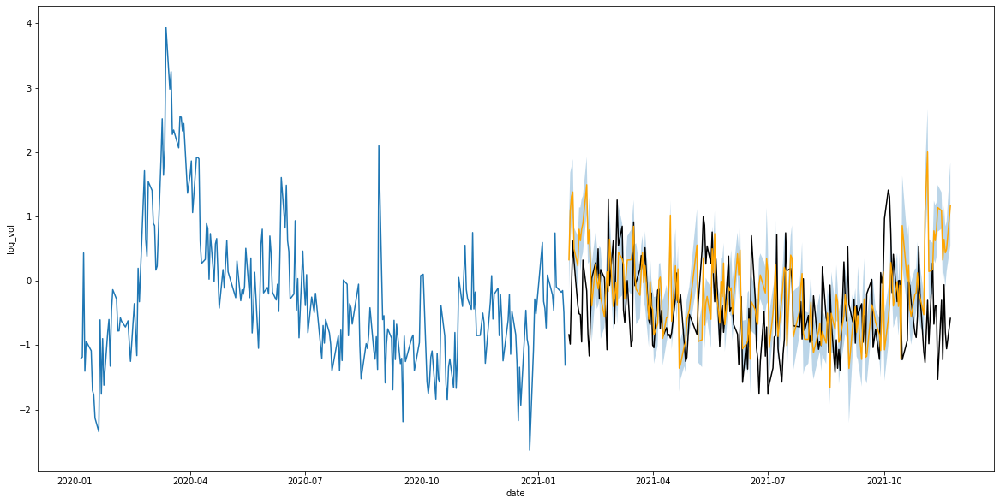

['.NSEI']
MAE :  0.86042434
MSE :  1.1492357
SMAPE :  0.7207926


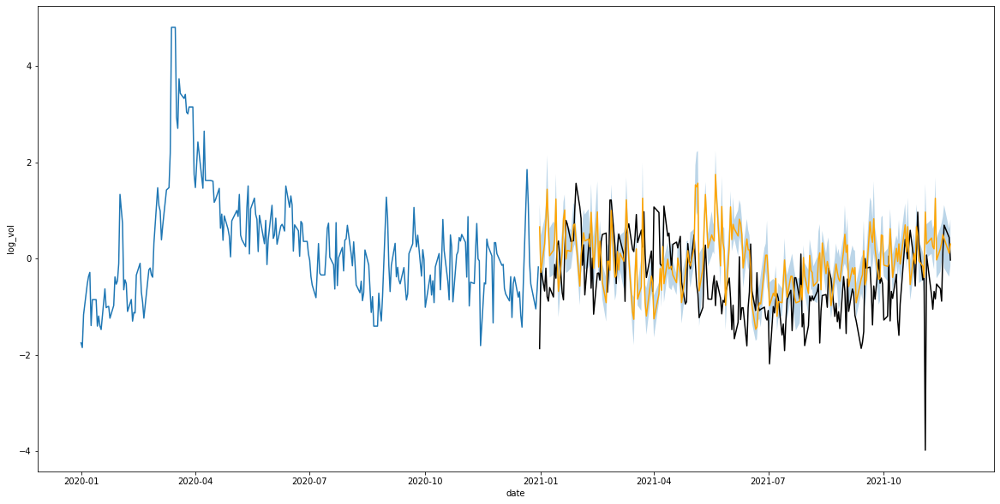

['.OMXC20']
MAE :  0.67841953
MSE :  0.7113645
SMAPE :  0.7169126


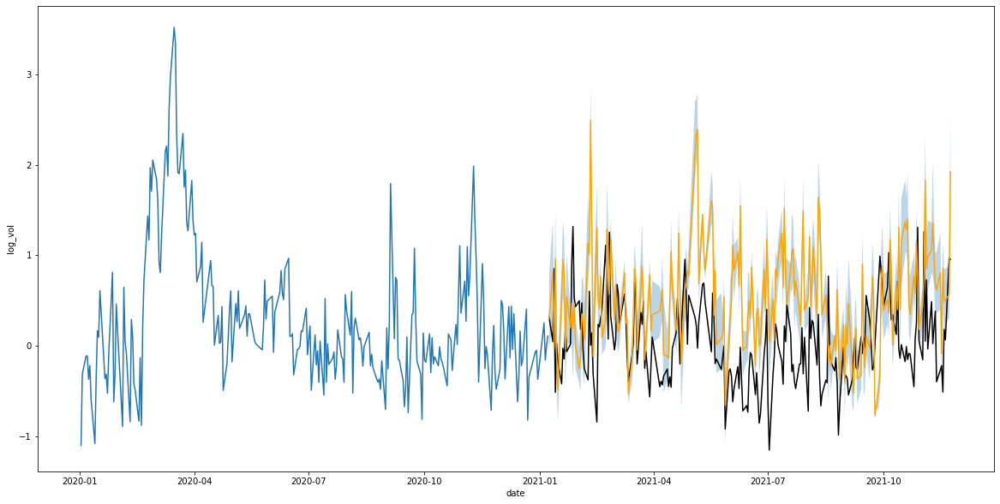

['.OMXHPI']
MAE :  0.71939033
MSE :  0.7733364
SMAPE :  0.592224


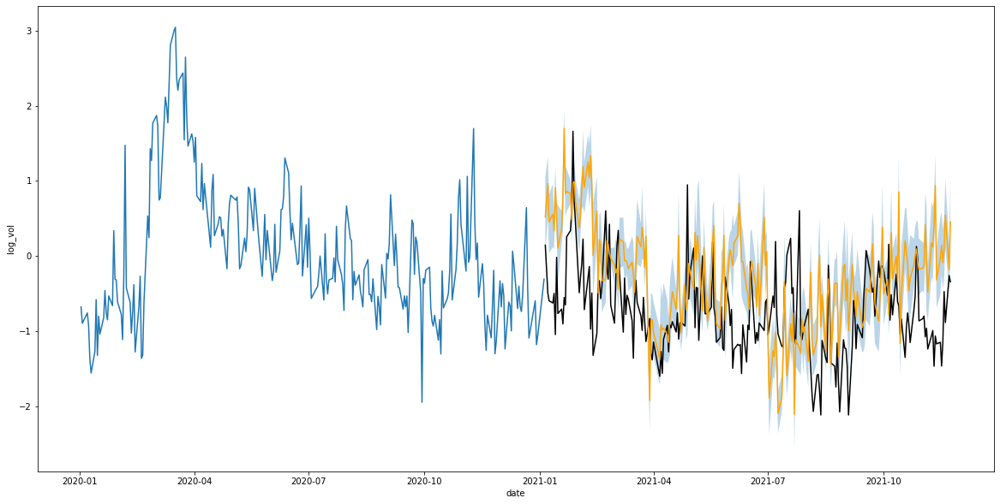

['.OMXSPI']
MAE :  0.6595326
MSE :  0.69322634
SMAPE :  0.5377946


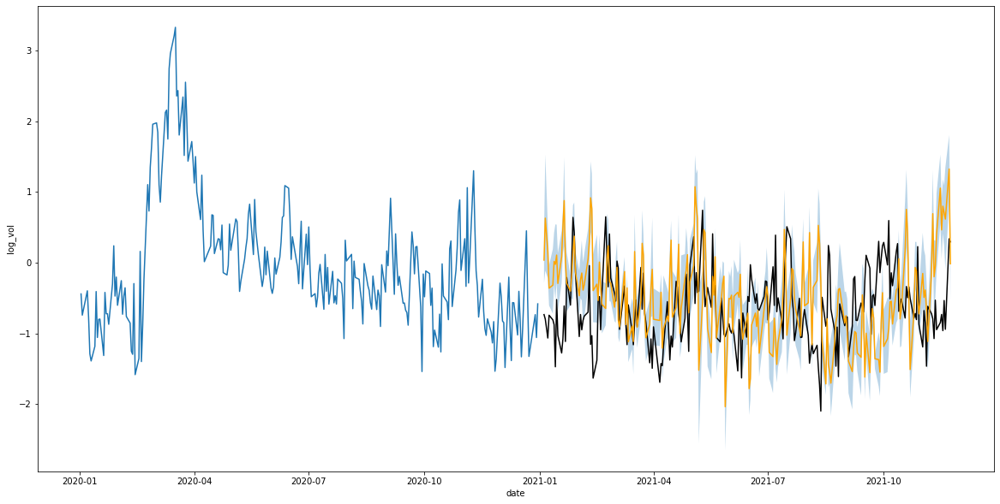

['.OSEAX']
MAE :  0.6705858
MSE :  0.719861
SMAPE :  0.65768516


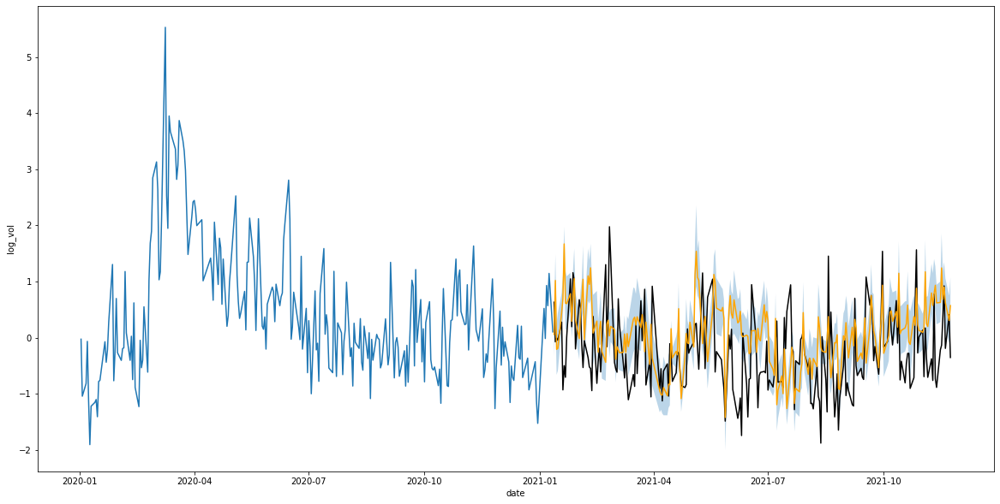

['.RUT']
MAE :  0.83650804
MSE :  1.0206708
SMAPE :  0.7532882


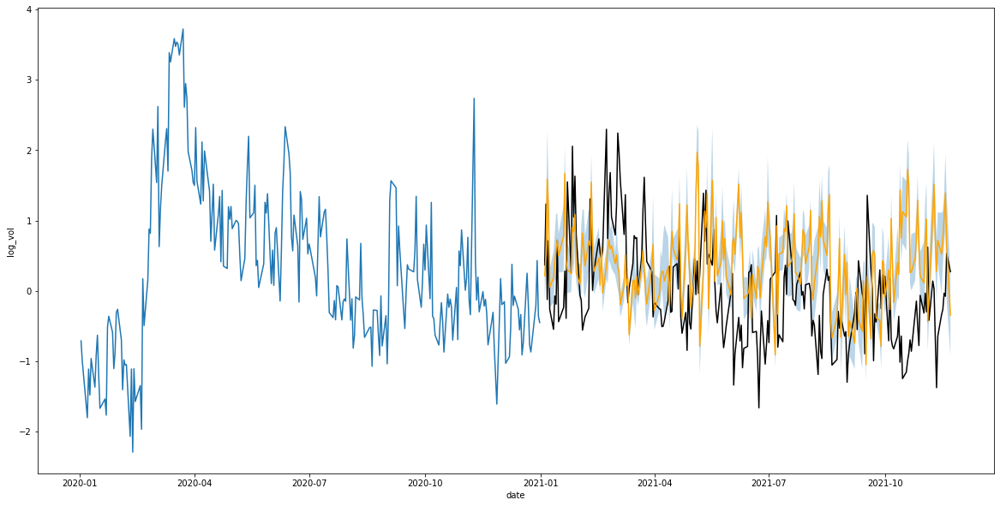

['.SMSI']
MAE :  0.70695895
MSE :  0.7755937
SMAPE :  0.75523263


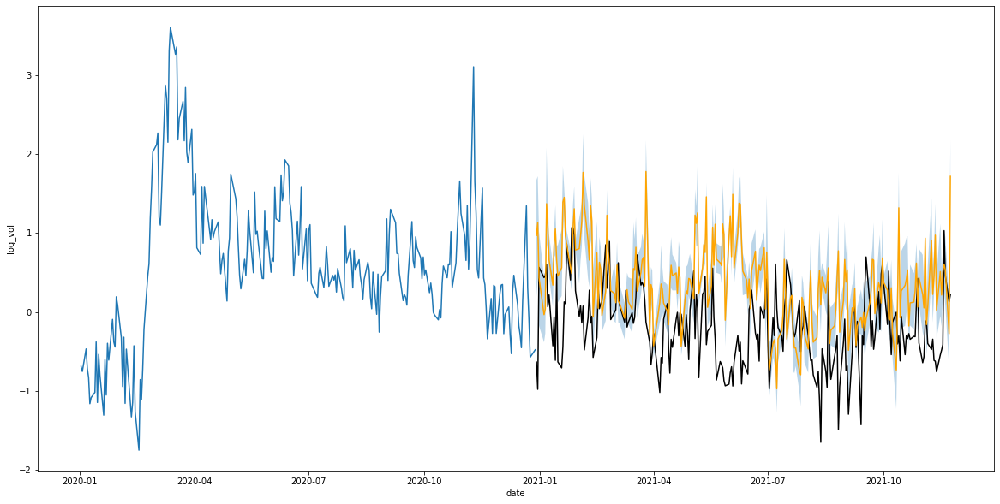

['.SPX']
MAE :  1.0529672
MSE :  1.727936
SMAPE :  0.64373654


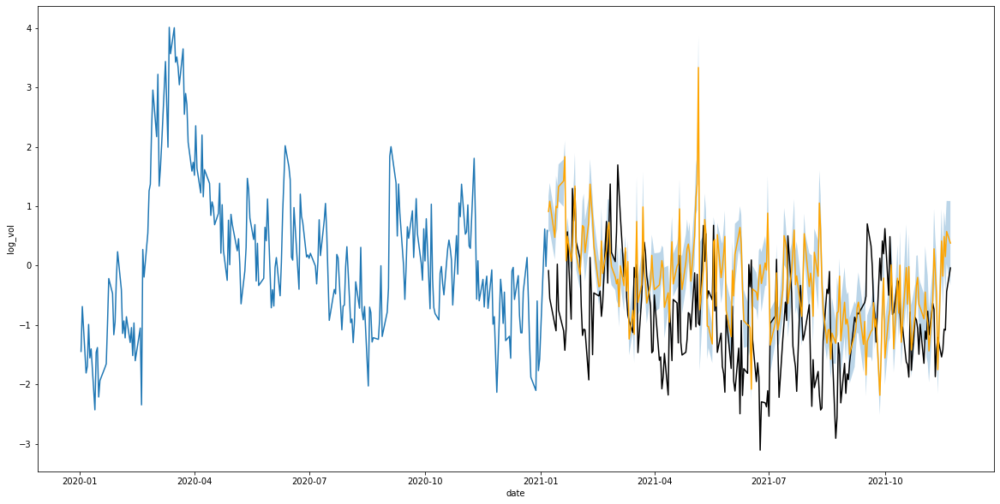

['.SSEC']
MAE :  0.74609005
MSE :  0.8458661
SMAPE :  0.80253154


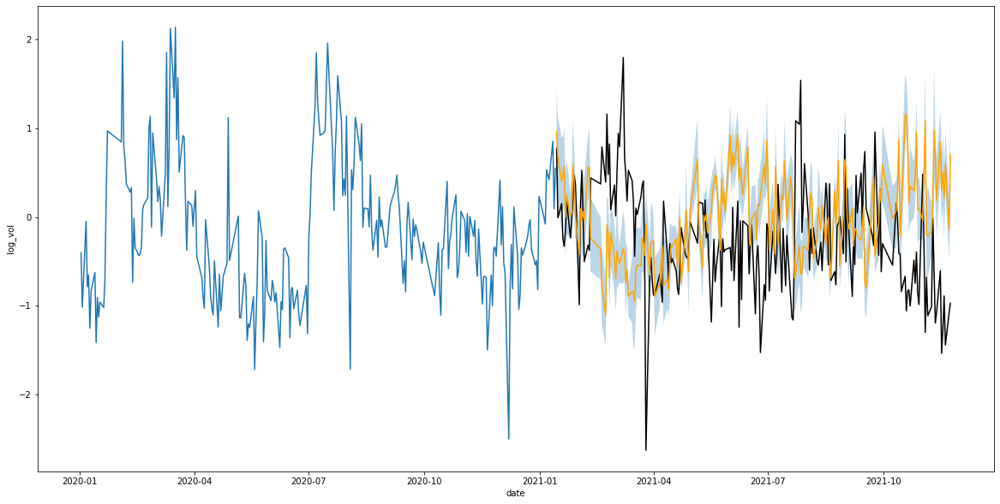

['.SSMI']
MAE :  0.65612876
MSE :  0.6906484
SMAPE :  0.46116966


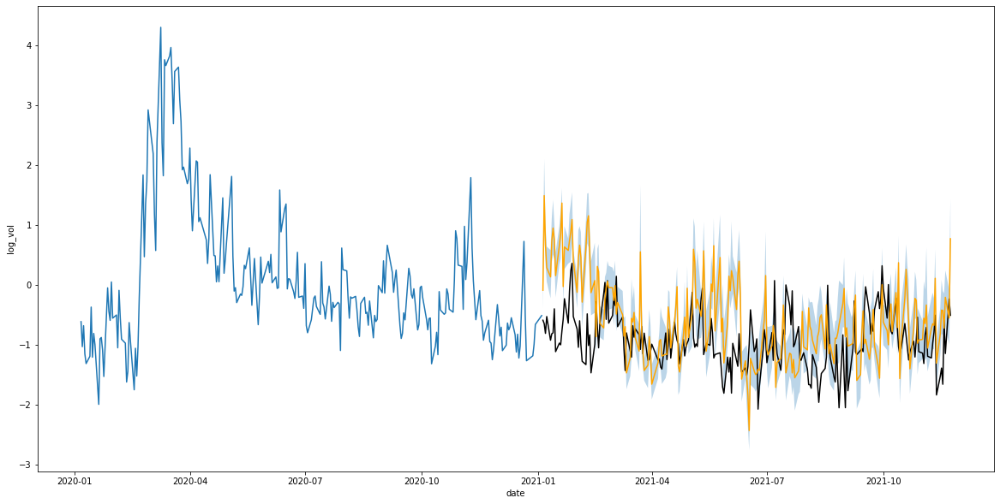

['.STI']
MAE :  0.6843975
MSE :  0.7704113
SMAPE :  0.44264352


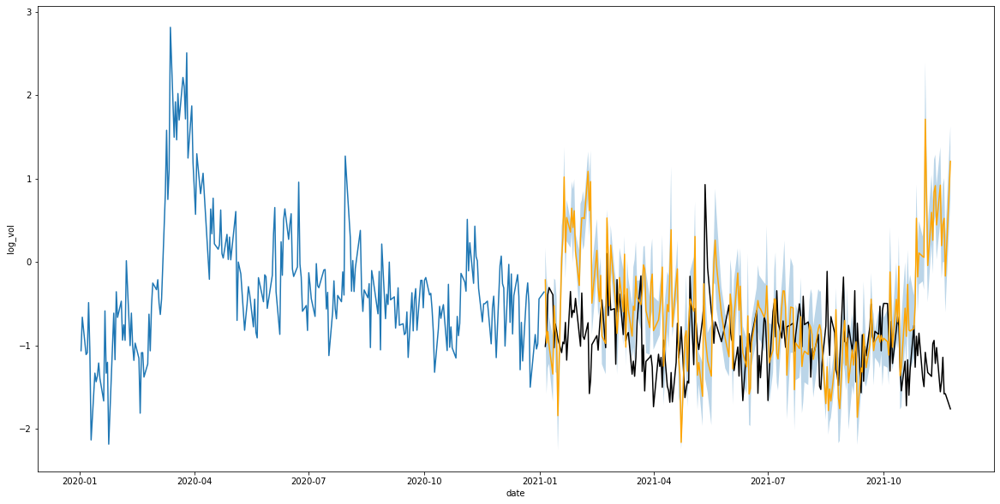

['.STOXX50E']
MAE :  0.884632
MSE :  1.1626965
SMAPE :  0.7377636


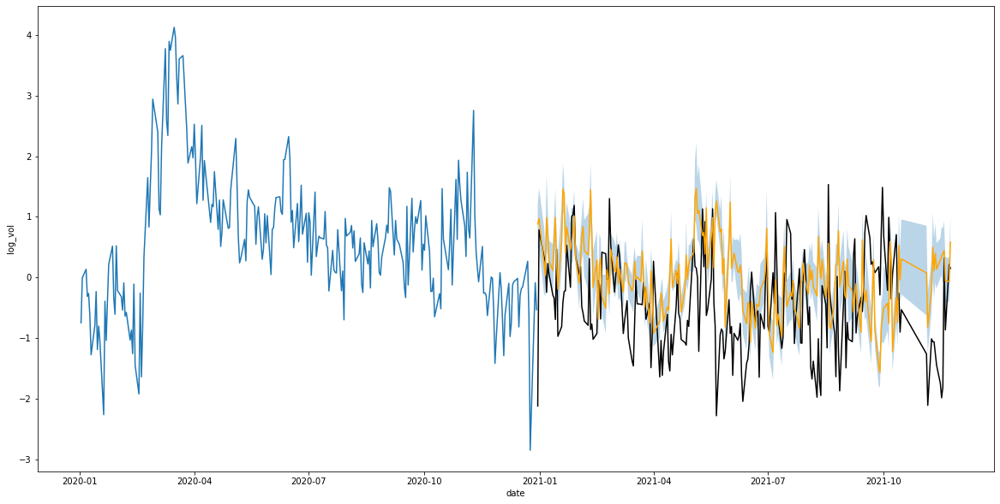

In [58]:
for i in test.Symbol.unique():
    print(test[test["Symbol"]==i].categorical_id.unique())
    print("MAE : ", mean_absolute_error(out_df[out_df["identifier"]==i].labels, out_df[out_df["identifier"]==i].p50))
    print("MSE : ", mean_squared_error(out_df[out_df["identifier"]==i].labels, out_df[out_df["identifier"]==i].p50))
    
    plt.figure(figsize=(20,10))
    sns.lineplot(x=test[test["Symbol"]==i].iloc[:ENCODER_STEPS-1]["date"], y=test[test["Symbol"]==i].iloc[:ENCODER_STEPS-1]["log_vol"])
    sns.lineplot(x=out_df[out_df["identifier"]==i].index, y=out_df[out_df["identifier"]==i].labels, color="black")
    #sns.lineplot(x=out_df[out_df["identifier"]==i].index, y=out_df[out_df["identifier"]==i].p10, color="red")
    sns.lineplot(x=out_df[out_df["identifier"]==i].index, y=out_df[out_df["identifier"]==i].p50, color="orange")
    #sns.lineplot(x=out_df[out_df["identifier"]==i].index, y=out_df[out_df["identifier"]==i].p90, color="green")

    plt.fill_between(out_df[out_df["identifier"]==i].index, out_df[out_df["identifier"]==i].p10, out_df[out_df["identifier"]==i].p90, alpha=0.3)

    plt.show()

# Scores

In [61]:
result = pd.DataFrame(columns=['Symbol', 'MAE', 'MSE'])
for i in test.Symbol.unique():
    result.loc[i,'Symbol'] = test[test["Symbol"]==i].categorical_id.unique()
    result.loc[i,'MAE'] = mean_absolute_error(out_df[out_df["identifier"]==i].labels, out_df[out_df["identifier"]==i].p50)
    result.loc[i, 'MSE'] = mean_squared_error(out_df[out_df["identifier"]==i].labels, out_df[out_df["identifier"]==i].p50)
    
result

['.AEX']
MAE :  0.82728726
MSE :  1.0433145
SMAPE :  0.6754477
['.AORD']
MAE :  0.84351647
MSE :  1.10455
SMAPE :  0.58469576
['.BFX']
MAE :  0.78587466
MSE :  0.9458063
SMAPE :  0.6572944
['.BSESN']
MAE :  0.852511
MSE :  1.0749549
SMAPE :  0.72439134
['.BVLG']
MAE :  0.53701174
MSE :  0.4791918
SMAPE :  0.6542834
['.BVSP']
MAE :  0.8516044
MSE :  1.0879347
SMAPE :  0.6960473
['.DJI']
MAE :  0.9593358
MSE :  1.4053339
SMAPE :  0.70771426
['.FCHI']
MAE :  0.9126035
MSE :  1.2258452
SMAPE :  0.72808796
['.FTMIB']
MAE :  0.8199361
MSE :  1.0286572
SMAPE :  0.63957417
['.FTSE']
MAE :  1.0437058
MSE :  1.5698054
SMAPE :  0.7908645
['.GDAXI']
MAE :  0.8224072
MSE :  0.9918994
SMAPE :  0.65677243
['.GSPTSE']
MAE :  0.86853844
MSE :  1.2042392
SMAPE :  0.4703868
['.HSI']
MAE :  0.8853462
MSE :  1.146868
SMAPE :  0.7495623
['.IBEX']
MAE :  0.8845449
MSE :  1.1112224
SMAPE :  0.7624522
['.IXIC']
MAE :  0.9905132
MSE :  1.4324582
SMAPE :  0.76553357
['.KS11']
MAE :  1.0006224
MSE :  1.5687369
SM

,Symbol,MAE,MSE,SMAPE
0,[.AEX],0.827287,1.043314,0.675448
1,[.AORD],0.843516,1.10455,0.584696
2,[.BFX],0.785875,0.945806,0.657294
3,[.BSESN],0.852511,1.074955,0.724391
4,[.BVLG],0.537012,0.479192,0.654283
5,[.BVSP],0.851604,1.087935,0.696047
6,[.DJI],0.959336,1.405334,0.707714
7,[.FCHI],0.912603,1.225845,0.728088
8,[.FTMIB],0.819936,1.028657,0.639574
9,[.FTSE],1.043706,1.569805,0.790865
